In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def coth(a):
    if a>0: return (1+tf.math.exp(-2*a))/(1-tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)+1)/(tf.math.exp(2*a)-1)
    if a==0: return 0

def tanh(a):
    if a>0: return (1-tf.math.exp(-2*a))/(1+tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)-1)/(tf.math.exp(2*a)+1)
    if a==0: return 0

In [4]:
data=1000
batch=100
set=10
layer=10
n_ini=1.0
n_fin=0.1
dn=-0.1
m2=-1
lam=1
c_reg1=0.1
c_reg2=0

<tf.Variable 'Variable:0' shape=(10,) dtype=float64, numpy=
array([ 1.09988131,  0.77439845,  1.51869381,  2.30839327,  3.42554722,
        1.91276863,  1.20897948,  3.1391084 ,  2.35817479, 10.48450915])>
tf.Tensor(
[ 3.01490951  3.02722263  3.04978824  3.09134316  3.16854751  3.31437385
  3.59861219  4.18820179  5.58607614 10.29821491], shape=(10,), dtype=float64)


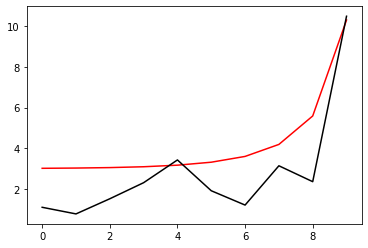

In [5]:
h=tf.zeros(layer)
h_in=[]
#h_in=[3.0205426, 3.022307 , 3.0291433, 3.04402  , 3.0732646, 3.131582 ,
# 3.2585216, 3.5762587, 4.59116  , 9.752249]
for i in range (layer):
#   midd=np.float64(10.0)
#    h_in.append(midd)
#    midd=3*coth(3*((i-layer)*dn)).numpy()
#    h_in.append(midd)
    mu=1/(1-i/10)
    h_inn=np.float64(np.random.normal(mu, 1))
    h_in.append(h_inn)
h=tf.Variable(h_in)
print(h)

h_real=tf.zeros(layer)
middd=[]
for i in range (layer):
    midd=3*coth(3*((i-layer)*dn)).numpy()
    middd.append(midd)
h_real=tf.constant(middd)
print(h_real)
plt.plot(h_real, 'r-')
plt.plot(h.numpy(), 'k-')
plt.show()

In [6]:
def F_func(a,b):
    return 2*b/n_fin-m2*a-lam*(a**3)

def t_func(a):
    return 0.5*(tf.math.tanh(100*(a-0.1))-tf.math.tanh(100*(a+0.1))+2)

In [7]:
def LP2(hh, phi, pi):
    for j in range (layer-1):
        phi1=phi+dn*pi
        pi1 =phi*m2*dn+(1-dn*hh[j])*pi+dn*lam*(phi1**3)
        phi=phi1
        pi=pi1
    return phi, pi
def NN_func_p(hh):
    Positive=[]
    while len(Positive)<batch:
        phi1=np.random.uniform(0.0, 1.5, 10000)
        pi1=np.random.uniform(-0.2, 0.2, 10000)
        phi_1, pi_1=LP2(hh, phi1, pi1)
        F=np.array(tf.math.abs(F_func(phi_1, pi_1)))
        for i in range (len(phi1[F<0.1])):
            Positive.append([phi1[F<0.1][i], pi1[F<0.1][i]])
            if len(Positive)>=batch: break
    return Positive
def NN_func_n(hh):
    Negative=[]
    while len(Negative)<batch:
        phi1=np.random.uniform(0.0, 1.5, 10000)
        pi1=np.random.uniform(-0.2, 0.2, 10000)
        phi_1, pi_1=LP2(hh, phi1, pi1)
        F=np.array(tf.math.abs(F_func(phi_1, pi_1)))
        for i in range (len(phi1[F>=0.1])):
            Negative.append([phi1[F>=0.1][i], pi1[F>=0.1][i]])
            if len(Negative)>=batch: break
    return Negative
def NN_func_01(hh, list1):
    PP=[]
    NN=[]
    phi=np.array(list1)[:, 0]
    pi=np.array(list1)[:, 1]
    F=np.array(tf.math.abs(LP2(hh, phi, pi)[1]))
    for i in range (len(phi[F<0.1])):
        PP.append([phi[F<0.1][i], pi[F<0.1][i]])
    for i in range (len(phi[F>=0.1])):
        NN.append([phi[F>=0.1][i], pi[F>=0.1][i]])
    return PP, NN

In [9]:
Positive=[]
Negative=[]
for i in range (set):
    Positive.insert(i, NN_func_p(h_real))
    Negative.insert(i, NN_func_n(h_real))

In [10]:
Positive0=[]
Positive1=[]
Negative0=[]
Negative1=[]
for i in range (set):
    Positive0.insert(i, NN_func_01(h, Positive[i])[0])
    Positive1.insert(i, NN_func_01(h, Positive[i])[1])
    Negative0.insert(i, NN_func_01(h, Negative[i])[0])
    Negative1.insert(i, NN_func_01(h, Negative[i])[1])

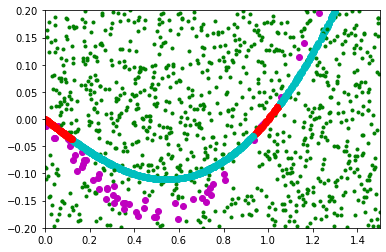

In [11]:
x_data1=[]
y_data1=[]
x_data2=[]
y_data2=[]
x_data3=[]
y_data3=[]
x_data4=[]
y_data4=[]
for i in range (set):
    x_data1.insert(i, [v[0] for v in Positive0[i]])
    y_data1.insert(i, [v[1] for v in Positive0[i]])
    x_data2.insert(i, [v[0] for v in Positive1[i]])
    y_data2.insert(i, [v[1] for v in Positive1[i]])
    x_data3.insert(i, [v[0] for v in Negative0[i]])
    y_data3.insert(i, [v[1] for v in Negative0[i]])
    x_data4.insert(i, [v[0] for v in Negative1[i]])
    y_data4.insert(i, [v[1] for v in Negative1[i]])
    plt.plot(x_data4[i], y_data4[i], 'g.')
    plt.plot(x_data2[i], y_data2[i], 'co')
    plt.plot(x_data1[i], y_data1[i], 'ro')
    plt.plot(x_data3[i], y_data3[i], 'mo')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.show()

# Error function

$E=\sum_{data} \left\vert y(\bar{x}^{(1)}) - \bar{y} \right\vert+E_{reg}(W)$
, $E_{reg}=c_{reg}^{(1)}\sum_{n=1}^{N-1}(\eta^{(n)})^{4}(h(\eta^{(n+1)})-h(\eta^{(n)}))^{2}+c_{reg}^{(2)}(h(\eta^{(N)})-1/\eta^{(N)})^{2}$

In [12]:
def Error_func(hh, list1, list2):
    phi0=np.array([v[0] for v in list1])
    pi0=np.array([v[1] for v in list1])
    phi1=np.array([v[0] for v in list2])
    pi1=np.array([v[1] for v in list2])
    phi_0, pi_0=LP2(hh, phi0, pi0)
    phi_1, pi_1=LP2(hh, phi1, pi1)
    PPlist=t_func(pi_0)
    NNlist=t_func(pi_1)
    sum_p=sum(PPlist)/batch
    sum_n=(batch-sum(NNlist))/batch

    inside=0
    for k in range (layer-1):
        second=((n_ini+k*dn)**4)*((hh[k+1]-hh[k])**2)
        inside=inside+second
    E_reg1=c_reg1*inside
    E_reg2=c_reg2*((hh[layer-1]-1/n_fin)**2)
    return E_reg1+E_reg2+sum_p+sum_n

In [13]:
for i in range (set):
    print(Error_func(h_real, Positive[i], Negative[i]))
for i in range (set):
    print(Error_func(h, Positive[i], Negative[i]))

tf.Tensor(0.028483061997397523, shape=(), dtype=float64)
tf.Tensor(0.038052583552352894, shape=(), dtype=float64)
tf.Tensor(0.026903791293536154, shape=(), dtype=float64)
tf.Tensor(0.02704860992319877, shape=(), dtype=float64)
tf.Tensor(0.03669351076316249, shape=(), dtype=float64)
tf.Tensor(0.052765566920534274, shape=(), dtype=float64)
tf.Tensor(0.01707386456899581, shape=(), dtype=float64)
tf.Tensor(0.027031367302070862, shape=(), dtype=float64)
tf.Tensor(0.017068864458133038, shape=(), dtype=float64)
tf.Tensor(0.04707565996238283, shape=(), dtype=float64)
tf.Tensor(1.0327741784888167, shape=(), dtype=float64)
tf.Tensor(1.0883664355541953, shape=(), dtype=float64)
tf.Tensor(0.991306951740575, shape=(), dtype=float64)
tf.Tensor(1.0248251598952252, shape=(), dtype=float64)
tf.Tensor(1.0388374257459776, shape=(), dtype=float64)
tf.Tensor(1.0424929561592244, shape=(), dtype=float64)
tf.Tensor(1.0312963058293587, shape=(), dtype=float64)
tf.Tensor(0.9809098258417204, shape=(), dtype=floa

0 1.002702230004258
[ 1.19987736  0.87439819  1.61868775  2.40838978  3.325548    2.01276725
  1.30897721  3.0391148   2.45814913 10.38453194]


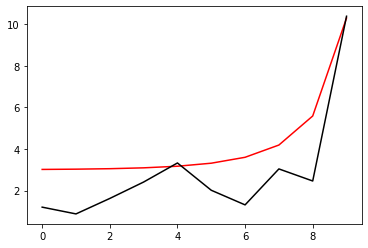

1100 0.8717137009273032
[1.74424451 1.63315858 1.91948733 2.19286458 2.4955981  2.27826414
 1.76437756 1.90593832 1.13769461 9.27917491]


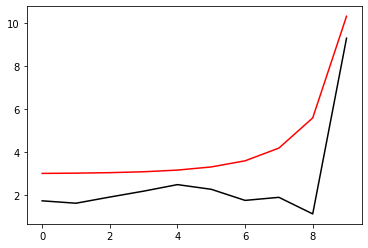

2200 0.05117371020376446
[2.98975061 2.88698664 3.03784453 3.15731367 3.09593238 2.94775377
 2.51374623 1.54526649 0.34611054 8.16865074]


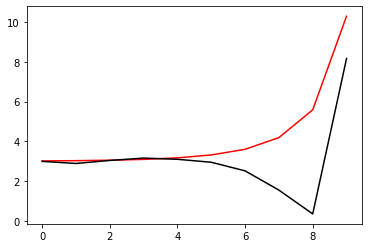

3300 0.03072147142186499
[3.06124112 3.03146059 3.12537095 3.18634007 3.16908428 3.21745275
 3.03258673 2.25346712 1.0685857  7.17632754]


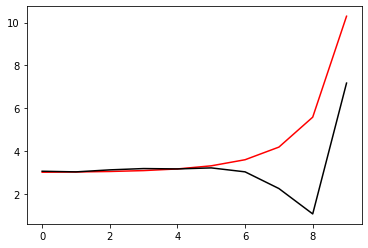

4400 0.05706377583192386
[3.14426086 3.13868755 3.19182863 3.24242531 3.27338762 3.32694806
 3.25956285 2.83146735 1.78713824 6.29619356]


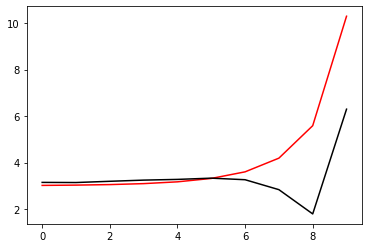

5500 0.06243291670972763
[3.06279909 3.0783813  3.11283558 3.16809314 3.24555577 3.33571306
 3.39641146 3.25041406 2.5072911  5.50843695]


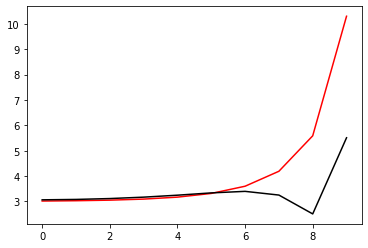

6600 0.03317550432217819
[2.90680632 2.92516869 2.96477596 3.02804925 3.11632929 3.22767533
 3.34165958 3.3614764  2.97182274 4.81087752]


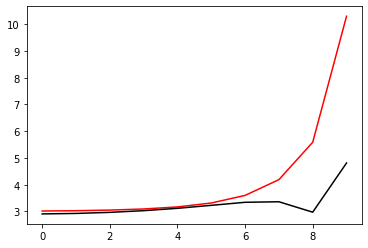

7700 0.015582331625700628
[2.91408441 2.92137895 2.94279761 2.98194976 3.04168881 3.12302375
 3.22056493 3.3028635  3.2309829  4.21693946]


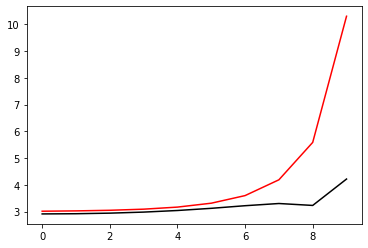

8800 0.010858973968462946
[3.0592934  3.07284908 3.10311772 3.15447123 3.23426258 3.35287701
 3.52067718 3.72782779 3.83864366 3.91410677]


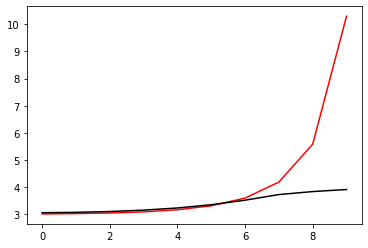

9900 0.04136153995879512
[3.0348904  3.04772498 3.07723588 3.12957899 3.21456879 3.34828781
 3.55710381 3.87201993 4.22653659 4.06026601]


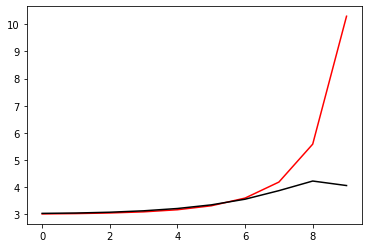

11000 0.02655581560926391
[3.0315105  3.01992267 3.0140077  3.02984068 3.08045893 3.18313733
 3.35994869 3.65442787 4.15967622 4.31812349]


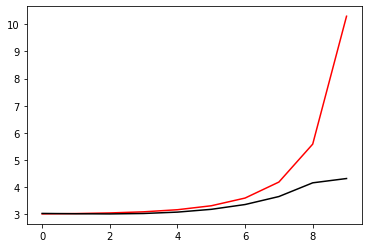

12100 0.030568434626961842
[2.91097101 2.91950814 2.93484901 2.96295645 3.01482652 3.10910251
 3.27801062 3.57770534 4.07429299 4.2808212 ]


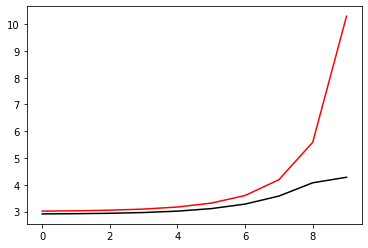

13200 0.018663221894741427
[2.92320387 2.93410305 2.95977864 3.00479411 3.07955344 3.20389792
 3.41386797 3.77203389 4.33804778 4.32207417]


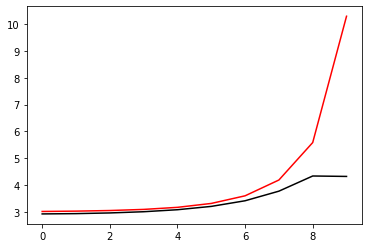

14300 0.021600382976730406
[2.94616333 2.95514966 2.97804154 3.02343066 3.10461803 3.24301687
 3.47693861 3.87467602 4.50267048 4.5422987 ]


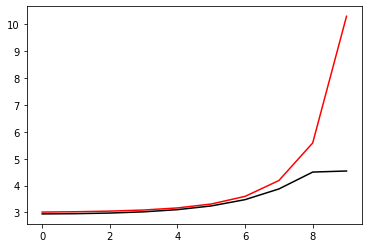

15400 0.037688446167860885
[2.99060631 3.0018528  3.02212861 3.06306534 3.1365923  3.26541464
 3.49120836 3.8899818  4.55374841 4.54257808]


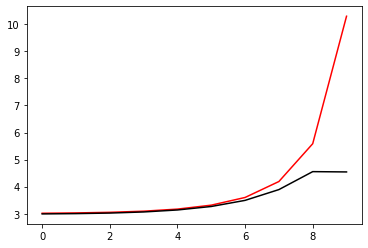

16500 0.05121330900722565
[2.94038219 2.94540871 2.95846683 2.98647684 3.04177633 3.14469686
 3.32849544 3.65019006 4.21290563 4.18396595]


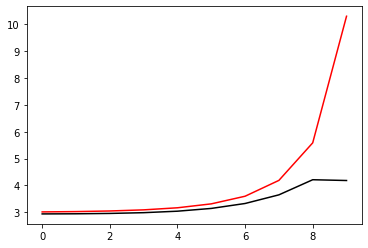

17600 0.011751878470854769
[3.01223854 3.02825749 3.06137658 3.11602149 3.20425376 3.34760957
 3.58379013 3.97615312 4.58191781 4.60246198]


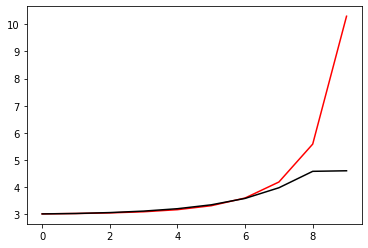

18700 0.021825403633519043
[3.04878303 3.06054201 3.0887392  3.14090759 3.2294253  3.37680662
 3.62364481 4.04070696 4.69625407 4.74056094]


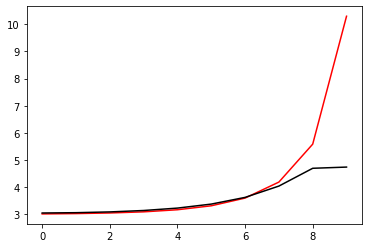

19800 0.010927260758971564
[3.05119244 3.06801025 3.10222839 3.15566212 3.23521077 3.35131115
 3.50962959 3.70997806 4.04563086 4.05695051]


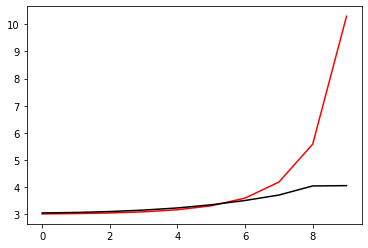

20900 0.041151431770278024
[3.05767866 3.06563437 3.08667423 3.12812211 3.19950798 3.31739651
 3.51289278 3.82039887 4.25895349 4.26110991]


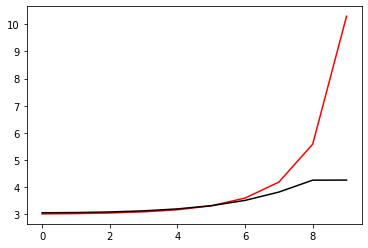

22000 0.023678786639363045
[2.97972736 2.98730991 3.01004652 3.05537553 3.13754395 3.28206148
 3.53387069 3.96887283 4.60754989 4.54880284]


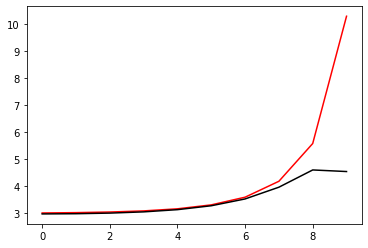

23100 0.03167412898916165
[2.99408889 2.99755032 3.01329124 3.04792408 3.11197461 3.22333917
 3.41647749 3.76624532 4.39632028 4.43916234]


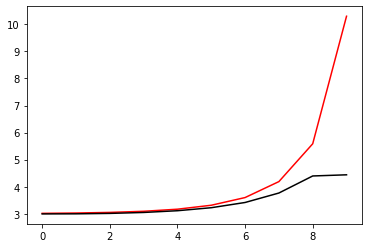

24200 0.024524997246567266
[2.88061541 2.88547471 2.90179978 2.93643385 3.00140714 3.11854038
 3.32890322 3.70916749 4.35778381 4.30436549]


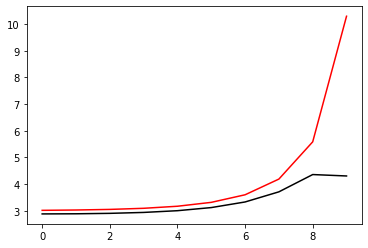

25300 0.021057792510626006
[2.97148356 2.97192644 2.97796849 2.99908868 3.0480668  3.14629788
 3.3343314  3.68971793 4.30743534 4.34973873]


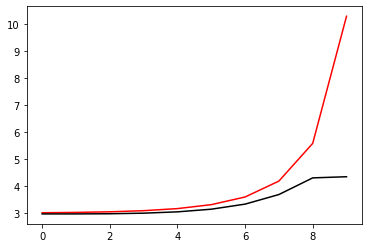

26400 0.03995342140394747
[2.9404415  2.94960367 2.9700943  3.00906518 3.07805698 3.1974332
 3.40436785 3.76582352 4.36163154 4.24138359]


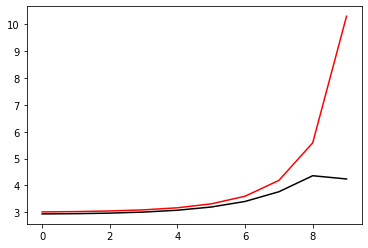

27500 0.04593159955551512
[2.98397814 2.9954716  3.02113378 3.06979794 3.15685526 3.30751899
 3.56442321 3.9968103  4.66731859 4.5769629 ]


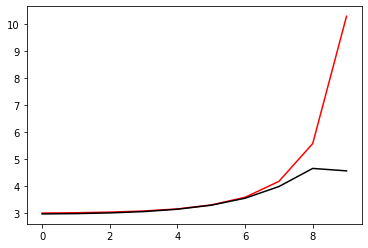

28600 0.011338088366268808
[3.04203987 3.0478576  3.06383651 3.09838334 3.16395815 3.28192207
 3.49169716 3.86150104 4.46298583 4.34778774]


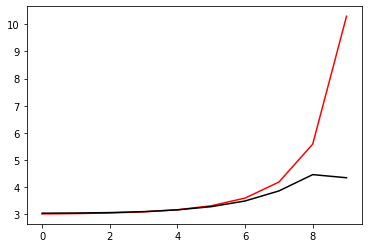

29700 0.021814801558251266
[3.01927593 3.02972837 3.05369789 3.09973413 3.18271708 3.32842635
 3.58136173 4.01604185 4.69444375 4.77815772]


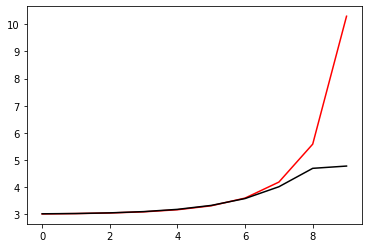

30800 0.06791545388837443
[2.75276716 2.75965455 2.78421399 2.835131   2.92723986 3.08546663
 3.34961186 3.78360558 4.46064928 4.66074641]


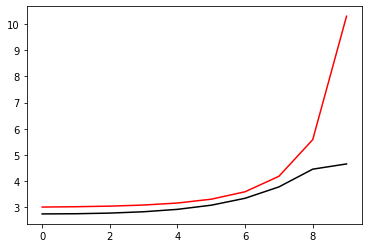

31900 0.04243610057048342
[3.02311675 3.02093341 3.02654888 3.05391068 3.11819094 3.24126634
 3.45925882 3.83220054 4.42724966 4.41296225]


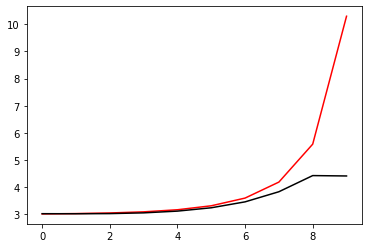

33000 0.025078469068399965
[3.0292767  3.03036058 3.03934681 3.06740626 3.13085866 3.25455913
 3.47886109 3.87009397 4.49649467 4.47800304]


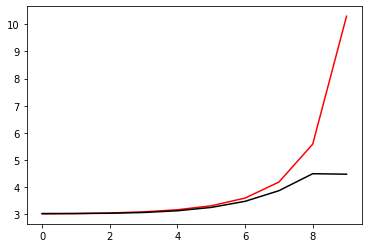

34100 0.031767735391005164
[2.98679295 2.99012497 3.00306579 3.03543932 3.10327802 3.23325689
 3.47128166 3.89417634 4.57778116 4.61544707]


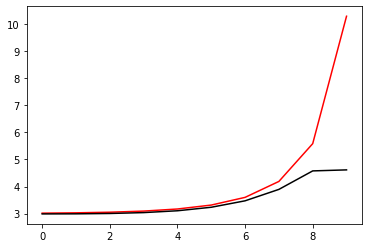

35200 0.02092142562199324
[3.09187046 3.10351289 3.12607379 3.16324088 3.22408642 3.32460843
 3.49195033 3.77377915 4.24594847 4.25082807]


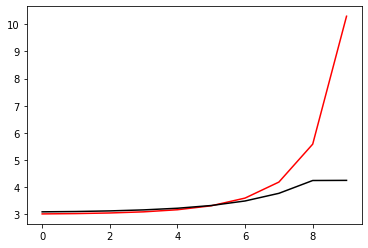

36300 0.02110323375102078
[2.9228426  2.93467083 2.96096503 3.00531516 3.0754808  3.18696209
 3.36963135 3.67960827 4.18798069 4.20238024]


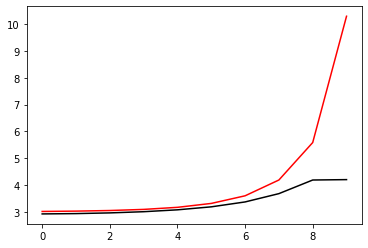

37400 0.037437284661078936
[2.96518574 2.97496282 2.99961497 3.04739415 3.13063674 3.27006367
 3.50289863 3.89201983 4.49220085 4.38931426]


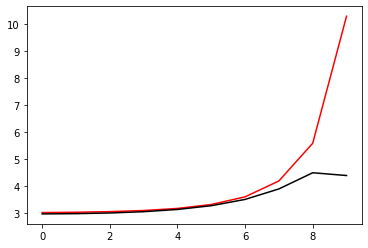

38500 0.044392454246281
[2.9515062  2.96557872 2.99900494 3.05835107 3.15538417 3.31173628
 3.56561171 3.9784636  4.59752879 4.53786952]


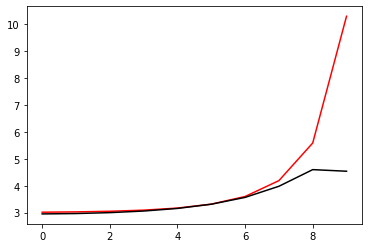

39600 0.012229599595085135
[3.00409975 3.01902552 3.05186549 3.10965329 3.20791816 3.37243563
 3.64669262 4.10224359 4.79890794 4.85891112]


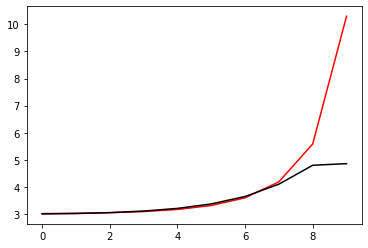

40700 0.0220721122108747
[3.02954172 3.04253035 3.07323772 3.12939701 3.22330463 3.37805333
 3.63756048 4.08279771 4.80049626 4.84692789]


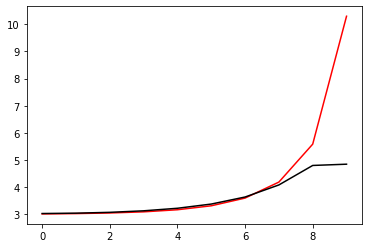

41800 0.02034467492718911
[2.95181353 2.93667552 2.92884415 2.94086773 2.98727999 3.08759238
 3.26100772 3.50800775 4.03269728 4.03204708]


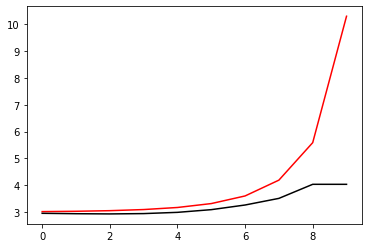

42900 0.052564773714066454
[2.95322914 2.95152798 2.95362232 2.97032168 3.0170736  3.11428594
 3.28718868 3.56565456 4.08930712 4.07376292]


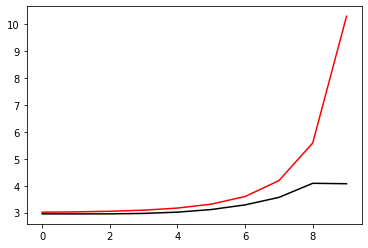

44000 0.030978997815476368
[2.95074738 2.95527208 2.96738213 2.99393751 3.04705568 3.14694236
 3.32623417 3.63782227 4.17542623 4.18997301]


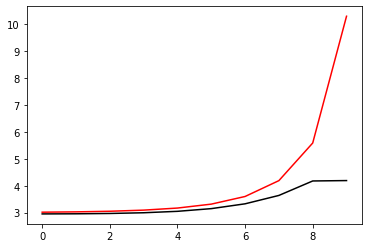

45100 0.031189446315887798
[2.96913608 2.97407741 2.98956763 3.02303576 3.08654973 3.20087908
 3.40278251 3.75706765 4.34137291 4.35329632]


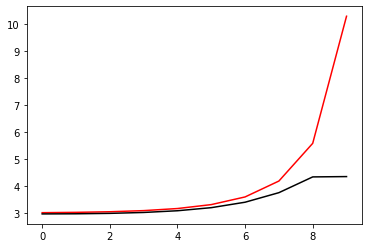

46200 0.02057507157997653
[2.9443797  2.95821883 2.99071834 3.04656557 3.13509788 3.27657954
 3.5088865  3.89988525 4.52496079 4.5345144 ]


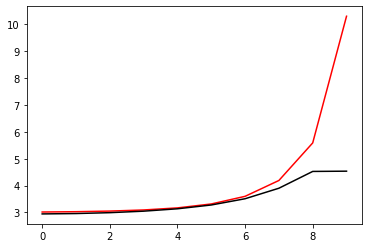

47300 0.02175466465378999
[2.92040138 2.92946039 2.95189935 2.9971831  3.07881292 3.22113692
 3.46533131 3.88444504 4.55432361 4.59187056]


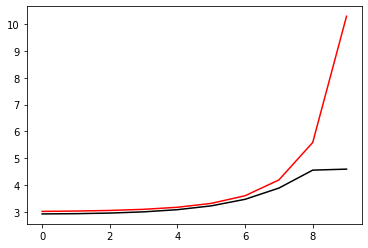

48400 0.03681386075746054
[2.95704745 2.96710537 2.9923977  3.04145444 3.12796451 3.27494553
 3.52340698 3.9439034  4.6110349  4.50890316]


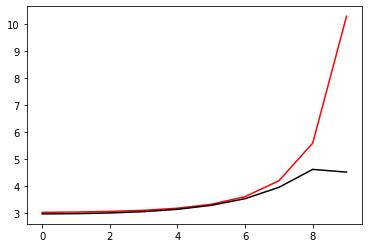

49500 0.044573791286137296
[2.96121598 2.97509275 3.00746791 3.0659657  3.16752585 3.34054973
 3.63185672 4.11592752 4.86266162 4.83558835]


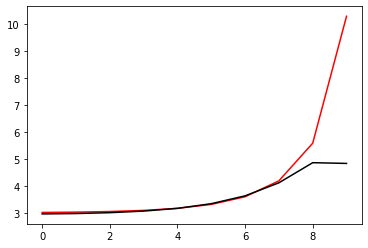

50600 0.02930550592463185
[2.95185049 2.95180357 2.96185664 2.99466834 3.06505217 3.19556244
 3.42508139 3.82055642 4.45368438 4.45024473]


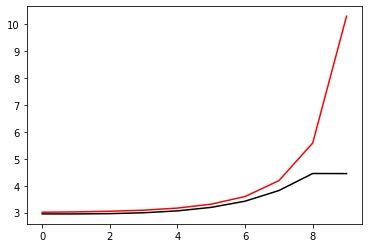

51700 0.02169468642789576
[3.0805027  3.0831184  3.09917523 3.13799731 3.21343396 3.34978407
 3.58893236 4.00182261 4.66114159 4.68304016]


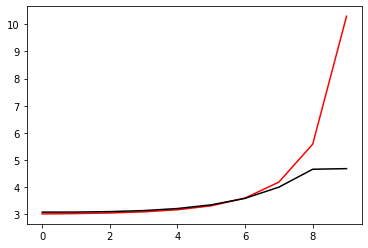

52800 0.011618325240145864
[3.0106511  3.02131524 3.04624823 3.09205302 3.17135332 3.30677046
 3.53896297 3.93965983 4.58626349 4.59994379]


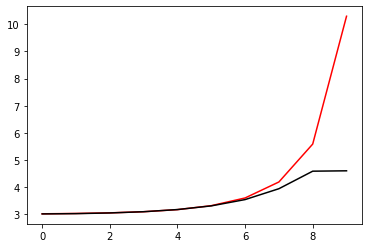

53900 0.03859882666661084
[3.07672589 3.08503772 3.10637695 3.14843207 3.22451873 3.35766838
 3.58952146 3.99512964 4.65917738 4.67577161]


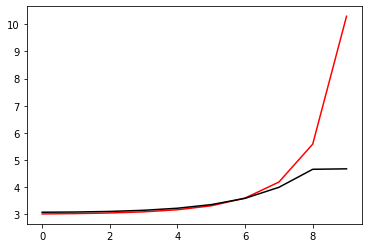

55000 0.02344113542636014
[2.97749365 2.98279241 3.00556772 3.0539731  3.1423445  3.29647883
 3.5642823  4.03089413 4.78840824 4.71678605]


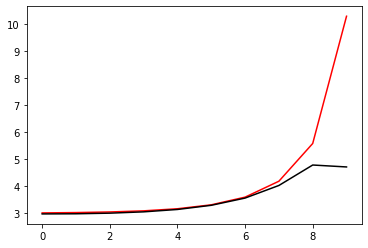

56100 0.03144432989860619
[2.92712527 2.93645343 2.95531734 3.00061106 3.08606195 3.23802237
 3.50479788 3.97460647 4.74211807 4.80865285]


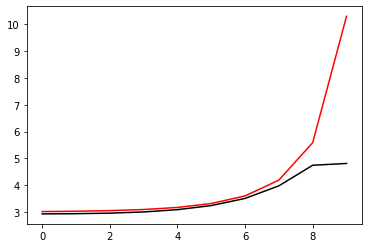

57200 0.01998595665603065
[2.96183949 2.96427505 2.97446001 3.00172425 3.05976029 3.1721333
 3.38456956 3.78726654 4.49634288 4.53027717]


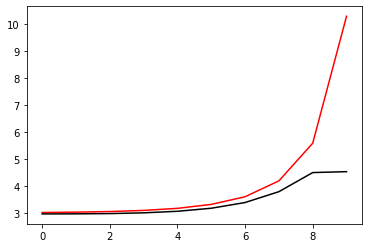

58300 0.020868385043594
[3.054811   3.07926727 3.11382605 3.16354469 3.23838458 3.3527827
 3.49990595 3.44725116 3.93961972 4.05708796]


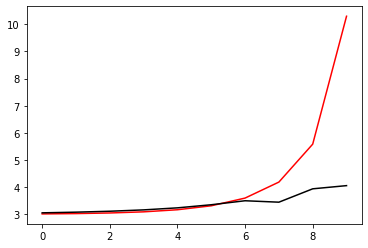

59400 0.039904189876781605
[3.02716582 3.0409926  3.07108823 3.11981156 3.19202085 3.29391215
 3.43284425 3.66787848 4.00364027 3.97428063]


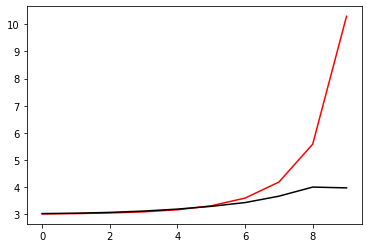

60500 0.046867099040577447
[2.97790553 2.98534267 3.00576429 3.04531253 3.11313388 3.22541667
 3.4189415  3.7905281  4.24465325 4.20678136]


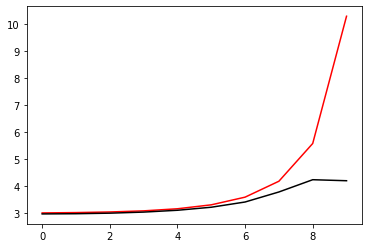

61600 0.013180637323472931
[3.09296268 3.0938983  3.11106349 3.15326815 3.23752348 3.397511
 3.69516317 4.17449332 4.67534415 4.60879265]


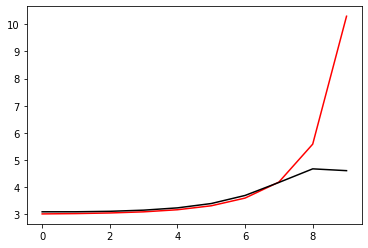

62700 0.11379583328273482
[2.71612877 2.7296321  2.75931126 2.81358972 2.90761052 3.06781901
 3.339951   3.79075315 4.44410084 4.82285783]


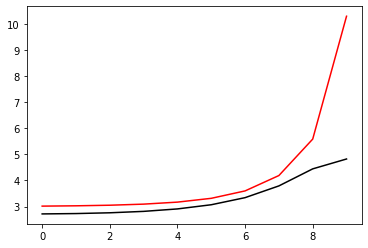

63800 0.011553379024339124
[2.98584196 3.00424095 3.04449034 3.10959893 3.20769432 3.35544803
 3.5785603  3.90599442 4.31128847 4.32423382]


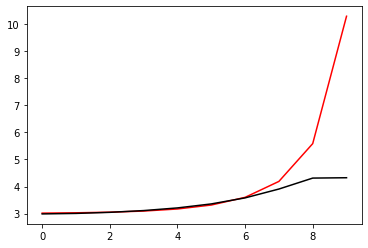

64900 0.04167863965269092
[3.01638455 3.02798562 3.05668417 3.11070349 3.20172695 3.34841256
 3.58106223 3.94507921 4.4553323  4.46242058]


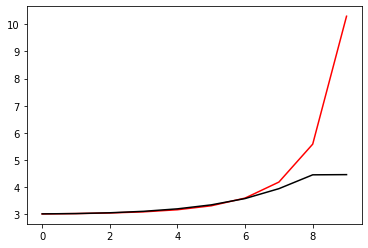

66000 0.030685171165454862
[2.92188494 2.93314663 2.95843817 3.00562742 3.08764187 3.22562009
 3.45589435 3.84721758 4.46429007 4.7113359 ]


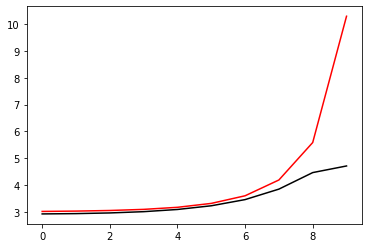

67100 0.030827350166236073
[2.92093764 2.93725934 2.96862541 3.01807339 3.09410613 3.21172794
 3.39695982 3.69452826 4.16006865 4.16276311]


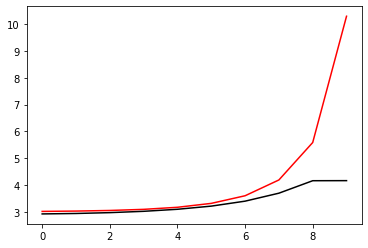

68200 0.020921198110317608
[2.9652226  2.97638227 3.00469546 3.05636571 3.1411092  3.27652079
 3.49402238 3.84591583 4.37637266 4.39045467]


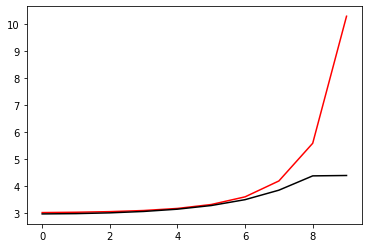

69300 0.021252095638416246
[2.94347261 2.95020085 2.96910087 3.00842863 3.07973008 3.20203256
 3.40955867 3.76267134 4.32300027 4.3428672 ]


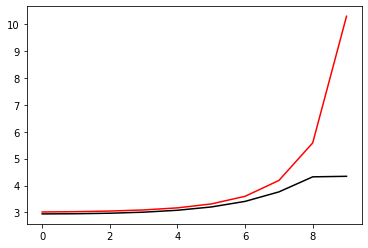

70400 0.036734637455072876
[2.95320073 2.96418742 2.9899995  3.0396205  3.12785186 3.27864755
 3.5321752  3.95475292 4.60717496 4.47767277]


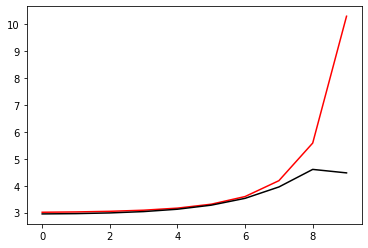

71500 0.049749394970305644
[2.90743053 2.91524279 2.94613751 3.00600239 3.11123675 3.29026848
 3.58824877 4.07373075 4.80940781 4.80156513]


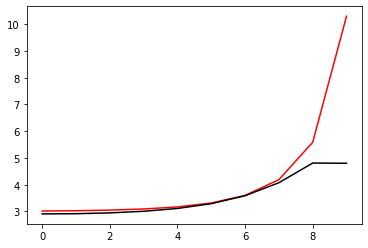

72600 0.011510161926091785
[3.06488218 3.04199272 3.03026334 3.03939718 3.08056916 3.17303368
 3.35344681 3.69382281 4.28496945 4.28715694]


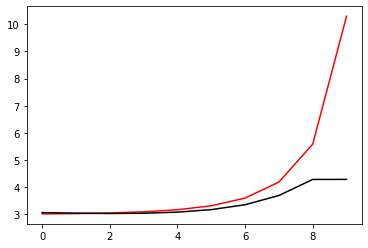

73700 0.020993694226955472
[3.07439788 3.0648422  3.05746108 3.0663513  3.10725893 3.20204379
 3.38904059 3.74026507 4.3458287  4.35438884]


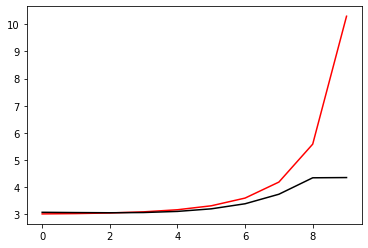

74800 0.011082510212289341
[3.08215628 3.07829026 3.07738994 3.09020253 3.13247352 3.22923996
 3.42280468 3.78777347 4.4140105  4.40207438]


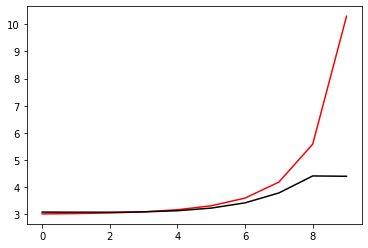

75900 0.04134496323952672
[3.06725577 3.0687523  3.07564081 3.09672261 3.14653605 3.25003202
 3.45231745 3.83386184 4.48839601 4.53273651]


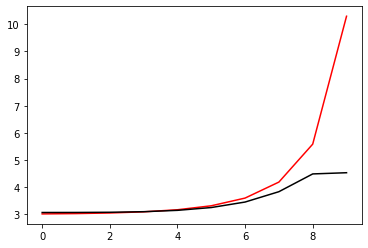

77000 0.02422059480809637
[3.0121731  3.01625665 3.03202078 3.06752492 3.13666555 3.26463219
 3.49816503 3.92206631 4.63444452 4.58645302]


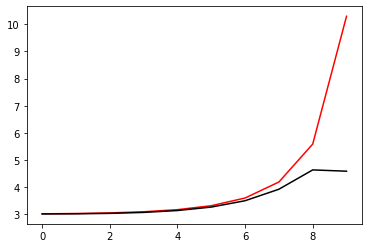

78100 0.03219683404135922
[2.941977   2.9564913  2.99164227 3.05663559 3.16032966 3.32601692
 3.59809427 4.05756403 4.79832257 4.84109807]


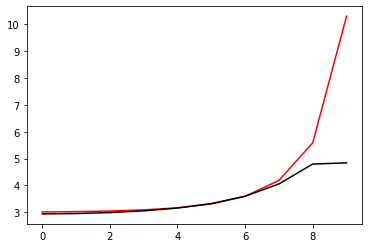

79200 0.021087475637290316
[3.01960756 3.04555601 3.08481041 3.14483504 3.23410543 3.36595239
 3.52706493 3.47990942 3.97267086 4.16978047]


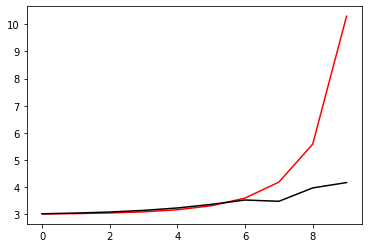

80300 0.02089337910687362
[2.99417824 3.01041875 3.04536287 3.10170702 3.18484698 3.29827782
 3.43301203 3.62148397 4.00669123 4.01324232]


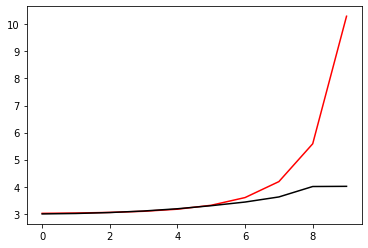

81400 0.039074079046218624
[2.99844066 3.00901269 3.03511189 3.08312728 3.16075253 3.27999227
 3.46987764 3.78380867 4.15595465 4.11746052]


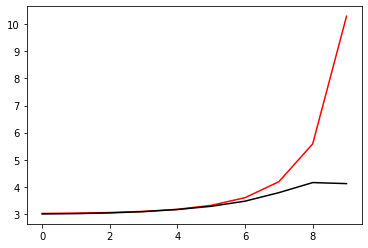

82500 0.04493764800213318
[2.97094616 2.98032395 3.00389916 3.04973451 3.13196832 3.2780689
 3.54959407 3.9952068  4.43825812 4.4421578 ]


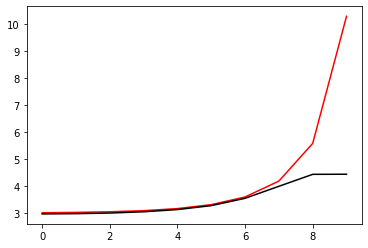

83600 0.015154622319856231
[3.09281354 3.09811495 3.1211441  3.17182832 3.26769741 3.44061021
 3.73802615 4.17688855 4.7042123  4.66360627]


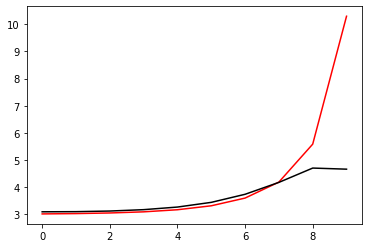

84700 0.021134326037484878
[3.00723811 3.02501987 3.0629379  3.1233254  3.21482822 3.35052666
 3.53746763 3.7781109  4.06514785 4.06449696]


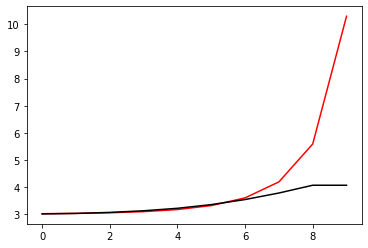

85800 0.011284177744067262
[3.01877284 3.02895197 3.05632335 3.10847118 3.19471976 3.33127197
 3.54874231 3.88048676 4.24186141 4.25186883]


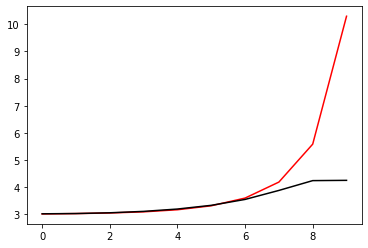

86900 0.08234974949722605
[3.16432211 3.16594687 3.1826645  3.22553686 3.31106077 3.46621323
 3.73283594 4.13077548 4.55150745 4.48955347]


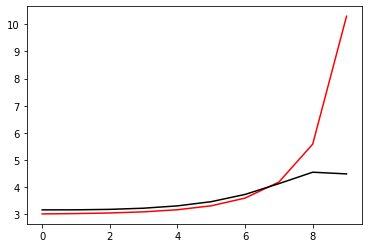

88000 0.025252338631426865
[2.97322384 2.9825967  3.00469771 3.04731932 3.12226482 3.24899946
 3.46268056 3.82861709 4.4032684  4.59863856]


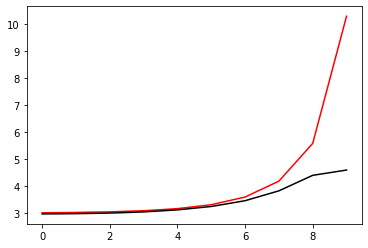

89100 0.03166748728810092
[2.96203948 2.96880842 2.98953772 3.03482897 3.11751769 3.26049966
 3.50534672 3.92231635 4.56829002 4.590413  ]


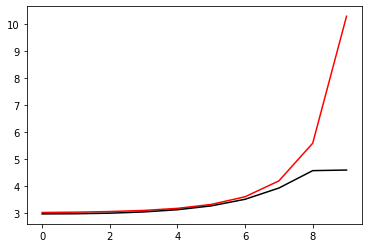

90200 0.07552092131700633
[2.77284109 2.79639777 2.84765809 2.92570671 3.03833502 3.20575315
 3.46647647 3.89117953 4.55715986 4.79820993]


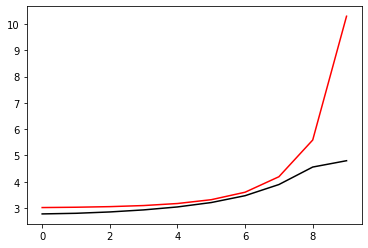

91300 0.021612746547252284
[2.95634141 2.96648179 2.9920691  3.04129082 3.12587273 3.26524441
 3.49524187 3.88324269 4.51236892 4.54544118]


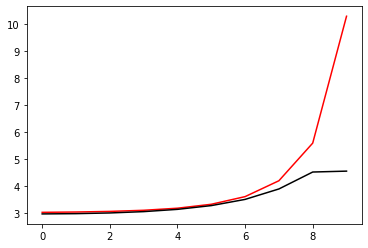

92400 0.0414522914232818
[2.9751388  2.9657095  2.96718264 2.99195469 3.05112773 3.16304856
 3.36081207 3.7031124  4.25682746 4.22586083]


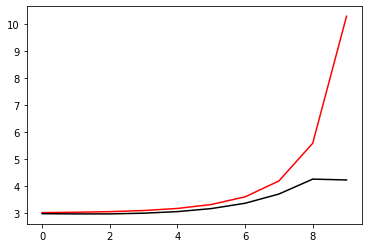

93500 0.04593126206955475
[2.99005233 2.99293592 3.00418474 3.03397639 3.09788443 3.21896442
 3.43472303 3.80868702 4.40827884 4.36889643]


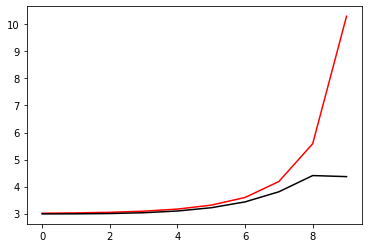

94600 0.012913385226597792
[3.10992093 3.10684084 3.11564468 3.14461456 3.20873853 3.33337907
 3.56180446 3.96597946 4.61686148 4.57347789]


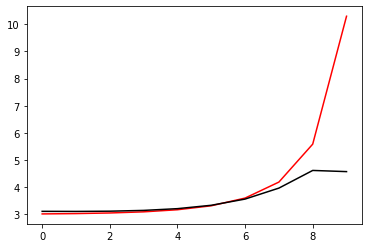

95700 0.06107890990238781
[2.80302336 2.81803534 2.84887224 2.90335273 2.99454274 3.14569291
 3.39986663 3.83443729 4.53161037 4.81037534]


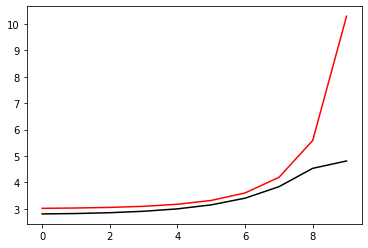

96800 0.013291077221870964
[2.95463309 2.96687958 2.99114215 3.02972315 3.08870068 3.17971651
 3.32588238 3.57579791 4.01148855 4.06957568]


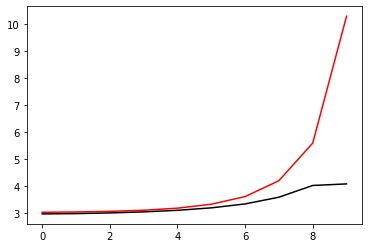

97900 0.041296564845898366
[3.0397006  3.05170541 3.0786012  3.12499746 3.19920224 3.31660521
 3.50576137 3.81780492 4.30854939 4.31378573]


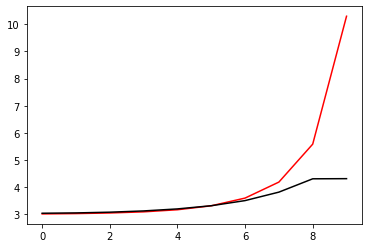

99000 0.02461811224060429
[2.987268   2.99440551 3.01458271 3.05452285 3.1257433  3.24828136
 3.45821003 3.82009072 4.40035488 4.62419896]


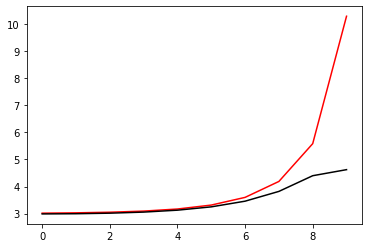

100100 0.03084295736258556
[2.89911886 2.9061587  2.92771344 2.97289944 3.05452448 3.19579625
 3.43974358 3.86237957 4.53777565 4.55446641]


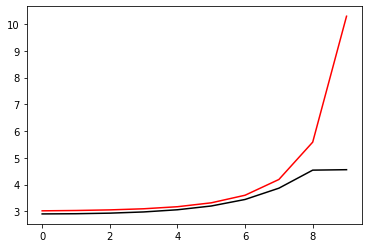

101200 0.020110676267153335
[2.96445352 2.96501889 2.97422381 3.00264036 3.06420665 3.1833042
 3.40583838 3.81736299 4.50668812 4.53602805]


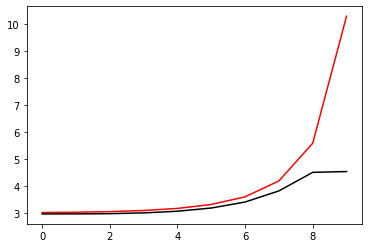

102300 0.021655635644016798
[2.95843765 2.96436582 2.98100811 3.01754791 3.0889004  3.2200016
 3.45662684 3.88417621 4.60076554 4.64303914]


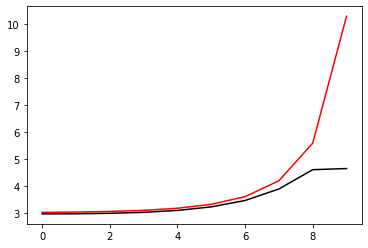

103400 0.03736246182250039
[3.01006914 3.01530904 3.03167807 3.06966816 3.14534595 3.28494177
 3.53619069 3.97432674 4.70132073 4.58110712]


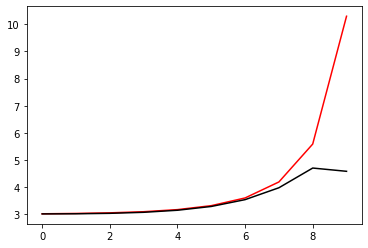

104500 0.04735604098996105
[2.95929078 2.96171725 2.97521377 3.00743001 3.07529386 3.20861283
 3.46044178 3.91766869 4.65780682 4.54450263]


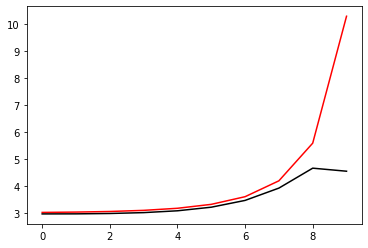

105600 0.03112599812475876
[2.95839426 2.94612834 2.94047157 2.95362817 2.99855707 3.09729531
 3.28942541 3.64511299 4.24835785 4.2486928 ]


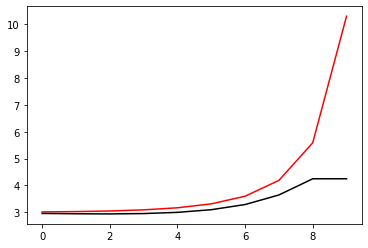

106700 0.014006046898597043
[2.92882925 2.92827839 2.93257627 2.951984   3.00209286 3.10681195
 3.30725597 3.67609782 4.29887719 4.29086452]


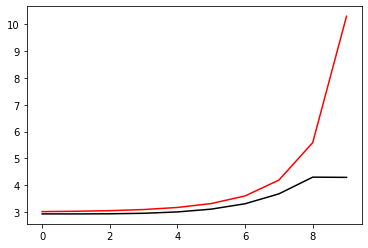

107800 0.011435279528261106
[2.98003458 2.98436208 2.99717152 3.02582191 3.0830253  3.19207393
 3.39504876 3.76650217 4.39318414 4.38968701]


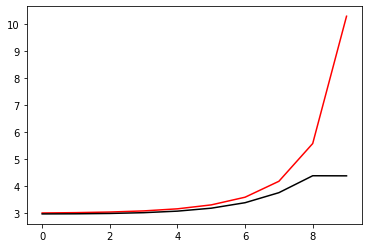

108900 0.10167192227190006
[2.80524087 2.81853328 2.84437037 2.88877403 2.96244856 3.085418
 3.29643151 3.66845259 4.29039501 4.29416937]


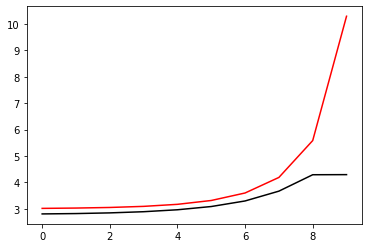

110000 0.05325864603862659
[2.88223685 2.89343219 2.91910393 2.96282161 3.03351832 3.14847842
 3.34085366 3.67327475 4.22359847 4.47108819]


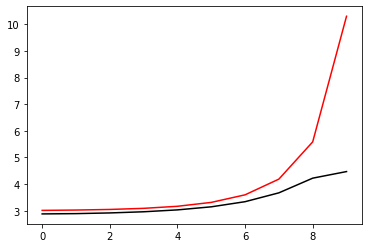

111100 0.03184028837924836
[2.96823707 2.98075018 3.01096054 3.06367275 3.14958095 3.28809315
 3.5141301  3.88934764 4.48095792 4.49146029]


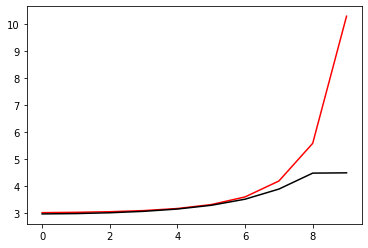

112200 0.02065828898044998
[2.95601072 2.9643828  2.98764859 3.03482408 3.11884605 3.26186721
 3.50387358 3.91488558 4.56713682 4.57205248]


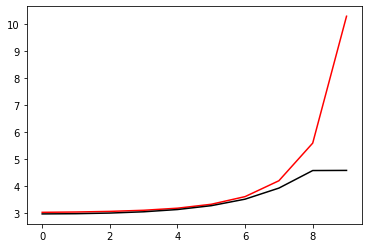

113300 0.021699479993002306
[2.93572127 2.94327463 2.96287923 3.00351752 3.07956363 3.21568456
 3.45560817 3.88034072 4.57994639 4.63181988]


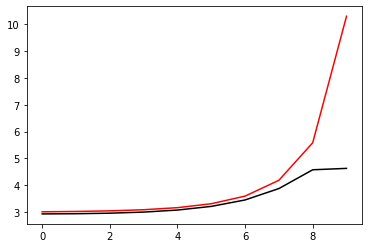

114400 0.039890629219203055
[2.96943611 2.96298791 2.96710037 2.99488193 3.05912994 3.18077261
 3.39646084 3.77060578 4.37467343 4.34826595]


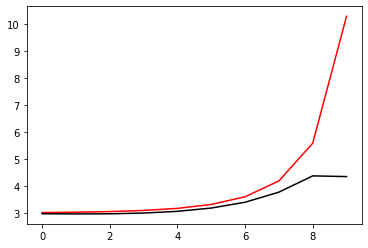

115500 0.045507149864652964
[2.98949994 2.99189136 3.0027882  3.03338061 3.09985631 3.2260076
 3.45120644 3.84270617 4.47199934 4.45052665]


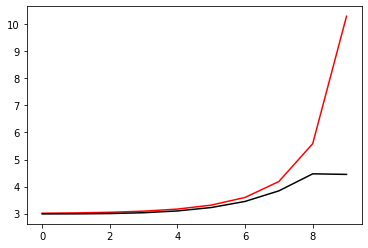

116600 0.011538142372313077
[3.04459946 3.04392823 3.05403977 3.08408837 3.14975063 3.27704539
 3.50995942 3.92200203 4.58789603 4.56516719]


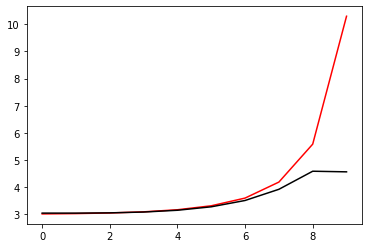

117700 0.021630157449809853
[3.07042257 3.07551334 3.09031902 3.12578377 3.19622162 3.32737193
 3.56531136 3.99014053 4.68565239 4.75315107]


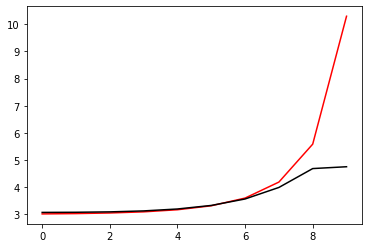

118800 0.011886030774704731
[3.01956581 3.03050337 3.05716023 3.10709494 3.19278703 3.33726274
 3.5847968  4.01756751 4.73141474 4.75597677]


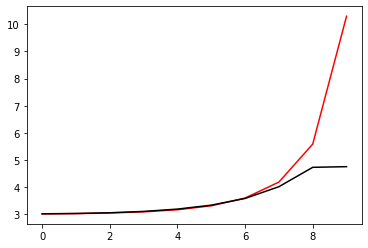

119900 0.10176228259084721
[2.82675714 2.82024869 2.82977968 2.86698497 2.94534011 3.08914871
 3.34102092 3.77634322 4.48182615 4.55139599]


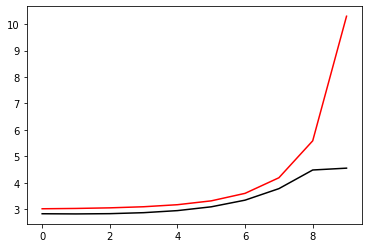

121000 0.024574855291183195
[3.03135419 3.02610504 3.02458283 3.04285543 3.09962721 3.21985625
 3.44527197 3.84954668 4.51675072 4.50067867]


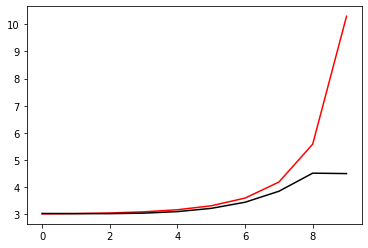

122100 0.03185471704326368
[3.00021088 3.00076782 3.00791855 3.03238884 3.09190447 3.21504069
 3.44940487 3.87488442 4.57821322 4.57933466]


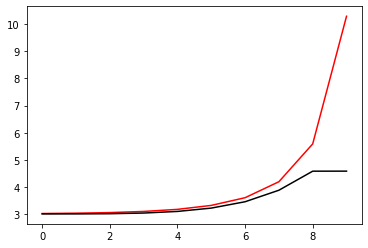

123200 0.0208932134466207
[3.0253021  3.02811205 3.03706115 3.05863358 3.10548588 3.19964059
 3.38123615 3.72449251 4.32166132 4.38817399]


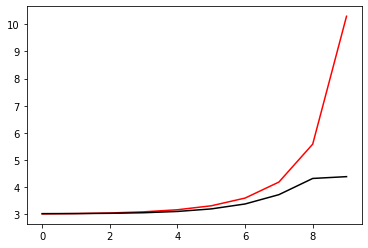

124300 0.02119966935660014
[2.99254081 2.99257315 2.99875075 3.02059133 3.07173279 3.17588206
 3.37721301 3.75754303 4.41545297 4.4252897 ]


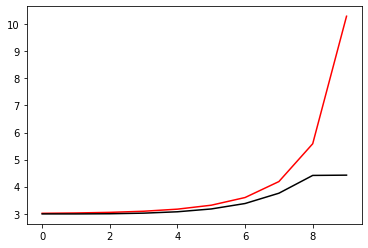

125400 0.03654263811538982
[2.96217405 2.97494836 3.00530225 3.05936604 3.14918669 3.29870983
 3.55311311 3.99278038 4.70448722 4.64143405]


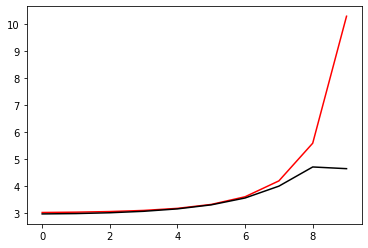

126500 0.048013435324865336
[2.99279399 3.00748649 3.03718229 3.09142578 3.18627295 3.34910806
 3.62742318 4.10212148 4.85755618 4.81556643]


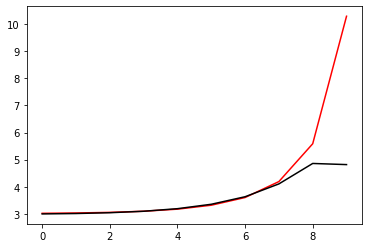

127600 0.04370789759844203
[3.11567837 3.12669424 3.15472289 3.21168346 3.3119475  3.482727
 3.76932268 4.24788429 4.99975504 4.90706095]


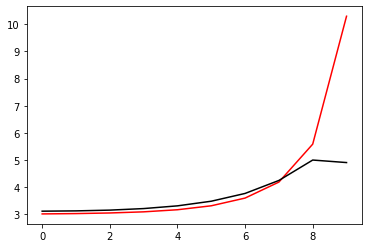

128700 0.020967411611171813
[3.02559277 3.03462429 3.05327018 3.08740831 3.14742787 3.25046042
 3.42689857 3.73887356 4.29508178 4.28768081]


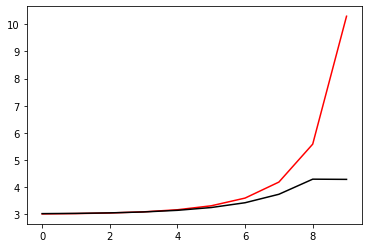

129800 0.011461654659526942
[3.08096992 3.08818052 3.1069593  3.1451561  3.21575884 3.34137677
 3.56289373 3.95170992 4.57772441 4.62303844]


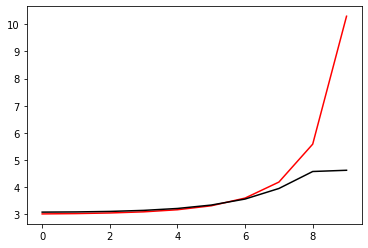

130900 0.0414914658841703
[3.03901548 3.04868344 3.07159078 3.11396527 3.18682603 3.31057449
 3.52337417 3.89520537 4.50798633 4.52945893]


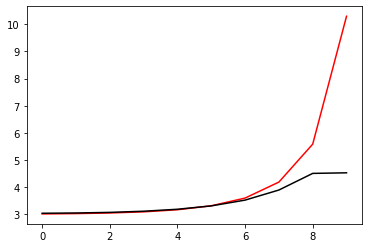

132000 0.0236155359391007
[2.98881859 2.99183119 3.01064797 3.05320208 3.13339118 3.27614296
 3.52680712 3.9630206  4.66436322 4.60276474]


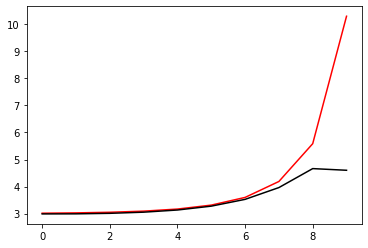

133100 0.03180067751455504
[2.94883698 2.95583877 2.97435796 3.01787874 3.10241253 3.25468333
 3.52407175 3.99711085 4.75876653 4.79796467]


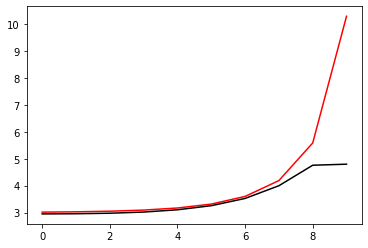

134200 0.02088846017627641
[2.96669588 2.99177374 3.03296557 3.0908899  3.17499039 3.29857056
 3.46701409 3.66280056 4.05108792 4.04485047]


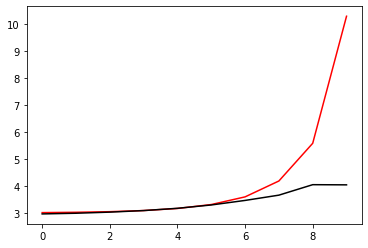

135300 0.021133584484697678
[2.97840347 2.99166188 3.02283841 3.07635436 3.15922461 3.28402853
 3.4714527  3.76487721 4.16304242 4.17275916]


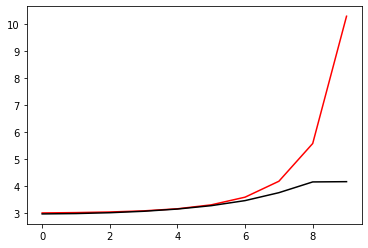

136400 0.03786231898240803
[2.96913278 2.97932603 3.00440688 3.05240645 3.13521824 3.27283475
 3.50560135 3.88814055 4.36837068 4.29675294]


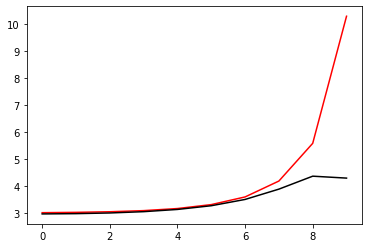

137500 0.0477560688509902
[2.99177936 3.00624959 3.03463017 3.08529223 3.1729487  3.32133034
 3.56700804 3.95752298 4.49560027 4.40931706]


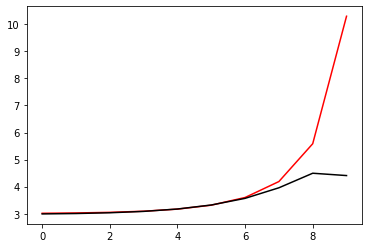

138600 0.011926460497354973
[3.014984   3.02664079 3.05537267 3.10853523 3.20069629 3.35643559
 3.61599767 4.04053168 4.66232861 4.703116  ]


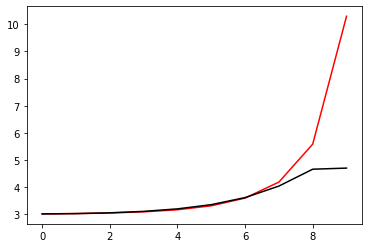

139700 0.022108027470090406
[3.05456317 3.06616605 3.09129308 3.14360488 3.23830307 3.39926716
 3.66960281 4.12062614 4.81085305 4.89991938]


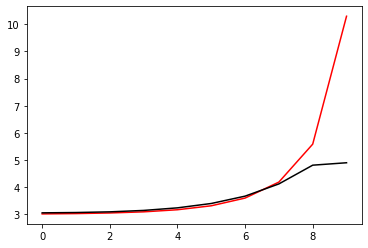

140800 0.010934859405650667
[3.06465439 3.08384192 3.11931343 3.17441093 3.25883941 3.38514378
 3.53665793 3.6339569  3.98212144 3.98606839]


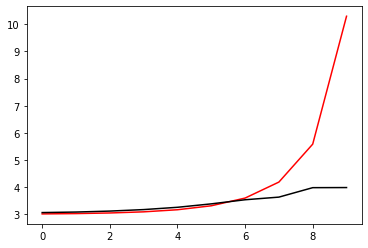

141900 0.04006841541327743
[3.0710177  3.08477666 3.11643999 3.16985641 3.25154853 3.36988034
 3.5336479  3.76349596 4.04984525 4.0453568 ]


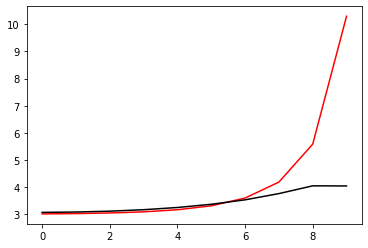

143000 0.02585188275584588
[3.0106916  3.02117871 3.0469081  3.09323317 3.16751624 3.28219485
 3.46472798 3.78325005 4.16761519 4.14090989]


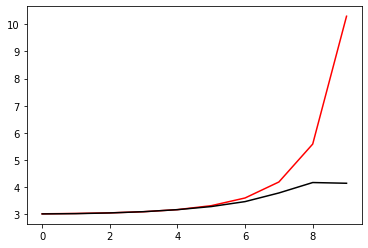

144100 0.03150480449728127
[2.96307127 2.97068991 2.99115474 3.03316425 3.11106284 3.24605688
 3.47321492 3.88925398 4.45512042 4.4830594 ]


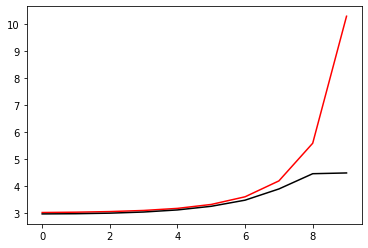

145200 0.020166164832005035
[2.94847144 2.95605761 2.97661274 3.01991442 3.10085056 3.24413363
 3.49431611 3.93198597 4.60100772 4.61257006]


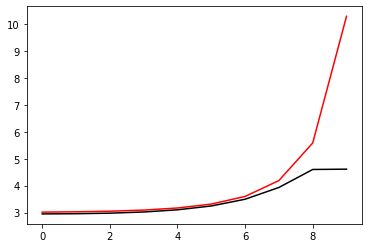

146300 0.07003656709204394
[3.20568566 3.20268351 3.21291359 3.24376253 3.30967245 3.43125604
 3.63329939 3.93328959 4.5348932  4.67741462]


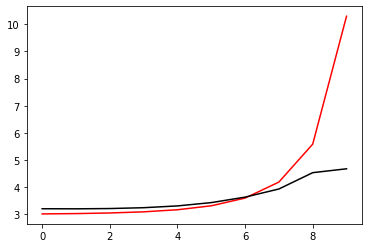

147400 0.03844663699360618
[2.99944862 3.00514997 3.01704236 3.04431171 3.10214615 3.21496448
 3.4247889  3.80498878 4.44659088 4.28654689]


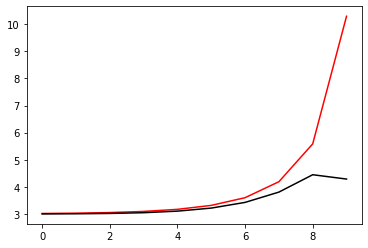

148500 0.05101727032378721
[2.93880498 2.94812043 2.96831465 3.00450878 3.0673447  3.17672499
 3.36964578 3.71379801 4.29270326 4.26216367]


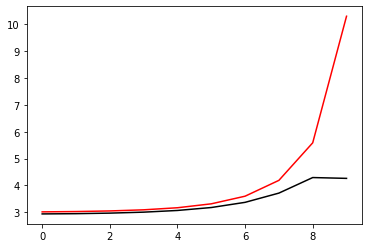

149600 0.025964332577066034
[3.10892232 3.11922207 3.14540677 3.19563965 3.28354353 3.43259158
 3.68415366 4.10712909 4.76114306 4.6751008 ]


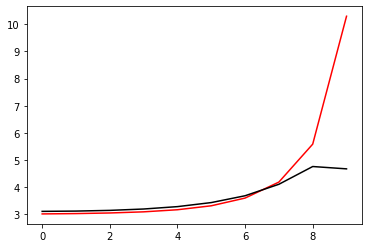

150700 0.014113306329328522
[2.92870071 2.92833964 2.94016713 2.9741897  3.04039867 3.15433922
 3.34158263 3.64593169 4.15388964 4.14422941]


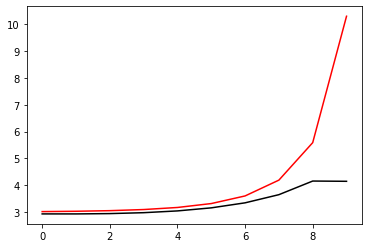

151800 0.011463678816990874
[2.96207516 2.97256755 2.99605847 3.03994045 3.11581935 3.24205682
 3.44880426 3.78749533 4.3287237  4.28776961]


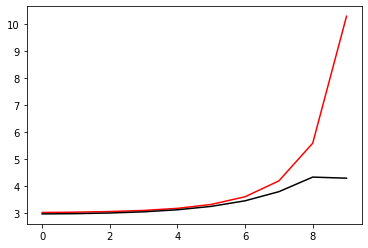

152900 0.0414119578516067
[3.05070899 3.05877373 3.08005624 3.12284488 3.1992107  3.32876591
 3.54595593 3.91030277 4.48628582 4.49397788]


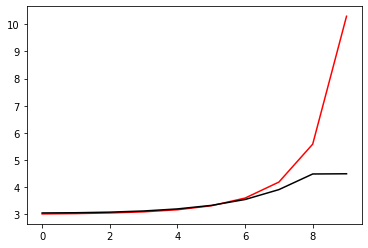

154000 0.023658258709483872
[2.97972835 2.98662148 3.00922657 3.05560438 3.13940167 3.28441247
 3.53313049 3.9581294  4.63101653 4.58000127]


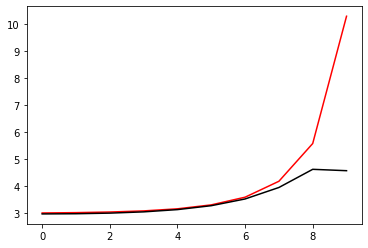

155100 0.0315810136088782
[2.94041811 2.94943147 2.97062569 3.01653186 3.10109896 3.24889591
 3.50483268 3.94844637 4.66242811 4.72430172]


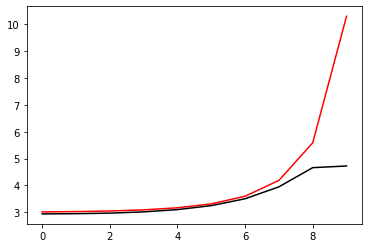

156200 0.018113702397998588
[2.94460548 2.93710226 2.93324157 2.94701174 2.99189967 3.08500242
 3.25052036 3.53147149 4.05768582 4.05417855]


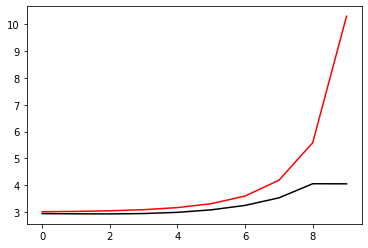

157300 0.0208478188129839
[2.94188086 2.94286108 2.94838611 2.96678777 3.01158739 3.10263271
 3.27017667 3.56661543 4.09350167 4.10324207]


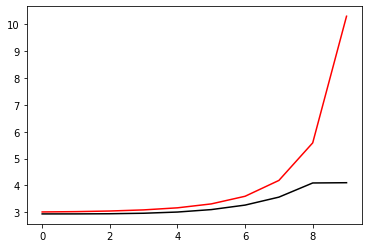

158400 0.041794487011657416
[2.94596822 2.9539008  2.97119569 3.00395058 3.0634042  3.16963545
 3.35824181 3.69185626 4.25425432 4.14463222]


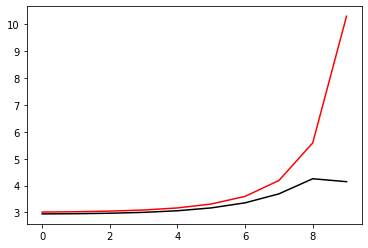

159500 0.044941510101492874
[2.97285646 2.98332451 3.0090439  3.05581136 3.13672568 3.27446756
 3.50870635 3.90751423 4.54503089 4.55554814]


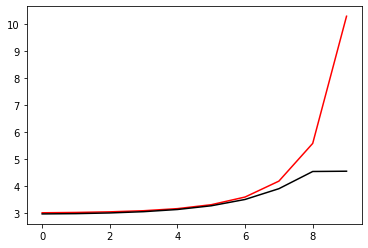

160600 0.011862110382300783
[3.02870996 3.03929627 3.06627031 3.11639559 3.20292065 3.34954012
 3.59805635 4.02048915 4.69113221 4.72756071]


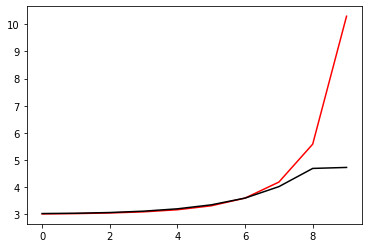

161700 0.021965030285881856
[3.02273203 3.03123497 3.05514993 3.10052226 3.18813116 3.34021102
 3.60198888 4.0528639  4.77105629 4.81274578]


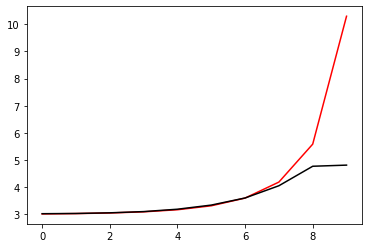

162800 0.015965309723679953
[2.92592854 2.93195903 2.94998263 2.990182   3.0661037  3.19852207
 3.41535896 3.7603845  4.32536298 4.39076572]


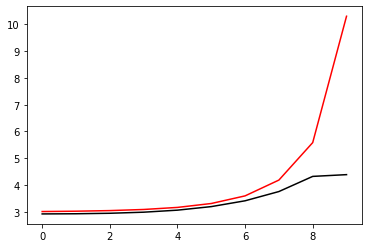

163900 0.04210478891658547
[3.00198944 3.01083034 3.03298595 3.07675419 3.1554156  3.2898976
 3.51281541 3.87672983 4.45626577 4.44438186]


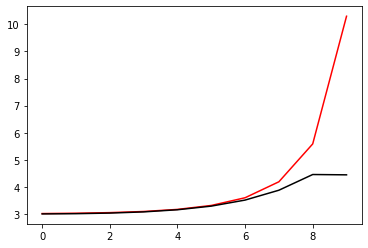

165000 0.024277025782475155
[3.00542292 3.01167448 3.03088043 3.07235328 3.150031   3.28644844
 3.52009427 3.91615095 4.54675113 4.51687808]


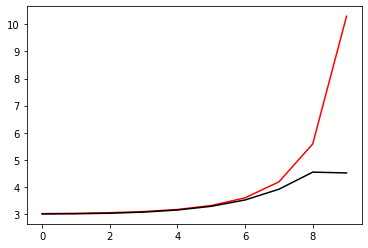

166100 0.03165004883222024
[2.95832957 2.96685524 2.98766893 3.02941837 3.10743192 3.24696732
 3.49245652 3.92202123 4.61987655 4.65705877]


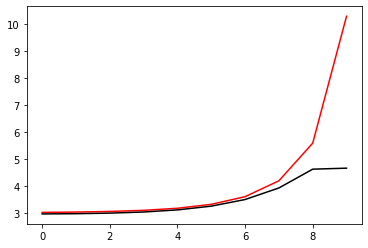

167200 0.019608231676867073
[2.93670329 2.94623047 2.96990287 3.01672149 3.10115836 3.24752618
 3.50110831 3.94493392 4.67350408 4.66658828]


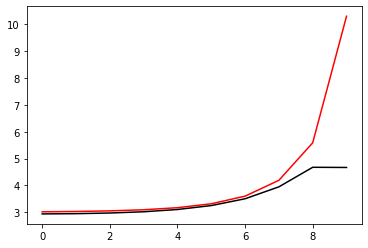

168300 0.20105058820838534
[3.24605237 3.24538352 3.25920315 3.29282847 3.36058375 3.48133432
 3.67785591 3.97390535 4.53596139 4.72433435]


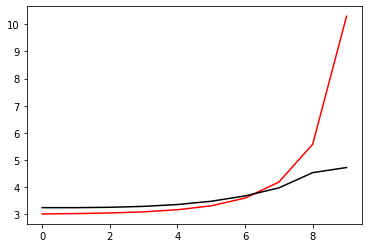

169400 0.04629103490265345
[2.94593148 2.94078216 2.93914381 2.9546139  3.001888   3.0994587
 3.27244939 3.55758386 4.08976759 4.06677385]


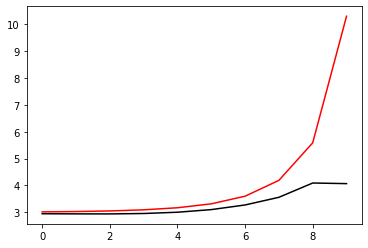

170500 0.051210841913001355
[2.94429045 2.94715038 2.95603756 2.97872401 3.02876233 3.12690796
 3.30467478 3.61355735 4.15382217 4.17353667]


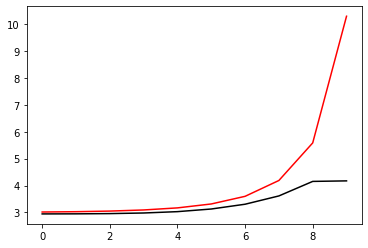

171600 0.011152950308194104
[3.0450422  3.0463577  3.05914468 3.08901925 3.14695673 3.25293616
 3.44262942 3.77867122 4.34250395 4.25572309]


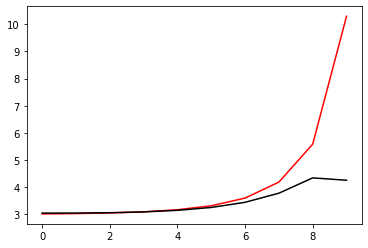

172700 0.014095112207689033
[2.91736051 2.92177451 2.9390044  2.97850347 3.0518822  3.18102629
 3.40554618 3.7949123  4.42476801 4.68386312]


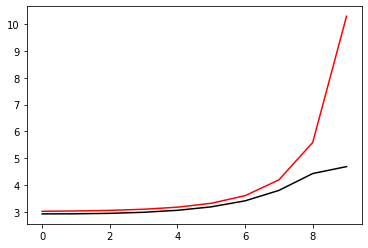

173800 0.05400692959545625
[2.78765106 2.81028937 2.84908052 2.91036088 3.00450124 3.14946627
 3.37911595 3.75735833 4.36043733 4.49522984]


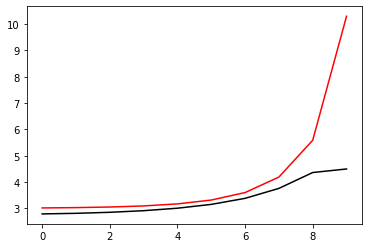

174900 0.036046379248822466
[3.08600094 3.1015387  3.13534428 3.19189014 3.27991485 3.41557809
 3.62799567 3.96800188 4.49017892 4.47724154]


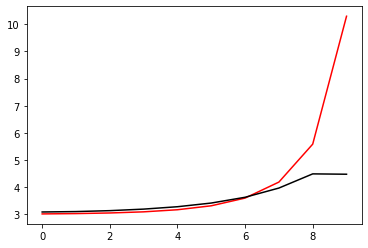

176000 0.03097118389686087
[2.92100294 2.93106413 2.95625608 3.00335729 3.08373768 3.21689855
 3.43787462 3.80982503 4.3998668  4.66257135]


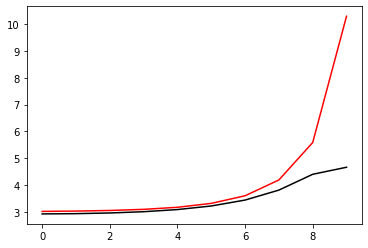

177100 0.031531855215069564
[2.98087039 2.97944962 2.98929129 3.02025092 3.08690335 3.21416177
 3.44673889 3.86218745 4.52914982 4.50140348]


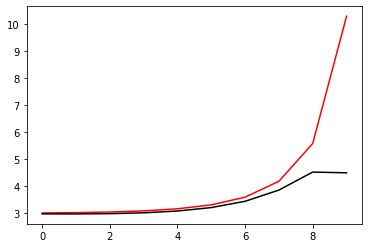

178200 0.016936922163612346
[2.92805299 2.92147233 2.92455212 2.94778147 3.00364372 3.11368725
 3.31755414 3.68748228 4.31114969 4.36190096]


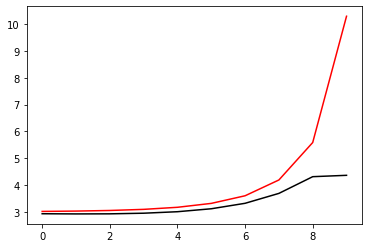

179300 0.021302061360618314
[2.97317578 2.9768035  2.98859719 3.01751552 3.07761238 3.19266586
 3.40516476 3.79049804 4.43510961 4.46014461]


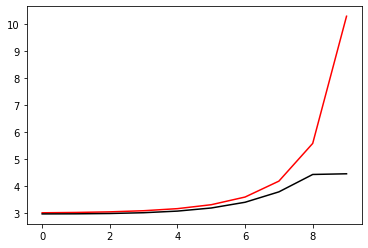

180400 0.03657737883992354
[2.95153416 2.96264699 2.98843546 3.03723457 3.12326991 3.2709986
 3.52413186 3.95997133 4.66378824 4.53896914]


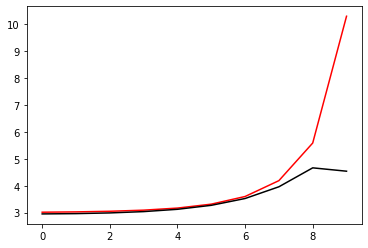

181500 0.060006526422641454
[2.89504627 2.89337182 2.90623985 2.94383973 3.02552548 3.18242077
 3.46892433 3.96878951 4.74699637 4.7133979 ]


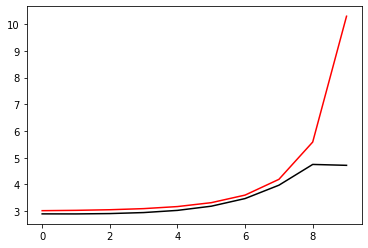

182600 0.02497954574553369
[2.95249245 2.9572842  2.97339077 3.01569863 3.09829363 3.24809262
 3.51207004 3.9677924  4.68602265 4.73313465]


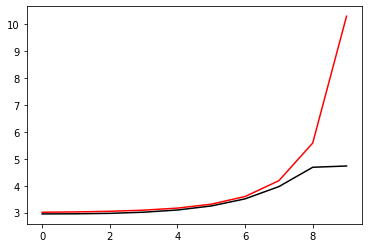

183700 0.02145476665047509
[3.08367018 3.08823503 3.10158535 3.13291748 3.19748934 3.32067174
 3.54458333 3.93782897 4.58215684 4.59677945]


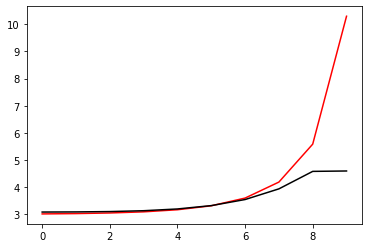

184800 0.011481254635000198
[3.04224495 3.05422282 3.08184504 3.13060148 3.20979883 3.33832898
 3.55334765 3.92448492 4.53892638 4.57449355]


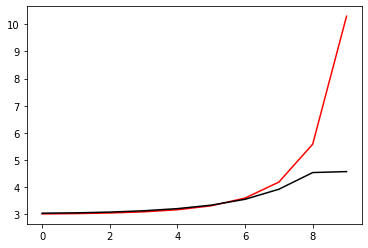

185900 0.041434608678268585
[3.02299409 3.05281745 3.09537325 3.15890336 3.25405301 3.39514742
 3.57552554 3.61920644 4.04026608 4.27330785]


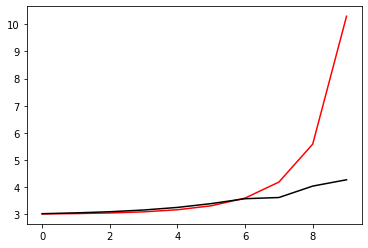

187000 0.026410388646379058
[2.99983675 3.0172682  3.05478358 3.11515079 3.20491701 3.33145508
 3.49755272 3.73620748 4.0983751  4.07561967]


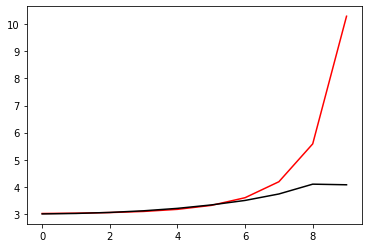

188100 0.03177630087873784
[2.97723898 2.98710883 3.01379136 3.06411691 3.14670502 3.2760101
 3.48092414 3.83657045 4.26195779 4.2456859 ]


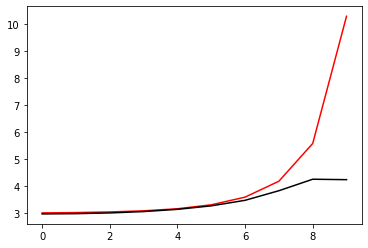

189200 0.02032294400585776
[2.95380335 2.96111043 2.98153762 3.02425202 3.10237663 3.23631506
 3.46325589 3.86892849 4.45965757 4.47334017]


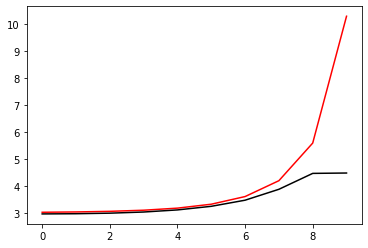

190300 0.021082311809421436
[2.96632912 2.96095694 2.96328777 2.98617724 3.04390226 3.15844401
 3.36547414 3.71360022 4.24363637 4.27063912]


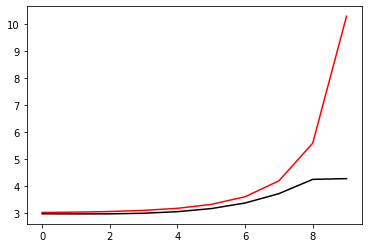

191400 0.03747931249642815
[2.9703092  2.97723161 2.99484567 3.03282363 3.10692302 3.24285852
 3.48364417 3.89619616 4.5248022  4.4344556 ]


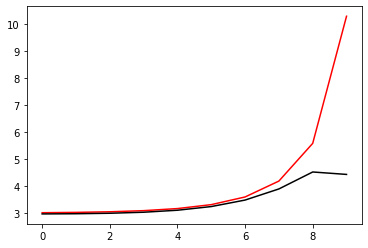

192500 0.05001890343825237
[3.00654825 3.02240255 3.05248743 3.10383688 3.1901329  3.33437707
 3.57660321 3.98572592 4.63139215 4.53223214]


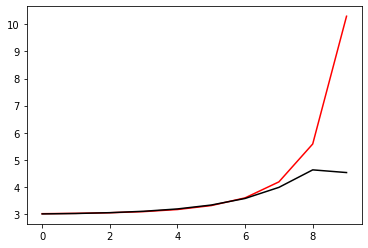

193600 0.012003491149347421
[3.03948806 3.05039366 3.07882027 3.13215221 3.22335274 3.37616327
 3.63219414 4.06271362 4.73962032 4.76654636]


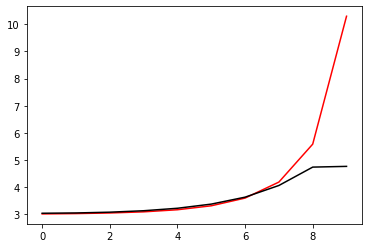

194700 0.021018862748969636
[3.04751023 3.06314221 3.09690803 3.1506204  3.23252518 3.3558192
 3.53059019 3.77157901 4.12988991 4.12542002]


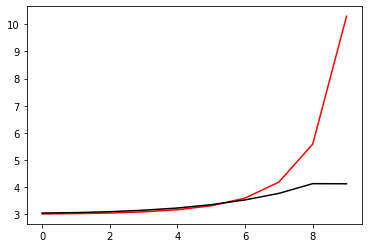

195800 0.011158294390698556
[3.05510914 3.06244891 3.08344234 3.12608028 3.2001218  3.32240182
 3.5260835  3.85957044 4.31337012 4.33113807]


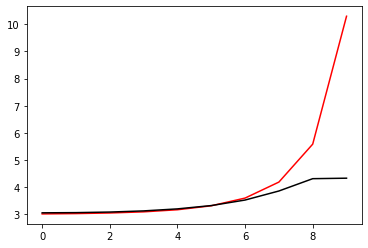

196900 0.04792057439105038
[2.90184092 2.92385554 2.9587389  3.01154377 3.09347439 3.22564433
 3.44616052 3.80086871 4.23171546 4.26339436]


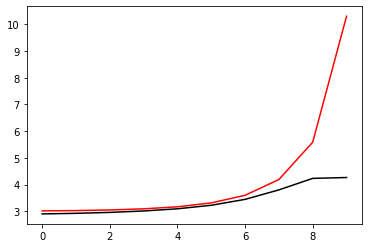

198000 0.024390451600641322
[2.99009867 3.00284111 3.03464922 3.09079559 3.18196276 3.32842076
 3.56569544 3.94526808 4.4637989  4.42186656]


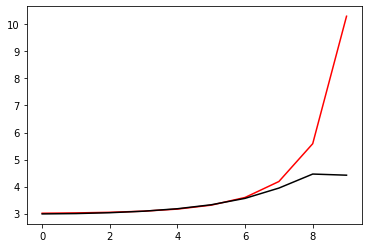

199100 0.030808986543365453
[2.89807733 2.90656213 2.93078628 2.97932544 3.06524307 3.21130666
 3.45912666 3.88487091 4.5580555  4.56538692]


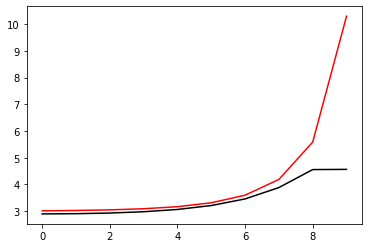

200200 0.020857993919693042
[2.96566959 2.98202074 3.01469764 3.06651884 3.14624757 3.26976161
 3.46434958 3.77628436 4.25560787 4.26803503]


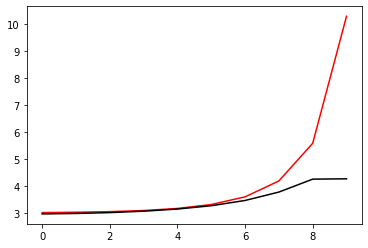

201300 0.02141817999455422
[2.96869754 2.97565775 2.99613254 3.03912431 3.1164441  3.24793549
 3.46954021 3.8439559  4.42838515 4.4519699 ]


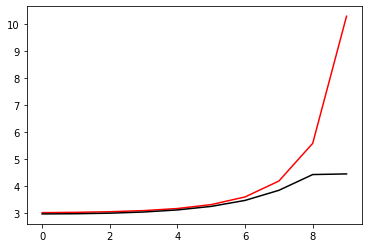

202400 0.038151454609503976
[2.95761183 2.96977553 2.99678465 3.04494279 3.12502964 3.25602842
 3.47090524 3.82429288 4.36740862 4.26778187]


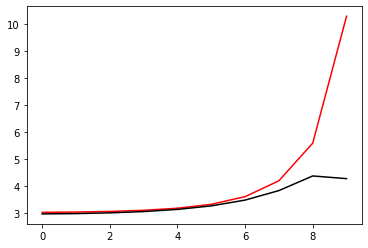

203500 0.0481355027524318
[2.9839904  3.00289485 3.03900772 3.10055494 3.20135759 3.36435033
 3.62862779 4.05575117 4.69062989 4.60596385]


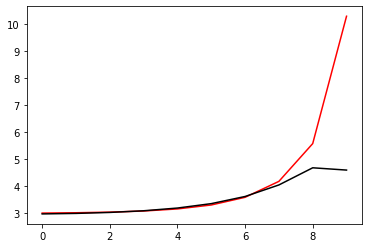

204600 0.012130293735945603
[3.00718226 3.02126657 3.05335838 3.11044775 3.20706886 3.36766844
 3.63432805 4.07769795 4.76187514 4.81404719]


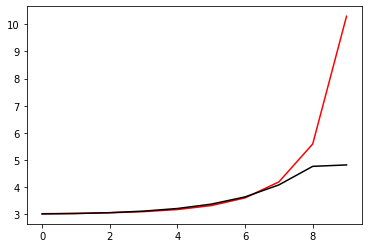

205700 0.059192128497353
[2.80214563 2.82035401 2.85453601 2.9170374  3.02162693 3.19413722
 3.48129452 3.96300133 4.71494442 4.95221102]


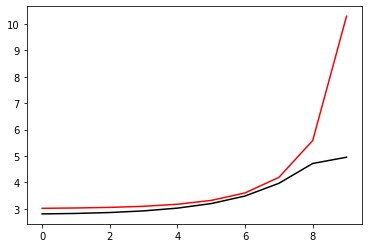

206800 0.01200971882786107
[3.01406426 3.02592118 3.05426687 3.1067531  3.19658615 3.34779823
 3.60429382 4.04666825 4.77093279 4.81529644]


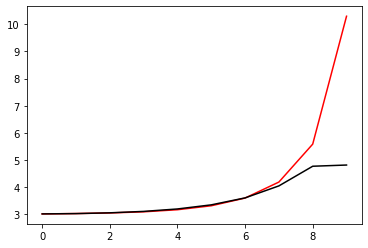

207900 0.04183795627139731
[3.02356286 3.03498    3.06173013 3.11078661 3.19363529 3.33182692
 3.56683446 3.98333339 4.69457074 4.73810029]


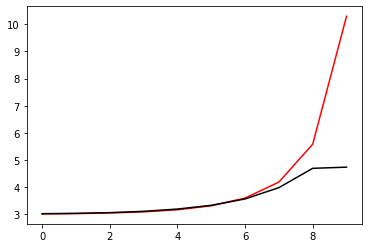

209000 0.029837701406537978
[3.10602233 3.09173245 3.07542517 3.0739399  3.10349501 3.18247848
 3.33094915 3.56711368 4.0956387  4.07049698]


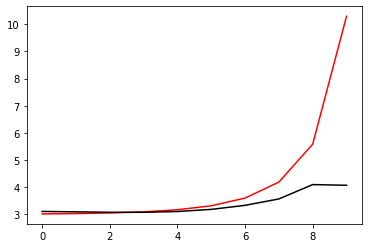

210100 0.03030577764290039
[2.94583085 2.94604116 2.94665495 2.95505995 2.98402953 3.0530309
 3.19327914 3.45920044 3.96404945 4.03012215]


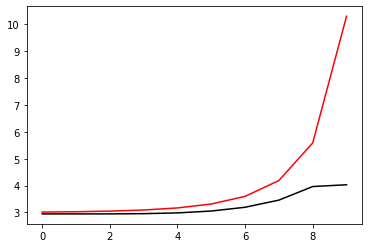

211200 0.017614161251783847
[2.92650569 2.92906653 2.93807281 2.95908972 3.00256667 3.08739306
 3.24846403 3.5505286  4.08138915 4.06245734]


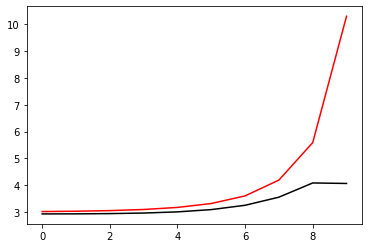

212300 0.020788002621816175
[3.0113566  3.01885219 3.03650437 3.06839809 3.12186286 3.21159824
 3.36650125 3.64533312 4.14035799 4.16067999]


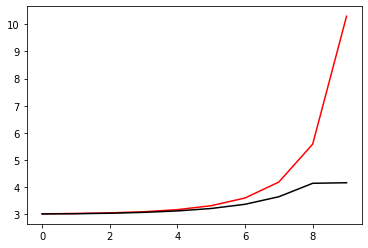

213400 0.036809266870467094
[2.96643829 2.978204   3.00123896 3.04568532 3.1283203  3.27619388
 3.53433603 3.97040855 4.64057294 4.39436248]


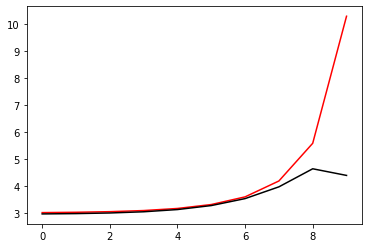

214500 0.045274692864145274
[2.95674552 2.97055151 3.00304746 3.05854868 3.14654185 3.28590518
 3.51096009 3.87716841 4.40997929 4.3353231 ]


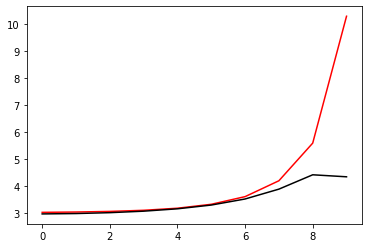

215600 0.01818834838063352
[3.09952194 3.10823317 3.13257051 3.18231563 3.27286308 3.4303003
 3.6985443  4.131548   4.72192243 4.63074044]


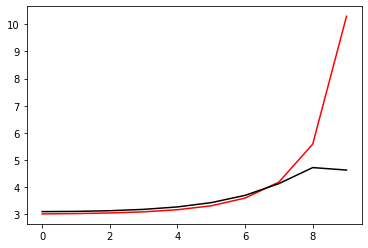

216700 0.021537566616219497
[3.05973047 3.07694747 3.11177314 3.16845574 3.25701367 3.39540494
 3.61372793 3.95694202 4.44942651 4.45304704]


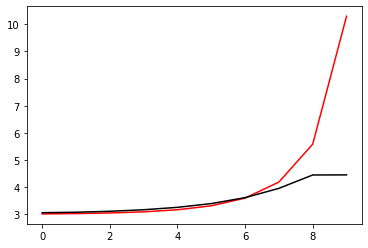

217800 0.011071808234936031
[3.07175054 3.07987541 3.10096111 3.14179922 3.21202365 3.32769593
 3.51726522 3.82877171 4.30266388 4.32794061]


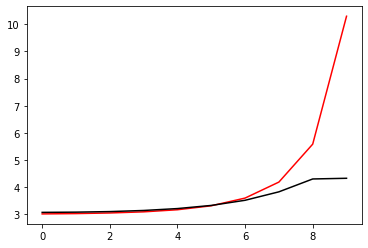

218900 0.041395649206946744
[3.04878533 3.0548991  3.07128798 3.10600998 3.17218154 3.29133888
 3.50091953 3.86619608 4.4553208  4.46384396]


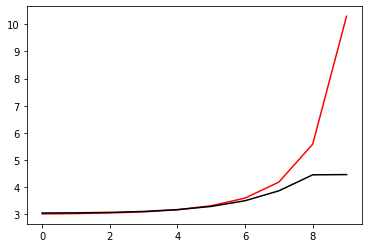

220000 0.023654285640194214
[2.99602383 2.99910898 3.01578655 3.05472507 3.13090738 3.27060136
 3.52128266 3.96443036 4.67801133 4.61932869]


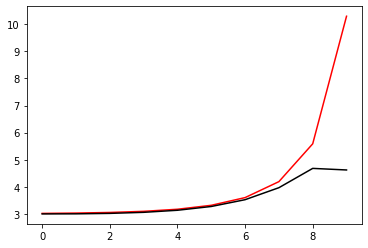

221100 0.03160992049443403
[2.95209112 2.9580148  2.97411195 3.0138915  3.0914342  3.23227784
 3.48428209 3.93537723 4.67957708 4.73755702]


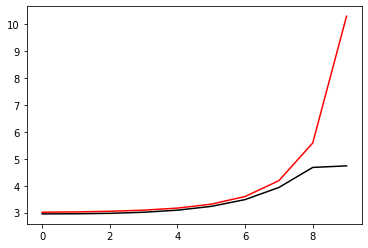

222200 0.019079498146077012
[2.97193106 2.95464914 2.94302109 2.94785239 2.98069768 3.06264741
 3.22932939 3.53927424 4.12901477 4.16265911]


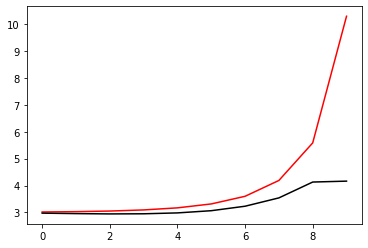

223300 0.020650250664531685
[3.02054319 3.02165208 3.02502059 3.03690375 3.06886195 3.14008874
 3.28406081 3.56428112 4.08847222 4.12144446]


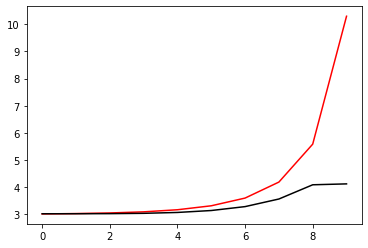

224400 0.041007823527700854
[2.96969396 2.97503299 2.9879406  3.0151349  3.06769948 3.1658466
 3.34714344 3.6802891  4.25160399 4.13820291]


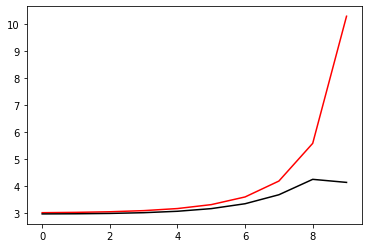

225500 0.04491044210771515
[2.98239315 2.9889244  3.00691397 3.04520946 3.11911496 3.2541053
 3.49490571 3.91677474 4.59045853 4.55062895]


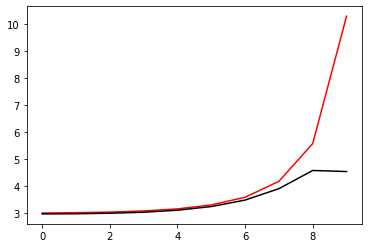

226600 0.04299443762892306
[3.11546984 3.12930871 3.16100461 3.21868189 3.31571756 3.47528924
 3.73928077 4.18071595 4.87215107 4.78090726]


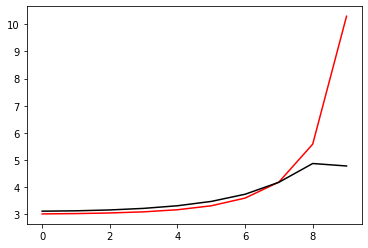

227700 0.02200646120277033
[3.01323905 3.02656546 3.05796143 3.11410036 3.20698067 3.36016875
 3.61655968 4.05322309 4.75494414 4.7931919 ]


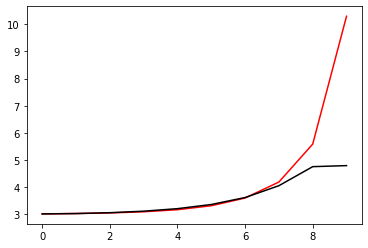

228800 0.011548903830950412
[2.93781139 2.97000735 3.01340381 3.07775686 3.17329833 3.3141232
 3.49718162 3.6299394  4.15246987 4.63752698]


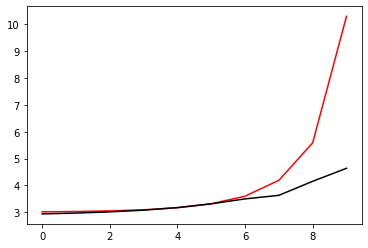

229900 0.04168931851540159
[2.99841604 3.01614627 3.05494425 3.1183899  3.21447915 3.35570003
 3.55490121 3.82701525 4.23195331 4.23367749]


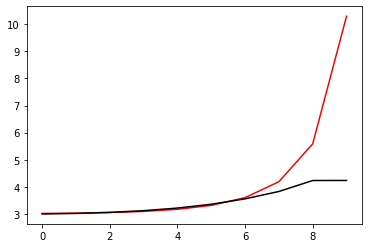

231000 0.024474709695153713
[2.99246708 3.00301569 3.03114773 3.08457888 3.17385263 3.31622101
 3.54292763 3.9116733  4.37681969 4.34305789]


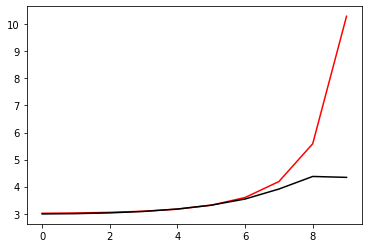

232100 0.03169906107311767
[2.96483253 2.97290167 2.99523691 3.04088162 3.12376577 3.2648141
 3.5010743  3.92751774 4.54620819 4.5652134 ]


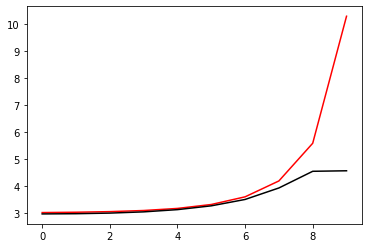

233200 0.01932317537870777
[2.93669323 2.94493482 2.96621433 3.00960776 3.08862905 3.22601832
 3.46768346 3.91319834 4.64857462 4.62185266]


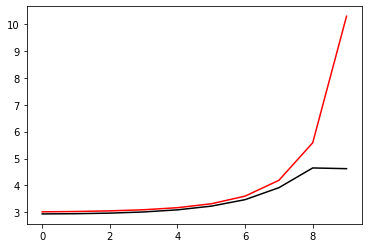

234300 0.021389230093168964
[2.98267043 2.96759879 2.96329671 2.9863155  3.05337061 3.1918084
 3.44007594 3.82026721 4.35512993 4.36005671]


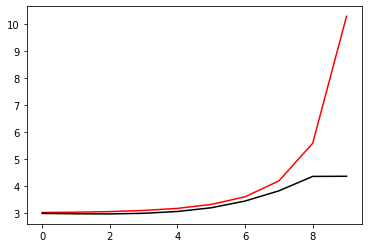

235400 0.03812885302803807
[3.00564408 3.00461459 3.00982623 3.03600723 3.10336948 3.23982957
 3.48473175 3.87991539 4.44573538 4.42577243]


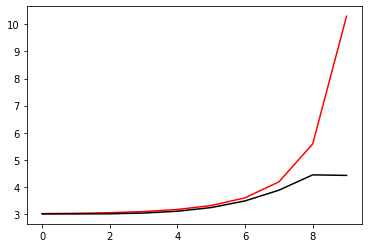

236500 0.04508973471081858
[2.97820613 2.98154548 2.99393972 3.02616676 3.09667026 3.23478681
 3.48580818 3.91234978 4.54798183 4.54315761]


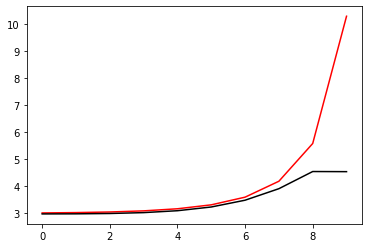

237600 0.021518980798662227
[3.12722529 3.12377381 3.13356319 3.16527863 3.23476304 3.36954709
 3.61670305 4.0518035  4.73343351 4.65673351]


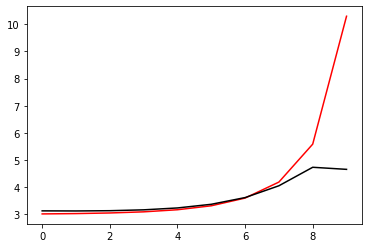

238700 0.02176370792264509
[3.01177205 3.02621445 3.05745507 3.1103942  3.19697377 3.33962224
 3.57954299 3.9897429  4.645235   4.67266423]


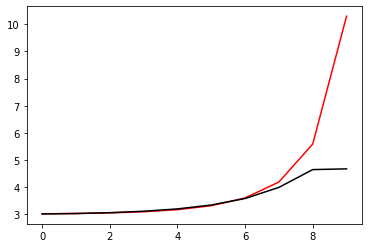

239800 0.011752050378524522
[3.03793173 3.0488332  3.07496134 3.12352789 3.20688934 3.34768217
 3.5876454  4.0025607  4.67823895 4.69818983]


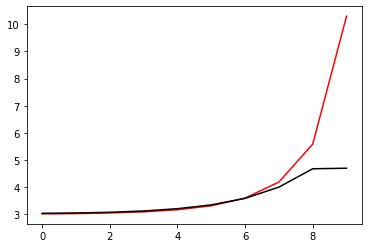

240900 0.03933846430084005
[3.07107013 3.08097794 3.10493215 3.15010199 3.22822406 3.36109631
 3.5903477  3.9980831  4.68678515 4.71136512]


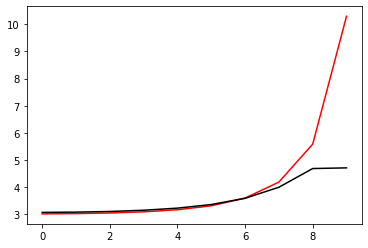

242000 0.03155583798360535
[3.12614198 3.1066556  3.08621053 3.08122022 3.10546593 3.17485394
 3.30510216 3.50955928 3.9820523  3.95960768]


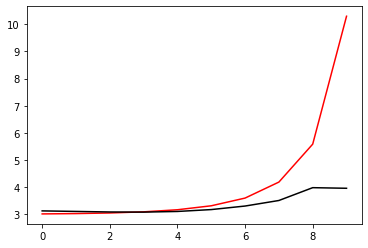

243100 0.03360053540002197
[3.04935523 3.04380967 3.03908049 3.04418385 3.07321601 3.14635495
 3.29357736 3.5656522  4.06765312 4.05685948]


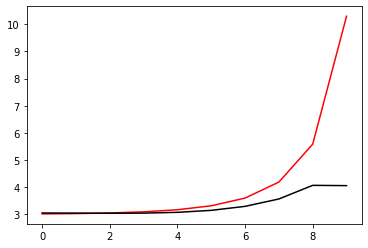

244200 0.017991528196633102
[2.9333207  2.93608548 2.94470171 2.96529393 3.00986361 3.09960737
 3.27318302 3.60084003 4.17037871 4.15529195]


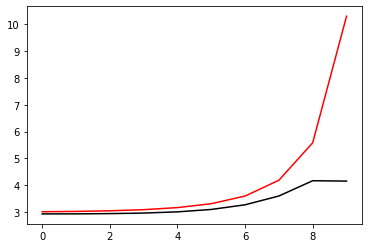

245300 0.021530046262044553
[2.92967048 2.93738468 2.95750057 2.99858247 3.07331008 3.20340937
 3.43004003 3.82751426 4.47490914 4.50988666]


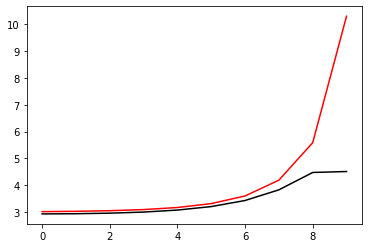

246400 0.0396796408271903
[3.02539742 3.04498354 3.0793139  3.13024814 3.20570787 3.31751735
 3.4771139  3.68597018 4.03846176 4.01766683]


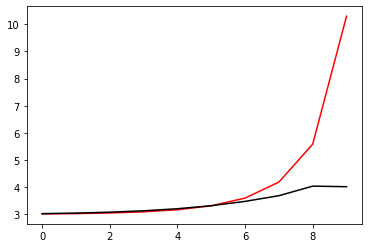

247500 0.04614024332743522
[2.9726056  2.98245745 3.0076555  3.05401692 3.13044314 3.2536437
 3.46039913 3.82238143 4.28002271 4.1991007 ]


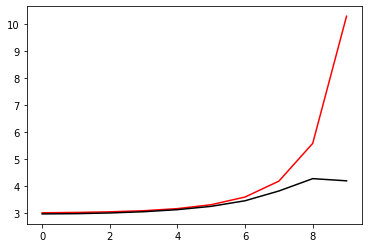

248600 0.0270950520262283
[3.11693777 3.12041866 3.13965192 3.18406525 3.27020252 3.42817602
 3.71230318 4.17256594 4.69301811 4.60608347]


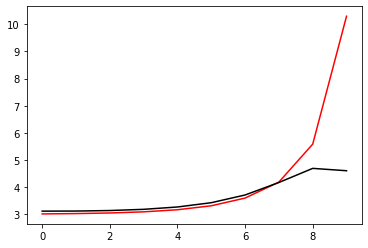

249700 0.014961918304842134
[2.89960566 2.91713546 2.95181127 3.01165986 3.11079525 3.27364273
 3.54323702 3.99297312 4.67422125 4.83807156]


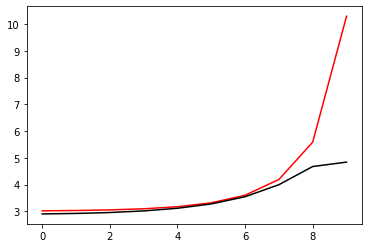

250800 0.013692434871269563
[2.93685371 2.93796025 2.96059953 3.01085758 3.09749582 3.23576375
 3.44316551 3.72776786 4.18426975 4.17410143]


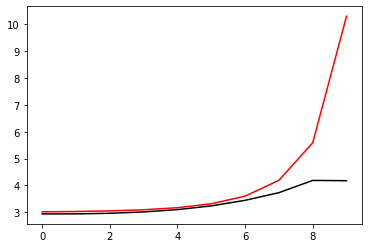

251900 0.04770005008631952
[2.93480986 2.94831427 2.97828927 3.03415095 3.12712236 3.27296303
 3.49260588 3.80807937 4.29285494 4.2662087 ]


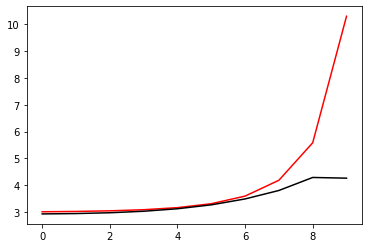

253000 0.025212718383504192
[3.00713357 3.01651618 3.04243417 3.09367543 3.18216416 3.32551901
 3.54963736 3.89071167 4.40299222 4.38399099]


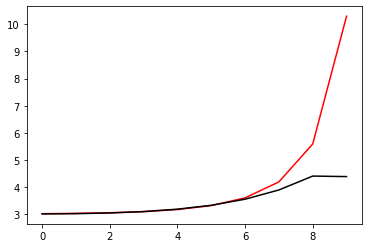

254100 0.03183384057107705
[2.97478175 2.98247895 3.00473636 3.0513087  3.13649549 3.28202172
 3.52227764 3.91014304 4.49379901 4.55949347]


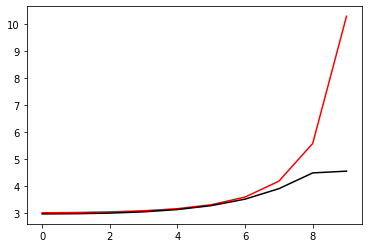

255200 0.020056341976971103
[2.95037495 2.95820229 2.97925283 3.02042858 3.09306846 3.21652797
 3.42470989 3.77559705 4.3255314  4.32150437]


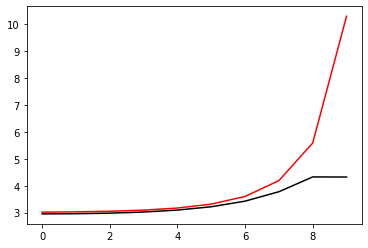

256300 0.02157362426992805
[2.95588355 2.96193893 2.98048226 3.02191983 3.09990964 3.23675604
 3.47232644 3.87509283 4.50950195 4.52814533]


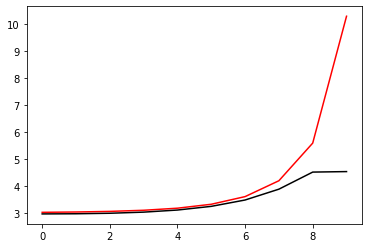

257400 0.03624528433679187
[2.94811899 2.9598068  2.9864914  3.03741683 3.12824672 3.28513137
 3.55225653 4.00329651 4.71270754 4.54401992]


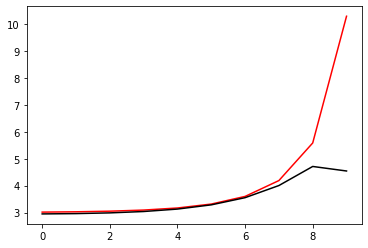

258500 0.06023020527158848
[2.91808559 2.90238131 2.89906302 2.91585084 2.96664817 3.06890937
 3.23953052 3.49351495 4.02387181 4.1342896 ]


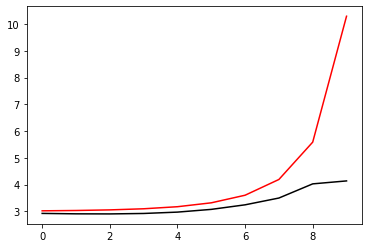

259600 0.031111338342808506
[2.94739232 2.94474589 2.94562233 2.96172351 3.00810325 3.10345218
 3.27122894 3.5456593  4.06613524 4.06885225]


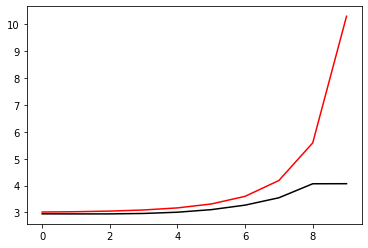

260700 0.014651438095998047
[2.91998931 2.92306037 2.93388877 2.95950656 3.0125223  3.11353486
 3.29504942 3.61067167 4.15856202 4.14310949]


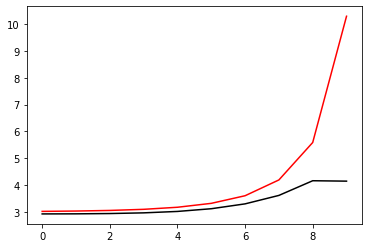

261800 0.011024084208379928
[3.07587827 3.08008933 3.09284862 3.12263583 3.18044792 3.28475953
 3.4698551  3.79803674 4.34827602 4.35440414]


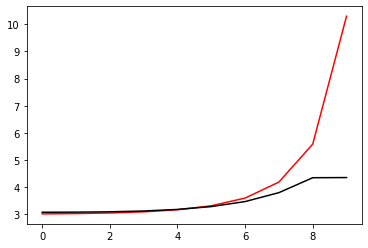

262900 0.041524367864439186
[3.04081698 3.04966945 3.07162932 3.11365146 3.18769315 3.31464421
 3.53321295 3.91420772 4.53667414 4.55035523]


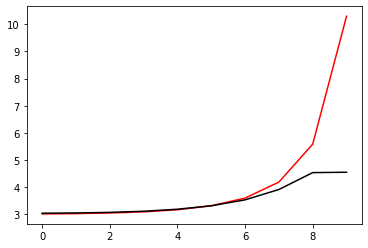

264000 0.02384848666435505
[2.96935872 2.97345575 2.99386505 3.03992175 3.12646756 3.2796769
 3.5466702  4.00397265 4.72703227 4.66913346]


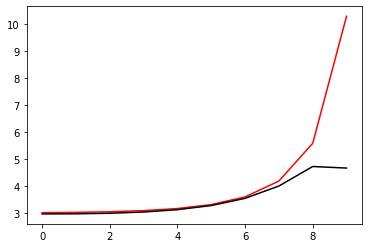

265100 0.03079672347428883
[2.90442552 2.91337872 2.93183968 2.97141398 3.0526896  3.19788269
 3.45872095 3.9235357  4.68224489 4.74483538]


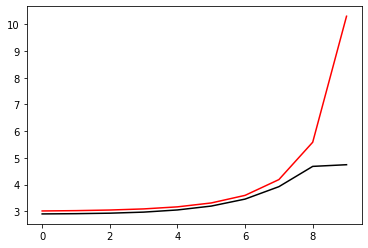

266200 0.02106377313218635
[2.9553968  2.97921134 3.02174992 3.08498932 3.18051634 3.32367097
 3.52452859 3.77444983 4.19859018 4.19289632]


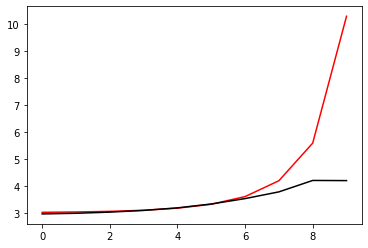

267300 0.021381549996361028
[2.96829678 2.98135315 3.01299726 3.06951372 3.15968621 3.29769278
 3.50703292 3.83734874 4.29931252 4.31217708]


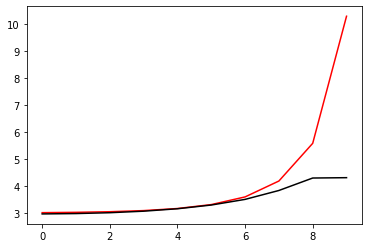

268400 0.03718912465154299
[2.96081211 2.971063   2.99662439 3.04618314 3.13293047 3.27897474
 3.52814991 3.93814012 4.49701164 4.41533184]


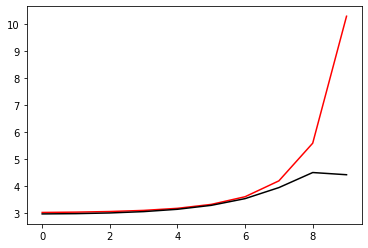

269500 0.04679533815111467
[2.9825194  2.99622279 3.02626899 3.08207652 3.17973493 3.34728838
 3.63115544 4.08380551 4.71104561 4.67157357]


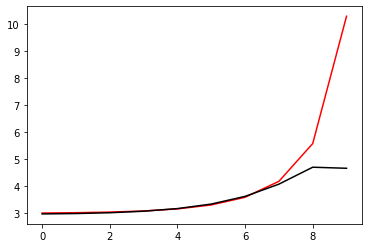

270600 0.015046070085523831
[3.08718714 3.09552064 3.12116028 3.17609129 3.27595315 3.44810142
 3.73229111 4.18708571 4.86940022 4.83333374]


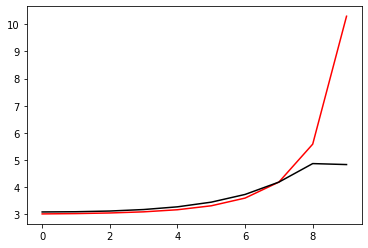

271700 0.021222508446876592
[3.01837559 3.03468631 3.07159787 3.13298723 3.2282935  3.36937234
 3.56188118 3.80391888 4.15727812 4.14546799]


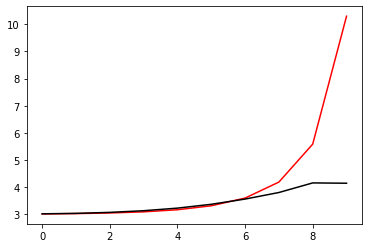

272800 0.011278947936575983
[3.02370447 3.03326943 3.06003524 3.11190489 3.19803473 3.33361245
 3.54746092 3.87545059 4.26857755 4.28093643]


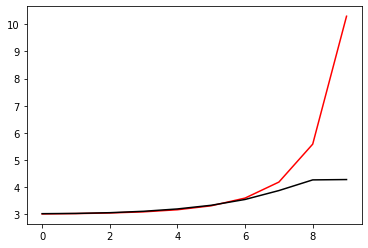

273900 0.0410481153018691
[3.06349555 3.07056031 3.09125265 3.13559418 3.21830623 3.36264308
 3.59977848 3.96745409 4.45066879 4.45397044]


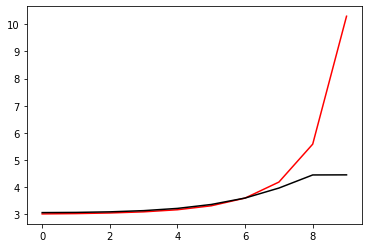

275000 0.02377109440318444
[2.99432031 3.00095131 3.02265309 3.06817099 3.1517375  3.2961573
 3.54475587 3.99450635 4.66326678 4.59794522]


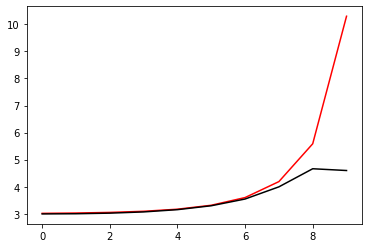

276100 0.030935835460768075
[2.94695634 2.9360012  2.93538259 2.96046775 3.02869903 3.16750061
 3.41792067 3.8141856  4.38299141 4.40200017]


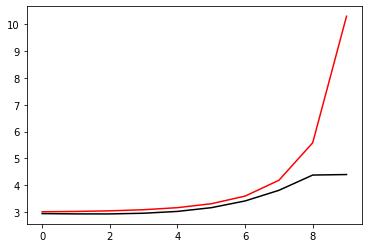

277200 0.020959899906786886
[2.98108596 2.98479789 2.99757139 3.02982369 3.09888156 3.2327344
 3.47547409 3.89047749 4.51725253 4.53191217]


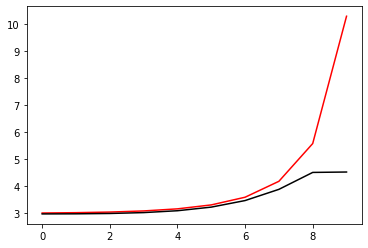

278300 0.02191633167687284
[2.93457186 2.94984585 2.98386146 3.04130184 3.13316977 3.28236066
 3.53116422 3.95188486 4.60970472 4.62885838]


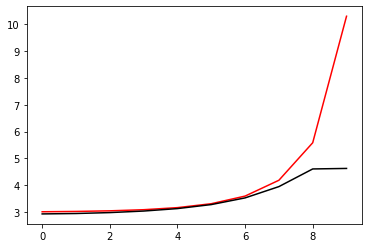

279400 0.03608893595790126
[2.94134671 2.95225067 2.97975879 3.0330867  3.12742164 3.28777905
 3.55761309 4.01205141 4.72796709 4.61749903]


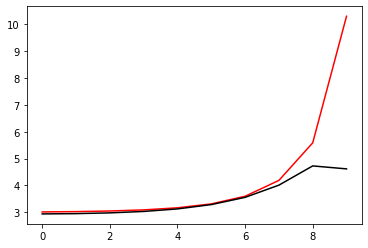

280500 0.04392125522624779
[2.94169212 2.95337056 2.98606636 3.04616393 3.14961662 3.32453449
 3.61761633 4.10490075 4.86097807 4.86140875]


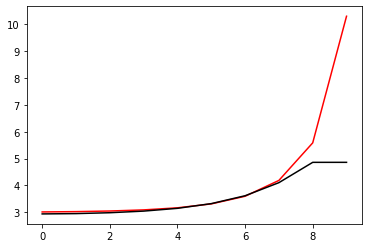

281600 0.0310462997795328
[2.9675603  2.94804134 2.94165149 2.95683594 3.0067169  3.10752591
 3.2772989  3.53670661 4.06240639 4.10476147]


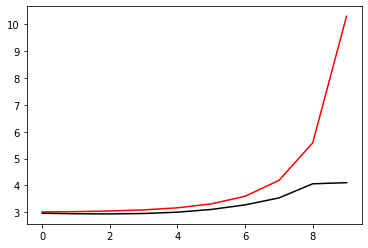

282700 0.014293003783410245
[2.92856523 2.92633738 2.9291687  2.94891611 3.00082475 3.10390307
 3.28302455 3.57614935 4.11670805 4.10888161]


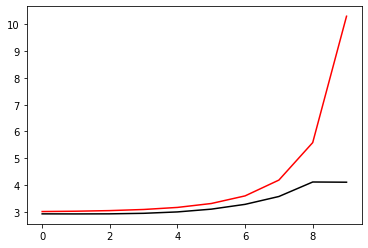

283800 0.019277623126218883
[2.93123039 2.93432242 2.94567487 2.97270498 3.02802317 3.13218523
 3.31771028 3.63838824 4.19021474 4.19970661]


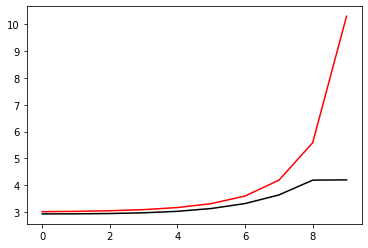

284900 0.04069580272239485
[3.08246999 3.08689312 3.1004207  3.13048876 3.18853136 3.29327935
 3.4790586  3.80803658 4.35880193 4.36191832]


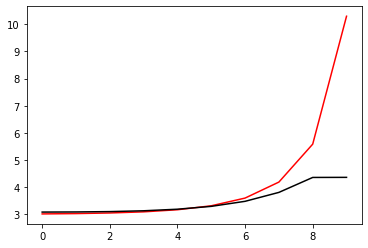

286000 0.024000096567522628
[2.97513223 2.98222032 3.00448258 3.04964231 3.13087014 3.27112259
 3.51150593 3.92367924 4.58329791 4.52793228]


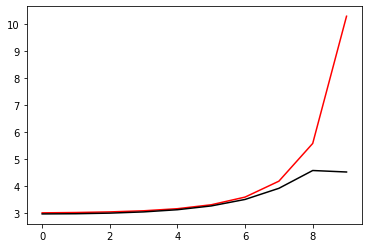

287100 0.03175162552892682
[2.98670432 2.98713345 2.99904    3.0333558  3.10566188 3.23991657
 3.47799586 3.89380954 4.56569346 4.5461718 ]


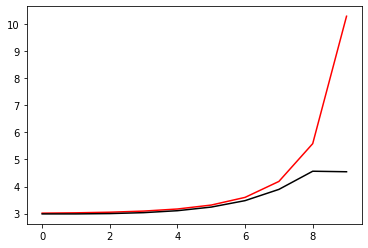

288200 0.02048015150469198
[2.96673419 2.97586992 2.99707766 3.03497411 3.09949433 3.2089782
 3.39704031 3.72720408 4.28635743 4.29502979]


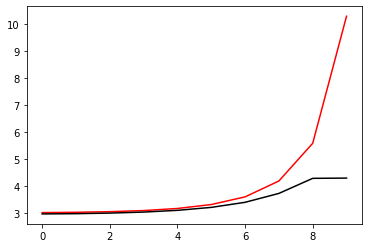

289300 0.02097126252236203
[2.94728418 2.95519844 2.9752968  3.01266075 3.07576112 3.18029507
 3.35618632 3.66095046 4.17062364 4.20664246]


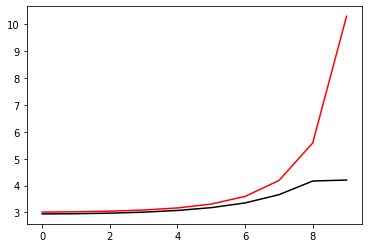

290400 0.040190445504302647
[2.94850229 2.96088785 2.98713606 3.03222638 3.10478483 3.22041568
 3.40756268 3.71657183 4.20398551 4.09182317]


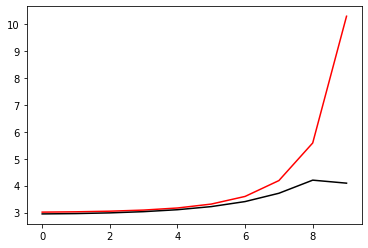

291500 0.04494749736651481
[2.97135907 2.98023998 3.00385701 3.05044269 3.13289054 3.27299672
 3.50916655 3.90395784 4.50439512 4.44149076]


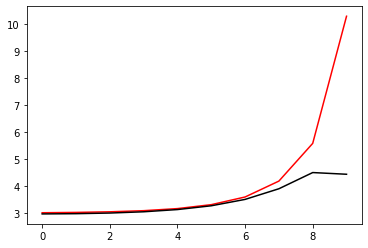

292600 0.011169656387298499
[3.05655454 3.06234119 3.07948774 3.11495352 3.17926663 3.2904344
 3.48026545 3.8021036  4.30367482 4.22172907]


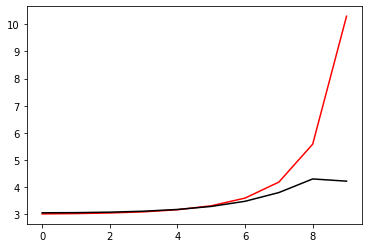

293700 0.02139293162365931
[3.0528367  3.05826041 3.07388511 3.10879278 3.17733013 3.30336641
 3.52810382 3.91920146 4.5295987  4.57485078]


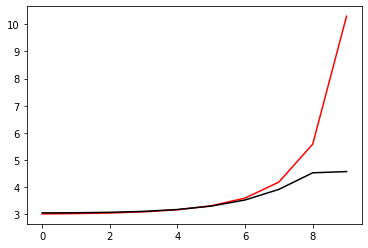

294800 0.011782926294675419
[2.96996246 2.97735111 2.99771215 3.03982938 3.11788086 3.25729426
 3.50359878 3.93520278 4.62788424 4.68254289]


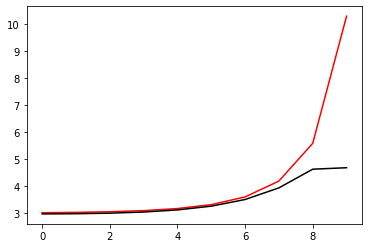

295900 0.04186760696179087
[3.02109577 3.0326314  3.05995581 3.11008933 3.19516057 3.33691742
 3.5772755  3.99607818 4.69091125 4.72291217]


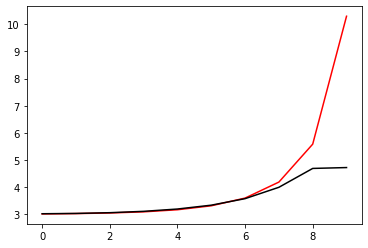

297000 0.5735580326826758
[3.2231127  3.26016948 3.31926924 3.40424234 3.52403396 3.69525895
 3.94259084 4.30932088 4.88537381 4.89267324]


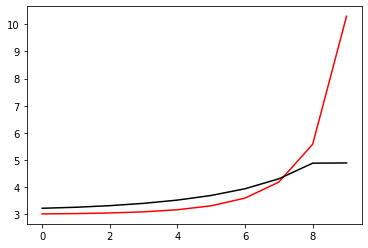

298100 0.032214994993539615
[2.98121517 2.99031504 3.0171425  3.07140434 3.1640276  3.31131396
 3.54092874 3.90214104 4.47599584 4.4681293 ]


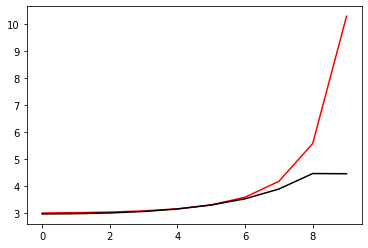

299200 0.021121953005380438
[2.97192756 2.98038097 3.00351265 3.05103966 3.13688609 3.28217435
 3.52129323 3.91219729 4.52363027 4.53549587]


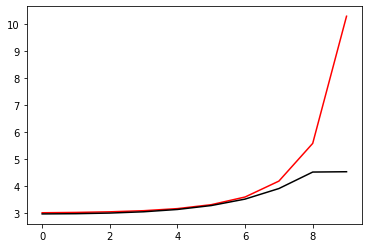

300300 0.021807744766708034
[2.93992904 2.94756687 2.96809781 3.01146647 3.09340837 3.23926975
 3.49228447 3.92506328 4.60953987 4.62691965]


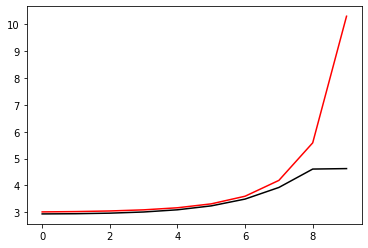

301400 0.03593305256595255
[2.93691829 2.949961   2.97925124 3.03372933 3.1282458  3.28908686
 3.56219138 4.02661472 4.76485363 4.59876638]


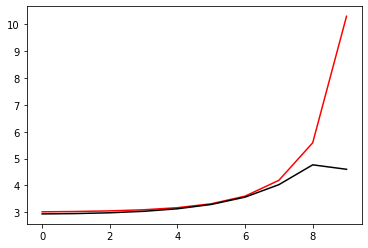

302500 0.047621199419301825
[2.94946232 2.96177743 2.9876114  3.03469515 3.11433106 3.24306232
 3.44901528 3.79456575 4.4564073  4.37852801]


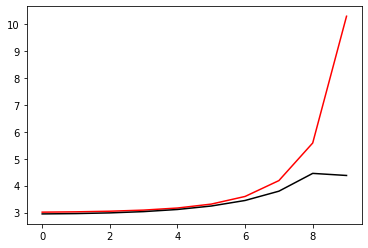

303600 0.012140470869375069
[3.0570621  3.06964654 3.09780503 3.14982994 3.24072452 3.39507859
 3.65311299 4.07993542 4.7451254  4.72554074]


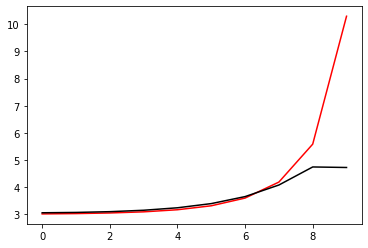

304700 0.02097622822843235
[3.09040952 3.08082593 3.07593766 3.09049109 3.13870354 3.24008646
 3.42850984 3.76542147 4.32814145 4.31889529]


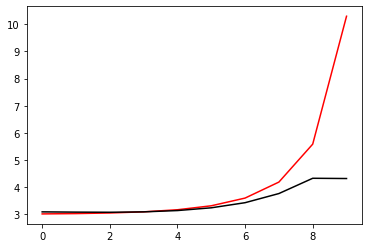

305800 0.011087302961353965
[3.07635008 3.07498411 3.07816066 3.09630901 3.14449151 3.24681611
 3.44357015 3.80343461 4.40395683 4.42159169]


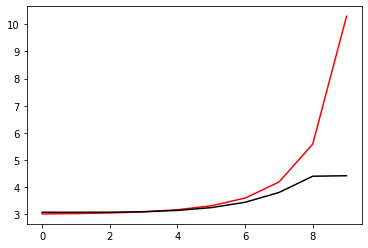

306900 0.04685176589718426
[2.88984624 2.91316685 2.94998319 3.00557178 3.09376879 3.23948694
 3.48780953 3.91709643 4.60971842 4.49544197]


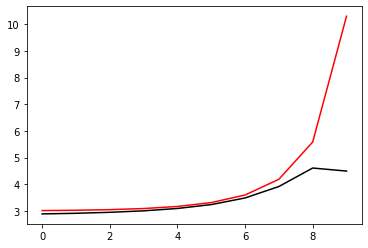

308000 0.02432418956697997
[3.00978519 3.01387443 3.03358822 3.07687852 3.15753381 3.29975705
 3.54745385 3.97847066 4.67837293 4.62793022]


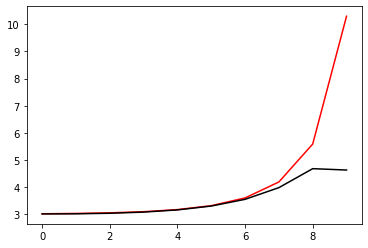

309100 0.03170086550719026
[2.9449408  2.95241471 2.97081464 3.01493073 3.09897676 3.2488479
 3.51256604 3.97654719 4.73282225 4.79745409]


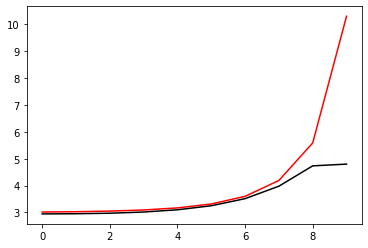

310200 0.02061155544721583
[3.09353267 3.08103046 3.0645687  3.05782872 3.07601932 3.13798279
 3.27394014 3.54474575 4.07773079 4.09324137]


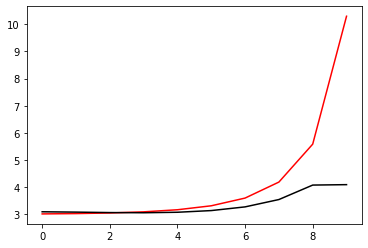

311300 0.02070577248272753
[2.95074948 2.94850571 2.94661004 2.95114616 2.97346259 3.03306404
 3.16506211 3.4362479  3.94827846 3.95056653]


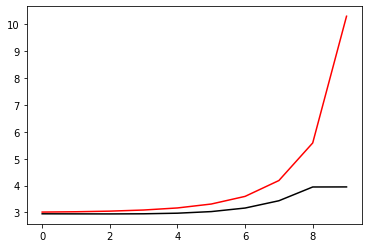

312400 0.044505273346341974
[2.94474898 2.94940497 2.96079676 2.98509718 3.03312568 3.12468932
 3.29671145 3.61673036 4.16810614 4.05539371]


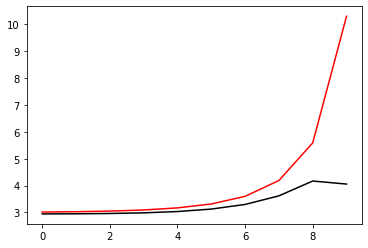

313500 0.045008419777111716
[2.95512013 2.96381329 2.98821842 3.03522157 3.12002732 3.26823064
 3.52279383 3.95130217 4.60811677 4.56123041]


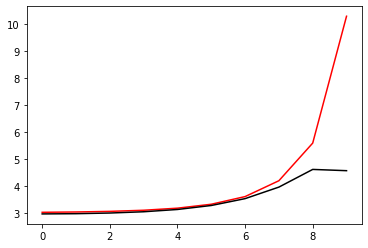

314600 0.018358773764605492
[3.04027821 3.01772355 3.00553539 3.01370831 3.05299529 3.14204036
 3.31470477 3.63250564 4.16294503 4.16339743]


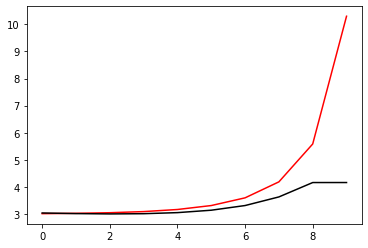

315700 0.020878832699925402
[3.07601892 3.0664666  3.05914523 3.0677564  3.10756098 3.19943532
 3.37889642 3.70894405 4.25880661 4.26702439]


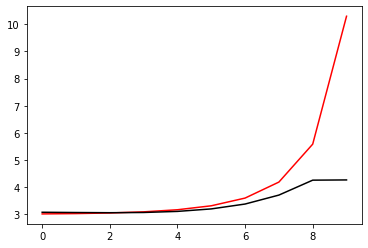

316800 0.010973185569918349
[3.08859882 3.08422085 3.0826743  3.09462691 3.13535486 3.22878838
 3.41441937 3.75939292 4.33690801 4.32524603]


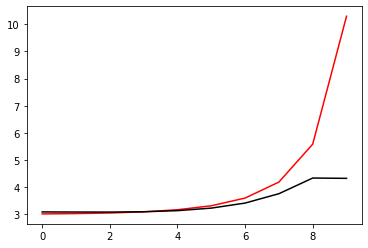

317900 0.041280430891264694
[3.0694535  3.07046638 3.07632543 3.09585323 3.14322764 3.24244828
 3.43628305 3.79927328 4.41323625 4.45808494]


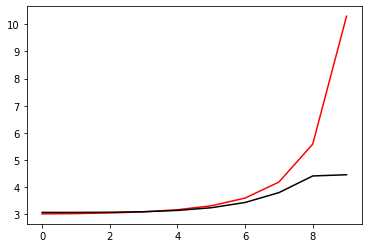

319000 0.15326940480714027
[2.73381443 2.74439783 2.76545986 2.80410112 2.87375718 2.99842335
 3.22334965 3.63282901 4.32772003 4.58581794]


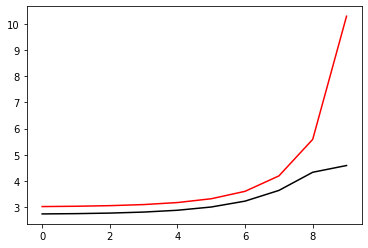

320100 0.03283747429476773
[3.00082939 3.01282618 3.0396151  3.08289447 3.14903415 3.2502416
 3.40572969 3.66553468 4.0425167  4.02353915]


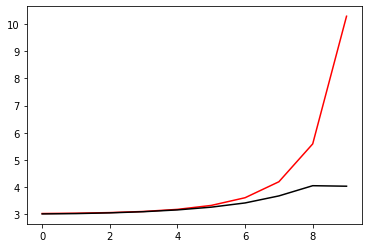

321200 0.020799864317495507
[2.98996845 2.99584538 3.01366335 3.05059487 3.11660488 3.22920815
 3.42213729 3.75915899 4.24646588 4.27029844]


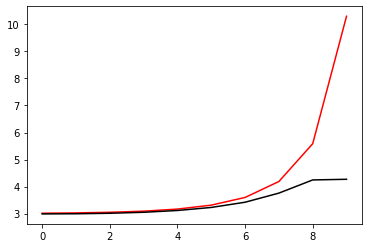

322300 0.021371892557542547
[2.9547539  2.96050152 2.97655249 3.01157276 3.078904   3.20045646
 3.41518237 3.79499726 4.44563414 4.47959504]


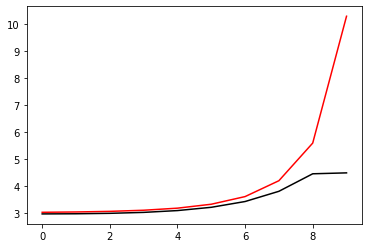

323400 0.035836728341747684
[2.94453273 2.9564432  2.98251014 3.03270085 3.12459575 3.28864048
 3.57808893 4.06648574 4.80004831 4.62219632]


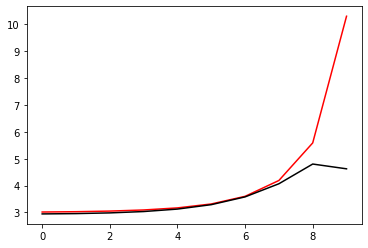

324500 0.051308318797982144
[2.94064005 2.93553592 2.93619568 2.95424922 3.00091365 3.09383997
 3.26124452 3.56634775 4.24143944 4.26724552]


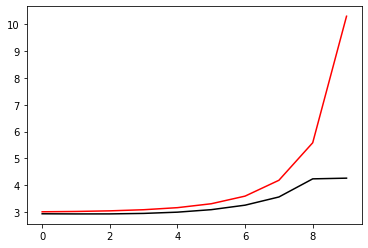

325600 0.013949055605491766
[3.10399594 3.10855794 3.12493959 3.16167941 3.23382414 3.36749455
 3.60695083 4.0252792  4.69339141 4.62326453]


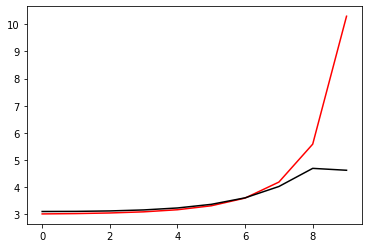

326700 0.0213833817319343
[3.03519653 3.04901051 3.07822077 3.12745713 3.20707997 3.33586928
 3.54727179 3.89889719 4.45483771 4.46821256]


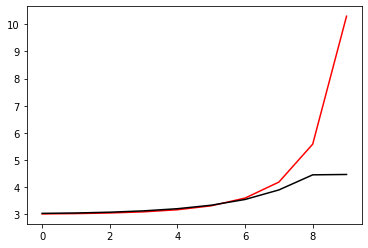

327800 0.011689993425012217
[3.06459482 3.07582598 3.10259756 3.15197775 3.23621214 3.37707528
 3.61352015 4.01395617 4.64403157 4.67547243]


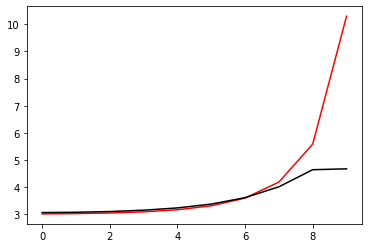

328900 0.06423868338987376
[3.16456094 3.16084451 3.16248986 3.17997003 3.22770942 3.32677233
 3.51241019 3.84665922 4.400006   4.3732273 ]


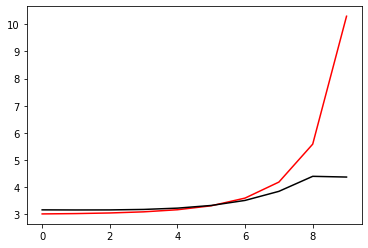

330000 0.030244039009193587
[2.95213819 2.9598089  2.97640117 3.0087143  3.06902892 3.17847713
 3.37476398 3.72418682 4.30110497 4.29082037]


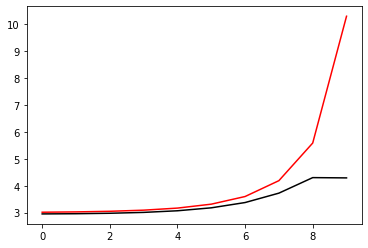

331100 0.03156944111510139
[2.96968999 2.97524555 2.9949662  3.03754878 3.11485477 3.24814293
 3.47647713 3.86853472 4.4959653  4.51788335]


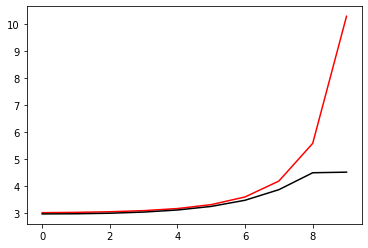

332200 0.018326027939803816
[2.95163046 2.93666925 2.93442058 2.95250087 3.00090812 3.0974705
 3.27587821 3.60014425 4.14600113 4.2198126 ]


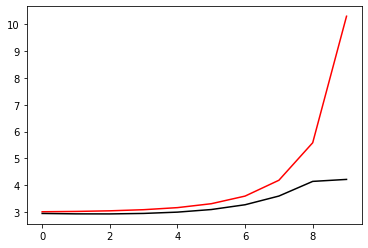

333300 0.021086398387514173
[2.93175618 2.9335922  2.94149384 2.96475064 3.01719143 3.11915591
 3.30587114 3.64194352 4.20429744 4.21037647]


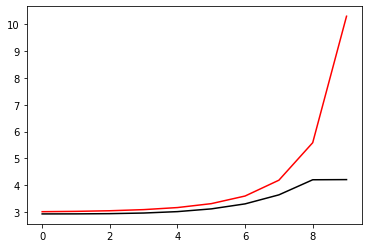

334400 0.039328986766289875
[2.94888005 2.958624   2.97929437 3.01721759 3.08447019 3.20281448
 3.41089716 3.77634924 4.37585673 4.27994078]


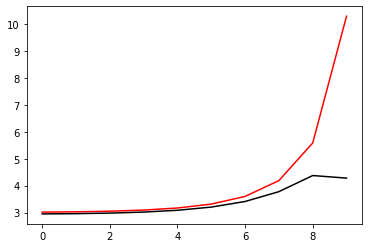

335500 0.04521480132571736
[2.98005108 2.98756474 3.00733878 3.04685808 3.11937812 3.24779302
 3.47263347 3.86465007 4.50133846 4.45747769]


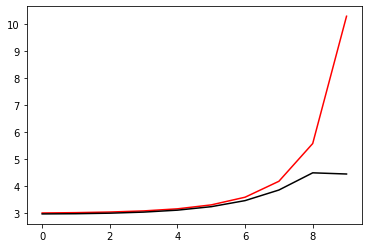

336600 0.013314838466644423
[3.08142205 3.09270682 3.12133789 3.17534558 3.26768737 3.42053205
 3.67410657 4.10006381 4.77416433 4.74573017]


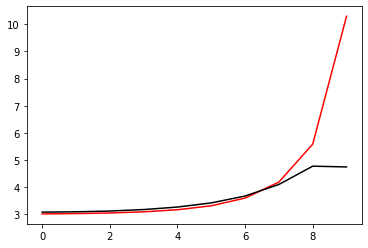

337700 0.021817381601346927
[3.01545242 3.02833379 3.05709294 3.10908897 3.19783504 3.34618188
 3.59423945 4.01096861 4.66317356 4.80810859]


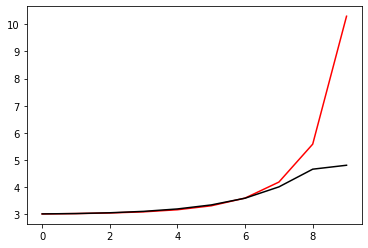

338800 0.011785093409041453
[3.02437246 3.03587111 3.06318041 3.11342749 3.19865613 3.34099977
 3.5819199  3.99805307 4.67616503 4.70368249]


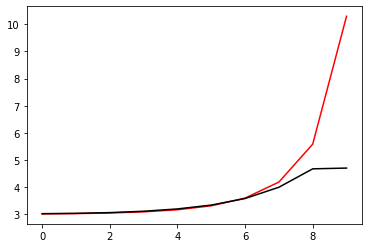

339900 0.041730844817248015
[3.01303312 3.02651425 3.05645645 3.10708581 3.19008541 3.32445195
 3.54603507 3.92559219 4.5602519  4.59154624]


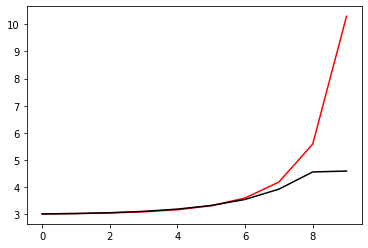

341000 0.02361988447314236
[2.99321525 2.99689482 3.01669325 3.06068128 3.14253926 3.28747897
 3.54232298 3.98807649 4.70552705 4.63976733]


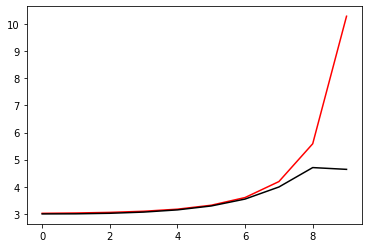

342100 0.03372511713173465
[2.97578293 3.00433444 3.05017099 3.11571327 3.21154583 3.35165732
 3.53292088 3.68612359 4.12372676 4.15279165]


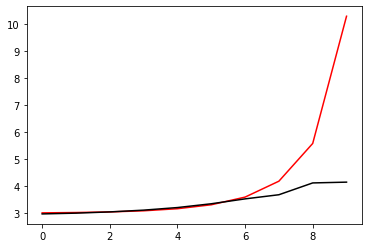

343200 0.02109460992858423
[2.98297953 2.99769001 3.0324673  3.09157722 3.18180531 3.3136782
 3.50177962 3.79635893 4.21058075 4.21065432]


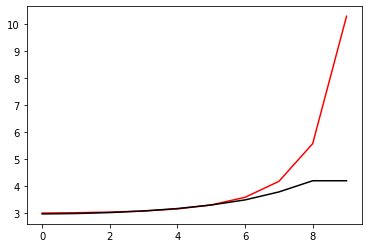

344300 0.02127653249666422
[2.97263218 2.98224287 3.00709693 3.05477522 3.13507579 3.26304489
 3.46623366 3.80718823 4.31763417 4.32982377]


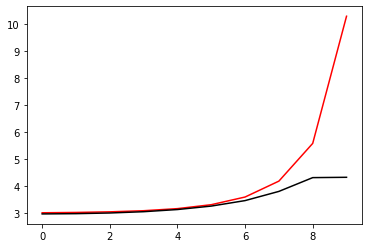

345400 0.03661153957988483
[2.95341079 2.96338916 2.98721068 3.03427751 3.11993499 3.27116435
 3.54532709 4.00102887 4.6057499  4.4842247 ]


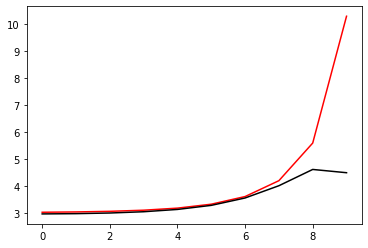

346500 0.045150469369468794
[2.96954521 2.98205353 3.0122278  3.06822826 3.16728756 3.342309
 3.64538976 4.12344871 4.79860661 4.79828439]


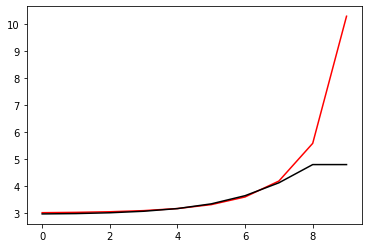

347600 0.012811966335899538
[3.07035932 3.07643055 3.09989524 3.15519639 3.25737432 3.43502004
 3.73146988 4.21277581 4.94412474 4.89835265]


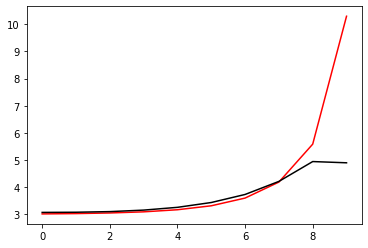

348700 0.013742861612674368
[2.94518948 2.92854084 2.92395055 2.94253764 2.99846563 3.10910452
 3.29348707 3.55694826 4.10794208 4.11594569]


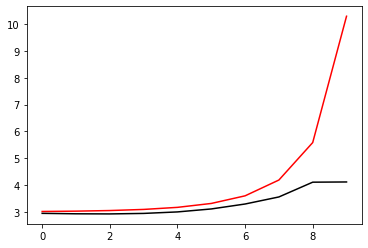

349800 0.01997303693620352
[2.93347281 2.93243066 2.93693635 2.95862891 3.01329802 3.12089697
 3.30641371 3.60234326 4.15270667 4.15162742]


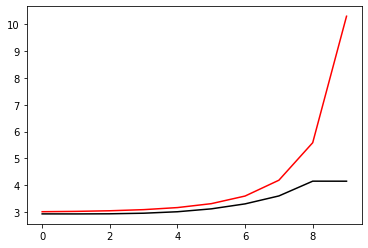

350900 0.05027530528035926
[2.89724808 2.9188364  2.94873647 2.99455186 3.06937975 3.19471305
 3.40470381 3.7544315  4.34006795 4.26166563]


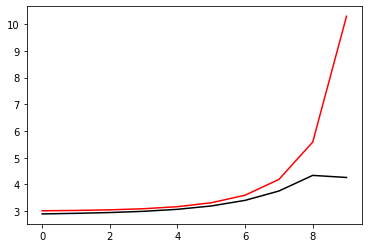

352000 0.04466356105415247
[2.89171727 2.90225379 2.92496688 2.96524119 3.03244498 3.14346836
 3.33002214 3.65154979 4.18647098 4.25256325]


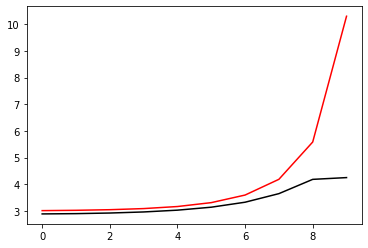

353100 0.03136189902163753
[2.97608973 2.98112846 3.00088738 3.04085657 3.11084033 3.22893996
 3.42833546 3.76798271 4.31542373 4.27532556]


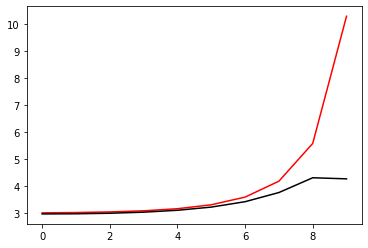

354200 0.01706241885637792
[2.90055914 2.91197484 2.93757797 2.98088883 3.05042033 3.16200607
 3.34458957 3.65111898 4.14424371 4.1196237 ]


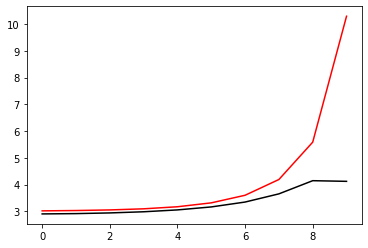

355300 0.02141104516226075
[2.96285725 2.97390606 3.00092944 3.05057696 3.13287865 3.26578928
 3.48180973 3.83708572 4.38551275 4.4029702 ]


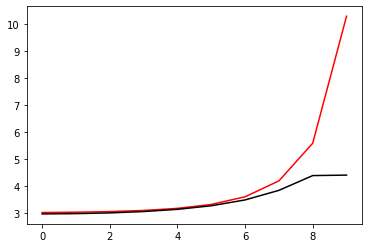

356400 0.03880240359939951
[2.95311185 2.96802231 2.99896973 3.05050566 3.13123146 3.2568141
 3.455056   3.7734368  4.25994729 4.1538109 ]


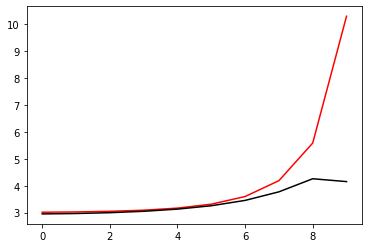

357500 0.04717093263189713
[2.97712118 2.99611918 3.03268845 3.09433573 3.19299494 3.34851952
 3.59525737 3.98843708 4.56982183 4.47884789]


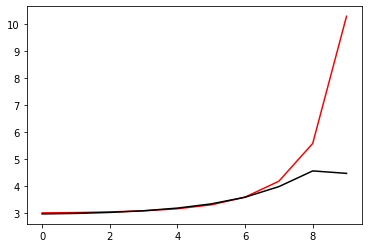

358600 0.012073359196814957
[3.03169813 3.04519892 3.07586614 3.13164572 3.22712878 3.38634881
 3.6499212  4.08422765 4.7437859  4.75857521]


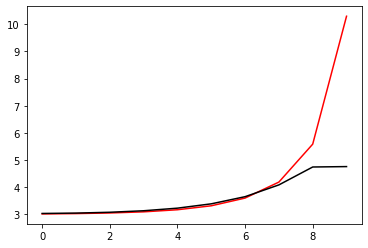

359700 0.014720285856561644
[2.8983744  2.91371916 2.94716079 3.00613519 3.10407058 3.26637893
 3.54002472 4.00740687 4.74860445 4.93844065]


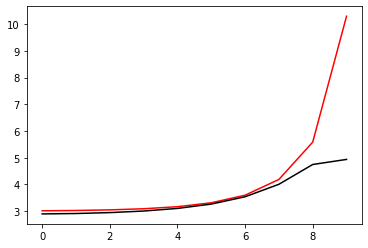

360800 0.01251169544857549
[3.01763638 3.03723463 3.08152922 3.15730743 3.27453448 3.45260468
 3.72890956 4.17234801 4.86166274 4.90591008]


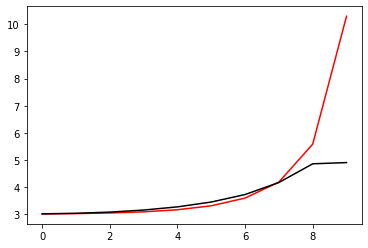

361900 0.08068241880161976
[3.14407805 3.1543601  3.18135174 3.23437042 3.32452444 3.47434911
 3.72290121 4.14806282 4.84685445 4.83882133]


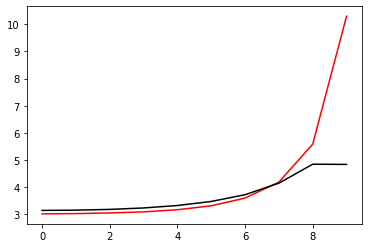

363000 0.026720378076797665
[3.03743795 3.04357241 3.0626479  3.10029983 3.16718945 3.28204026
 3.47960968 3.82624403 4.41446713 4.38024746]


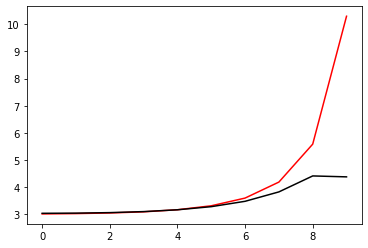

364100 0.030622902884256537
[2.92339829 2.91799346 2.92283441 2.94742799 3.00436486 3.11575241
 3.32095949 3.68909523 4.30135982 4.41792914]


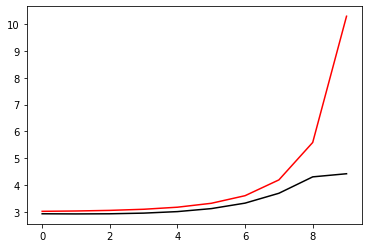

365200 0.020584551308546382
[3.00525409 3.0084109  3.01707403 3.03764847 3.08209695 3.16993379
 3.33474697 3.63636226 4.14838882 4.184725  ]


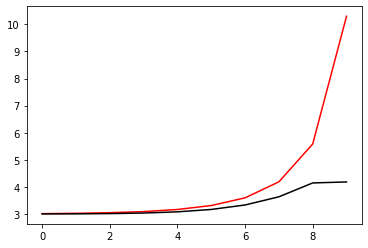

366300 0.02102238278483471
[3.01843589 3.01967227 3.02778744 3.05124955 3.102319   3.20228136
 3.39010388 3.73608988 4.3204207  4.34414643]


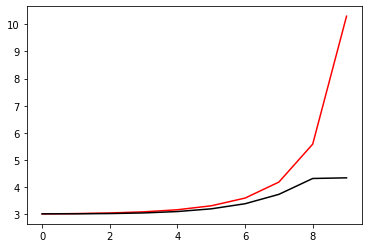

367400 0.037201500884554685
[2.97617348 2.98303753 2.99931148 3.03482277 3.1058019  3.23931824
 3.48335431 3.91885659 4.62605696 4.44659366]


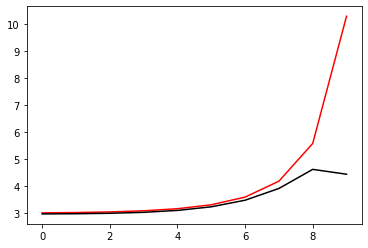

368500 0.0469895307877258
[2.99047003 3.00315439 3.0301723  3.08038459 3.1699002  3.32638326
 3.59751845 4.06323643 4.80671091 4.73693727]


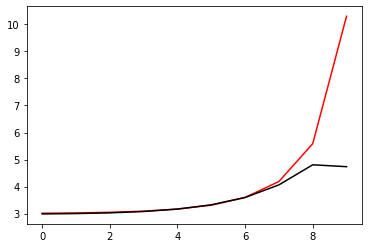

369600 0.012352959054711277
[3.0330284  3.04260297 3.06686602 3.12100614 3.21861903 3.38672389
 3.671484   4.15118346 4.90710932 4.88888383]


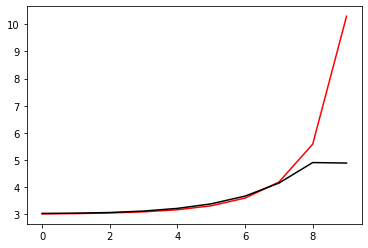

370700 0.02091599166454824
[3.02298553 3.04443869 3.08185552 3.13512356 3.21157658 3.3223493
 3.4762726  3.68101447 4.05551169 4.04842652]


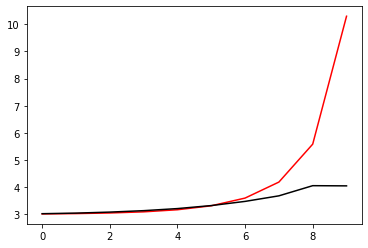

371800 0.011095154377414828
[3.03742438 3.04687066 3.07141068 3.11719113 3.1921686  3.31125156
 3.50401431 3.81642205 4.24137162 4.26244684]


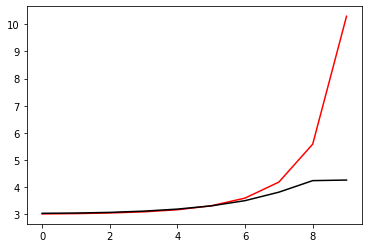

372900 0.041721817497705545
[3.01342234 3.02423125 3.04899195 3.09481314 3.17502318 3.31207475
 3.54328002 3.92507761 4.47588985 4.46939998]


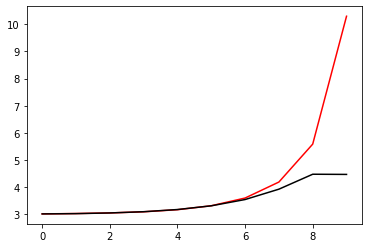

374000 0.024398119332841802
[3.00226854 3.01058545 3.034476   3.08048075 3.16089244 3.29748658
 3.52826021 3.91688126 4.51904024 4.46087888]


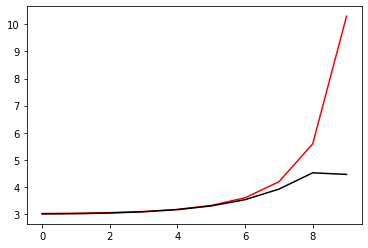

375100 0.03196695520272826
[2.94796508 2.97668109 3.02390608 3.09005297 3.18546776 3.32787807
 3.54170615 3.84885766 4.27785643 4.25222332]


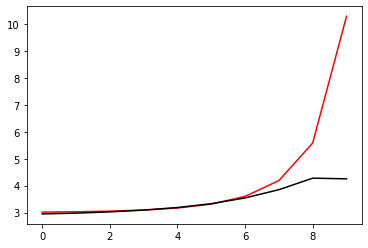

376200 0.02110522374166388
[2.96308144 2.97609715 3.00849038 3.06641225 3.15892375 3.30284713
 3.52928433 3.89200159 4.40984094 4.42262529]


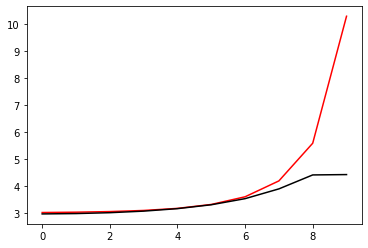

377300 0.021610423069413756
[2.95853057 2.9667451  2.98881679 3.03405253 3.11550412 3.25412992
 3.48760026 3.88674913 4.52593194 4.54955242]


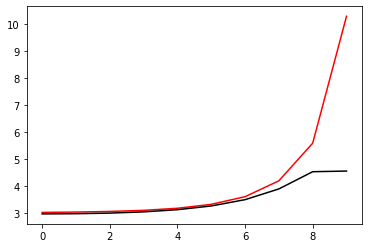

378400 0.03571986627833659
[3.06618343 3.09029439 3.12872934 3.18506355 3.26949507 3.39561377
 3.56284813 3.66480675 3.92437923 3.90677392]


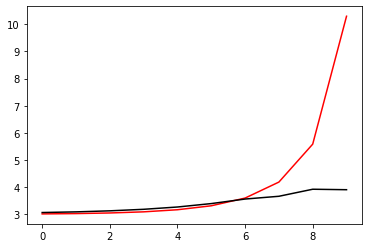

379500 0.05765555458141795
[3.04483414 3.06041669 3.09407829 3.14860773 3.22994873 3.34651574
 3.5079658  3.75031436 4.00285216 3.98853716]


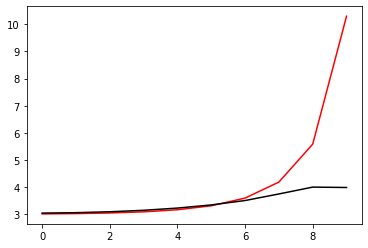

380600 0.011280574552715469
[3.04675746 3.05233776 3.07471577 3.11957523 3.19474938 3.31548567
 3.52646469 3.90909823 4.18968968 4.13878079]


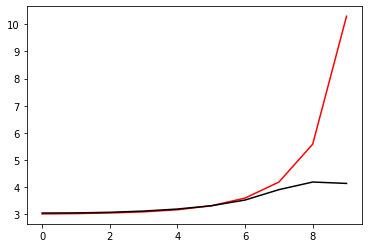

381700 0.021578128036159383
[3.06052444 3.06521126 3.08282393 3.12393442 3.20334633 3.34993886
 3.61370909 4.0340088  4.48719283 4.54219705]


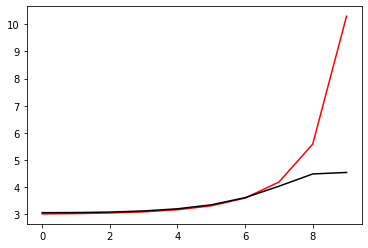

382800 0.013979260318760374
[2.94573617 2.93873688 2.94464782 2.97614732 3.04927364 3.19349084
 3.45685755 3.88588264 4.45858333 4.6009969 ]


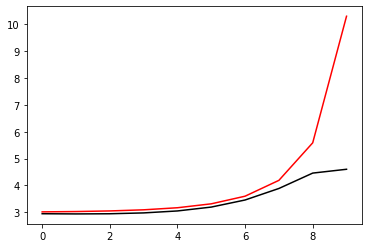

383900 0.041917833596466766
[3.00867452 3.01925747 3.04420801 3.09144248 3.17568795 3.32209689
 3.57357651 3.99711865 4.62748363 4.63862748]


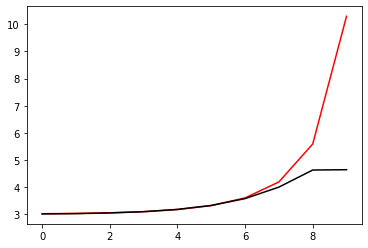

385000 0.030987916956677998
[2.92158087 2.93109353 2.95410686 2.99790825 3.07516128 3.2083518
 3.43973979 3.84636893 4.51306693 4.74281618]


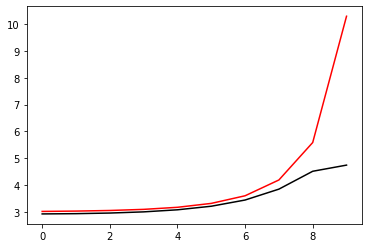

386100 0.03130022126417437
[2.95441265 2.96941038 3.00052296 3.05025844 3.12660754 3.24523974
 3.43575378 3.75768271 4.3040044  4.34470173]


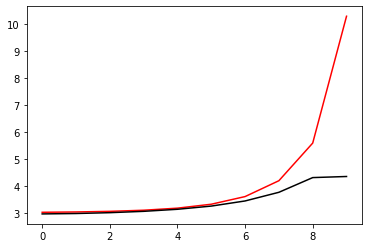

387200 0.020398758604012066
[2.95546996 2.96687435 2.99371106 3.04028232 3.1145334  3.23136116
 3.4187332  3.7290208  4.22829213 4.23463698]


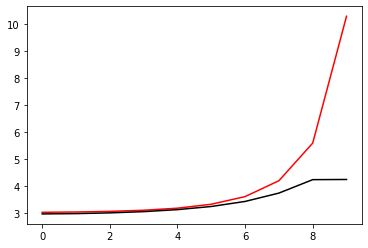

388300 0.021259926512405228
[2.95409702 2.96230591 2.98431577 3.02759205 3.10238911 3.22640121
 3.43210274 3.77732094 4.32295947 4.34384945]


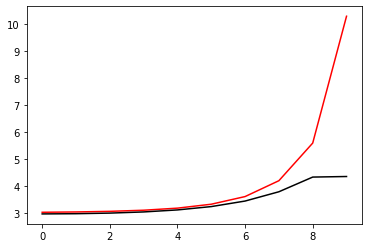

389400 0.040175682397461714
[2.91701118 2.93371962 2.96692538 3.02072682 3.10431282 3.23432002
 3.44032919 3.77126813 4.26648497 4.15188216]


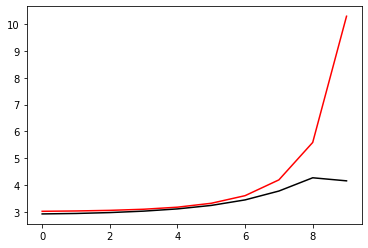

390500 0.04446604146775536
[2.95567924 2.96809869 2.99889997 3.05565102 3.15049757 3.30484651
 3.55724201 3.97025751 4.57793469 4.51803833]


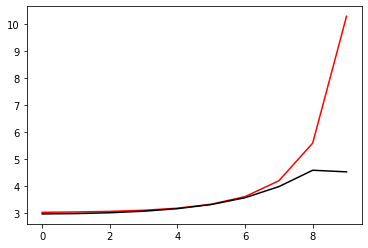

391600 0.012302539714253281
[3.00687881 3.02130077 3.05358642 3.11087046 3.2092763  3.37604416
 3.6569954  4.12599429 4.83847234 4.9037964 ]


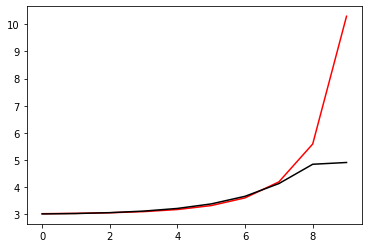

392700 0.022102026071167676
[3.02121864 3.0336822  3.06346692 3.11909938 3.2132551  3.36933702
 3.63159431 4.08245179 4.811649   4.86309204]


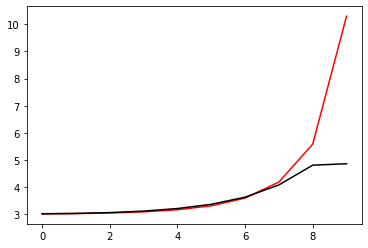

393800 0.010659819714114753
[3.11318516 3.09071728 3.07094269 3.06932352 3.0992246  3.17805832
 3.32052706 3.51272186 3.99881044 4.01018144]


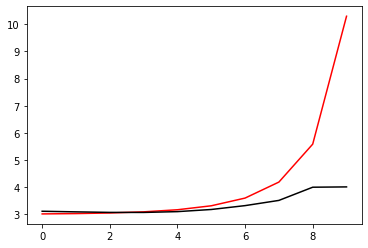

394900 0.04116784852719526
[3.09895292 3.09346457 3.08756625 3.09243608 3.12346439 3.20050829
 3.34893396 3.60552059 4.1011161  4.09534262]


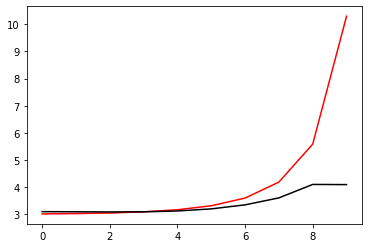

396000 0.026799965433384594
[3.05492146 3.05335838 3.0565178  3.07277598 3.11574446 3.20808111
 3.38876495 3.72440537 4.29970763 4.26520891]


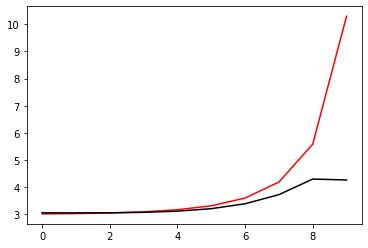

397100 0.03197263839350003
[2.96277261 2.97462179 3.00502145 3.05834296 3.1458552  3.29177287
 3.54048985 3.96829027 4.64865403 4.66104802]


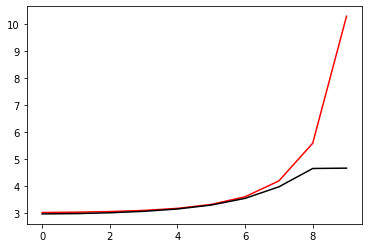

398200 0.01943763485611648
[2.93702617 2.9446272  2.96589177 3.01079316 3.09483167 3.24252035
 3.49900845 3.94560712 4.67072453 4.6667152 ]


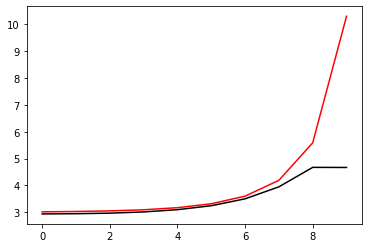

399300 0.07177240095531741
[3.19882683 3.19945044 3.21626734 3.25245641 3.32535017 3.45379507
 3.65535353 3.94307031 4.53568436 4.75882358]


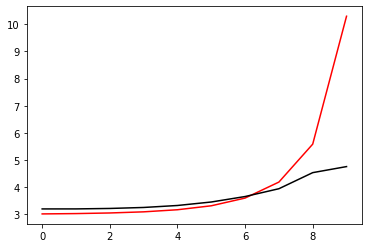

400400 0.037849285551361474
[2.9768192  2.98598314 3.00551141 3.04388646 3.11469551 3.24017866
 3.45929059 3.84229864 4.49599575 4.35538263]


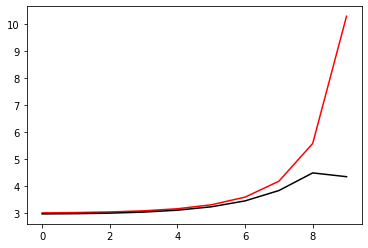

401500 0.04648896748499613
[2.98611752 2.99867953 3.02645172 3.07753434 3.16698305 3.32043298
 3.58189604 4.02536933 4.72847661 4.64913406]


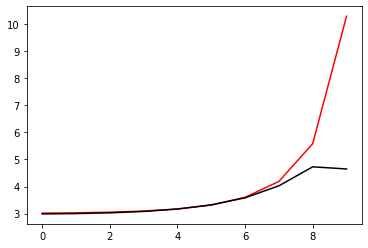

402600 0.01186863693637396
[3.06463887 3.08464505 3.11842732 3.16847077 3.24399258 3.35718712
 3.49660874 3.55217914 3.86189847 3.85659363]


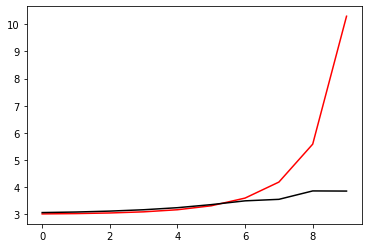

403700 0.020679355123452276
[3.04602349 3.05952463 3.08897321 3.1368912  3.20824949 3.30852377
 3.4398015  3.62913986 3.90346459 3.90861067]


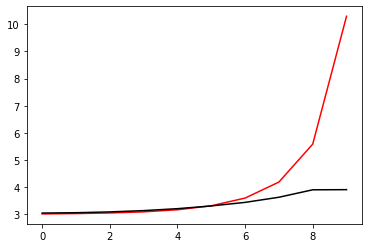

404800 0.01090360313954539
[3.07350131 3.07928425 3.09839757 3.13793325 3.20538542 3.3162696
 3.50716549 3.80808002 4.06980361 4.06952669]


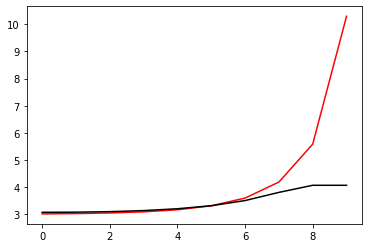

405900 0.04119421791281195
[3.06029129 3.06560365 3.0810529  3.11552072 3.18251869 3.30412334
 3.51176918 3.83843456 4.27713448 4.30510261]


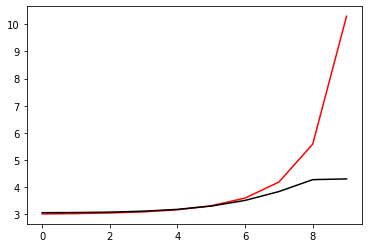

407000 0.023540781327690514
[2.96288486 2.97836699 3.01518999 3.07727494 3.17862086 3.34583942
 3.62214403 4.064602   4.64521181 4.62542864]


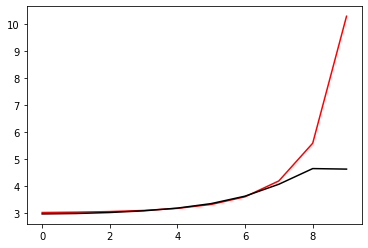

408100 0.03176065503973215
[2.94975771 2.95865654 2.98202495 3.03144303 3.11970996 3.27025086
 3.52659649 3.9687226  4.66712373 4.73030976]


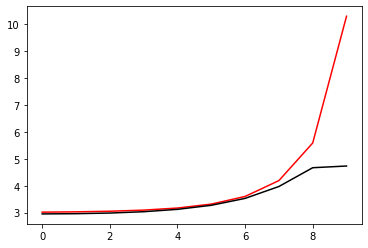

409200 0.021324340832605045
[3.04878003 3.07437034 3.11752162 3.18468597 3.2879081  3.44210442
 3.63216343 3.72829171 4.13787426 4.15044583]


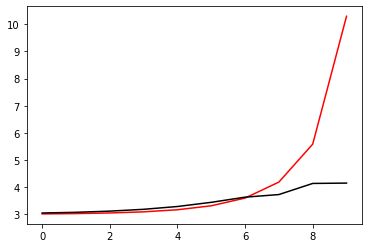

410300 0.02121725532016482
[3.04888644 3.0666971  3.10613035 3.17144373 3.26997925 3.40997886
 3.59670912 3.85583115 4.20030271 4.20762423]


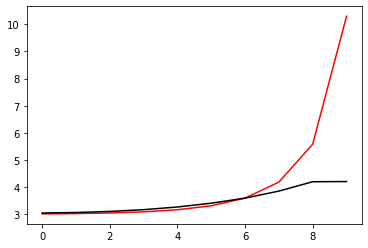

411400 0.038227783721353735
[2.97244256 2.9874223  3.02216968 3.08181304 3.17270898 3.30572878
 3.51005245 3.85126263 4.29461347 4.24106798]


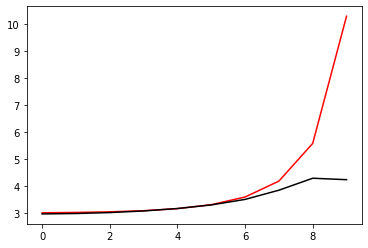

412500 0.04492821538557741
[2.96925679 2.9807525  3.00878041 3.06153618 3.15321636 3.31111959
 3.59417322 4.05758535 4.57628384 4.57834685]


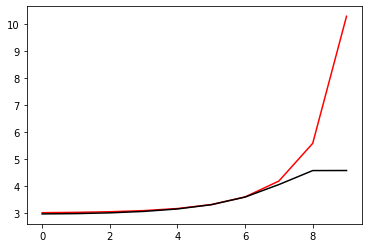

413600 0.012219404090118936
[3.00301438 3.0167576  3.04989657 3.11027786 3.21301209 3.38349723
 3.66284574 4.1105758  4.74337995 4.79343788]


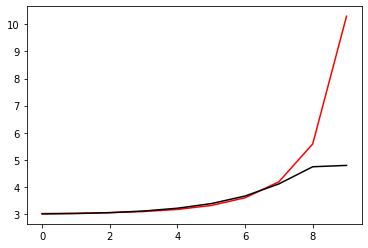

414700 0.02106663680851581
[2.94301153 2.96077674 2.99256898 3.05254599 3.15553397 3.32675967
 3.6114799  4.08628011 4.80793908 4.94811259]


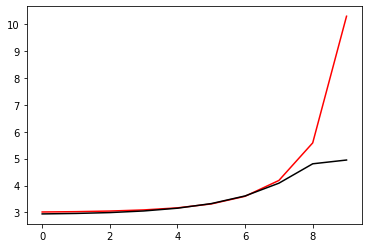

415800 0.011522862902781917
[2.96278192 2.97388804 3.004269   3.06240468 3.15906264 3.31058482
 3.53573574 3.8418101  4.33158989 4.33513675]


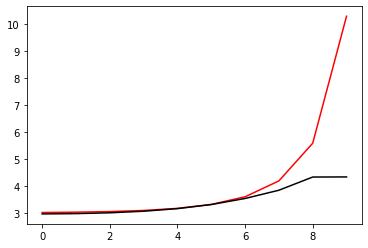

416900 0.041711299451136795
[3.01046394 3.02055271 3.04703212 3.09922677 3.18949847 3.33564084
 3.56317323 3.90630323 4.42481493 4.42771762]


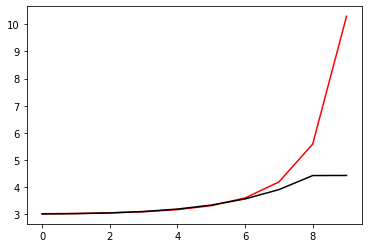

418000 0.025471523754972233
[3.02039108 3.02681913 3.04748927 3.09206163 3.17518594 3.31933073
 3.56054631 3.9548669  4.55164162 4.5170484 ]


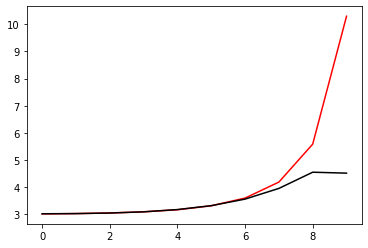

419100 0.03185010541322003
[2.95868377 2.96738666 2.99085889 3.0393439  3.12683722 3.27768519
 3.53531465 3.97354896 4.65942757 4.73325328]


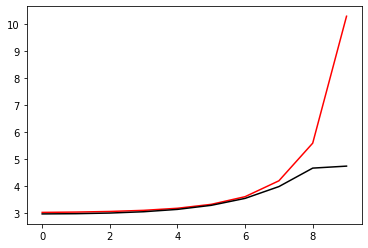

420200 0.019020711950055884
[2.87250186 2.8842439  2.91229228 2.9638615  3.05563128 3.21408095
 3.48672063 3.95635263 4.7059945  4.67263863]


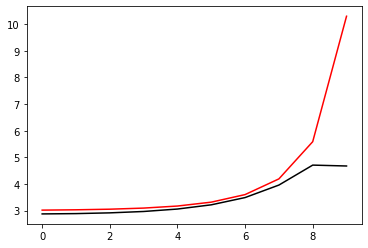

421300 0.02091955145297763
[2.94426588 2.93782661 2.93481689 2.94902397 2.99432148 3.08832383
 3.25704403 3.54791518 4.08598649 4.08974342]


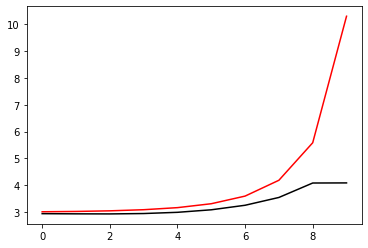

422400 0.044576316117791254
[2.94480468 2.94765382 2.95611004 2.9783108  3.0279358  3.12577091
 3.30430916 3.62001296 4.17264061 4.11979667]


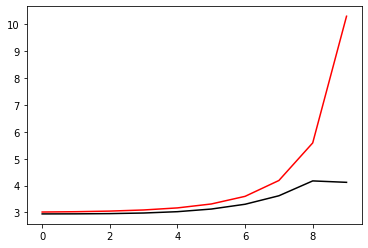

423500 0.04895258012168899
[2.96240317 2.9708347  2.99000162 3.02552986 3.08872238 3.20002995
 3.39623572 3.74248751 4.32254927 4.39811089]


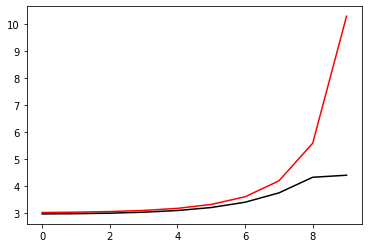

424600 0.011668641989150989
[3.03150572 3.03987082 3.06369701 3.10926532 3.18892376 3.32576306
 3.56064595 3.96446964 4.61436932 4.63815476]


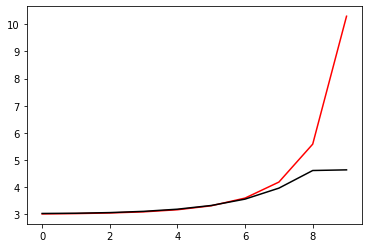

425700 0.01840020438342623
[2.92924214 2.94668035 2.97476351 3.02856879 3.12063394 3.27399279
 3.53171832 3.96929293 4.66437958 4.8012519 ]


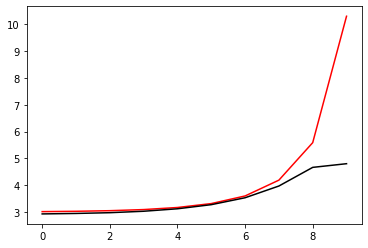

426800 0.011861624146551036
[3.03846153 3.05166061 3.08159656 3.13767647 3.22876044 3.37651708
 3.62081278 4.03459118 4.69980514 4.73010196]


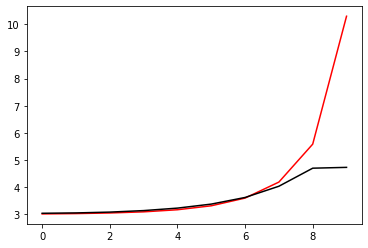

427900 0.49330404096594205
[3.2673819  3.27435629 3.29777951 3.34234543 3.42128047 3.55559793
 3.78482601 4.18767898 4.8683139  4.79299113]


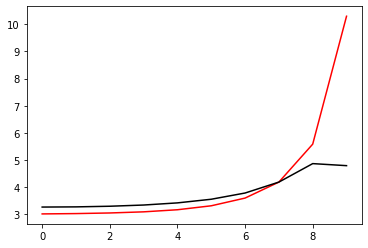

429000 0.024918629771023958
[3.02865732 3.02710935 3.03198257 3.05553791 3.11210387 3.22283304
 3.42639102 3.79794031 4.43892793 4.42108036]


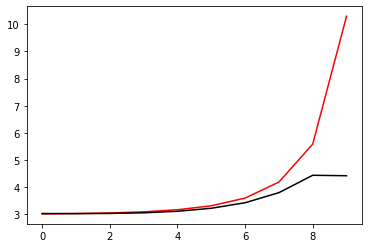

430100 0.031754696462812856
[2.99812125 2.99941829 3.0087727  3.03597856 3.09653496 3.21550408
 3.43613532 3.83546178 4.50961802 4.5050624 ]


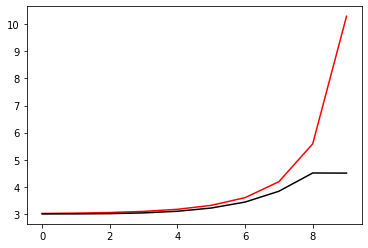

431200 0.01947267527081454
[2.88112924 2.88947468 2.91068201 2.95136115 3.02630802 3.16198879
 3.40586262 3.8418854  4.56616206 4.54999224]


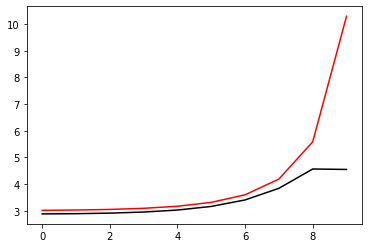

432300 0.02103626077242074
[2.99299815 3.00037708 3.01824598 3.05175969 3.11086313 3.21413318
 3.39666925 3.72516283 4.28883544 4.307081  ]


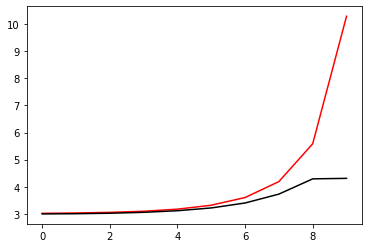

433400 0.037724088636068256
[2.9792591  2.9848865  3.00104081 3.03724418 3.10771869 3.23599985
 3.46422808 3.8658447  4.5185898  4.42330414]


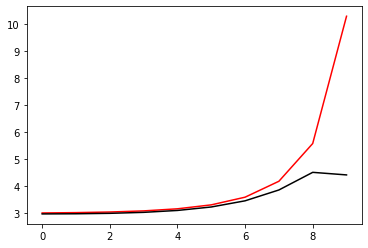

434500 0.046976390503054584
[2.98990153 3.00401258 3.03165301 3.07952895 3.15970658 3.29333588
 3.51791737 3.89791722 4.50278318 4.39796088]


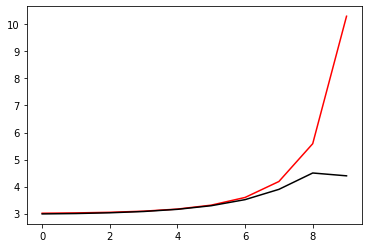

435600 0.011925361310449929
[3.0263884  3.03849294 3.06567786 3.1157731  3.20371903 3.35425234
 3.60954965 4.04033936 4.71265431 4.73620534]


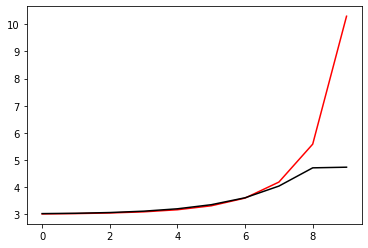

436700 0.021948066461014985
[3.01726317 3.0293036  3.05800032 3.11079292 3.19995604 3.34928518
 3.60299572 4.0411997  4.74873371 4.78324915]


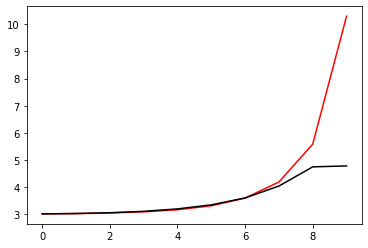

437800 0.019539431280196272
[2.96652787 2.9509249  2.9419739  2.95267727 2.99657503 3.09171697
 3.25801688 3.5163986  4.04233192 4.03616834]


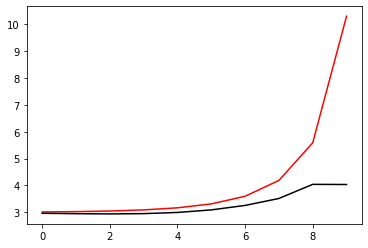

438900 0.05250583905935008
[2.95298325 2.95170557 2.95443121 2.97148371 3.0177221  3.11309006
 3.28444313 3.57249965 4.10428022 4.08829118]


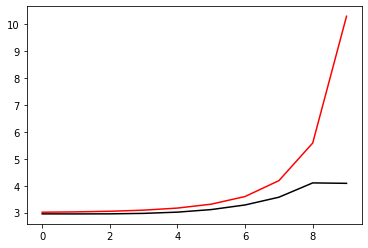

440000 0.0309529173822547
[2.94956282 2.95471889 2.96771822 2.995116   3.04884354 3.14909675
 3.32970157 3.64811282 4.19636162 4.21637244]


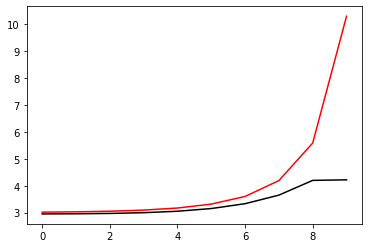

441100 0.031175225777150324
[2.96331104 2.9675977  2.98260542 3.0161994  3.08091702 3.19819677
 3.40614219 3.7723449  4.37699758 4.37706013]


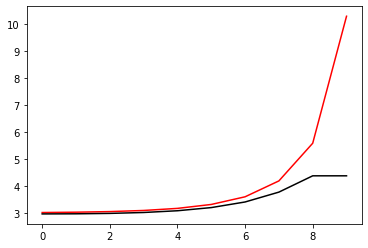

442200 0.01919871690136993
[2.93300621 2.94529765 2.9684962  3.00721594 3.07096981 3.17645806
 3.35466837 3.66526645 4.18892518 4.16713355]


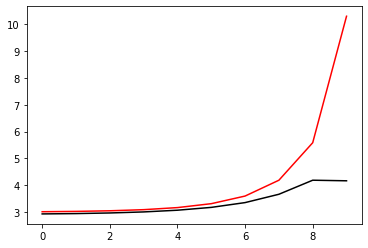

443300 0.021103798629813552
[2.92170757 2.92987613 2.95154389 2.99197625 3.05967335 3.17064909
 3.35540192 3.67061659 4.18373143 4.1893175 ]


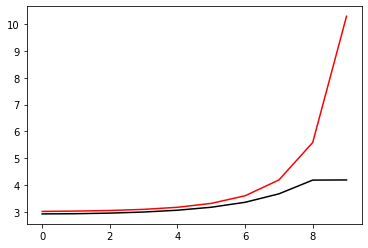

444400 0.03766370533320376
[2.9686318  2.97793699 3.00107615 3.04636905 3.12640332 3.26186658
 3.48909659 3.8697864  4.46414072 4.36413463]


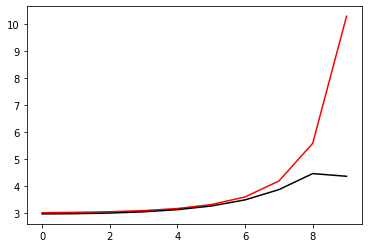

445500 0.046628430930172694
[2.98056415 2.99538904 3.02696978 3.08420863 3.18158196 3.34327025
 3.61074306 4.05243034 4.72912164 4.66885333]


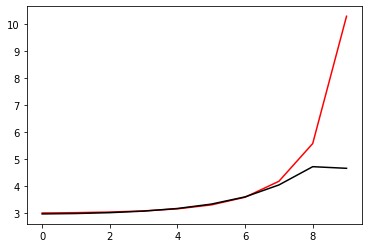

446600 0.02422393198677869
[3.09865658 3.11118836 3.14139877 3.19744526 3.29320208 3.45358635
 3.72160722 4.17138916 4.87842483 4.85944804]


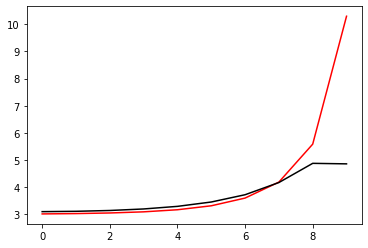

447700 0.02197219720247769
[3.01874988 3.03153371 3.06148939 3.11566649 3.20747419 3.36057288
 3.6170068  4.05136696 4.74251272 4.79222257]


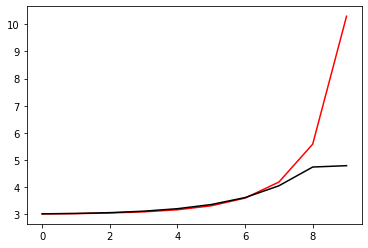

448800 0.011876284741586151
[3.01704376 3.02889469 3.057045   3.10869029 3.1960462  3.34077786
 3.58555485 4.01195735 4.71718415 4.75795758]


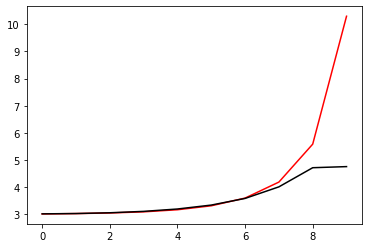

449900 0.05235666835985111
[2.94489143 2.93462706 2.93000593 2.94519781 2.99419019 3.0956663
 3.27065259 3.53037164 4.05136471 4.03317418]


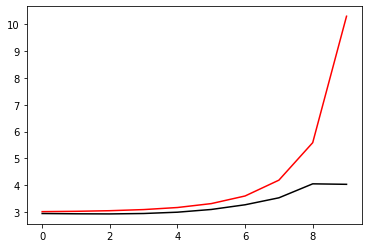

451000 0.031165832559563462
[2.95380614 2.95287381 2.95624256 2.97413649 3.02152867 3.11860845
 3.29191277 3.57714367 4.09714081 4.0966227 ]


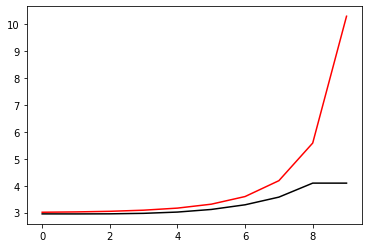

452100 0.03070966504159122
[2.94839635 2.95321284 2.96601374 2.99330127 3.046887   3.14673669
 3.32597733 3.63962604 4.17472962 4.17725809]


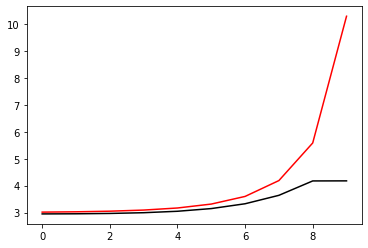

453200 0.019549254807424296
[2.94633215 2.95255188 2.96893605 3.00355654 3.06878624 3.18585724
 3.39256785 3.75552604 4.3521126  4.35726333]


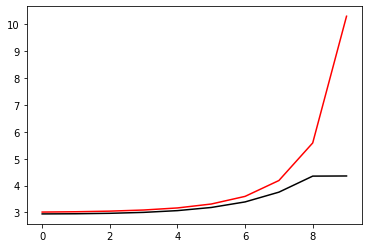

454300 0.021559512636203784
[2.9495914  2.9580754  2.97953385 3.02200186 3.09871768 3.23178602
 3.46173217 3.86086445 4.50753988 4.53164209]


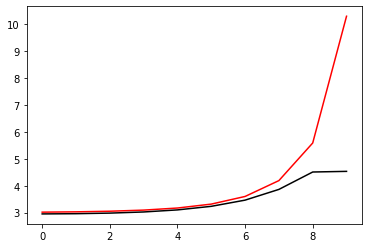

455400 0.12262367943798738
[3.18958802 3.2063802  3.23133004 3.27711129 3.35815577 3.49523337
 3.72371414 4.10819127 4.73761657 4.50908373]


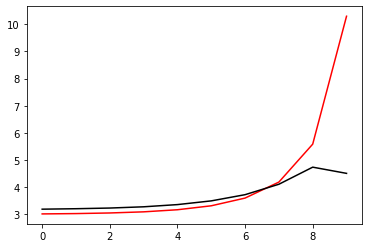

456500 0.05004969836623776
[2.94642159 2.95615368 2.97795334 3.01830117 3.08890673 3.20925269
 3.41257981 3.75768922 4.31771157 4.28321321]


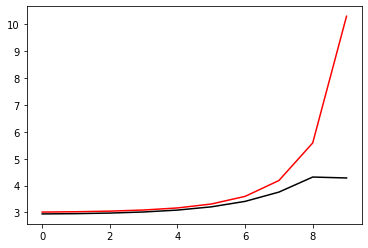

457600 0.01152276533312327
[3.03320694 3.03850156 3.05836941 3.10021423 3.17634931 3.30816399
 3.53378844 3.91973348 4.5383093  4.50783058]


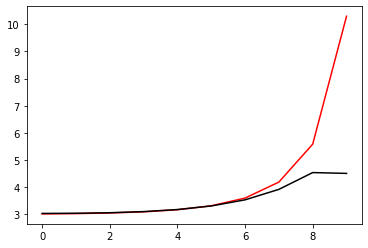

458700 0.02170481486106673
[3.02507901 3.03554475 3.0579479  3.10218122 3.18211168 3.32195535
 3.56442338 3.98396921 4.65876124 4.74700198]


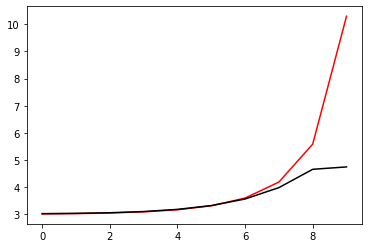

459800 0.011747746297995241
[3.02263786 3.03291412 3.05799122 3.1053367  3.18738328 3.32672185
 3.56602698 3.98368005 4.67068132 4.69707852]


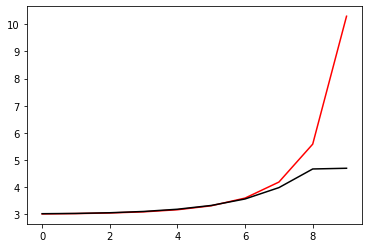

460900 0.04130377068475341
[3.03381378 3.06297573 3.10545643 3.16856157 3.26319853 3.40487585
 3.60157569 3.79626116 4.22889142 4.38727896]


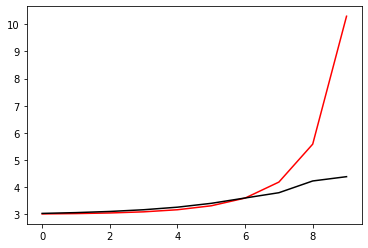

462000 0.025378069523839027
[3.00400664 3.0160955  3.04661418 3.10145267 3.18876605 3.32214444
 3.52742141 3.86542174 4.3555182  4.31813637]


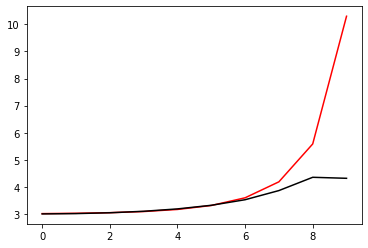

463100 0.03124683789388098
[2.95708822 2.96476413 2.98465845 3.02524273 3.09917804 3.22584901
 3.43818047 3.79972313 4.36738026 4.40126939]


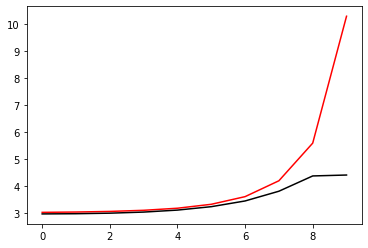

464200 0.020228247458618915
[2.94965231 2.95749162 2.9787945  3.02291807 3.10321257 3.24244259
 3.48272124 3.89852105 4.54755815 4.56563626]


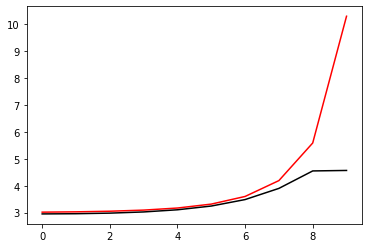

465300 0.02167077359799104
[2.94051872 2.94673153 2.96598242 3.00687088 3.08204319 3.21576525
 3.45071831 3.87201761 4.57901954 4.63110222]


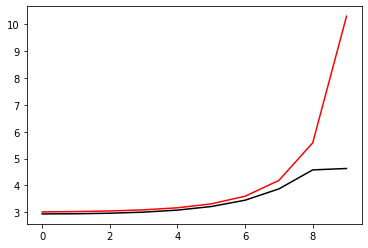

466400 0.08945990862055322
[3.15293506 3.17140002 3.20119886 3.25539989 3.34891593 3.50498551
 3.76012926 4.17742795 4.85569894 4.63777009]


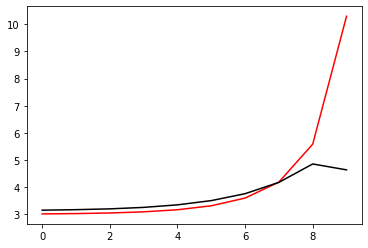

467500 0.04449207603473792
[2.95812975 2.96962275 2.99840307 3.05199595 3.14268099 3.29216448
 3.53940117 3.95156465 4.6007704  4.53673329]


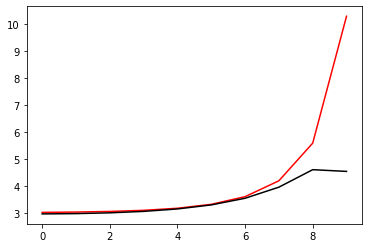

468600 0.01215779661338221
[3.01416155 3.02748341 3.05790408 3.11232067 3.20602944 3.3652425
 3.63491655 4.09081397 4.8035536  4.85820991]


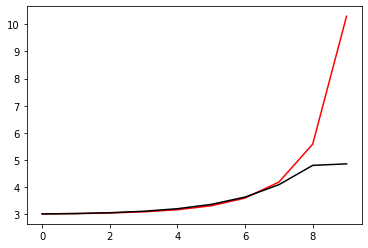

469700 0.022058406919312802
[3.01814709 3.03048247 3.0600623  3.1152465  3.20816454 3.36241344
 3.62243165 4.06913999 4.7917208  4.8342837 ]


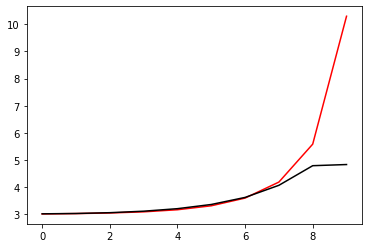

470800 0.010698038493439989
[3.08119787 3.06601858 3.05102549 3.05301161 3.08550081 3.16475829
 3.30931367 3.54295144 4.07592938 4.08444262]


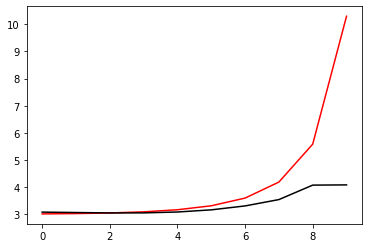

471900 0.035864737631638895
[3.12599795 3.12352825 3.12412433 3.13657088 3.17444322 3.25868211
 3.42283615 3.7257431  4.27792979 4.27215814]


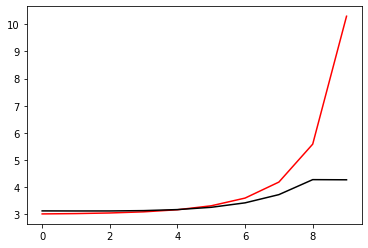

473000 0.025349055500999817
[3.02967496 3.03266191 3.04663813 3.0787956  3.14232756 3.26098331
 3.4779072  3.86951448 4.52307048 4.48487869]


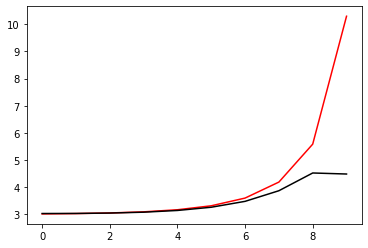

474100 0.031745113945080866
[2.96241664 2.96875254 2.98708044 3.02900412 3.10841457 3.25042432
 3.50144664 3.94447515 4.66888267 4.71468705]


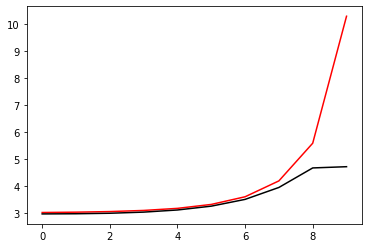

475200 0.019089518000111796
[2.96451804 2.9468728  2.94199534 2.96272596 3.02227222 3.14285894
 3.3640628  3.75682081 4.4038291  4.42902234]


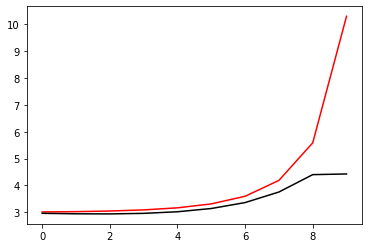

476300 0.021328353293978915
[3.00970144 3.00867166 3.0126378  3.03441242 3.09191562 3.21028073
 3.43080663 3.82572347 4.47730009 4.48599588]


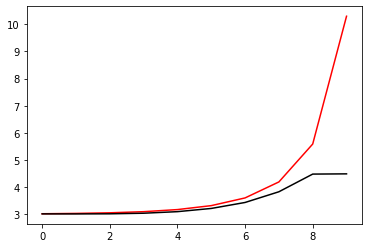

477400 0.03771454538728845
[2.98815495 2.99228056 3.0044525  3.03399988 3.09732363 3.22191648
 3.45454611 3.87422724 4.56643525 4.52195135]


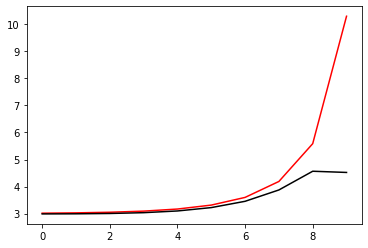

478500 0.04580659589282448
[2.99791222 2.99567631 3.00194152 3.02606731 3.08215542 3.19547858
 3.41213334 3.81404944 4.49361255 4.46849385]


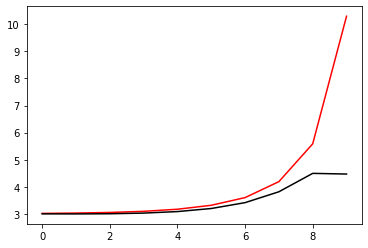

479600 0.012400960469128128
[3.08899398 3.09471132 3.11187319 3.1485216  3.22006579 3.35347426
 3.5961702  4.03027676 4.7448236  4.71286363]


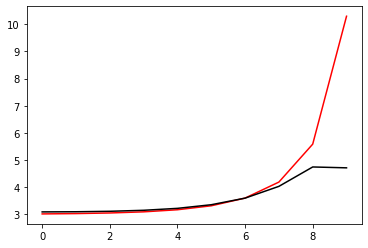

480700 0.021856695372518224
[3.02622578 3.0367153  3.0622333  3.11048043 3.19400267 3.3369188
 3.58434077 4.01923963 4.73837232 4.76843875]


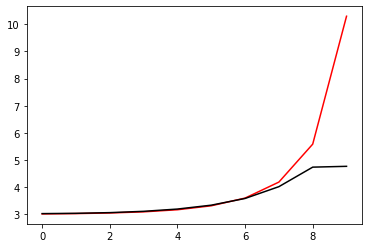

481800 0.020278282006850674
[2.96957999 2.94975681 2.93693757 2.94135963 2.97194569 3.04404102
 3.17885127 3.33698324 3.61923023 3.67927507]


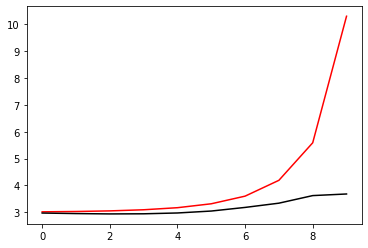

482900 0.05510363774553196
[2.9589495  2.95321384 2.94881208 2.95775691 2.99248073 3.06876386
 3.20550602 3.38916287 3.69080305 3.66637158]


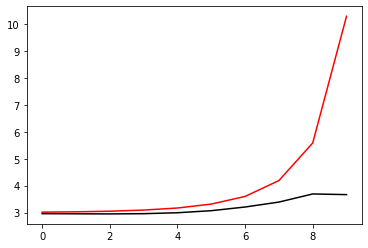

484000 0.03146523605611062
[2.96438756 2.96452467 2.9682928  2.98326692 3.02152604 3.1000039
 3.2393205  3.45125659 3.77986873 3.78729449]


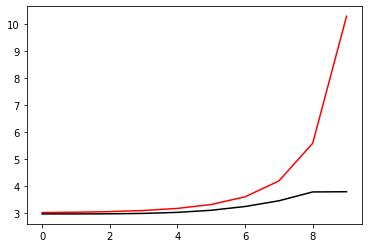

485100 0.030544103584484505
[2.96265917 2.96654206 2.97740556 3.0009211  3.04684805 3.13134454
 3.27928195 3.52320122 3.89527863 3.86386052]


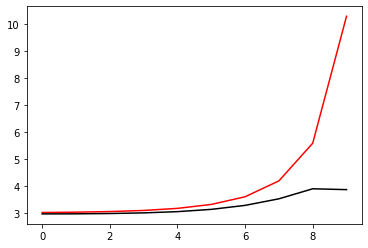

486200 0.01965526676022331
[2.94316027 2.95183252 2.97288211 3.01237795 3.07977283 3.19230992
 3.3796229  3.68868119 4.1568713  4.18383435]


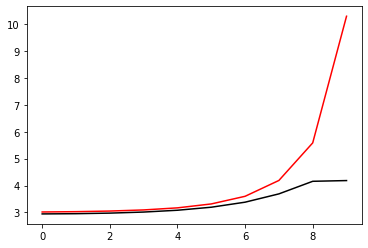

487300 0.02110783289035304
[2.95342497 2.97814747 3.02276057 3.0860272  3.17376404 3.29642255
 3.46585542 3.68753178 3.97551981 3.98327668]


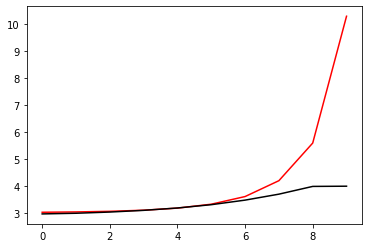

488400 0.0383994301811623
[2.96736554 2.98067701 3.01239581 3.0688608  3.15851491 3.29607468
 3.50912407 3.83605551 4.22823064 4.1642011 ]


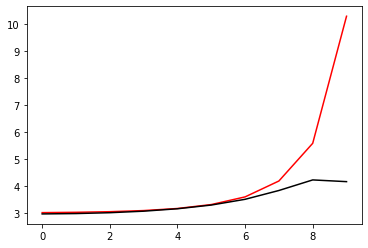

489500 0.046130665848360106
[2.97918266 2.99157731 3.02004172 3.07373681 3.16806979 3.32916561
 3.6021453  4.03470865 4.57101421 4.55736911]


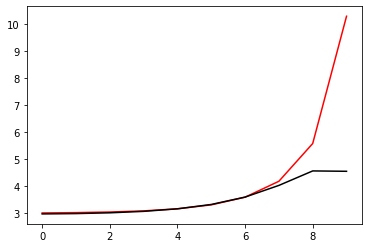

490600 0.01121126420744504
[3.08571742 3.07590075 3.07105056 3.08626793 3.13777597 3.24765792
 3.45072785 3.79823143 4.31886325 4.25314443]


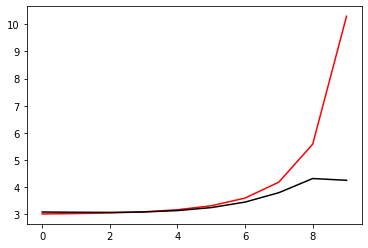

491700 0.021265155932649448
[3.07702154 3.07764722 3.08532994 3.11036041 3.16806867 3.28430664
 3.50217034 3.88946299 4.4959448  4.52817848]


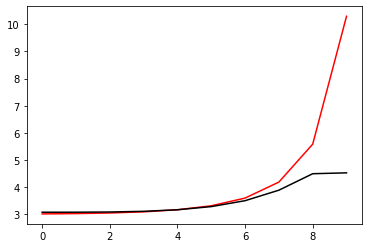

492800 0.011657048185008772
[3.05545696 3.0638082  3.08483997 3.12656987 3.2026     3.33664609
 3.57314243 3.99126079 4.67104654 4.6946724 ]


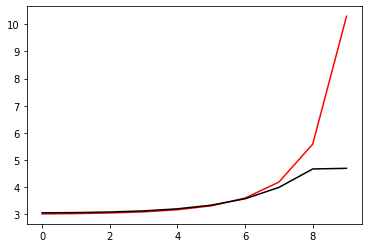

493900 0.09468682474581827
[2.85788861 2.84887671 2.85589645 2.88933628 2.96238799 3.09883952
 3.33989885 3.75700394 4.42890988 4.51914032]


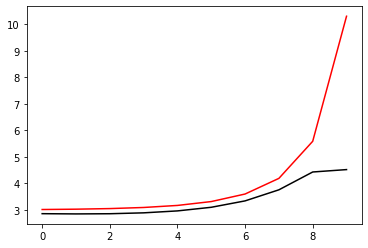

495000 0.03019659238802953
[2.94899679 2.95198648 2.96090242 2.98986299 3.05672778 3.18617822
 3.41966858 3.82902317 4.4926054  4.48294132]


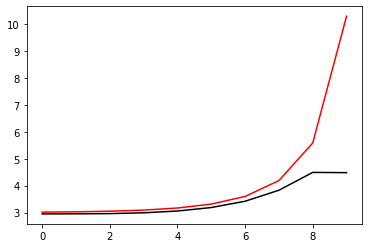

496100 0.03193202477530783
[2.99136229 2.9962915  3.01128654 3.0455994  3.11483446 3.24516825
 3.48119753 3.89844997 4.57755749 4.58598858]


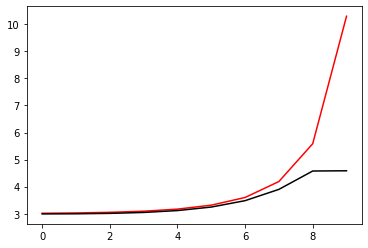

497200 0.02033557145112568
[2.95647988 2.96267818 2.97970974 3.01721283 3.0910516  3.22819896
 3.47618885 3.91762258 4.64083673 4.62068433]


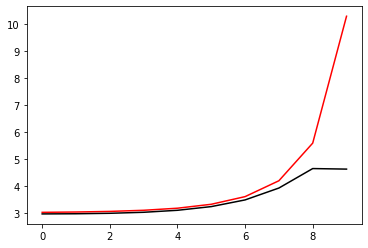

498300 0.021787791546114776
[2.94096507 2.95003788 2.97287254 3.0166434  3.09519446 3.23310091
 3.47612335 3.90892145 4.63064577 4.70259328]


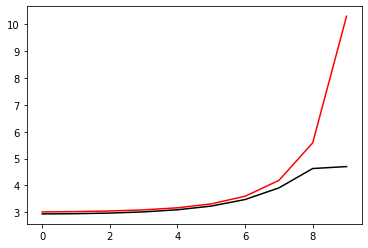

499400 0.11623631349267018
[3.18865213 3.2031538  3.22260038 3.26636855 3.34729381 3.48776277
 3.72662164 4.13495257 4.81108283 4.58188401]


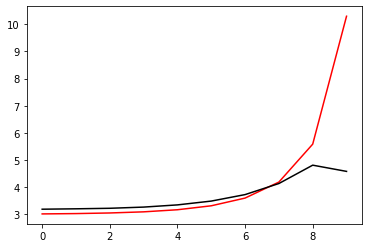

In [14]:
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h])
    for i in range (100):
        optimizer.apply_gradients(zip(gradients, [h]))
    if j%11==0: 
        print(j*100, Error_func(h, Positive[j%10], Negative[j%10]).numpy()), print(h.numpy())
        plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

0 0.02678883694784858
[3.03440192 3.04506743 3.06497901 3.10316717 3.17302208 3.29406019
 3.49986365 3.85134873 4.43063954 4.39214975]


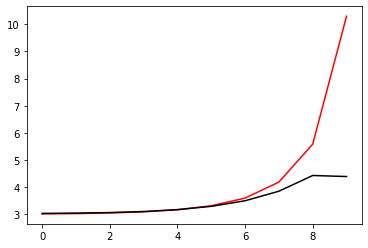

1100 0.03793495976840966
[2.84151316 2.84378603 2.85318643 2.87884561 2.93290228 3.03228681
 3.20535385 3.51466021 4.17425978 4.25095061]


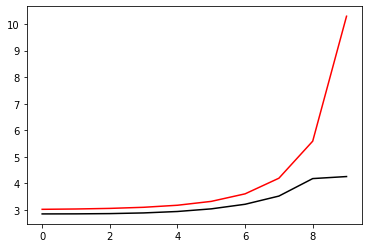

2200 0.017295057850208465
[2.90322393 2.9061284  2.9175786  2.94429277 2.99720707 3.09549027
 3.27514237 3.60628976 4.18454313 4.14454641]


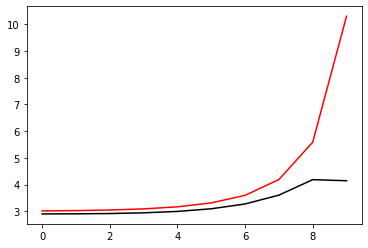

3300 0.021230365567136658
[2.96785086 2.96924717 2.97741618 3.00226259 3.0576391  3.16661727
 3.3717353  3.75130404 4.39951652 4.44526577]


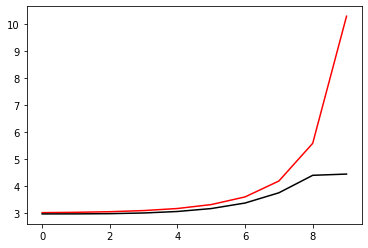

4400 0.03790250771820574
[3.04659991 3.05342547 3.07114182 3.1076538  3.17568085 3.29729435
 3.51225819 3.88924515 4.49620987 4.43209432]


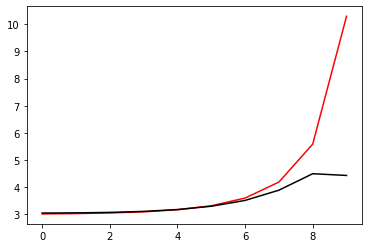

5500 0.04474664797805133
[2.98000559 2.98808333 3.00868589 3.05121361 3.13199452 3.27913225
 3.54211285 4.00217878 4.72867148 4.64507544]


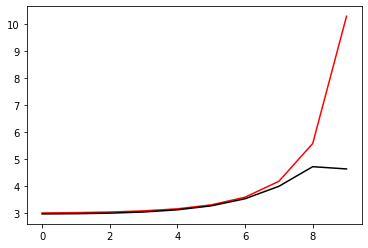

6600 0.012115533589472979
[3.01716105 3.02949799 3.05845484 3.11098004 3.20188945 3.35714895
 3.62250222 4.07757736 4.80610263 4.84798168]


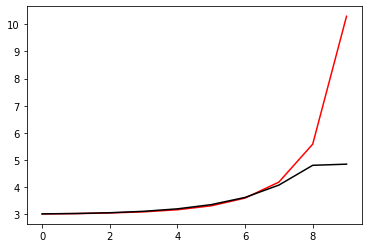

7700 0.022211400650087084
[3.01830554 3.03168554 3.05976155 3.11292784 3.20757319 3.36847838
 3.64254484 4.11189139 4.85772434 4.97289746]


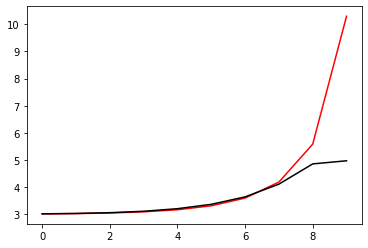

8800 0.01922134485127885
[2.96439361 2.9492008  2.94127932 2.95438331 3.00236517 3.1040541
 3.27984861 3.54801577 4.10914607 4.10545487]


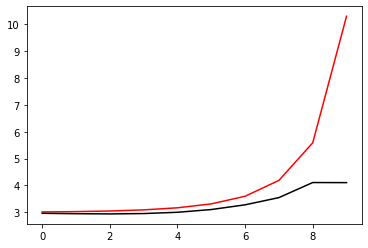

9900 0.05166108051075199
[2.94910501 2.94918405 2.95424825 2.97455852 3.0252864  3.12717255
 3.30838888 3.61209283 4.17638361 4.16193215]


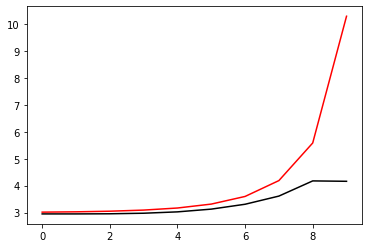

11000 0.024652292731468222
[3.00062007 3.01473483 3.04033303 3.08162058 3.15114235 3.27033589
 3.47537329 3.82803225 4.42441441 4.39186053]


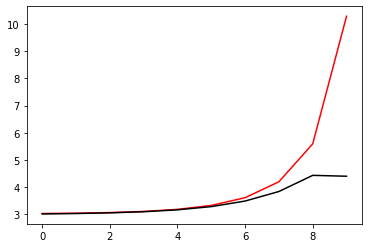

12100 0.03164624741073138
[2.98453068 2.98975064 3.00905231 3.04840143 3.11909113 3.24117384
 3.4515799  3.81724677 4.41721841 4.40750799]


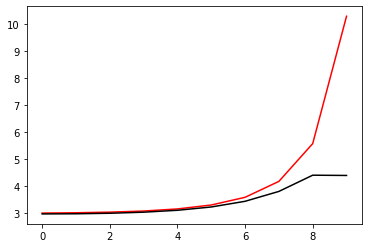

13200 0.020582225008100558
[2.9638549  2.9683935  2.98499303 3.02371652 3.098295   3.23251424
 3.46962232 3.88564434 4.55744929 4.56974185]


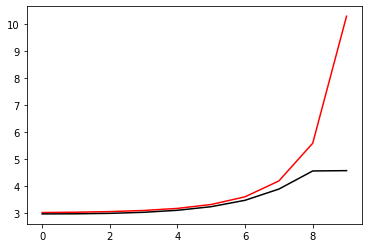

14300 0.02172737914538043
[2.93594665 2.94242669 2.96000408 2.99809135 3.07205212 3.20706223
 3.44875411 3.88280405 4.60576553 4.66100979]


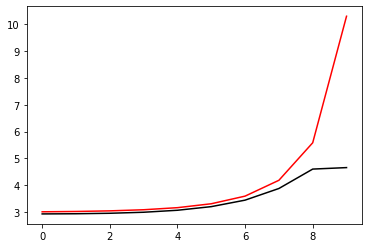

15400 0.0393462806252715
[2.98083248 2.97235304 2.97360117 2.99847045 3.06065842 3.18238352
 3.40189002 3.78478915 4.40450209 4.38214704]


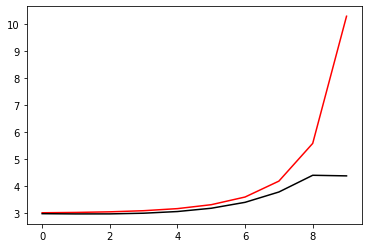

16500 0.04547469146252205
[2.99265416 2.99376942 3.00237147 3.03029196 3.0945646  3.22012539
 3.44793021 3.84706442 4.49086278 4.47124453]


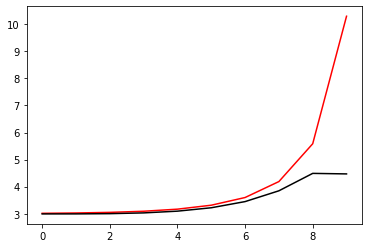

17600 0.011552096480654405
[3.04467798 3.04344758 3.05225414 3.08046783 3.14426821 3.27054479
 3.50468141 3.92225763 4.60000875 4.57731786]


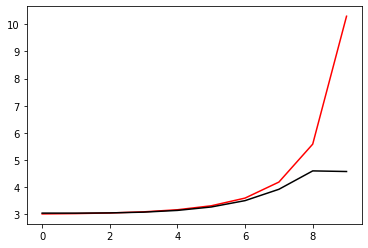

18700 0.060920966428503295
[2.80874363 2.8226156  2.84817628 2.89417563 2.97497297 3.11684085
 3.36754268 3.8109078  4.5357465  4.7799846 ]


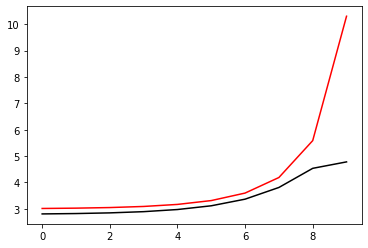

19800 0.010619506801250247
[3.08325146 3.09202556 3.11071636 3.14123767 3.18943421 3.26681424
 3.39529654 3.61980665 4.02641662 4.04361776]


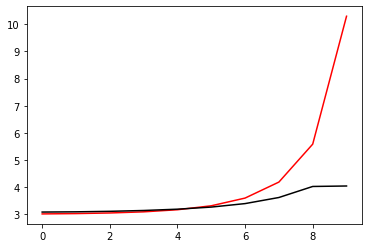

20900 0.0410770046808617
[3.07010594 3.07505962 3.08823087 3.11540915 3.16542694 3.25368996
 3.40924777 3.68644647 4.152524   4.14502942]


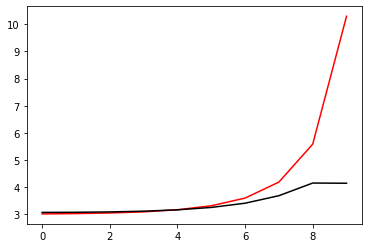

22000 0.025577400451084704
[3.03423245 3.03559352 3.0468833  3.0756757  3.13523172 3.24884645
 3.45866908 3.83800194 4.4513208  4.39649188]


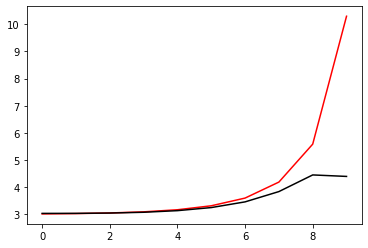

23100 0.031780030528312145
[2.96770879 2.96807822 2.98072874 3.01708083 3.09264196 3.23539238
 3.4966455  3.96448486 4.71311187 4.71297517]


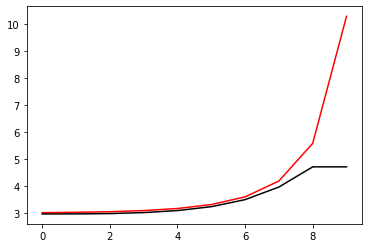

24200 0.01580605095218713
[2.90032359 2.90588508 2.9252768  2.96679726 3.0490324  3.1993797
 3.47018098 3.95709529 4.75876128 4.7484245 ]


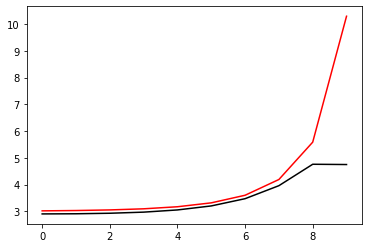

25300 0.02095982985730355
[2.95949574 2.94294634 2.92620735 2.92520337 2.95601281 3.04135126
 3.20995069 3.4711595  4.04972648 4.05620434]


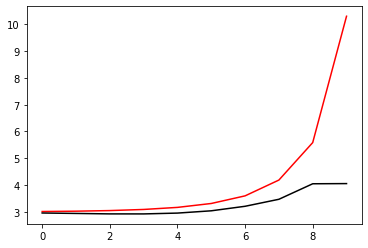

26400 0.04418064263793477
[2.97039388 2.9708798  2.97368219 2.98730892 3.02655076 3.11420999
 3.2842077  3.5893556  4.15848996 4.09502771]


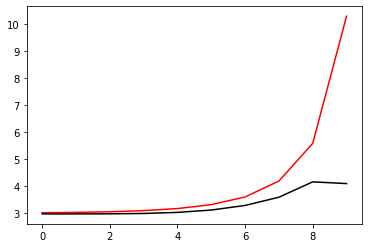

27500 0.0457805497500005
[2.98860552 2.99760207 3.0188301  3.05890952 3.13067372 3.25657929
 3.47664593 3.86103692 4.49579891 4.45904516]


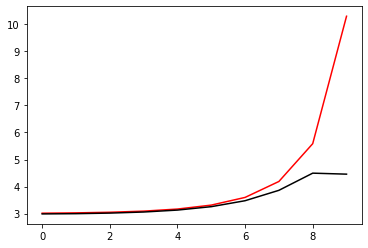

28600 0.03190143470035033
[2.90241992 2.91197294 2.9325262  2.97092613 3.03905984 3.15666105
 3.36010672 3.71655529 4.31449742 4.37876248]


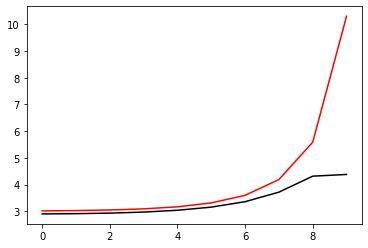

29700 0.021325056743750334
[3.06603703 3.07054696 3.08402648 3.11534912 3.17893122 3.29881185
 3.51650047 3.90205356 4.52167951 4.56158213]


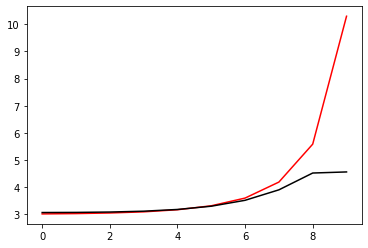

30800 0.011382720942132938
[3.01470653 3.01233237 3.02166571 3.05129024 3.11445656 3.23524984
 3.45615285 3.8502358  4.49403723 4.63801019]


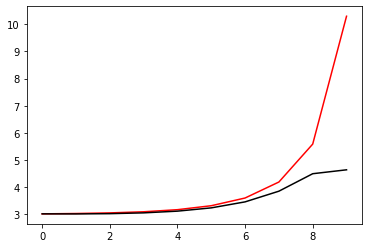

31900 0.04315211323171953
[2.94298126 2.96786208 3.00828692 3.06991548 3.16722329 3.32549302
 3.58930185 4.03523367 4.7401309  4.62442252]


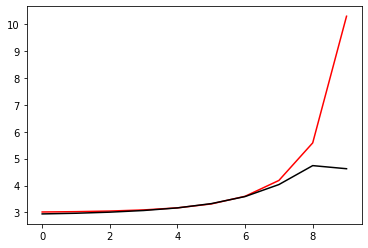

33000 0.024185028460699462
[2.95843123 2.98610969 3.03278628 3.10056927 3.19841028 3.3418101
 3.55628503 3.88238207 4.39385377 4.36195503]


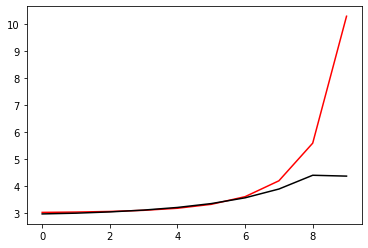

34100 0.0320057987344862
[2.9682751  2.98051863 3.01233005 3.06983377 3.1626715  3.30864664
 3.54162604 3.92294747 4.50359119 4.5002889 ]


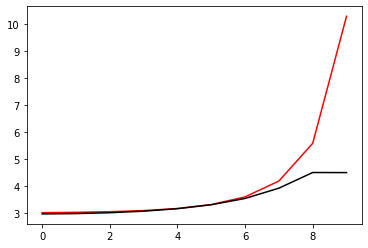

35200 0.02058426066363458
[2.9567938  2.96290111 2.98315426 3.02795471 3.11101057 3.25561271
 3.50481198 3.93753758 4.62406831 4.64292956]


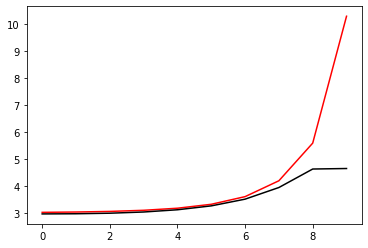

36300 0.021714297800430493
[2.94010783 2.94785284 2.96791176 3.00882658 3.0845744  3.21875959
 3.45470914 3.87908061 4.60863944 4.65979385]


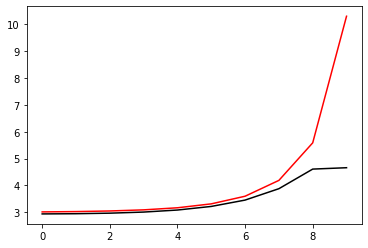

37400 0.03698105546842061
[2.99350302 2.99916011 3.01669344 3.05683276 3.13586438 3.2806166
 3.53957605 3.98947462 4.7276249  4.60830825]


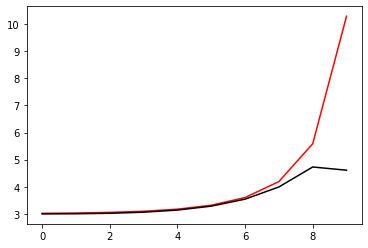

38500 0.05183011648463023
[2.99734962 2.97258697 2.95819431 2.96041411 2.99356402 3.07911043
 3.24230049 3.4193764  3.90708993 4.077396  ]


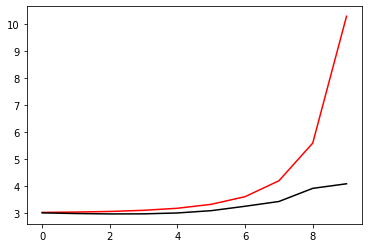

39600 0.01102768449032137
[3.09315158 3.08532346 3.08018058 3.08909704 3.12820861 3.21900546
 3.38583112 3.63667949 4.1438886  4.09190469]


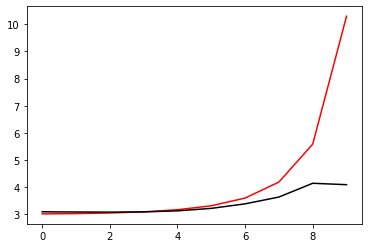

40700 0.020824714514511445
[3.09902083 3.09534018 3.09614689 3.11083493 3.15287366 3.24385961
 3.41664129 3.72085878 4.25654267 4.28408532]


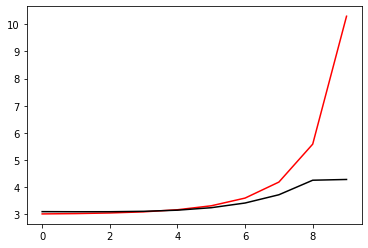

41800 0.011159411195932003
[3.09444955 3.09694683 3.10610122 3.13126114 3.18590496 3.29253649
 3.49113883 3.851191   4.45386821 4.44389757]


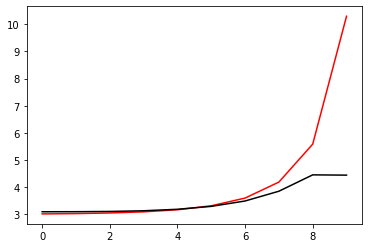

42900 0.06251777589279736
[3.13645995 3.14287483 3.16099663 3.19704292 3.26228158 3.37687476
 3.5785184  3.93710693 4.53614049 4.5102172 ]


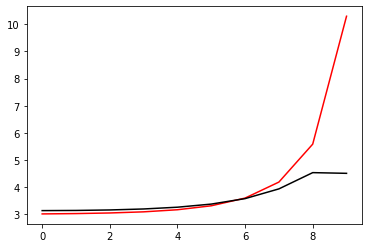

44000 0.0240385982162382
[2.9798894  2.995683   3.02864679 3.08302099 3.16922265 3.30654922
 3.53042439 3.90133501 4.47467881 4.43521313]


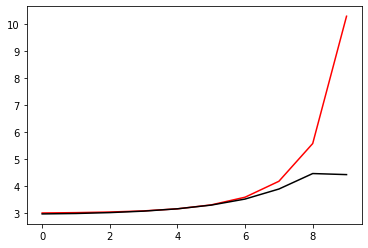

45100 0.031057854994773097
[2.94360586 2.95795104 2.98761298 3.03585879 3.11086932 3.22756733
 3.41334717 3.71895771 4.20430401 4.23304738]


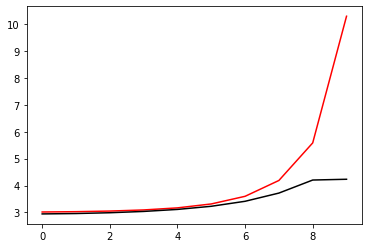

46200 0.02062315267726392
[2.95862221 2.96466679 2.98641943 3.03308196 3.11635422 3.25700823
 3.49287968 3.88833649 4.49664367 4.51342845]


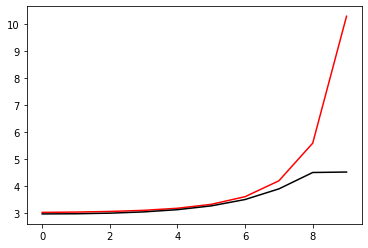

47300 0.021097919347777737
[2.95634295 2.96398183 2.98449411 3.02388057 3.09172783 3.20501692
 3.3950195  3.71977886 4.25028246 4.25791393]


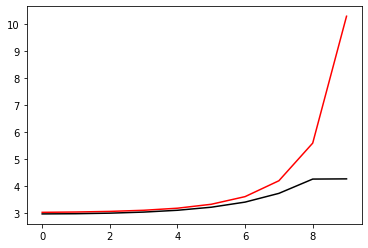

48400 0.037170855095751416
[2.97378112 2.98054221 3.00038044 3.04322889 3.12361977 3.26516338
 3.50956353 3.92727927 4.58205937 4.50040899]


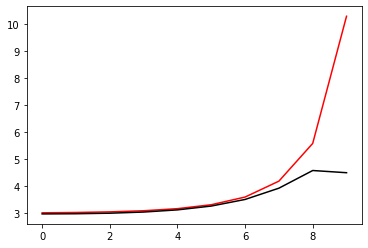

49500 0.04694308697451472
[3.00200687 3.00994414 3.02802685 3.06616845 3.13958404 3.27204623
 3.50479193 3.90956941 4.56442181 4.45454847]


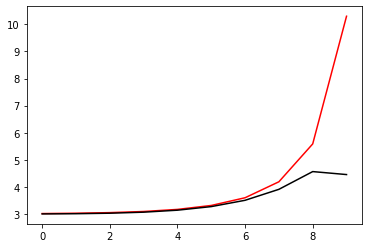

50600 0.011964246966717433
[3.0143918  3.02600453 3.05337344 3.10295208 3.18919373 3.33775681
 3.5935     4.03375696 4.73753859 4.77750171]


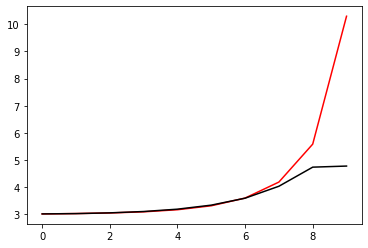

51700 0.018970337164573536
[2.94134874 2.95101722 2.97513194 3.02524089 3.11435848 3.26694107
 3.52894577 3.98173428 4.71170808 4.90265581]


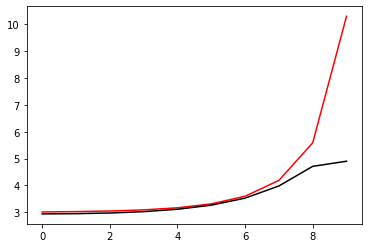

52800 0.011415900723876932
[2.95209507 2.99001776 3.04772289 3.12361365 3.2223265  3.35159959
 3.51515098 3.68662143 4.03292861 4.10883674]


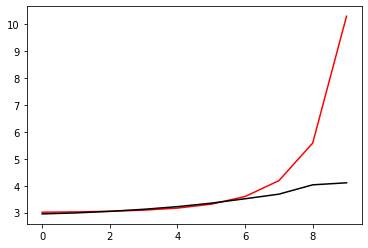

53900 0.04177180258521833
[2.99016894 3.01081337 3.05543819 3.12540476 3.22420151 3.36116352
 3.55436803 3.83232277 4.18932451 4.18769794]


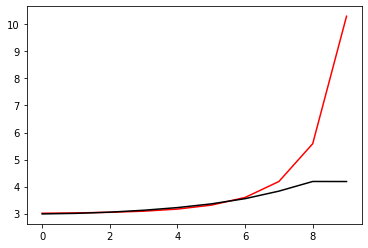

55000 0.024384595699842464
[2.9889371  3.00038696 3.03055632 3.08675784 3.17884038 3.32316292
 3.55075673 3.91633535 4.39796042 4.35195989]


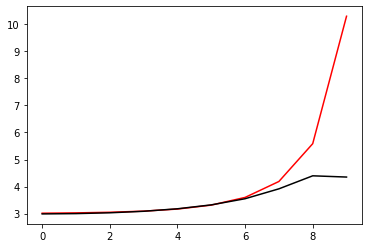

56100 0.03178540181021748
[2.95839394 2.96385311 2.98485198 3.03117347 3.11711346 3.2667588
 3.52474155 3.97949424 4.64498816 4.64164031]


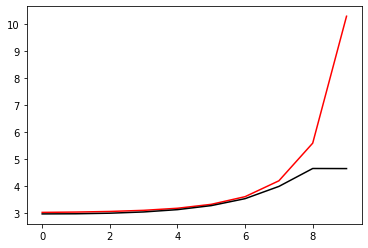

57200 0.01854525080839081
[2.92424023 2.93385805 2.95816888 3.0059221  3.09168069 3.23934678
 3.49494783 3.94957356 4.70379407 4.69164492]


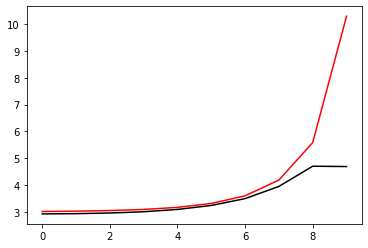

58300 0.021612316735328787
[2.97950574 2.98460627 3.00104678 3.03947368 3.1151999  3.25229301
 3.49201463 3.90514836 4.56638319 4.59655331]


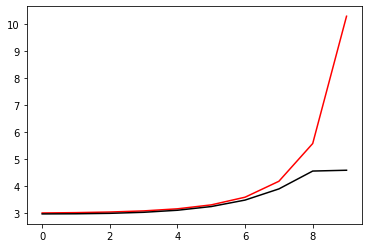

59400 0.03704504248864469
[2.95335462 2.96430107 2.98759399 3.03194849 3.11162081 3.2508313
 3.49260703 3.91262263 4.59563472 4.45926012]


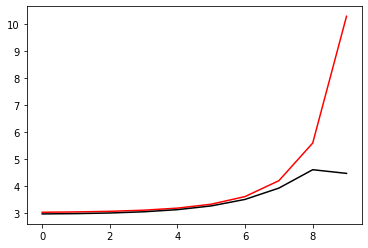

60500 0.04943946061529083
[2.99949601 3.01524028 3.04700531 3.10309587 3.19838207 3.35805449
 3.62545487 4.07501012 4.78666021 4.71425548]


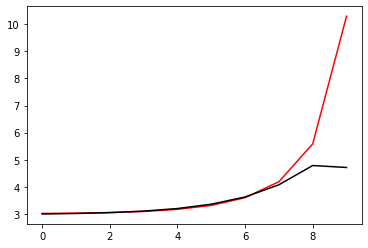

61600 0.04305642675428538
[3.14504881 3.15105893 3.16619511 3.19999743 3.26772878 3.39162456
 3.61120732 3.99558728 4.64932932 4.50986915]


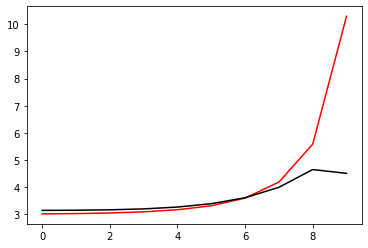

62700 0.021862245623508504
[3.01404608 3.02639956 3.05560975 3.10822276 3.19650685 3.34347139
 3.59114078 4.01584539 4.70327778 4.75459441]


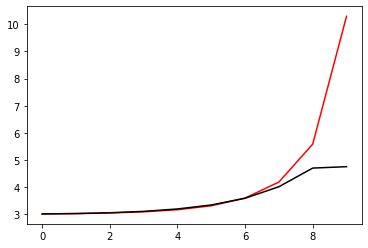

63800 0.01722867254484595
[3.09034632 3.10823551 3.14202364 3.1976825  3.28772799 3.43199437
 3.66751746 4.06184942 4.69911713 4.71449269]


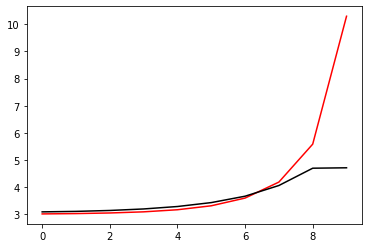

64900 0.05059757415459512
[3.09786513 3.11382853 3.14849753 3.2061196  3.29530369 3.43272679
 3.64935582 4.00151942 4.55581532 4.54254644]


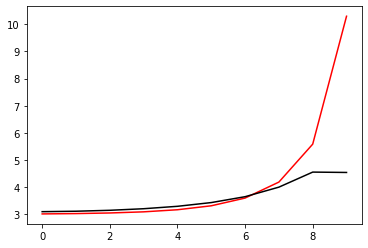

66000 0.026092024935151434
[3.02167362 3.03016683 3.05339618 3.09704469 3.17021034 3.28883741
 3.48226081 3.80257638 4.29963515 4.25640157]


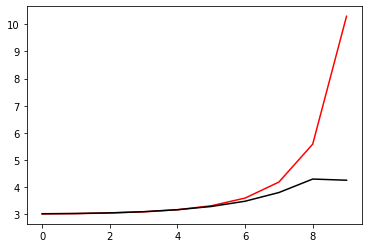

67100 0.031636885267523125
[2.97757472 2.97785801 2.9909882  3.02641719 3.09833948 3.23156162
 3.47132985 3.8969015  4.57097381 4.54768943]


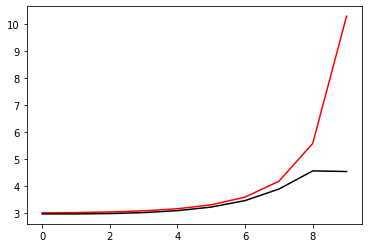

68200 0.019262275371147608
[2.94219471 2.94626821 2.9615662  2.99946742 3.0757475  3.2167121
 3.47180853 3.93184709 4.68918247 4.70397101]


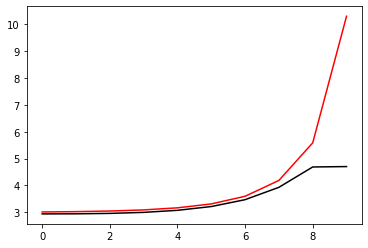

69300 0.02183937587667869
[2.94346947 2.96575598 3.01177069 3.08238952 3.18472308 3.33560357
 3.56442412 3.92149018 4.47316686 4.49640865]


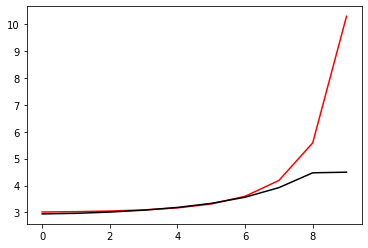

70400 0.03636206442605723
[2.94637858 2.95789934 2.98674049 3.04180709 3.13684604 3.29469198
 3.55761227 3.99577906 4.65669654 4.55620323]


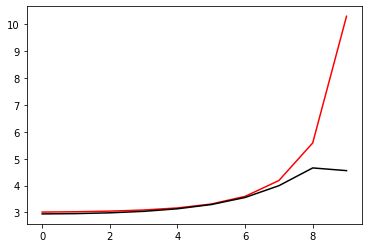

71500 0.0600495899939934
[3.05679685 3.08010479 3.11992354 3.17861123 3.26530415 3.39202672
 3.5584952  3.70526008 3.96107063 3.94667581]


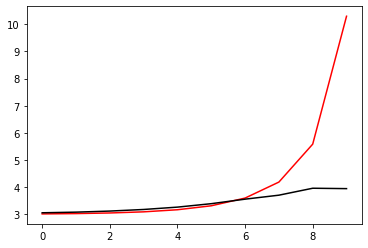

72600 0.011097489297538744
[3.02293508 3.03735006 3.06995608 3.12403978 3.20486045 3.32022622
 3.48257785 3.73088043 4.04104472 4.04424806]


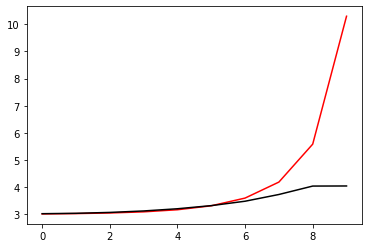

73700 0.021334143120026714
[3.04126174 3.04836295 3.070948   3.11685454 3.19628581 3.33013826
 3.56597616 3.95204534 4.30479666 4.33336041]


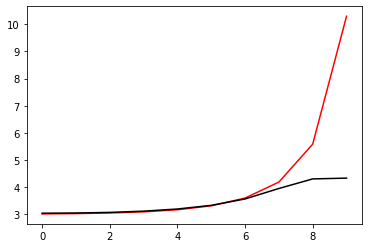

74800 0.011823474214097029
[2.94671976 2.96228276 2.98900308 3.03743773 3.12277896 3.27051508
 3.51967539 3.93705911 4.50268323 4.60732839]


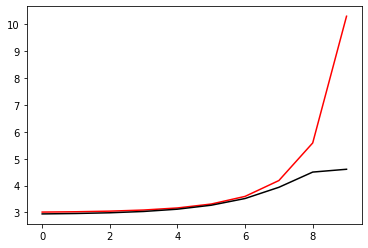

75900 0.1709019223428411
[3.20055814 3.20714477 3.23105972 3.28156803 3.37289977 3.52691494
 3.77836507 4.17804267 4.77056559 4.691833  ]


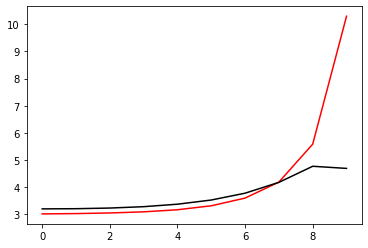

77000 0.03102562986515772
[2.94386122 2.94271774 2.94989079 2.98000596 3.0478147  3.17364296
 3.38997531 3.7465865  4.28702582 4.27882215]


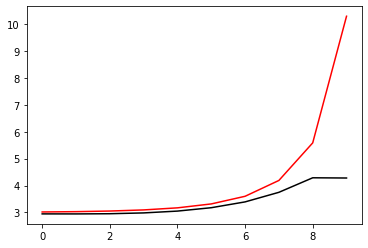

78100 0.03180054066399916
[2.98343107 2.99208299 3.01177212 3.05112475 3.12564098 3.25860572
 3.48613424 3.86393319 4.438604   4.45032673]


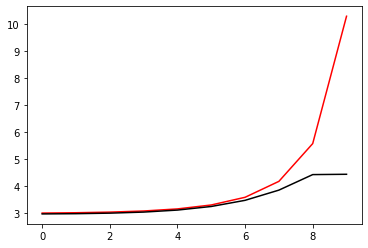

79200 0.02099778791117896
[2.97649315 2.98302104 3.0013432  3.04079497 3.11601036 3.2509368
 3.4861107  3.88703658 4.51081183 4.50427186]


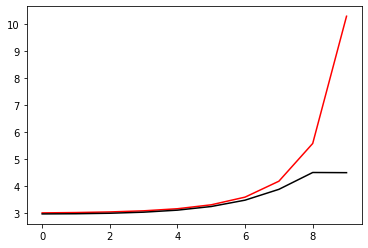

80300 0.021757795562777266
[2.94311739 2.95034591 2.96966151 3.01046357 3.08814674 3.22857212
 3.47710838 3.91101291 4.60525529 4.61994815]


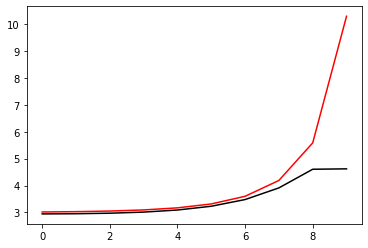

81400 0.03599965777325405
[2.93877052 2.95176098 2.98068755 3.03432413 3.12729248 3.28573509
 3.55584117 4.0180214  4.7583702  4.59444319]


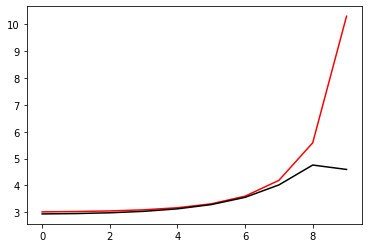

82500 0.05126820327423915
[2.96273574 2.95219627 2.94974793 2.96707784 3.01468909 3.10851654
 3.27109964 3.55384686 4.18784366 4.24043745]


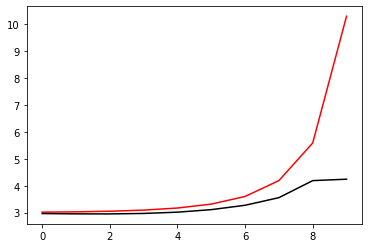

83600 0.011422398142286043
[3.07336227 3.0786648  3.09420214 3.12632225 3.18702261 3.29709044
 3.49343884 3.84399182 4.450518   4.37790225]


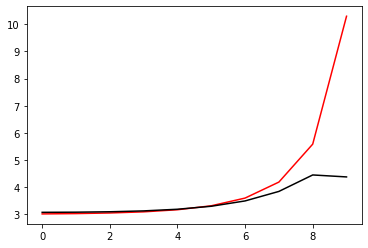

84700 0.014459122688554085
[2.91449825 2.92000583 2.93774587 2.97262308 3.03434705 3.14141315
 3.32899036 3.6626726  4.22380989 4.20370169]


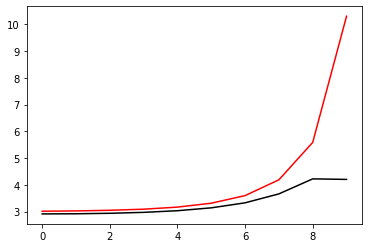

85800 0.011785563976276845
[3.00902576 3.02487168 3.06049297 3.12099333 3.21583632 3.3638027
 3.59997425 3.98681285 4.58707063 4.60876114]


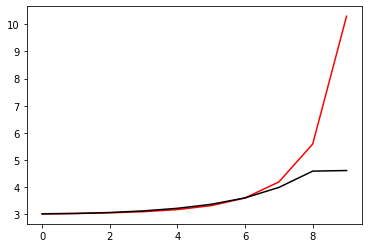

86900 0.04174986510588813
[3.0267264  3.0386054  3.06659289 3.11746604 3.20276341 3.34282952
 3.57638861 3.97599877 4.62136556 4.64781619]


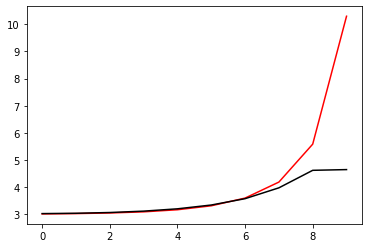

88000 0.02562102024217521
[3.00143896 3.02447229 3.06310899 3.12030063 3.20944766 3.35346209
 3.59080241 3.99101591 4.66526029 4.53059428]


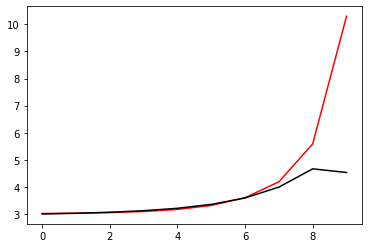

89100 0.03194781203174524
[2.95449703 2.96224761 2.98358024 3.03234257 3.12252653 3.27919659
 3.54848233 4.01276163 4.75567019 4.78719848]


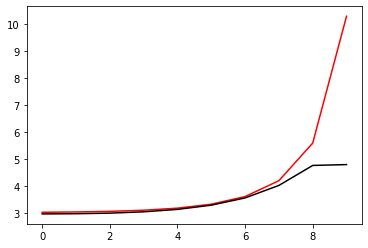

90200 0.017249427821639504
[2.92964194 2.92237565 2.92875373 2.96089179 3.03163281 3.16280728
 3.39243383 3.7880481  4.42848559 4.43074863]


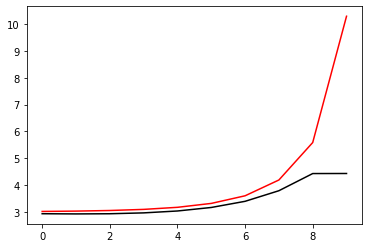

91300 0.021678184780288243
[2.91986326 2.92779951 2.94701087 2.98741759 3.06501369 3.20375381
 3.44385339 3.855183   4.51582192 4.52215968]


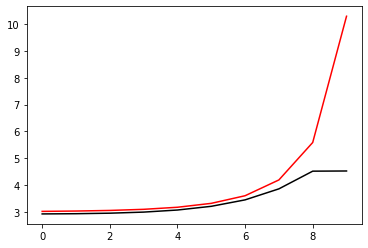

92400 0.03711551955997884
[2.97577168 2.98415033 3.00564898 3.04888586 3.12844007 3.26902691
 3.51344524 3.93494194 4.61191529 4.57642353]


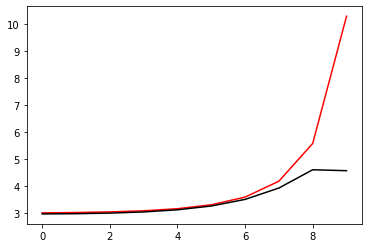

93500 0.04479378898590392
[2.97796985 2.98694788 3.00968121 3.05496333 3.13820279 3.28589237
 3.54447386 3.99379083 4.71686004 4.75004675]


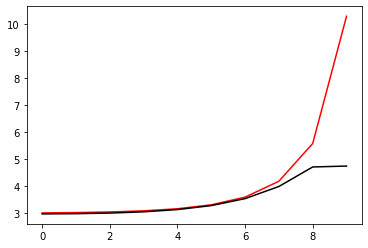

94600 0.012015818693206268
[3.01599111 3.02682915 3.05313894 3.10182161 3.18758046 3.33627527
 3.59450057 4.04490747 4.7780187  4.83090759]


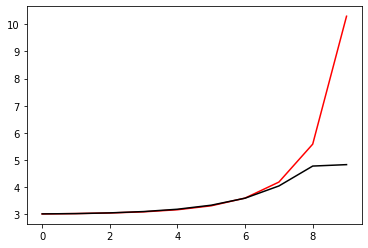

95700 0.02203582886867078
[3.028157   3.04116252 3.06552317 3.11502776 3.20401919 3.35641018
 3.6180405  4.07142791 4.80823282 4.91049273]


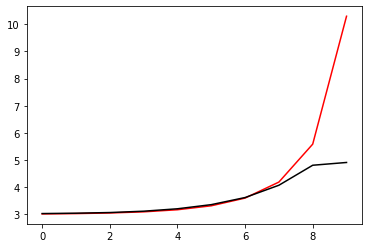

96800 0.019848014535659767
[2.96005185 2.94498501 2.93691132 2.94890886 2.99425048 3.09027356
 3.25884345 3.53643741 4.09538816 4.090757  ]


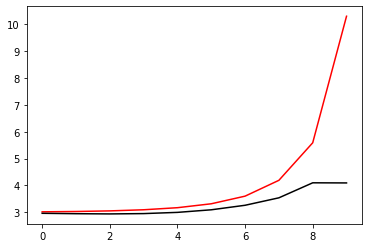

97900 0.052260961892666144
[2.9530778  2.95219058 2.95561085 2.97339927 3.02024247 3.11634253
 3.29094576 3.59474676 4.15548423 4.1402889 ]


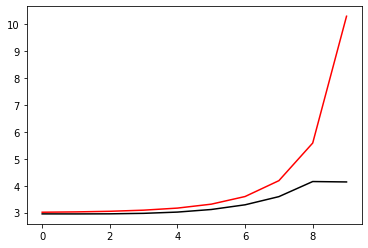

99000 0.025189860993136564
[3.00554852 3.01077789 3.02722489 3.05807863 3.11507411 3.21862748
 3.40417766 3.73452601 4.30496091 4.37137979]


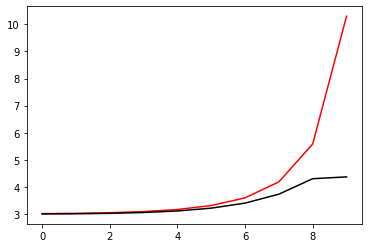

100100 0.031377317759113926
[2.97038076 2.97462127 2.98968529 3.02395412 3.09078785 3.21318758
 3.43218439 3.82055033 4.46195674 4.5015179 ]


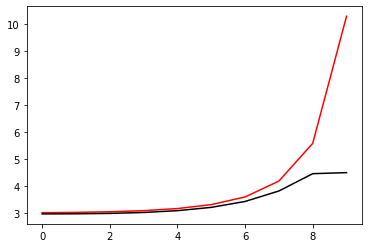

101200 0.01948140847659084
[2.93934482 2.94685976 2.96724901 3.00943399 3.08795391 3.22628716
 3.46814866 3.8919238  4.58253394 4.58404859]


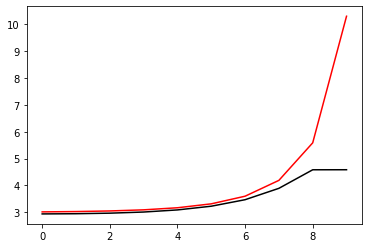

102300 0.02098056492048517
[3.05651989 3.07877474 3.11841185 3.17814421 3.26760014 3.39940289
 3.56650867 3.70197124 4.05246842 4.05698016]


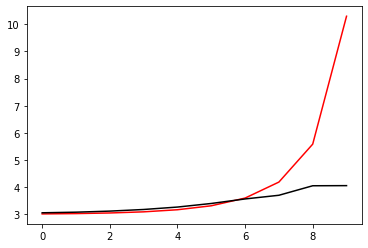

103400 0.03279543433976997
[3.06385681 3.08084856 3.11757178 3.17821561 3.26985686 3.40416547
 3.60451938 3.90803178 4.18153702 4.12266854]


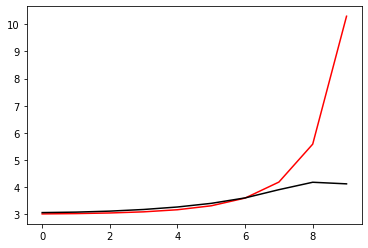

104500 0.04613454297228043
[2.96830732 2.97924841 3.00680777 3.0566641  3.13657791 3.25974538
 3.45750495 3.81972614 4.28681474 4.2698811 ]


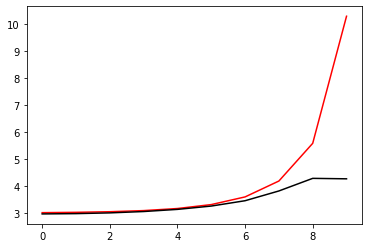

105600 0.04617133963003671
[3.13582252 3.13510378 3.1528647  3.19825641 3.28859984 3.45848024
 3.77077966 4.24029238 4.69916145 4.59839034]


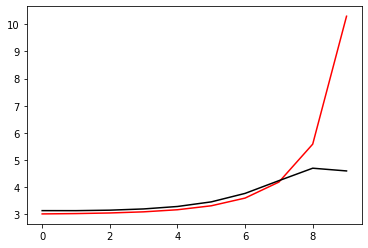

106700 0.02218387028942049
[3.05904901 3.06956725 3.09664833 3.15100086 3.24779581 3.41316125
 3.68865731 4.13906073 4.79775069 4.8357529 ]


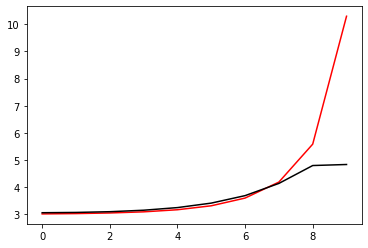

107800 0.011192235822044257
[3.03043674 3.01136065 3.00136008 3.01637537 3.07045941 3.18467643
 3.39296    3.74440305 4.29066563 4.29361598]


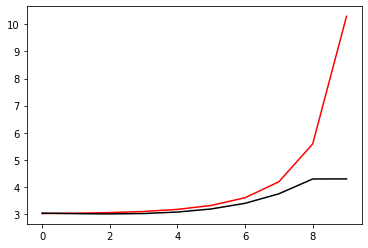

108900 0.041524391299065426
[3.0634514  3.05684786 3.05333193 3.06828485 3.11989967 3.23195256
 3.44065829 3.80117978 4.36605291 4.36383802]


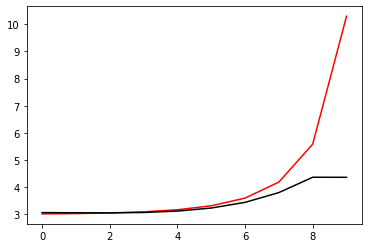

110000 0.02594034655173766
[3.04619159 3.04482189 3.04831157 3.06798333 3.12124905 3.23495688
 3.45150879 3.83673451 4.45038193 4.42367984]


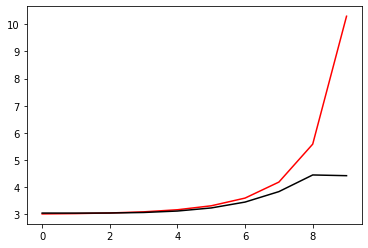

111100 0.031615020845790834
[2.98305262 2.98485398 2.9951851  3.02381563 3.08710423 3.21281455
 3.44913583 3.87614284 4.56941015 4.58157468]


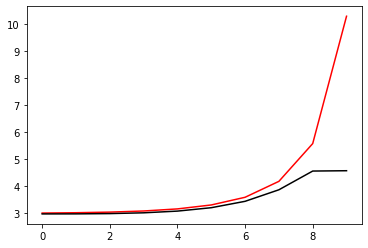

112200 0.020008553767990572
[2.94806339 2.95614975 2.97608957 3.0164061  3.09137748 3.22607026
 3.46732557 3.9001047  4.61934854 4.56550744]


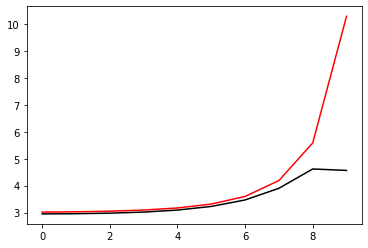

113300 0.162939256731856
[3.24431571 3.24248493 3.2541775  3.28467195 3.34682048 3.45820453
 3.64315751 3.9469639  4.52125991 4.68726631]


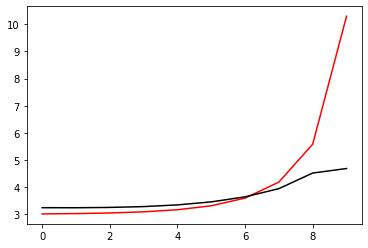

114400 0.04658259893308786
[2.94829437 2.94289577 2.94013275 2.95303707 2.99563102 3.0857163
 3.25034808 3.54026992 4.08498129 4.06170373]


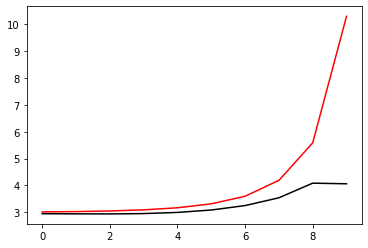

115500 0.05121471534352723
[2.9475098  2.95013649 2.95821731 2.97901583 3.02551223 3.11822721
 3.29026689 3.6004685  4.15165842 4.17635595]


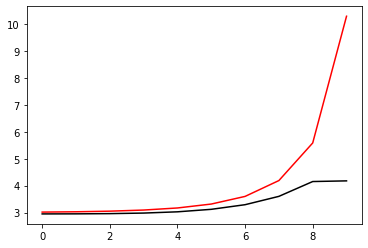

116600 0.011260073057605433
[3.03588611 3.03750876 3.05016287 3.07927373 3.13551293 3.23867609
 3.4251117  3.76074721 4.33260348 4.24615285]


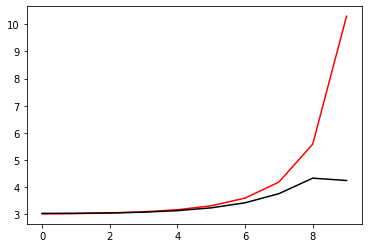

117700 0.031122676598621588
[3.11028994 3.11498302 3.12847074 3.16396449 3.23317042 3.35756055
 3.57639937 3.95932529 4.5847052  4.66209958]


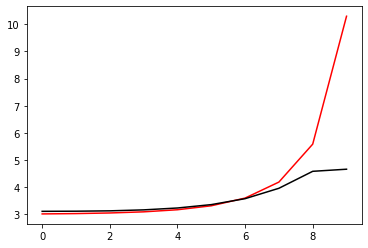

118800 0.011801747901644115
[3.04133419 3.05346374 3.08258392 3.13601268 3.22551794 3.3715484
 3.61343644 4.02216185 4.67699324 4.69746409]


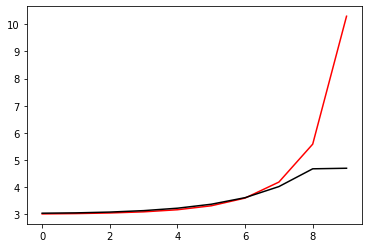

119900 0.10087519434202596
[2.80907282 2.80877734 2.823394   2.86514437 2.94828633 3.09744502
 3.35464132 3.79198601 4.4854561  4.53346782]


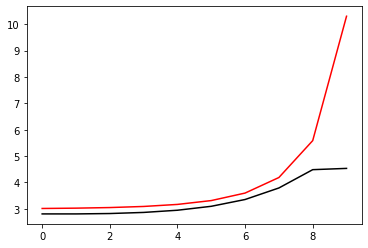

121000 0.02593724400665107
[3.05469718 3.04827394 3.04430251 3.05814807 3.10927785 3.22386454
 3.44418165 3.84238008 4.49508718 4.47971298]


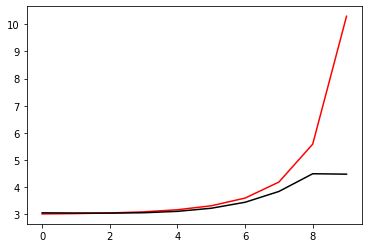

122100 0.031684978671484995
[2.99257301 2.99256797 2.99961088 3.02380981 3.08246604 3.20468306
 3.44000023 3.87052433 4.57933556 4.58030868]


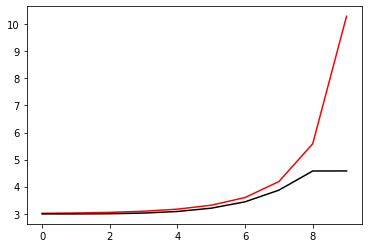

123200 0.01963569831961196
[2.94946681 2.95533445 2.97118511 3.00351553 3.06572568 3.18235411
 3.39940991 3.80235712 4.49281014 4.49644789]


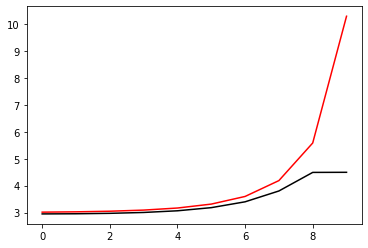

124300 0.021630420987916125
[2.94192671 2.94964831 2.96943742 3.0092826  3.08310168 3.21472006
 3.44761314 3.86335342 4.56194556 4.59266495]


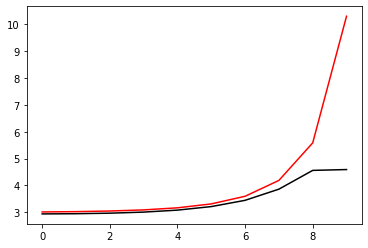

125400 0.0439535232220781
[2.98150655 2.96870275 2.96326228 2.97665267 3.01941636 3.1104547
 3.28593665 3.617895   4.20164488 4.17805536]


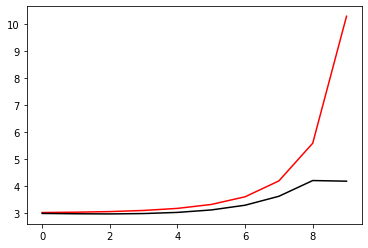

126500 0.046682572246599746
[3.00502794 3.00596215 3.01232582 3.0337178  3.08497119 3.18863895
 3.38390538 3.74337075 4.35877292 4.32234519]


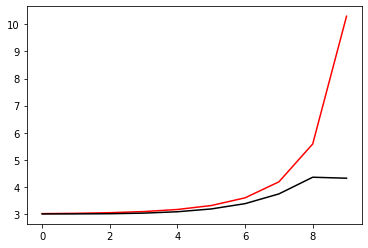

127600 0.011344312210865728
[3.05634937 3.05411774 3.06061884 3.08407913 3.13901979 3.25042597
 3.46220919 3.8515282  4.50828735 4.48501682]


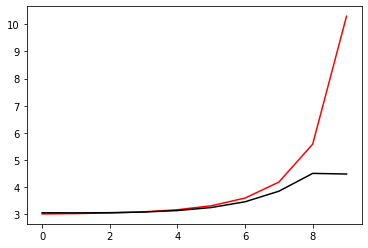

128700 0.02151780816973626
[3.06344428 3.06822656 3.08340716 3.11803412 3.18535745 3.31011215
 3.53769818 3.94931443 4.63691291 4.66948654]


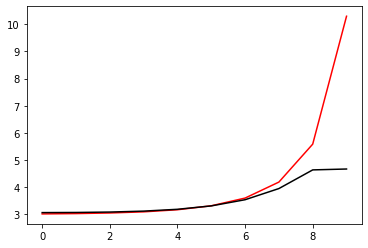

129800 0.01176540919349587
[3.06678148 3.07548004 3.0977945  3.14037222 3.2189102  3.35662332
 3.59784399 4.02542639 4.73679229 4.76697924]


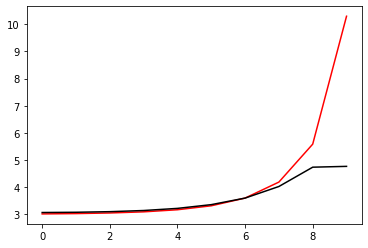

130900 0.036967058430113026
[3.12504375 3.11793572 3.11182483 3.11957127 3.15781022 3.25005466
 3.43659694 3.79196917 4.41092823 4.41314411]


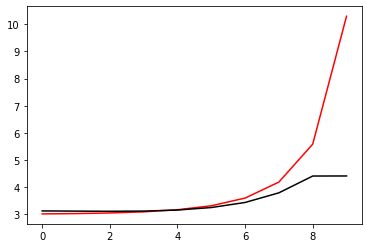

132000 0.025022234921114963
[3.03336612 3.03377589 3.04061558 3.06247699 3.11481507 3.22424999
 3.43843323 3.84158742 4.5313754  4.4957254 ]


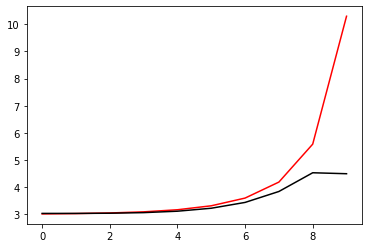

133100 0.031658883849345974
[2.96522402 2.97007094 2.98609966 3.02300925 3.09531787 3.22914258
 3.47327377 3.91644697 4.65988114 4.7001343 ]


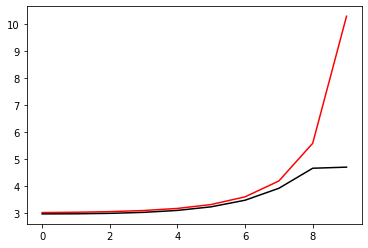

134200 0.02099432332674265
[2.98147838 2.98380676 2.99622571 3.02966529 3.09936353 3.23008421
 3.46662437 3.89126809 4.6021115  4.620913  ]


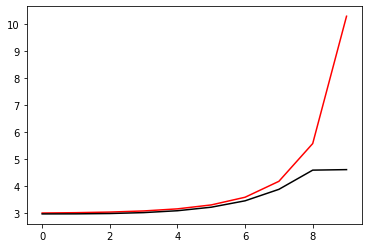

135300 0.02217953938092131
[2.94751876 2.96460359 3.00245688 3.06579442 3.16500475 3.32252838
 3.58183283 4.02293003 4.73946945 4.76772145]


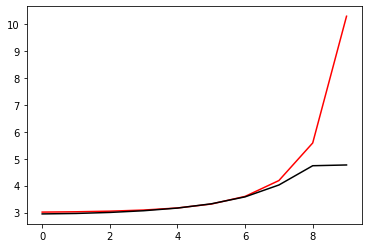

136400 0.04279935956171505
[2.93795195 2.9281027  2.93358787 2.96376343 3.0293907  3.14988063
 3.36231925 3.73737875 4.36212429 4.35575093]


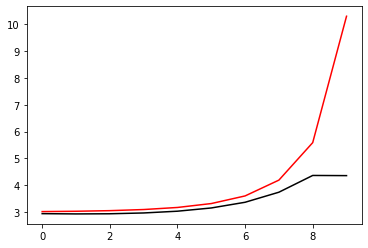

137500 0.05001537570772792
[2.95028288 2.95458935 2.96845226 3.00291706 3.07253957 3.19874262
 3.41963131 3.80597345 4.44374457 4.43368484]


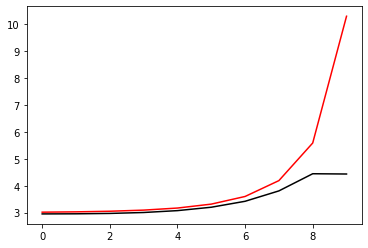

138600 0.011551230640515173
[3.03323905 3.03486382 3.04931002 3.08464426 3.15493455 3.28390622
 3.51267283 3.91390373 4.57241887 4.55521539]


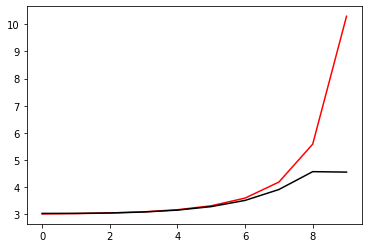

139700 0.0216697046868658
[3.08704077 3.08843949 3.1000462  3.13331127 3.20237225 3.33195993
 3.56605347 3.98194624 4.6657463  4.76190826]


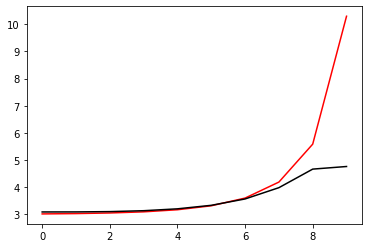

140800 0.011581660965680016
[3.02807244 3.03732987 3.05995677 3.10276435 3.17776396 3.30768697
 3.53531197 3.93885794 4.60978335 4.62481648]


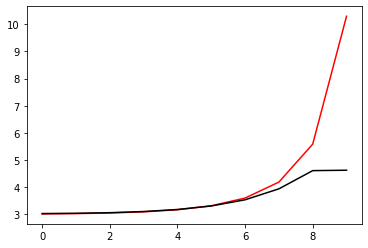

141900 0.041680792480383706
[3.03401655 3.04381434 3.06757717 3.11230628 3.19002228 3.32233524
 3.55058848 3.95355051 4.62716324 4.64686495]


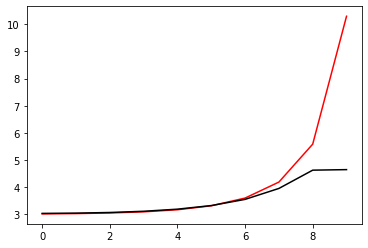

143000 0.02438117661600201
[3.01856761 3.01778175 3.02728741 3.05434998 3.11221734 3.22575763
 3.44135093 3.84267975 4.52544927 4.46256228]


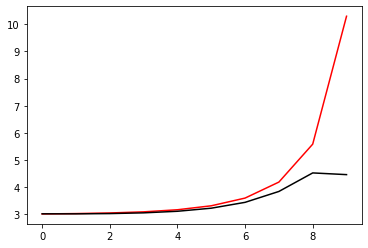

144100 0.03191953488204461
[2.96599661 2.96931311 2.98859418 3.03315097 3.11684641 3.26614147
 3.52896862 3.98935995 4.72942614 4.6920717 ]


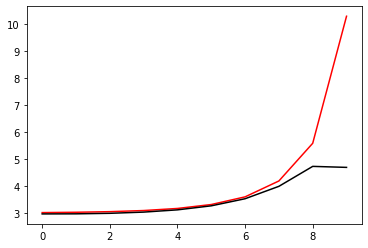

145200 0.018986307769875956
[2.93271642 2.93977593 2.96066442 3.00525211 3.08924557 3.23810904
 3.49963216 3.96242378 4.72688334 4.74710459]


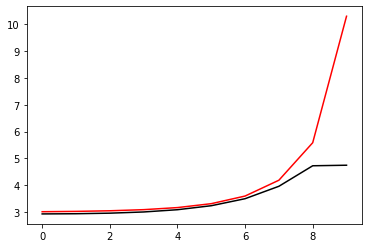

146300 0.05540034602504448
[3.15020401 3.1504438  3.16549915 3.20029518 3.27260962 3.404305
 3.61867594 3.95050933 4.60539191 4.78564079]


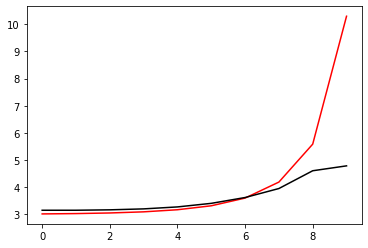

147400 0.04167892741540438
[3.10188062 3.10174556 3.10504934 3.1174211  3.14474447 3.1929786
 3.27262724 3.4252686  3.79013632 3.72029975]


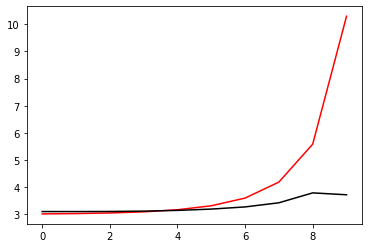

148500 0.048647380890935885
[3.00049864 2.99990835 3.00599734 3.02534122 3.0701156  3.16254981
 3.34583251 3.68895654 4.17854735 4.08614933]


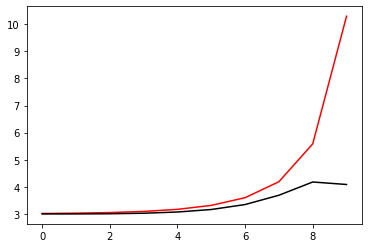

149600 0.05039659254438809
[3.1388372  3.14672647 3.16784708 3.2115867  3.29525801 3.44839894
 3.71539705 4.14983081 4.74997123 4.64429893]


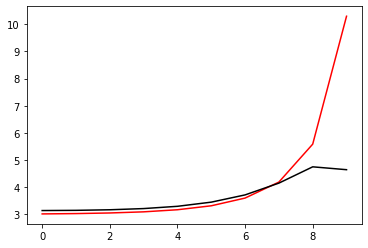

150700 0.02194309536764158
[3.02762879 3.03974043 3.06735349 3.1185055  3.20671794 3.35658756
 3.61266522 4.05292999 4.74958647 4.82359644]


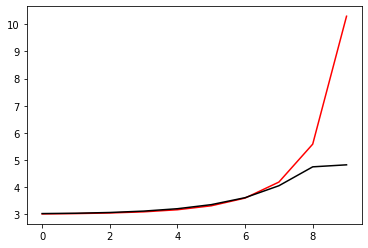

151800 0.012282842736263842
[2.94957794 2.96756685 3.00178828 3.06010157 3.15852409 3.32166356
 3.59441503 4.05616782 4.79103876 4.7823578 ]


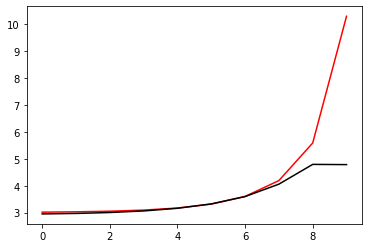

152900 0.08664300594289578
[3.15926976 3.16710993 3.19262682 3.24310838 3.33060521 3.47636131
 3.72005305 4.13850696 4.82641826 4.80824786]


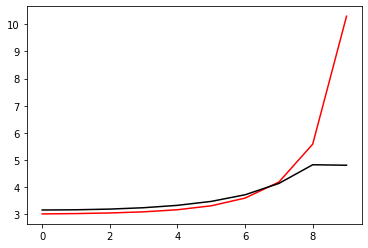

154000 0.02625285011087724
[3.04027188 3.04175569 3.05244902 3.07888217 3.13232916 3.23236273
 3.41519748 3.74838429 4.31818368 4.27048023]


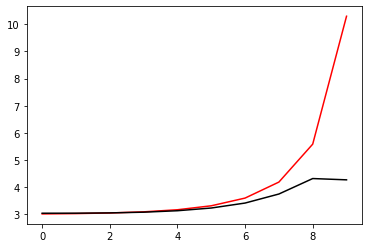

155100 0.031644769069695565
[2.97281851 2.97583075 2.9901653  3.02645551 3.09873039 3.23239034
 3.47414278 3.9049646  4.59786913 4.61167026]


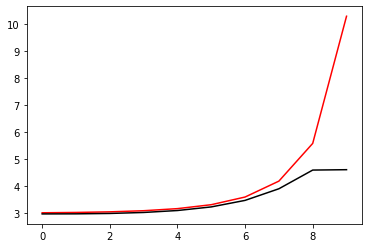

156200 0.02055787637277226
[2.99645104 2.98281407 2.9799164  3.00002376 3.05586473 3.16866376
 3.37409286 3.73141305 4.30559325 4.31780921]


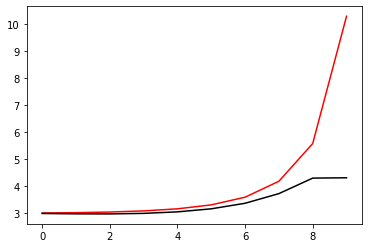

157300 0.021174471974714285
[3.01662648 3.01503832 3.01867933 3.04009369 3.09592578 3.20972041
 3.41969043 3.78935909 4.38443485 4.39361467]


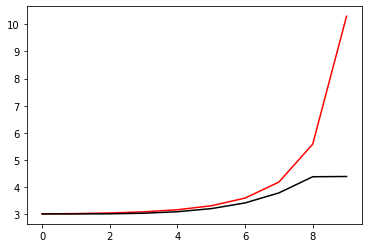

158400 0.038128738668233395
[2.99619902 2.99934684 3.00990961 3.03755688 3.09844642 3.21889641
 3.44288525 3.84290272 4.49056973 4.44590873]


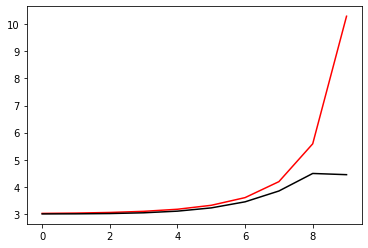

159500 0.04722411909172699
[3.0030152  3.01152426 3.03142441 3.07122253 3.14689914 3.28616878
 3.53752018 3.98276111 4.70139299 4.72890024]


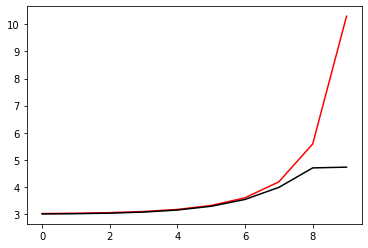

160600 0.011988505710048149
[3.02076206 3.03154614 3.05840016 3.10821434 3.19459057 3.34270854
 3.59838019 4.04316161 4.76700269 4.82299203]


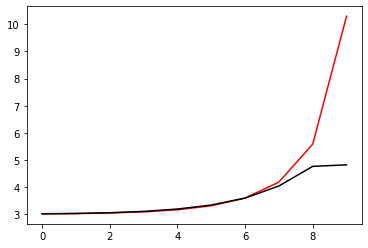

161700 0.02065903476260564
[3.07101541 3.04772266 3.02829094 3.02721057 3.05543511 3.129056
 3.27334084 3.54075533 4.07141489 4.06225428]


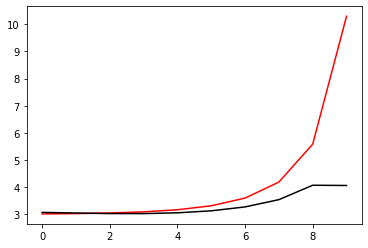

162800 0.010817617348656779
[3.10910976 3.1029692  3.09732212 3.10317074 3.13561406 3.21626222
 3.37921237 3.6866104  4.24564708 4.26138178]


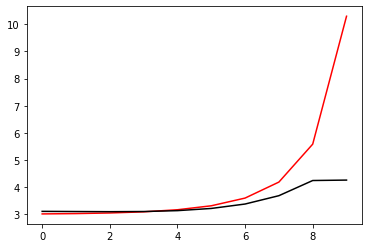

163900 0.041042479827694336
[3.08711153 3.0872679  3.09116696 3.10697175 3.14814634 3.23742191
 3.41551667 3.75573063 4.35261223 4.3584117 ]


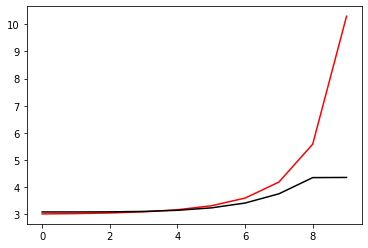

165000 0.09829305425088797
[2.84266617 2.85285364 2.87344682 2.91184286 2.98218087 3.10980074
 3.34219745 3.76747858 4.48877218 4.58439563]


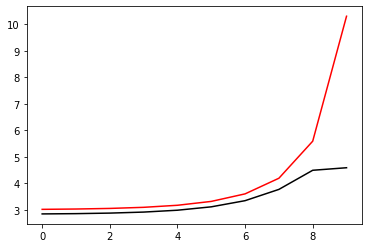

166100 0.03173269756746984
[2.97005532 2.97609234 2.99582747 3.03843323 3.11671743 3.25402717
 3.4941654  3.91629532 4.60569658 4.63224852]


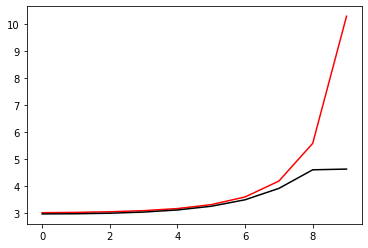

167200 0.016454940000534015
[2.90773165 2.91440212 2.93474429 2.97662734 3.05710266 3.2015005
 3.45743426 3.91065367 4.64965006 4.63658675]


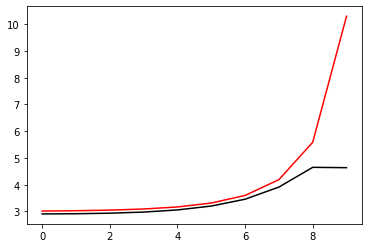

168300 0.021687207842129293
[3.00394071 3.00705488 3.0240224  3.06203349 3.1354988  3.26868115
 3.50571464 3.93402063 4.66100209 4.72805981]


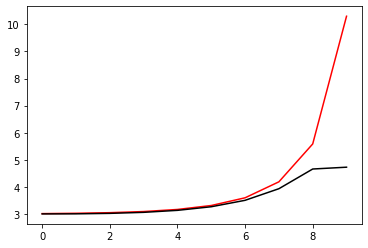

169400 0.038051860070648494
[2.99093915 2.99602137 3.00984388 3.0412269  3.10426004 3.2230169
 3.44076782 3.83470651 4.50605256 4.40880123]


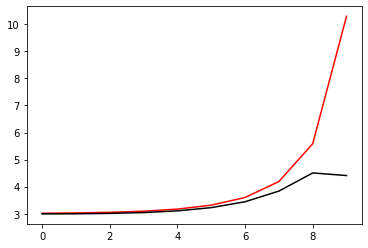

170500 0.04582546705391076
[2.99969663 3.00258737 3.01313145 3.04132223 3.10228779 3.21970468
 3.43551342 3.82520807 4.48148617 4.37351592]


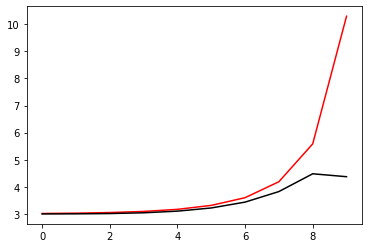

171600 0.030371449367706548
[2.9450296  2.95219897 2.96903463 3.00115809 3.05903127 3.16171845
 3.34456116 3.67308117 4.23180973 4.23875472]


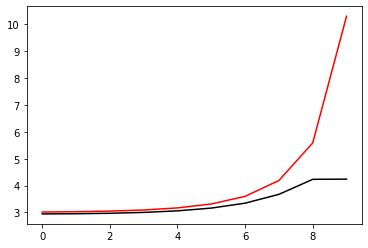

172700 0.021606158687524343
[3.02329472 3.03738923 3.06864516 3.12196353 3.20807039 3.34702639
 3.57506751 3.95551519 4.55371733 4.58442779]


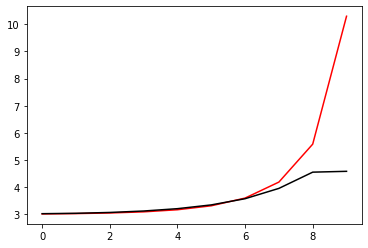

173800 0.011712872721096407
[3.02997435 3.04149356 3.06878018 3.11882417 3.20335548 3.34375947
 3.58047387 3.98677082 4.63819669 4.66212004]


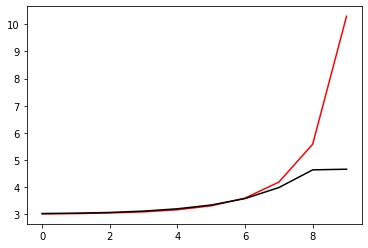

174900 0.04180289387677354
[3.03722637 3.04683841 3.07211432 3.11718653 3.19822732 3.33559828
 3.57609757 4.00398527 4.71336206 4.74962409]


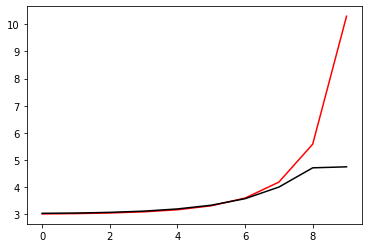

176000 0.028941756039354172
[3.06859198 3.07182111 3.08237253 3.10769012 3.1581704  3.24865859
 3.40351211 3.67530548 4.21117998 4.45829078]


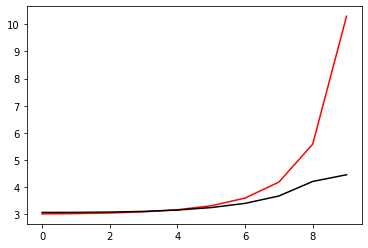

177100 0.03138732588932479
[3.00145264 2.99965675 3.00590697 3.02735557 3.07582172 3.17240932
 3.35816565 3.71287342 4.31300831 4.265503  ]


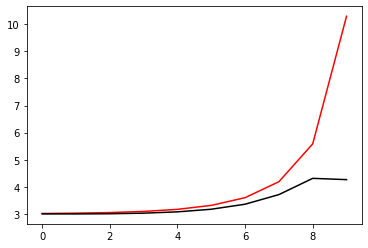

178200 0.020006252698254574
[2.96162163 2.96214081 2.9710811  2.99962481 3.0627183  3.18651906
 3.42036038 3.85484177 4.57257756 4.59708411]


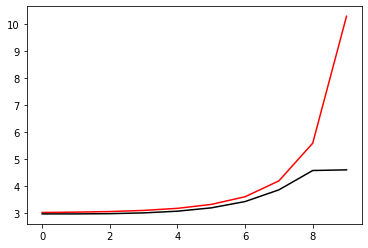

179300 0.020893865541728306
[2.96094547 2.95054335 2.95469765 2.98044516 3.03849341 3.14540828
 3.32381967 3.60756218 4.11897545 4.23058694]


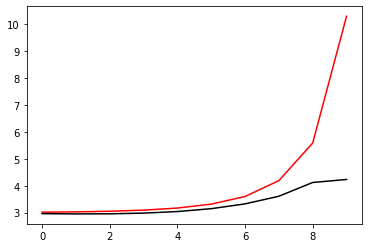

180400 0.03923678715131644
[3.00156964 3.00463612 3.01627485 3.04665043 3.10909369 3.22195012
 3.41277672 3.72659685 4.25896896 4.23465124]


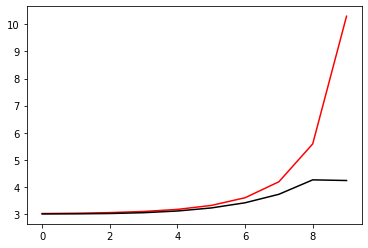

181500 0.045977287262603986
[2.98285661 2.98695962 3.00115178 3.03461597 3.10178507 3.2251872
 3.44120263 3.80952981 4.40781907 4.37572453]


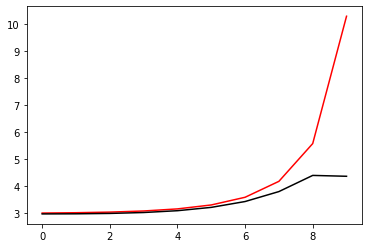

182600 0.013177529958782826
[3.10436399 3.10546815 3.11952516 3.15438152 3.22457273 3.35476294
 3.58716336 3.99233208 4.64246581 4.60173099]


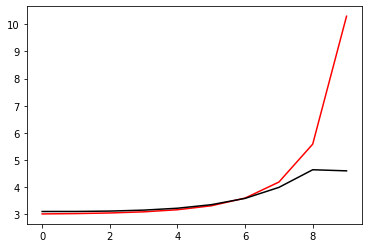

183700 0.022078785263965346
[3.02772279 3.04047413 3.07148805 3.12943675 3.22733253 3.38704681
 3.64904698 4.08656583 4.77671736 4.82012251]


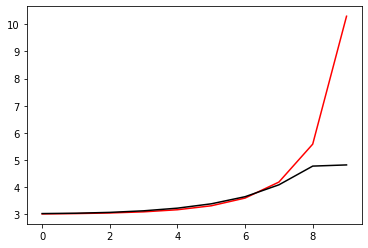

184800 0.011968204341790065
[3.04318009 3.05545929 3.0847404  3.13846272 3.22908327 3.3787374
 3.63109983 4.06585097 4.77249223 4.80121531]


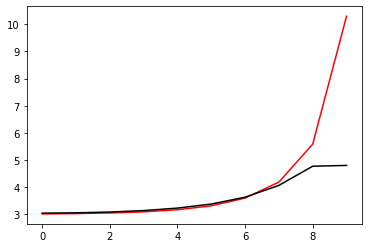

185900 0.07714982625366854
[3.17340046 3.17714977 3.19029466 3.22108428 3.28143876 3.38850238
 3.57029308 3.88540378 4.48415922 4.44001109]


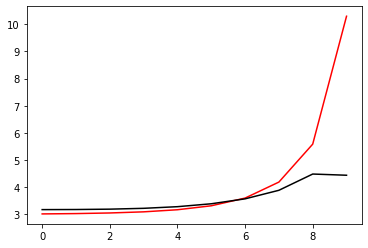

187000 0.05843164160930503
[2.87515951 2.89115175 2.91929211 2.96251393 3.02953495 3.13638707
 3.31272695 3.61753367 4.14822897 4.23449455]


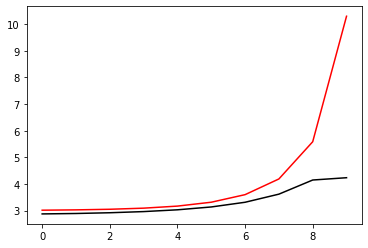

188100 0.032477689610890904
[2.88458731 2.89633934 2.92359541 2.97003461 3.0432495  3.15839238
 3.34462841 3.65644126 4.16261325 4.22347593]


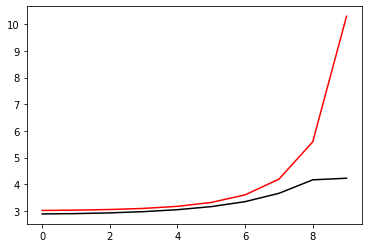

189200 0.020694288279528204
[2.96607435 2.97287301 2.99411465 3.0380162  3.11556395 3.24586907
 3.46314189 3.82600526 4.39255227 4.41058984]


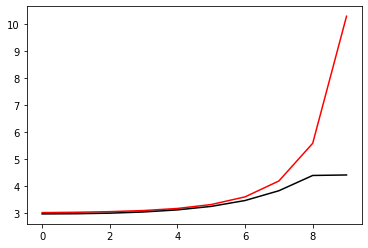

190300 0.022065704028453748
[2.93884773 2.95678584 2.99695076 3.06454246 3.16915196 3.33019471
 3.58380888 3.99223958 4.61353767 4.63632345]


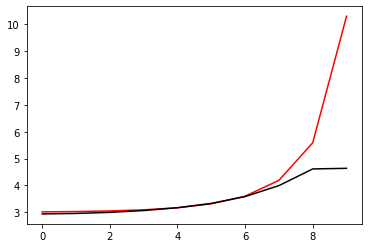

191400 0.03744984449673651
[2.92544318 2.94351731 2.98086107 3.04270505 3.1392987  3.2885017
 3.52131623 3.88681272 4.41802565 4.29253596]


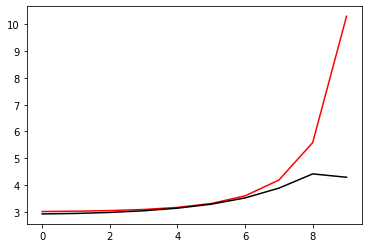

192500 0.044918644469868006
[2.95180933 2.97092436 3.00941079 3.07343541 3.17329564 3.32676908
 3.56435707 3.93296762 4.45983915 4.36258181]


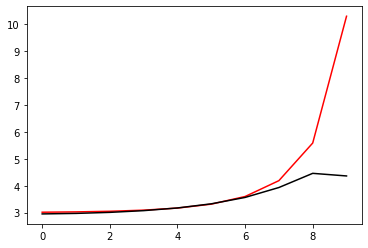

193600 0.012024923468600646
[3.03420925 3.0449722  3.07254215 3.12660564 3.22163284 3.38129519
 3.64601485 4.07906022 4.71699898 4.66980413]


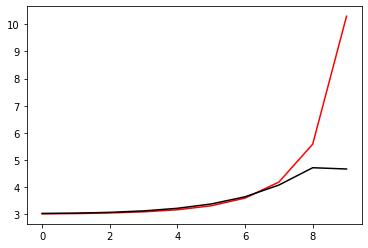

194700 0.02217244669032615
[3.01194525 3.0248648  3.05552372 3.11113045 3.20601792 3.36640461
 3.63776893 4.09875924 4.82653327 4.85920683]


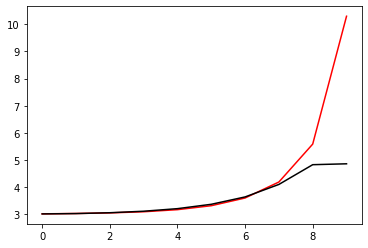

195800 0.011945108813032864
[3.02410071 3.03583596 3.06406884 3.11595533 3.20428068 3.35087377
 3.59894782 4.03440225 4.7625708  4.80775423]


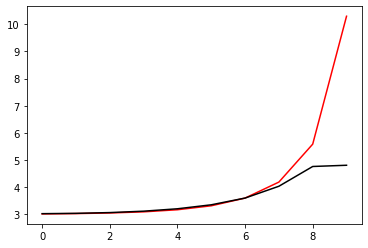

196900 0.04127916812590267
[3.04776838 3.06194432 3.08529923 3.12499555 3.19253064 3.30465383
 3.48889988 3.80512791 4.40448517 4.28584794]


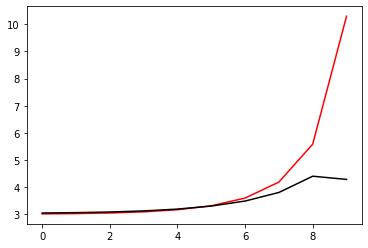

198000 0.02350103938107053
[2.9484159  2.96996398 3.01556416 3.08669411 3.19549354 3.36419899
 3.63312667 4.07342025 4.76135688 4.72093909]


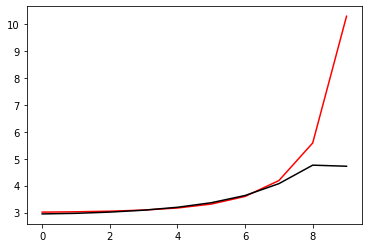

199100 0.03849424123593512
[3.01144696 3.0385133  3.07949463 3.14101768 3.2327688  3.36803262
 3.54449864 3.49163983 3.95483073 4.44175234]


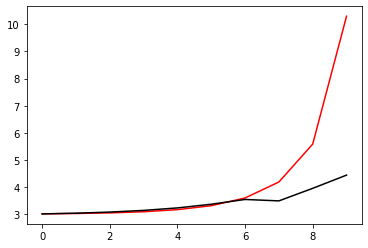

200200 0.020862711917386877
[3.02754132 3.04574984 3.08340451 3.14258617 3.22924578 3.34729884
 3.47861734 3.62524538 3.94860059 3.94985134]


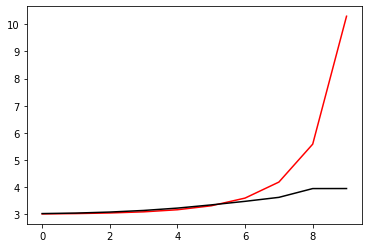

201300 0.020875206939282007
[2.98603273 2.99877729 3.02872723 3.07993903 3.15643632 3.2631894
 3.41396178 3.66002471 4.0244355  4.03214423]


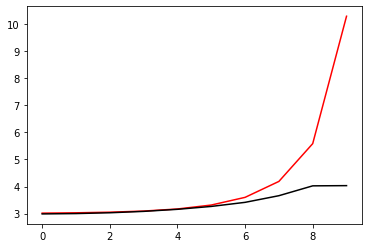

202400 0.03820367771208615
[2.97439435 2.98465086 3.00892533 3.0547742  3.1336676  3.26558826
 3.49789492 3.88441063 4.29093479 4.20423479]


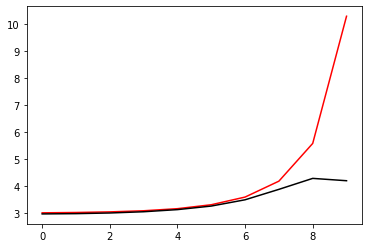

203500 0.04774105804477569
[3.00476317 3.007739   3.02162119 3.05347144 3.11461705 3.22273592
 3.40572645 3.70642389 4.13967774 4.09431964]


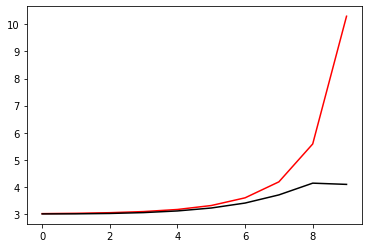

204600 0.011605666674799422
[3.06305768 3.06793149 3.08342231 3.11947914 3.19167091 3.32575562
 3.56450279 3.967343   4.53334292 4.48530131]


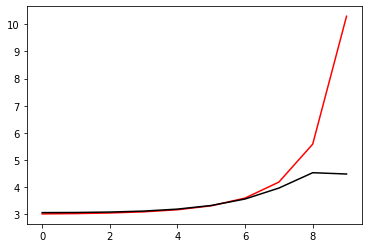

205700 0.02186480309384204
[3.04058719 3.05189494 3.07910882 3.1296998  3.21749021 3.36734603
 3.62181562 4.05067976 4.70653396 4.74248286]


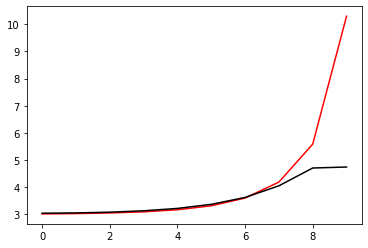

206800 0.0113622237178428
[2.99770681 3.02794298 3.0711178  3.13469609 3.23050608 3.37557987
 3.57135756 3.64726154 4.12256755 4.6036438 ]


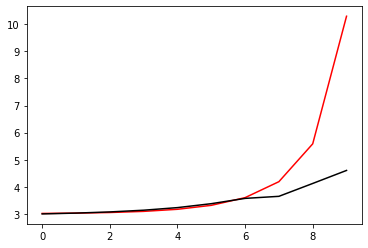

207900 0.041516165663423844
[3.00973181 3.02867596 3.06784415 3.12946734 3.22060509 3.34945668
 3.51392061 3.72834614 4.12307783 4.12383946]


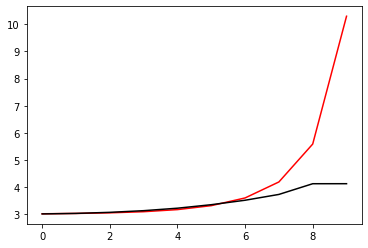

209000 0.025395318308256486
[3.00467139 3.01538776 3.04349543 3.09576942 3.18042208 3.31172295
 3.51923697 3.86103725 4.27258973 4.24050121]


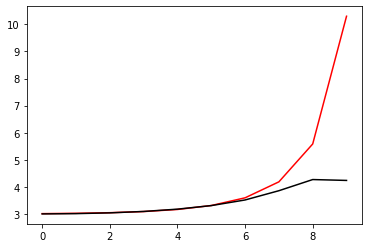

210100 0.031642129429019714
[2.97011439 2.9767066  2.99724857 3.0407127  3.12052555 3.2578137
 3.48889616 3.90803512 4.47875396 4.48589834]


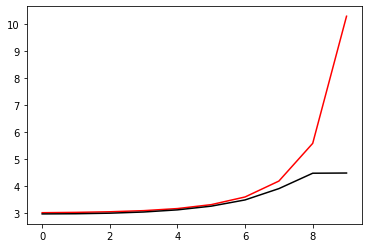

211200 0.07471664421718968
[2.79264665 2.80296242 2.83393722 2.88981729 2.98523742 3.14619519
 3.40209441 3.71637242 4.11124128 4.28246612]


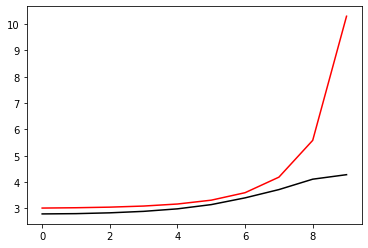

212300 0.021247418061410034
[2.9274915  2.93195785 2.95123586 2.99566914 3.07879697 3.22308598
 3.45503196 3.75888158 4.13931897 4.14085477]


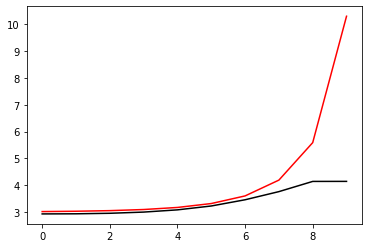

213400 0.038374214124457684
[2.94497092 2.95672169 2.98382303 3.03484816 3.1241312  3.27326126
 3.50951148 3.8424989  4.26619146 4.2347319 ]


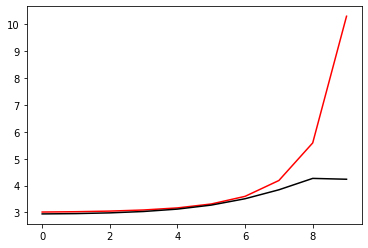

214500 0.045289966883107116
[2.96132508 2.97074206 2.9959076  3.0460636  3.13549693 3.28613081
 3.52950959 3.89912807 4.39255442 4.41351946]


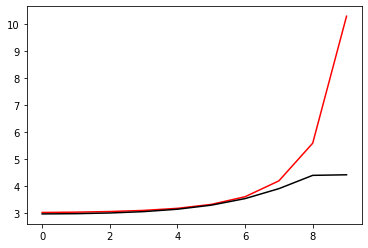

215600 0.017204283848628207
[3.11524194 3.11393944 3.12892455 3.16888423 3.24838415 3.39089903
 3.63347324 4.02825887 4.59417945 4.53350261]


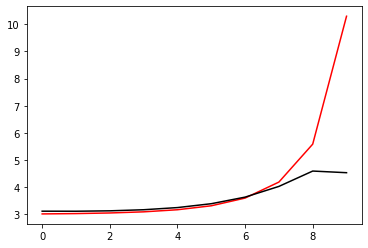

216700 0.02130643395156937
[3.05615336 3.07133284 3.10230381 3.15377695 3.23572239 3.36543955
 3.57187313 3.89944117 4.3746666  4.39492425]


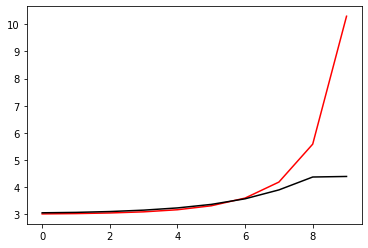

217800 0.011468935693843389
[3.03774859 3.04530188 3.06537739 3.10687622 3.18359525 3.31746209
 3.54585768 3.93057743 4.51973045 4.52103645]


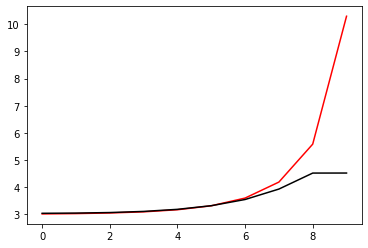

218900 0.04012104307512839
[3.06886943 3.07860265 3.10220441 3.14678768 3.22447197 3.35685448
 3.5840666  3.98016566 4.62788457 4.63943204]


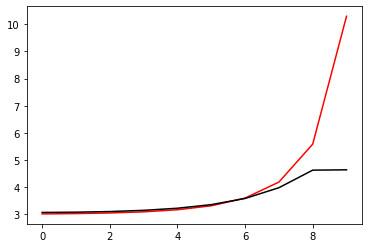

220000 0.1558467318839323
[2.72820754 2.73854935 2.76360088 2.81146311 2.89501151 3.03911195
 3.29271501 3.75366391 4.5441178  4.73312166]


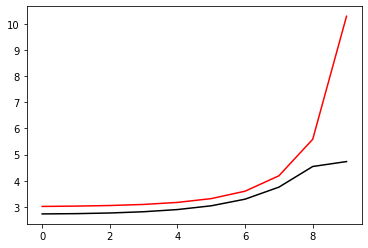

221100 0.03247792364661573
[2.98623543 3.00155586 3.03503247 3.08854894 3.16832189 3.28323782
 3.43989715 3.69213265 4.10546566 4.07412306]


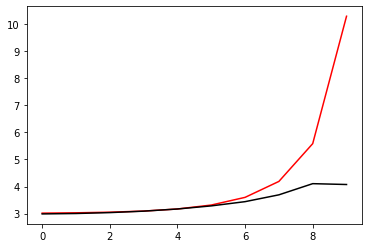

222200 0.02076958425754557
[2.9725055  2.98085965 3.00346959 3.04748499 3.12241873 3.24479023
 3.44764902 3.79261728 4.31296148 4.33501977]


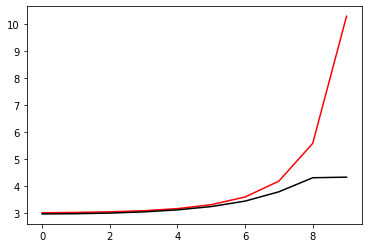

223300 0.020828214428546547
[3.03975468 3.04466653 3.05995991 3.09216668 3.15178681 3.25507225
 3.42622254 3.70427142 4.15585243 4.1904851 ]


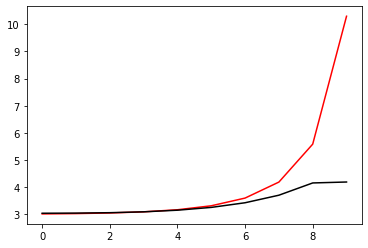

224400 0.041345845645743375
[2.96237974 2.96889886 2.98477711 3.01717598 3.07693914 3.18209303
 3.36392655 3.67614579 4.17425119 4.0651731 ]


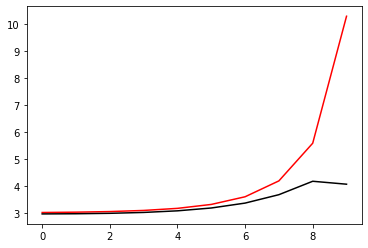

225500 0.045088995239470464
[2.98029007 2.98819965 3.00876803 3.0507361  3.12874324 3.26696524
 3.50674313 3.91317812 4.53167588 4.45704515]


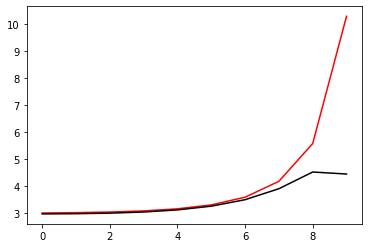

226600 0.011634551105765431
[3.05577665 3.07185967 3.10301619 3.15387145 3.23447814 3.36277162
 3.56952108 3.90399463 4.40848124 4.33270707]


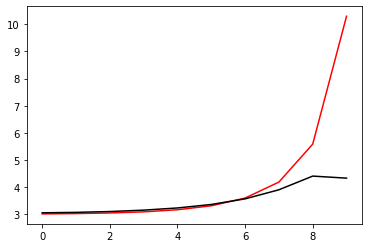

227700 0.02127022682471752
[3.00987395 3.02396789 3.05379321 3.1042305  3.18483995 3.31248011
 3.51701651 3.84843272 4.35034375 4.36612731]


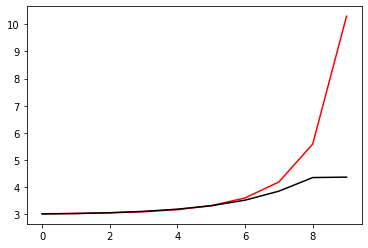

228800 0.011889893820574402
[2.94132101 2.95383526 2.98162896 3.03151718 3.11601734 3.25653304
 3.49069928 3.88257374 4.48856235 4.4995545 ]


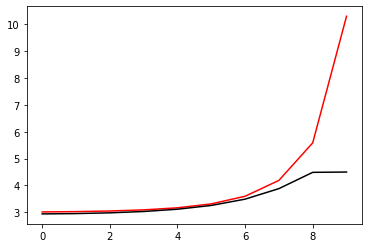

229900 0.04187948133904477
[3.03419967 3.04736111 3.07837623 3.13462872 3.2283694  3.38107308
 3.63168606 4.05041218 4.71040097 4.73087765]


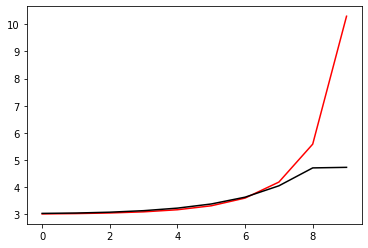

231000 0.023847936885291125
[2.96731413 2.96966288 2.99012373 3.03734623 3.1259599  3.2824316
 3.55560677 4.02810432 4.78275501 4.69816766]


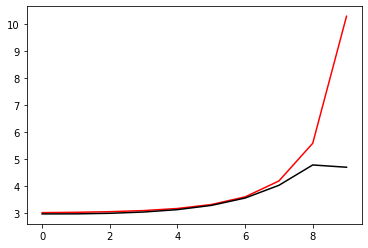

232100 0.031872340364782176
[2.98217129 2.99171012 3.01573109 3.0609222  3.13930074 3.27099617
 3.48810153 3.84181787 4.41185925 4.3922821 ]


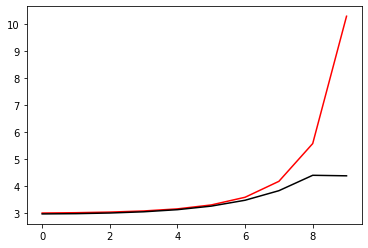

233200 0.020990766850022848
[2.97540375 2.98206309 3.0016448  3.0432734  3.12028053 3.25460787
 3.4846246  3.87713452 4.5068851  4.52457276]


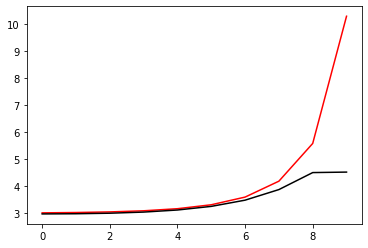

234300 0.021010997959626136
[2.99047589 2.99621947 3.01227138 3.04499713 3.10539603 3.2120328
 3.3975164  3.72044383 4.25334668 4.26472985]


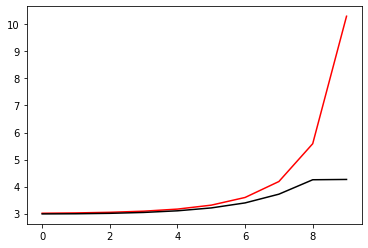

235400 0.037692615362355804
[2.9858197  2.99069597 3.00599283 3.04137412 3.1112959  3.23973803
 3.46977702 3.87655452 4.53596485 4.44013434]


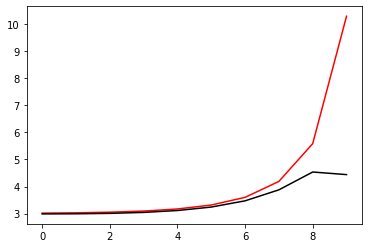

236500 0.046739361741086574
[2.97736339 2.99423002 3.02501461 3.07258336 3.14723842 3.26750603
 3.46400628 3.77956772 4.2113692  4.09415842]


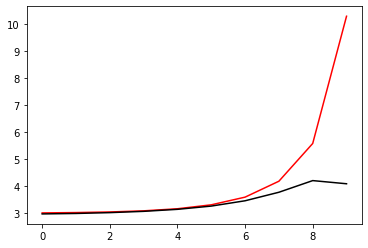

237600 0.011551178324748003
[3.02226242 3.02846422 3.04868297 3.09114778 3.1682226  3.30219106
 3.53536004 3.93401046 4.4812965  4.42708834]


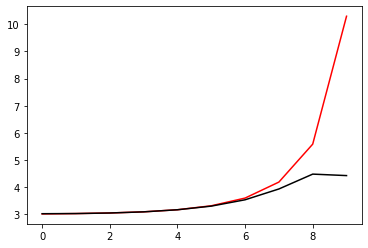

238700 0.0217950603493782
[3.03737377 3.04699704 3.06935721 3.11411876 3.19660088 3.34362841
 3.60105836 4.03782131 4.67290684 4.81567199]


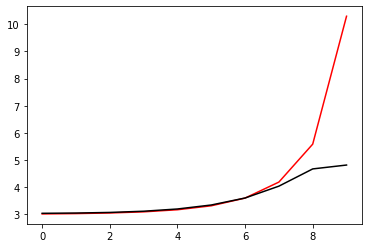

239800 0.01178883876264165
[3.03134381 3.04155419 3.06651253 3.1140501  3.19731886 3.33943192
 3.58225449 4.00387689 4.69691459 4.72844533]


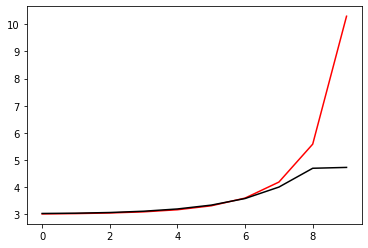

240900 0.042976912809706724
[2.9180993  2.95296673 3.00893701 3.09223144 3.21554328 3.40366302
 3.69935676 4.17807257 4.92132067 4.74799991]


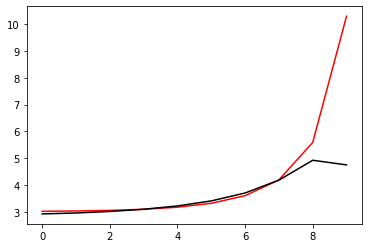

242000 0.11838614451498354
[2.78320672 2.79044023 2.81608806 2.86970542 2.96240226 3.1173493
 3.37416139 3.81108522 4.52134388 4.88713353]


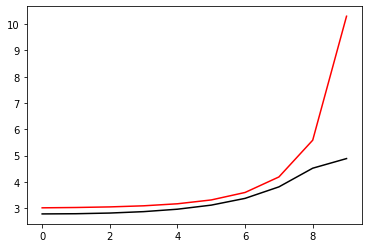

243100 0.031755283716730996
[2.97100314 2.97774199 2.99910026 3.04378161 3.12466661 3.26442169
 3.50378522 3.91361747 4.56957683 4.56478956]


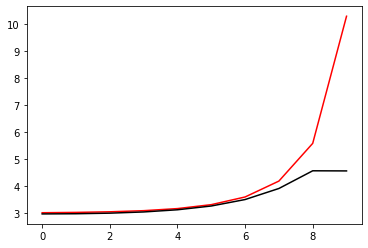

244200 0.01912828620373342
[2.93460993 2.94218961 2.96265555 3.00513889 3.08503557 3.22685921
 3.47576195 3.91218747 4.61829139 4.63174478]


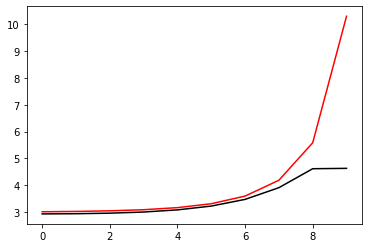

245300 0.021526752085199417
[2.93470259 2.92367931 2.92353008 2.94904185 3.01377533 3.13957212
 3.3643023  3.75338211 4.37959698 4.38241544]


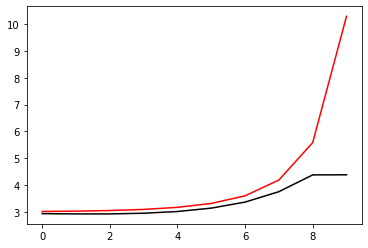

246400 0.03837541499924254
[2.94232759 2.94911042 2.96550481 3.00165051 3.07448262 3.20910419
 3.44616202 3.85421039 4.50624298 4.45957139]


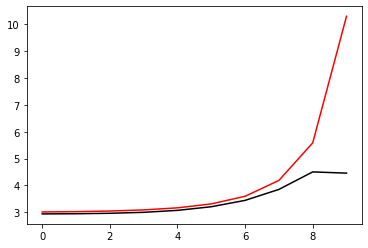

247500 0.04474546838420798
[2.97125726 2.97854545 2.99807532 3.0383983  3.11455995 3.25232226
 3.49604656 3.92010348 4.60072883 4.5959635 ]


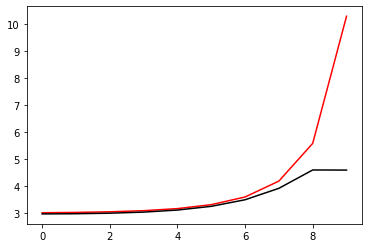

248600 0.011880699954979784
[3.02125945 3.03015099 3.05288378 3.09708206 3.17744209 3.32015867
 3.57179732 4.01295065 4.7276678  4.74218096]


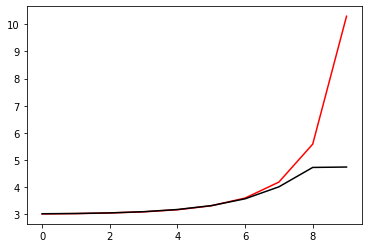

249700 0.02187972152709169
[3.0410434  3.05150757 3.07740689 3.12672759 3.21212466 3.35718281
 3.60618018 4.0400206  4.75174281 4.77143505]


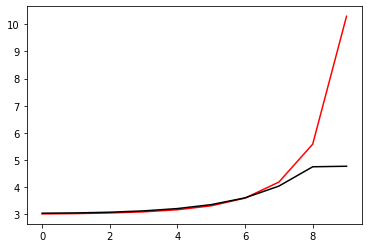

250800 0.01526850562597345
[2.96051134 2.95893148 2.96088635 2.98059725 3.03082465 3.13259187
 3.32098568 3.6724978  4.34527761 4.33678862]


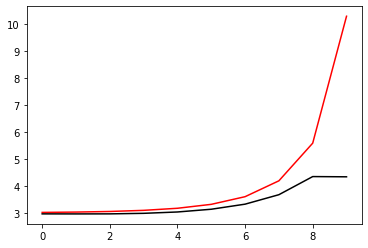

251900 0.0398204138994387
[3.08008925 3.08713747 3.10495342 3.14079246 3.20716508 3.32610459
 3.53774464 3.91767175 4.56531539 4.57985337]


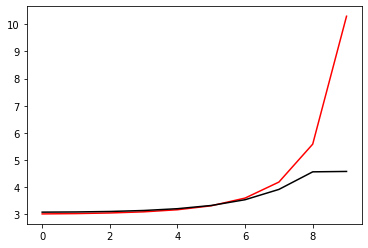

253000 0.06256256965601405
[2.894679   2.88952124 2.89541802 2.92446367 2.991541   3.12150209
 3.35747078 3.77252309 4.44752782 4.48764704]


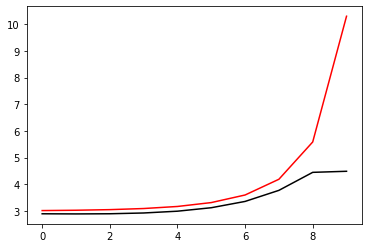

254100 0.03172745692090843
[2.98942742 2.99066409 3.00066217 3.02960197 3.09411412 3.22162559
 3.4586194  3.88379186 4.5805044  4.56361598]


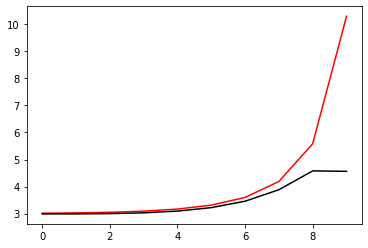

255200 0.01650809255425601
[2.90994352 2.91543029 2.93511082 2.97600414 3.05260257 3.19178388
 3.442788   3.89354079 4.64144301 4.61469745]


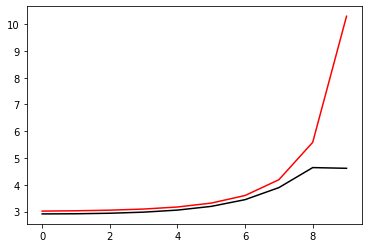

256300 0.021873548117158303
[2.93210858 2.94109146 2.96382235 3.00851036 3.08948973 3.23164813
 3.48057785 3.92197857 4.65977447 4.70001101]


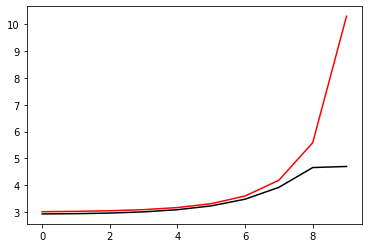

257400 0.08268595143065077
[2.85717845 2.84562919 2.85026998 2.87569928 2.93650983 3.05097546
 3.23617137 3.50160204 4.08089202 4.51348777]


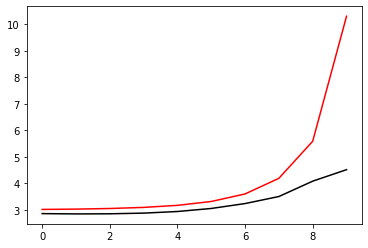

258500 0.051175634277329
[2.94569056 2.94339423 2.94512979 2.96291827 3.01176154 3.11006462
 3.28069552 3.55674962 4.09780176 4.09303009]


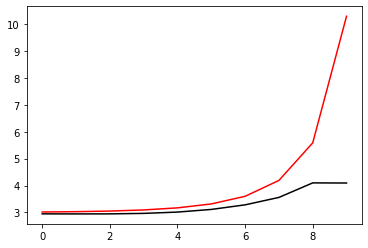

259600 0.028210158784411105
[2.96924324 2.97278835 2.98424616 3.01021756 3.06293172 3.16233418
 3.3401009  3.64995143 4.19611381 4.19335513]


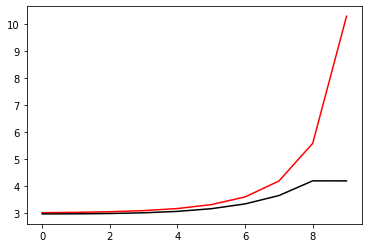

260700 0.021402058003181502
[3.06163979 3.0694205  3.08838274 3.12858921 3.20162968 3.32829217
 3.54630455 3.92278867 4.53930428 4.59567356]


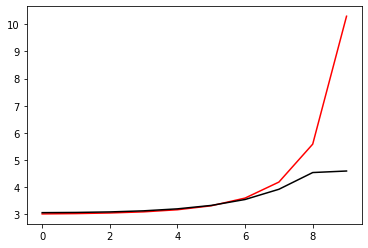

261800 0.011748988477288207
[3.02722428 3.03725413 3.06215065 3.10970885 3.19304769 3.33446105
 3.57578685 3.99226214 4.66583852 4.68883452]


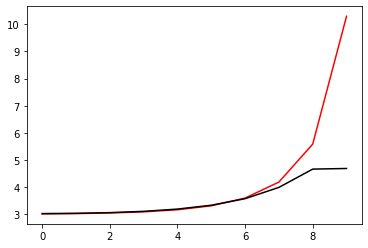

262900 0.03504123519894642
[3.0995025  3.10477969 3.12306975 3.1614501  3.23262535 3.35872991
 3.58306486 3.9867922  4.66864856 4.6840469 ]


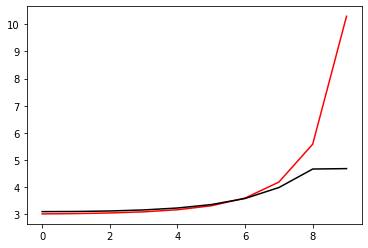

264000 0.025795816572907828
[3.01145728 3.02197634 3.04811356 3.09440599 3.16810258 3.28117917
 3.45680755 3.76089239 4.22024544 4.16130235]


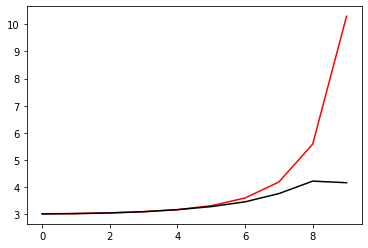

265100 0.033299138555327394
[2.88472005 2.89640488 2.91935865 2.95985593 3.02866709 3.1435725
 3.33419049 3.64828842 4.14216384 4.26666728]


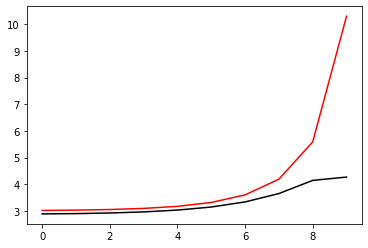

266200 0.020681927345973447
[2.96646585 2.9713368  2.98988412 3.03114433 3.1074513  3.24058156
 3.46987868 3.86173418 4.46317166 4.47679437]


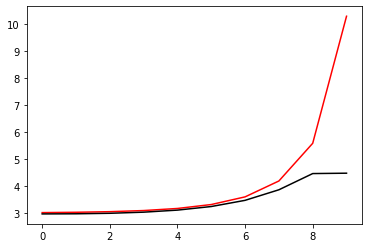

267300 0.021800822816599414
[2.95531293 2.96586057 2.99206253 3.04214014 3.1288621  3.27464485
 3.5205593  3.9394488  4.60488779 4.63612019]


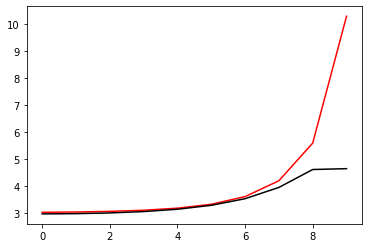

268400 0.037658908040312786
[3.06141057 3.06619079 3.08025357 3.11323065 3.17770607 3.29367286
 3.49768829 3.85803491 4.46294392 4.3968723 ]


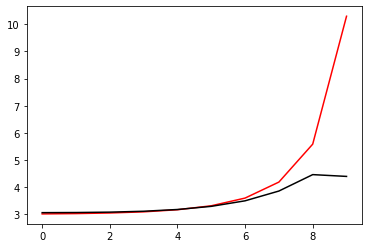

269500 0.0443514628340361
[2.96866104 2.9791354  3.00456759 3.05274895 3.1410193  3.29879983
 3.57568394 4.05181087 4.8002542  4.74165544]


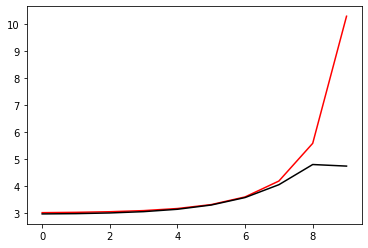

270600 0.01172665126824448
[3.04042152 3.04256943 3.05606759 3.0904614  3.16161996 3.29646031
 3.54181692 3.97816781 4.68907043 4.64319317]


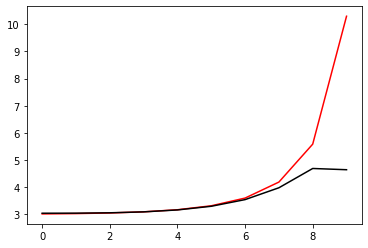

271700 0.0218011401389894
[3.02324021 3.03215717 3.05464941 3.09828048 3.17677883 3.31585098
 3.56260643 4.00169636 4.72805607 4.76284753]


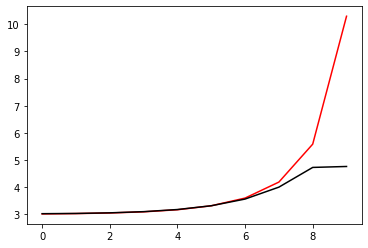

272800 0.011796291460736498
[3.06667417 3.07619177 3.10032102 3.14536094 3.22592802 3.36484364
 3.60572641 4.03216225 4.7455494  4.77988342]


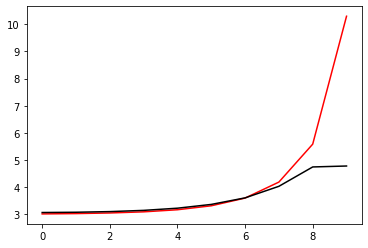

273900 0.05128979010159861
[2.96084036 2.95577369 2.95544606 2.9742029  3.02542616 3.13025466
 3.32773739 3.69410452 4.33204186 4.30277789]


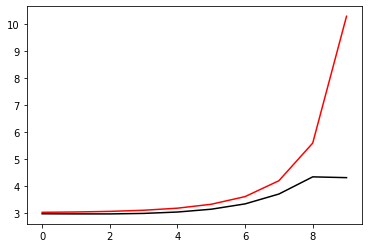

275000 0.024555972324397973
[3.00971088 3.01397862 3.02490456 3.05135039 3.10815281 3.21867292
 3.42357089 3.79857988 4.44318186 4.42149753]


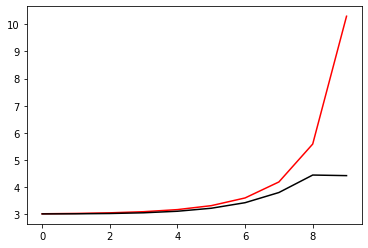

276100 0.03173377281991415
[2.99361793 2.99655847 3.00860818 3.03873428 3.101325   3.22081544
 3.44105997 3.84080538 4.51705502 4.53402201]


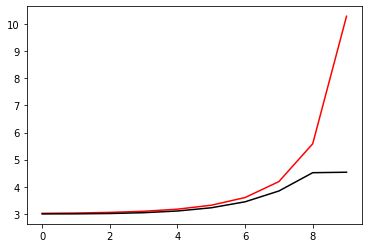

277200 0.019419172042416336
[2.92140376 2.93825826 2.97441703 3.03238262 3.12261561 3.26787646
 3.51137452 3.93245366 4.62620722 4.62319401]


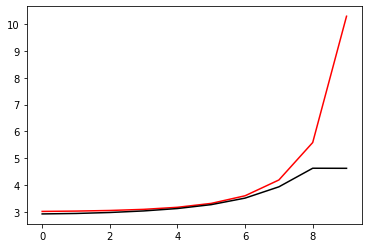

278300 0.02187563228249871
[2.94784837 2.95822429 2.9842133  3.03466367 3.12306932 3.27155026
 3.5208209  3.94675733 4.64060309 4.66917208]


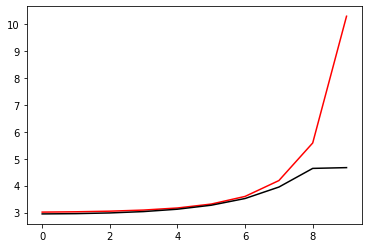

279400 0.035884973959729505
[2.94569297 2.96225662 2.9953401  3.05397487 3.15416783 3.32170572
 3.60125222 4.06866069 4.8078112  4.60238445]


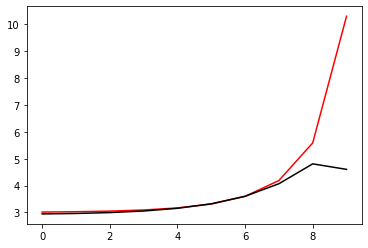

280500 0.059851532661192405
[3.03383138 3.05915558 3.10361418 3.17567146 3.29025764 3.47078976
 3.75870958 4.22843938 4.96323245 4.84872448]


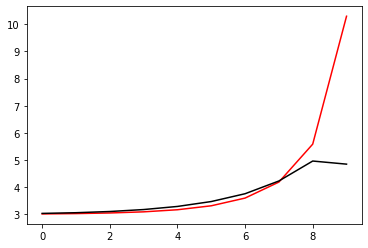

281600 0.03077554230892751
[2.97122273 2.95181561 2.94679778 2.96566166 3.02184743 3.13159021
 3.30987559 3.57221706 4.11669957 4.17346011]


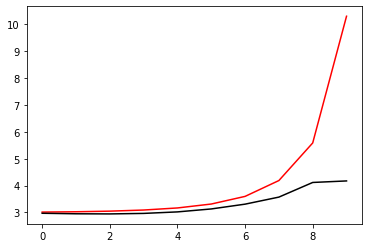

282700 0.014765929184054455
[2.91993003 2.9207508  2.92916782 2.95632215 3.01774031 3.13310644
 3.32755886 3.63988419 4.20905359 4.19970618]


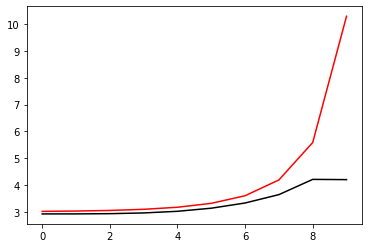

283800 0.011118553626434493
[3.00972277 3.0145999  3.02932873 3.06178072 3.12399962 3.23605631
 3.4308678  3.76408563 4.32886682 4.33754429]


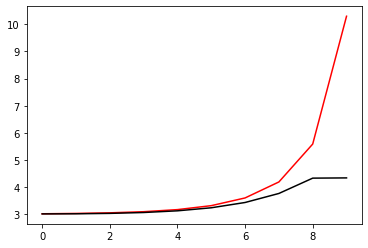

284900 0.10053883691145449
[2.78861229 2.80680653 2.83915863 2.89062256 2.9712869  3.09915187
 3.30732594 3.65660714 4.22537425 4.20531   ]


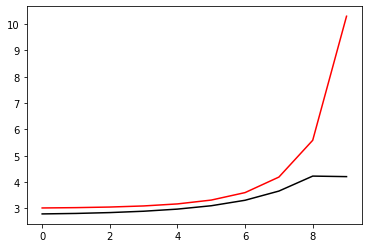

286000 0.02426811018250918
[2.98237146 2.99947558 3.03484919 3.09247727 3.18261442 3.32355389
 3.54767838 3.90845013 4.45437295 4.43560616]


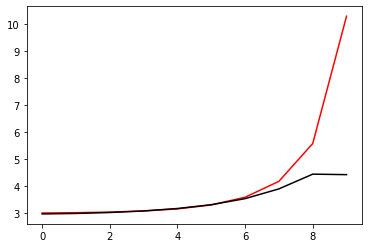

287100 0.03066951467783778
[2.93476223 2.9292741  2.93778617 2.96941559 3.03549323 3.15546869
 3.36387187 3.72081593 4.28699255 4.36962673]


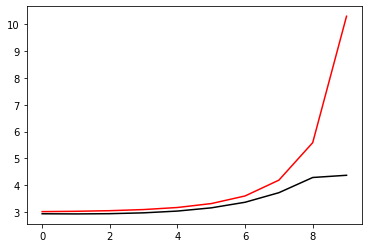

288200 0.020733184024624332
[2.9742651  2.97910098 2.99457302 3.02979461 3.09857189 3.22402622
 3.44579756 3.83073556 4.44583805 4.46238398]


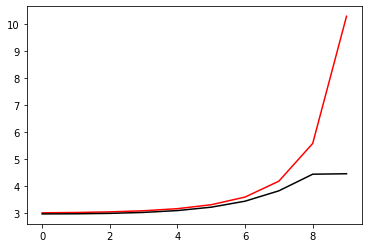

289300 0.020763557447741585
[2.97452825 2.96962845 2.97855751 3.00586281 3.05918644 3.15276565
 3.31112669 3.58328813 4.07445001 4.12609523]


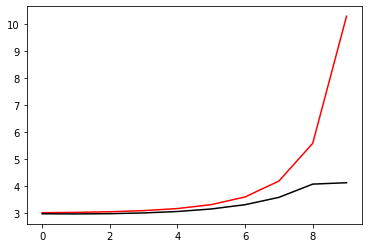

290400 0.03926537892266117
[3.00554195 3.00979151 3.02323868 3.05433686 3.11468511 3.2218593
 3.40590919 3.72188821 4.25415987 4.21844336]


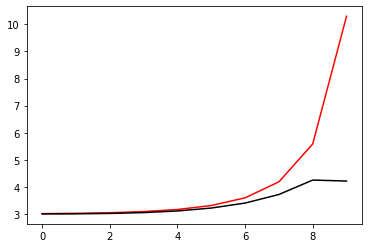

291500 0.04541787204469401
[2.98314285 2.98843561 3.00446436 3.0400705  3.10966268 3.23654501
 3.46027725 3.84729295 4.46923049 4.43377338]


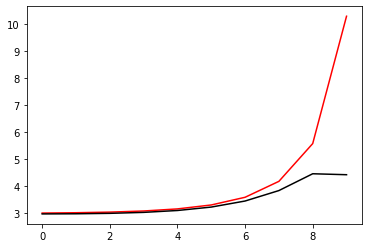

292600 0.01668924083274448
[3.10598961 3.1166853  3.14045446 3.18306519 3.25663096 3.38240746
 3.59835105 3.97135055 4.57550111 4.51090003]


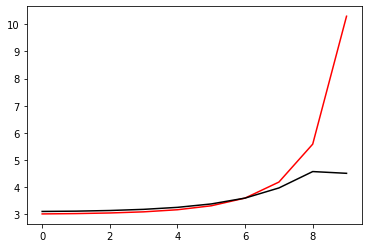

293700 0.021224648648035662
[3.0185486  3.03350758 3.06395852 3.11339896 3.19027135 3.31085093
 3.50574438 3.83064094 4.34963916 4.36687548]


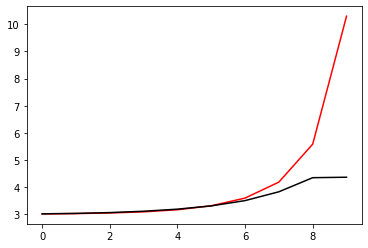

294800 0.05744043511393915
[2.78173192 2.79668043 2.82593129 2.87603043 2.95863798 3.09349913
 3.31554101 3.6856541  4.26627144 4.36376718]


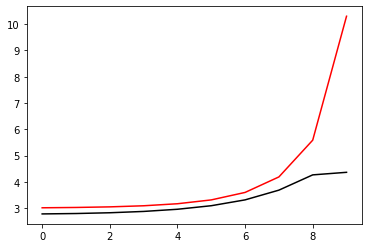

295900 0.05221647402502792
[3.10730649 3.12214822 3.1536811  3.20585715 3.28711326 3.41322511
 3.61237338 3.93286772 4.42228722 4.39497467]


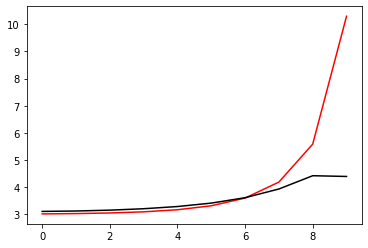

297000 0.024555437022949503
[2.98781873 3.00319336 3.03623255 3.09145009 3.1782822  3.31340129
 3.52621613 3.86546533 4.37209886 4.32994865]


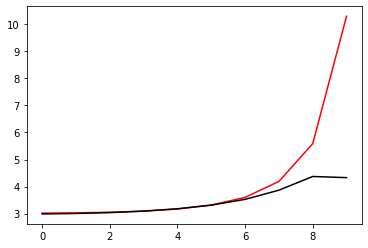

298100 0.03682418343945038
[2.87071225 2.88141335 2.90645794 2.95190882 3.0277755  3.15131222
 3.35341181 3.68894093 4.21542782 4.28086837]


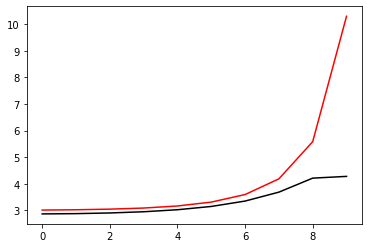

299200 0.02088143559948074
[2.99649613 2.99734544 3.00809126 3.03826453 3.10026706 3.21492033
 3.41991869 3.78283858 4.3702435  4.4006335 ]


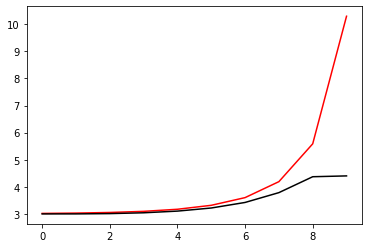

300300 0.021535076557350204
[2.9556824  2.95825556 2.9690702  2.99891785 3.06316614 3.18706129
 3.41678239 3.83714767 4.54768494 4.58192976]


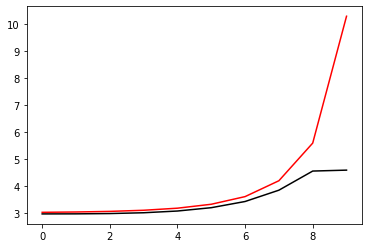

301400 0.04011881519470204
[3.01086329 2.99820286 2.99287045 3.00859549 3.05774925 3.16075837
 3.35481912 3.70731194 4.30335939 4.27218705]


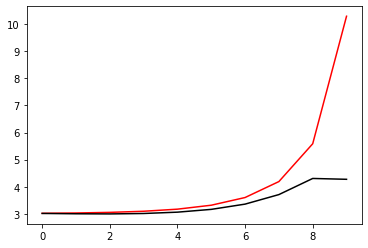

302500 0.04624795142045976
[2.99892442 2.99788136 3.00202278 3.02215045 3.07524436 3.18718391
 3.40081308 3.79001153 4.43922986 4.40626206]


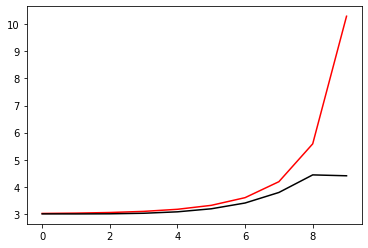

303600 0.01877190656843282
[3.12923965 3.12611518 3.1336244  3.15967366 3.21967872 3.34066469
 3.56993502 3.98818826 4.68012342 4.63292782]


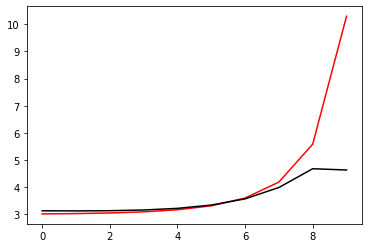

304700 0.020990771510563982
[3.06775533 3.07326455 3.08791756 3.11796234 3.17399491 3.27546905
 3.45826474 3.78638154 4.33588483 4.35937158]


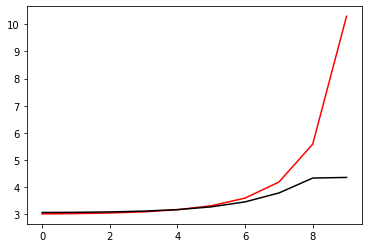

305800 0.011311785985538196
[3.05876434 3.0639951  3.07859479 3.11066057 3.17395055 3.29171226
 3.50493137 3.88526963 4.50686718 4.51601888]


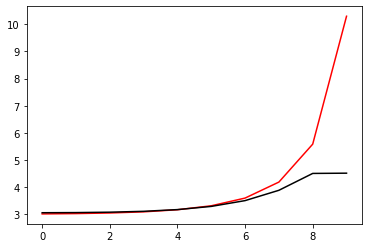

306900 0.04105362091438754
[3.06448236 3.07281268 3.09379333 3.13533501 3.21074149 3.34348601
 3.57681247 3.98947224 4.66905222 4.67959855]


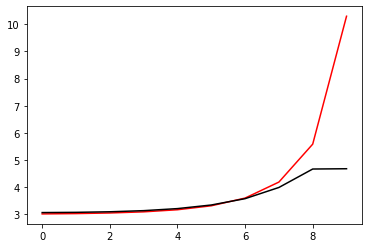

308000 0.023616556758142067
[2.97620147 2.97770496 2.99627745 3.04019575 3.12403362 3.27509226
 3.54480075 4.02087826 4.79412496 4.72662598]


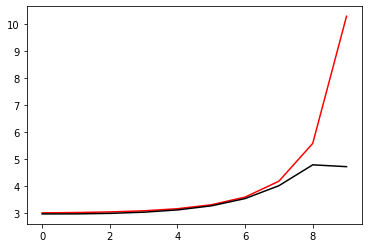

309100 0.034923485679678304
[2.89306752 2.88860715 2.89765369 2.93275433 3.00960545 3.15337973
 3.40524419 3.83506574 4.53330886 4.54779591]


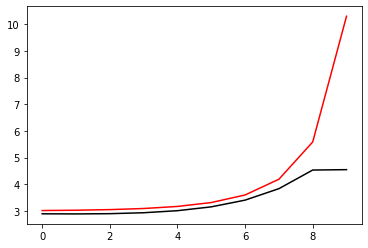

310200 0.021379685980187732
[3.01949343 3.01831272 3.02287776 3.04641145 3.10822687 3.2364044
 3.47585155 3.90157894 4.59913726 4.61004964]


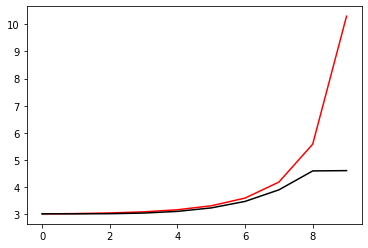

311300 0.021606245539906938
[2.97965156 2.98393984 2.99675316 3.02717902 3.09132369 3.21718854
 3.45416619 3.88719503 4.60783813 4.62125627]


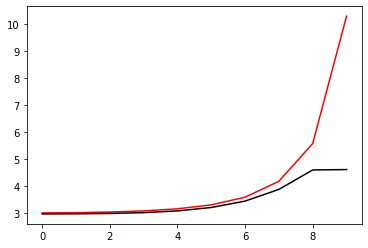

312400 0.03793516492931856
[2.96933064 2.98470652 3.01623713 3.06654327 3.14515243 3.27175939
 3.48227509 3.83921547 4.41861006 4.37176195]


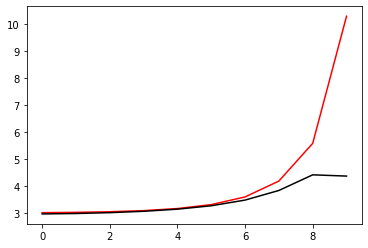

313500 0.044534926565504694
[2.96944257 2.9784401  3.00213016 3.04925351 3.13365586 3.27923198
 3.52979493 3.95897107 4.62327057 4.5965926 ]


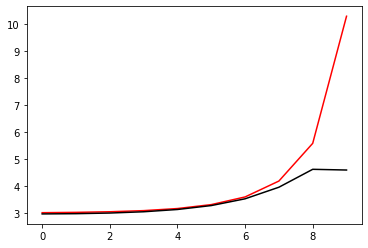

314600 0.011812671715423793
[3.02885238 3.04056557 3.06740649 3.1163521  3.20127653 3.34590774
 3.59146284 4.00801786 4.66668457 4.67566427]


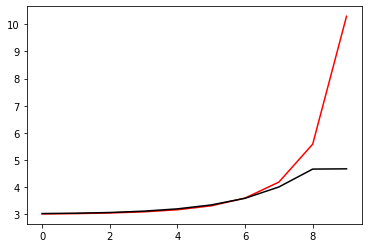

315700 0.021901171849067827
[3.01752757 3.02908927 3.05695066 3.10872375 3.19685085 3.34511567
 3.59707836 4.03054481 4.72684482 4.76386252]


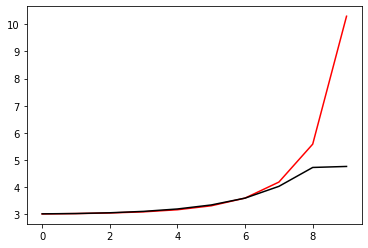

316800 0.01126489052343325
[3.065139   3.07195315 3.08892595 3.12253201 3.18487527 3.29726339
 3.49819243 3.8627353  4.50417891 4.57043094]


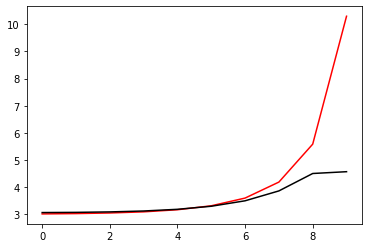

317900 0.15452964835425417
[3.20560195 3.21367598 3.23598759 3.27950427 3.35715429 3.49058402
 3.71944086 4.11946098 4.7867222  4.73779069]


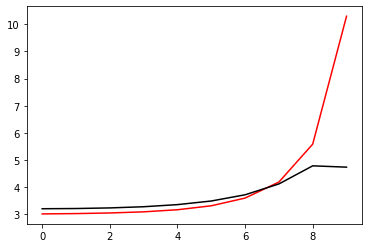

319000 0.031191152290418002
[2.94646192 2.94466257 2.9492388  2.97219015 3.02661712 3.1323524
 3.32573598 3.67645142 4.27518151 4.2721139 ]


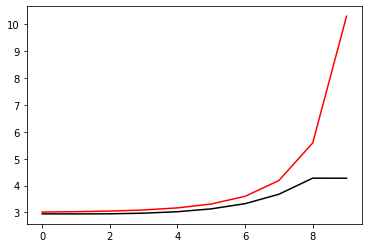

320100 0.03096551940504389
[2.93840072 2.94751131 2.96622766 3.00090124 3.06517648 3.18154985
 3.38902853 3.75841639 4.37785597 4.38798271]


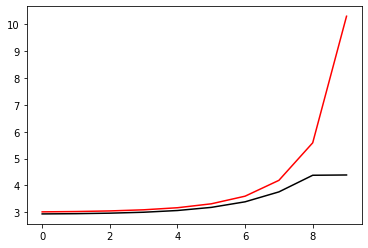

321200 0.02086867810827189
[2.97405313 2.98119438 3.00007394 3.03868986 3.10986437 3.23591682
 3.45779141 3.84936431 4.49731278 4.49483287]


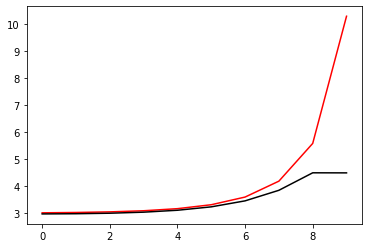

322300 0.021407636041197713
[3.04319936 3.058904   3.09154266 3.14371388 3.22380517 3.34983776
 3.55673126 3.91177652 4.50476181 4.51622317]


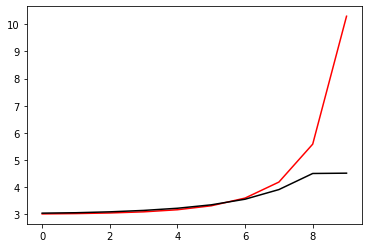

323400 0.03699443044303752
[2.95696151 2.96778461 2.99457604 3.04544056 3.13295223 3.27820091
 3.51942131 3.9244547  4.56796384 4.46228253]


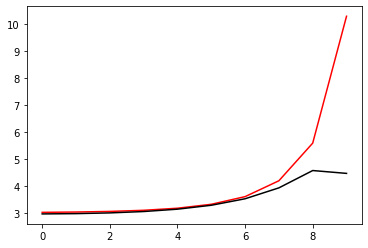

324500 0.045342973435308326
[2.94241314 2.96509991 3.0109028  3.08023121 3.18035268 3.3272341
 3.54791721 3.88009562 4.32913984 4.26821621]


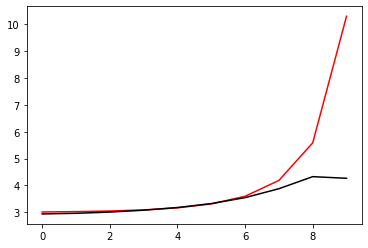

325600 0.011830886230141988
[3.01539063 3.02684146 3.0572541  3.11486837 3.21167353 3.36838623
 3.62269356 4.02489292 4.55256194 4.51594068]


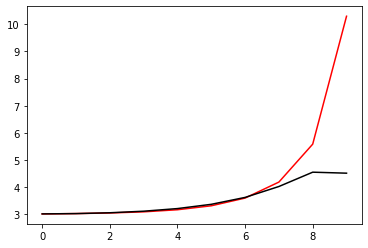

326700 0.021907025744275572
[3.04813113 3.05864923 3.08529673 3.13697194 3.22846791 3.38486914
 3.64650009 4.074972   4.70409034 4.73772533]


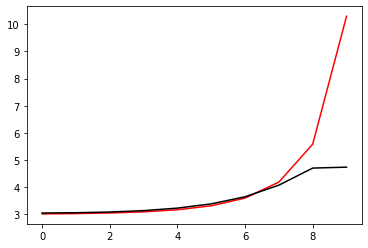

327800 0.05244092833243113
[2.82756337 2.8282129  2.84463834 2.88816564 2.97401236 3.12915992
 3.39786028 3.84337329 4.52073219 4.6778696 ]


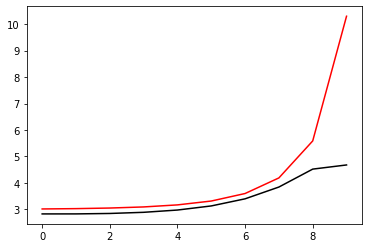

328900 0.04014096314432601
[3.08547405 3.08947206 3.10195022 3.13207129 3.1944004  3.31128036
 3.51945894 3.88061625 4.45824572 4.46869815]


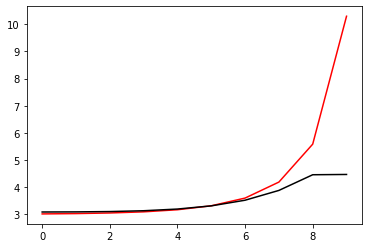

330000 0.02457996884468656
[3.02306139 3.02408783 3.03484043 3.06429887 3.1279086  3.25186152
 3.4823945  3.89910693 4.5803067  4.5308727 ]


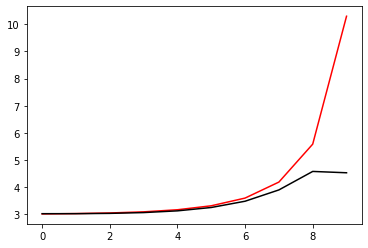

331100 0.03741022834677511
[2.84676201 2.84052041 2.84575254 2.87205492 2.9323764  3.04990315
 3.26712732 3.66150267 4.33011615 4.44310867]


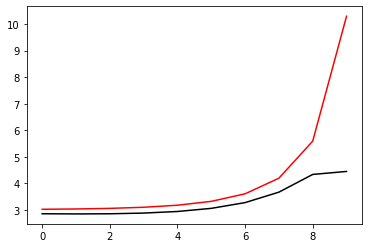

332200 0.020609111902595102
[2.99121299 2.99088772 2.99442795 3.01139658 3.05787121 3.15912987
 3.35833791 3.7323774  4.37356584 4.38415221]


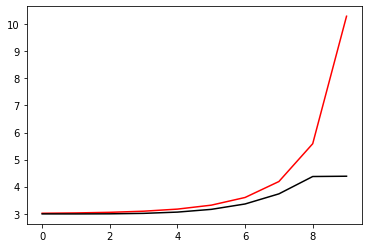

333300 0.02171279886160304
[2.96749289 2.98124036 3.01183826 3.06348495 3.14618827 3.28204511
 3.51387667 3.91965977 4.58867022 4.60791941]


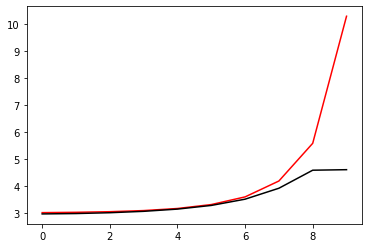

334400 0.03583120988261596
[2.93908062 2.95114434 2.97780369 3.02922477 3.12247372 3.28518761
 3.56477154 4.04236962 4.80287655 4.63945674]


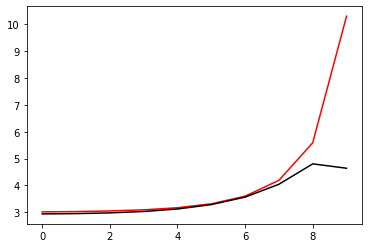

335500 0.0457325175458043
[2.97251973 2.9866695  3.0197777  3.07911503 3.18096855 3.35327677
 3.64311792 4.12977507 4.89829317 4.88819203]


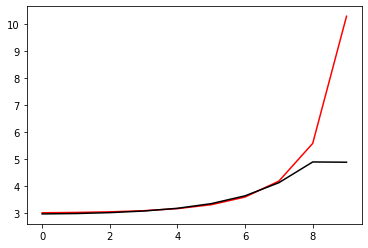

336600 0.01240740334498058
[3.01298259 3.01832132 3.03938971 3.08303192 3.17396528 3.34094476
 3.63421229 4.13964125 4.9424708  4.94647086]


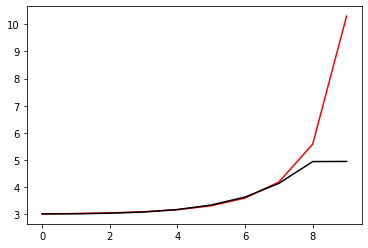

337700 0.07261710471670557
[2.81975897 2.79875563 2.79906881 2.81896775 2.89239666 3.04094248
 3.31141985 3.67920517 4.38376892 4.85588591]


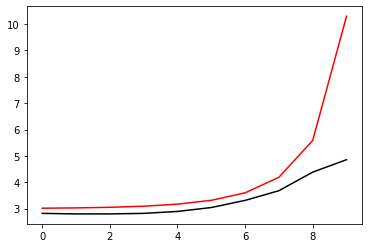

338800 0.011987496561618372
[3.00210682 2.98916071 2.97521354 2.98016156 3.02647064 3.14202691
 3.36296651 3.70922969 4.34135507 4.31575712]


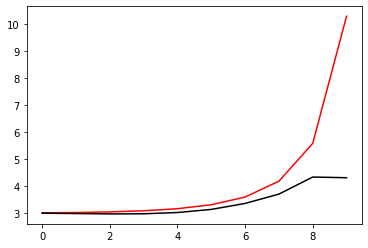

339900 0.04132114804084093
[3.07844264 3.07498832 3.07387321 3.08718902 3.1336019  3.24172504
 3.45283826 3.82320535 4.4597171  4.46270732]


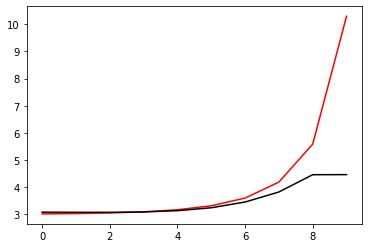

341000 0.025807162859992315
[3.0428104  3.0438227  3.05166805 3.07564301 3.13208578 3.24818491
 3.4714694  3.88201947 4.57274106 4.53663976]


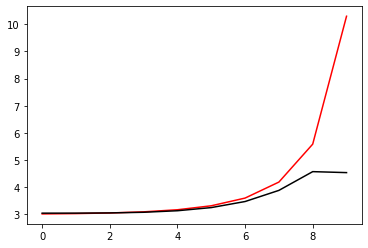

342100 0.031716451134223056
[2.96652877 2.97348803 2.99245788 3.03244726 3.10711032 3.24171271
 3.48390026 3.9207918  4.65268779 4.73053707]


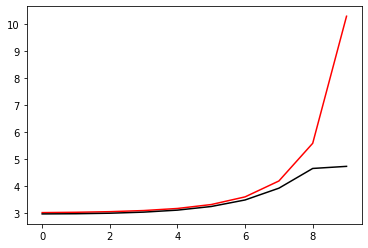

343200 0.037574440504603866
[2.84878564 2.86159448 2.8908962  2.94259508 3.03408549 3.19135888
 3.46311581 3.93514225 4.70186251 4.65824449]


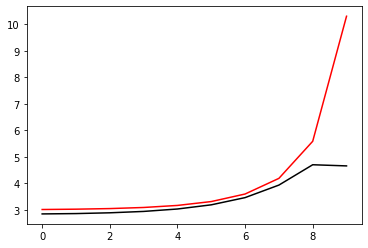

344300 0.020742303423986613
[3.0213898  3.01640918 3.01369312 3.02583376 3.06689992 3.15424948
 3.3132157  3.59198363 4.13292715 4.14329073]


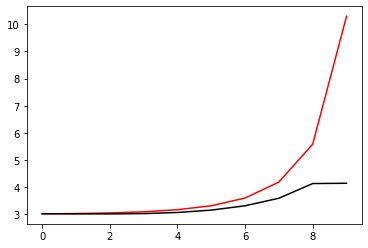

345400 0.039478578535920655
[3.03565639 3.03687649 3.04294972 3.0623345  3.10881945 3.20398805
 3.38300323 3.70808242 4.28479364 4.24855561]


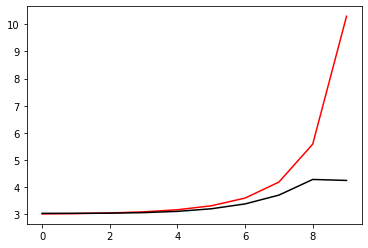

346500 0.04544965441500337
[2.99073179 2.99745151 3.01450006 3.04933739 3.11663533 3.24163952
 3.46852766 3.87321714 4.54319106 4.55312757]


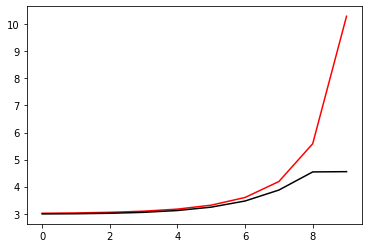

347600 0.014032628971186574
[3.09529309 3.10394517 3.12687004 3.17177978 3.2522242  3.39169579
 3.63290513 4.05178624 4.73290072 4.70044911]


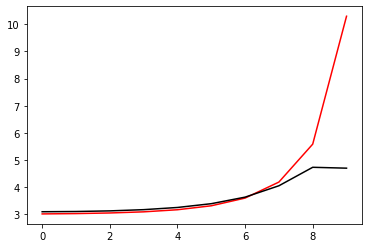

348700 0.021134325587608915
[3.07729815 3.08562908 3.10701069 3.14759574 3.21658707 3.33090601
 3.52210677 3.84549268 4.36158016 4.38721073]


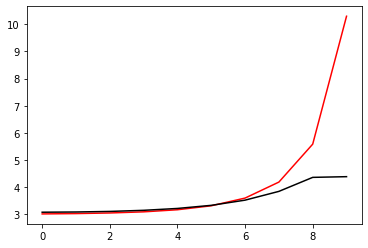

349800 0.011078793392786088
[3.07982534 3.08869716 3.10978798 3.14904615 3.21676967 3.33066075
 3.52130905 3.8377775  4.31565624 4.34355481]


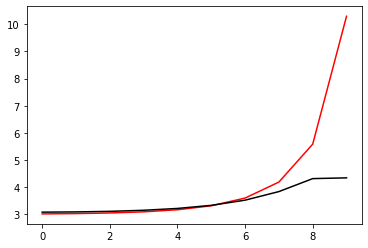

350900 0.042124092559544406
[3.0034848  3.01896362 3.04731517 3.09352541 3.16666938 3.28267159
 3.4692941  3.77143512 4.22402977 4.13496107]


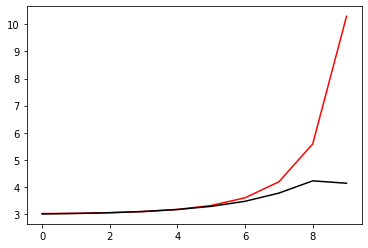

352000 0.12260374432240892
[2.76877009 2.77931759 2.80404282 2.84962006 2.92733547 3.05686433
 3.27361622 3.640437   4.22160189 4.51922256]


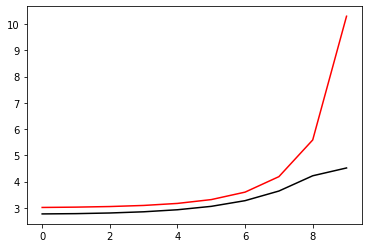

353100 0.03178753661925886
[2.97580125 2.98545233 3.01169671 3.06039818 3.14191119 3.27529742
 3.49498467 3.85896931 4.40884534 4.40193208]


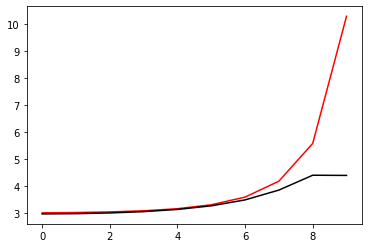

354200 0.020078527908647094
[2.95272515 2.95578082 2.97149064 3.01149111 3.09047556 3.23358113
 3.48690869 3.93252775 4.64234801 4.6731584 ]


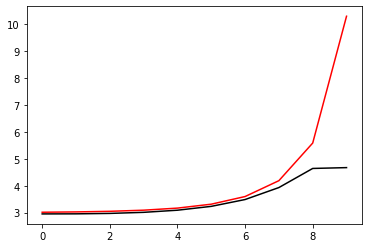

355300 0.021753912363073433
[2.93877859 2.94665897 2.96708125 3.00870042 3.08564893 3.22195918
 3.46181894 3.89109131 4.62213555 4.67044619]


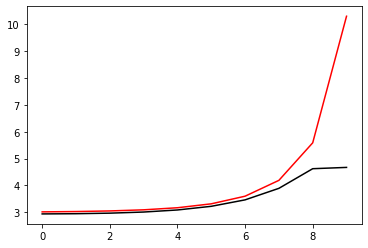

356400 0.033631377709821164
[3.08429288 3.10827246 3.14650731 3.20286039 3.28776274 3.41732176
 3.58930657 3.67195419 4.03264827 4.00247726]


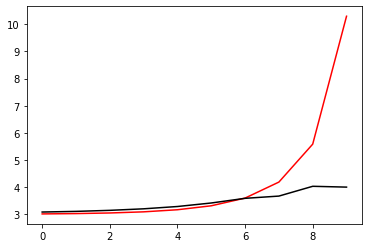

357500 0.05001401128848183
[3.00298378 3.01813312 3.05153523 3.10552967 3.1845098  3.29425999
 3.44463955 3.71476254 4.07735805 4.04372482]


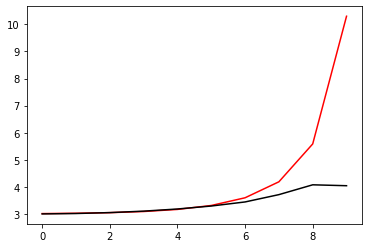

358600 0.011670520241087317
[3.03724118 3.0426475  3.0652156  3.11141191 3.19188715 3.32973271
 3.58911025 4.06715715 4.3886338  4.34891172]


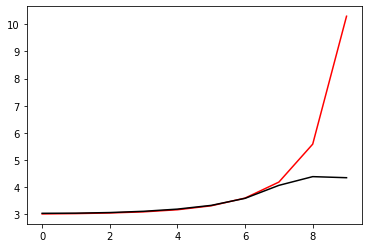

359700 0.025797841860877736
[3.08970766 3.09508386 3.11360326 3.15866991 3.24683286 3.40939843
 3.69555856 4.15274317 4.68354734 4.78204983]


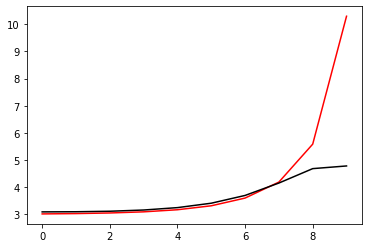

360800 0.011811497882879406
[3.01860789 3.02913859 3.05515641 3.10485406 3.19154467 3.33714995
 3.58079555 3.99950469 4.68090179 4.70899504]


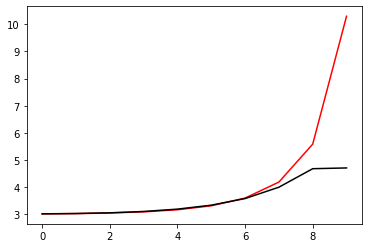

361900 0.03823591514835225
[3.0715007  3.09758829 3.13601151 3.19028241 3.27282882 3.39988748
 3.5697191  3.66033935 3.97185991 4.01626835]


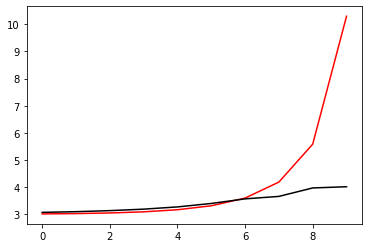

363000 0.028972043324241883
[3.03531936 3.05087742 3.08535458 3.14117802 3.22411023 3.34399751
 3.51335259 3.76897372 4.09387719 4.0586789 ]


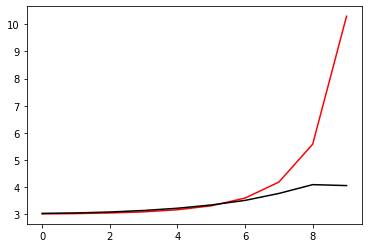

364100 0.037425871863237876
[2.82437315 2.84065194 2.87050406 2.9187784  2.99325991 3.10632357
 3.28358182 3.58100642 4.04485744 4.05921695]


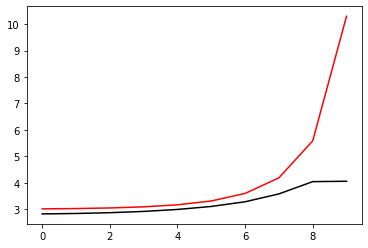

365200 0.020866179847299795
[3.00761027 3.01174493 3.02744559 3.06251487 3.12714534 3.23861564
 3.42826989 3.75007333 4.22302843 4.24589346]


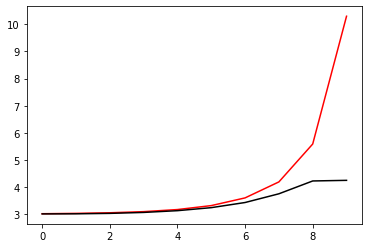

366300 0.021321277116426812
[2.95500518 2.95877145 2.97131805 3.00231062 3.06561698 3.1838636
 3.39815828 3.78365485 4.416264   4.44197612]


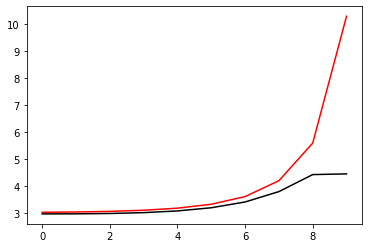

367400 0.03602900489054768
[2.94047194 2.95210643 2.98127731 3.03678338 3.1332509  3.29574151
 3.56883763 4.02639185 4.72767143 4.64297044]


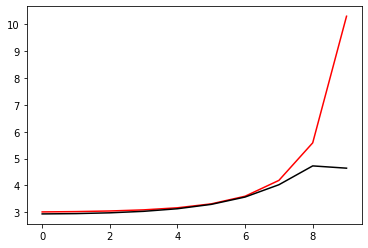

368500 0.04413502064987257
[2.93473464 2.9464287  2.97977775 3.0409154  3.1461506  3.3234082
 3.61949491 4.10885052 4.86146612 4.85201534]


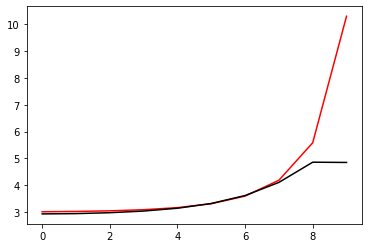

369600 0.011413838943431863
[2.99963667 3.02160949 3.06506712 3.13094227 3.22707247 3.36198577
 3.52639142 3.70696343 4.13568458 4.11181639]


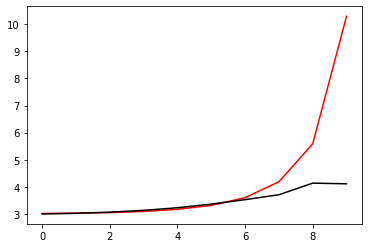

370700 0.021325035035614857
[3.01384835 3.02497112 3.05562118 3.11203168 3.20128876 3.3362359
 3.54817924 3.89064567 4.28988325 4.30286578]


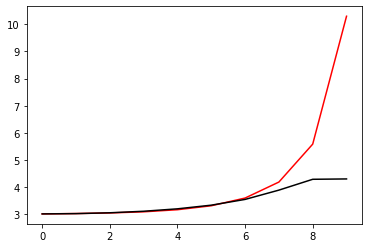

371800 0.01159025919986326
[3.06867563 3.07598087 3.09755    3.14412926 3.22980009 3.37870346
 3.62934932 4.02230453 4.51096021 4.51798808]


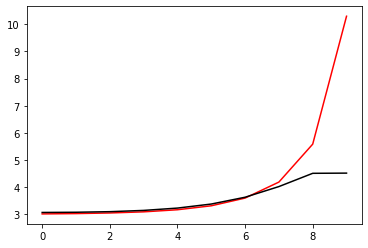

372900 0.0781650422630843
[3.15737225 3.16601154 3.18858049 3.23270259 3.3106101  3.44191615
 3.65704234 3.99893347 4.4868129  4.42683497]


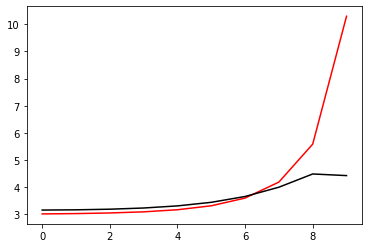

374000 0.024169650921864932
[3.00605075 3.00976358 3.02723719 3.06658916 3.14152725 3.2756192
 3.51073294 3.91587627 4.53904324 4.50031416]


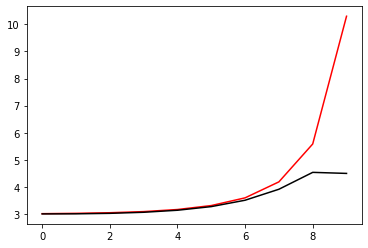

375100 0.03175020191192979
[2.96669655 2.97148141 2.98851183 3.02923109 3.10751759 3.24860656
 3.49946983 3.94331842 4.65593047 4.70921485]


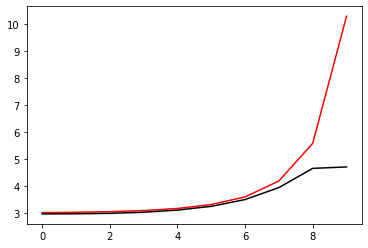

376200 0.019696113753199608
[2.96802747 2.95520858 2.95460773 2.97936631 3.04307414 3.16820513
 3.3916824  3.77427009 4.38325519 4.39051468]


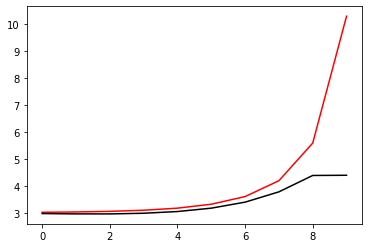

377300 0.021336981484982722
[3.00530835 3.00559941 3.01268724 3.03924989 3.10248285 3.22663495
 3.45064265 3.83866877 4.45753758 4.46514819]


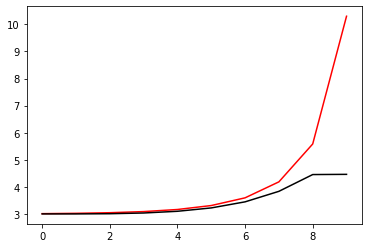

378400 0.0377517433365721
[2.9910915  2.99527984 3.00816292 3.03954489 3.10587716 3.23383566
 3.46761188 3.87947205 4.54076647 4.50290168]


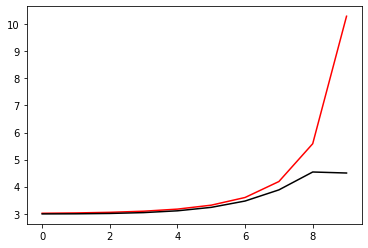

379500 0.04637508341289771
[2.99654476 3.00478876 3.02491465 3.06547118 3.14222607 3.28264373
 3.534824   3.98014399 4.69892888 4.72478329]


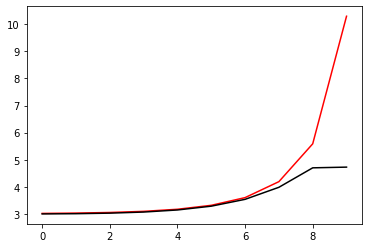

380600 0.012124787553653534
[3.01754245 3.02895593 3.05717956 3.10920839 3.19884617 3.35223954
 3.61688657 4.07686148 4.82254461 4.87168531]


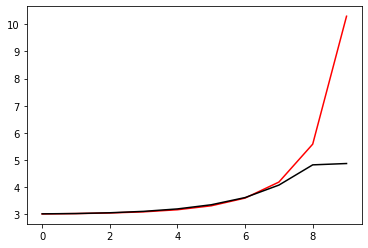

381700 0.020943884220818016
[3.08141422 3.0876555  3.10275675 3.13418103 3.19238374 3.2942915
 3.47073578 3.77952304 4.29816677 4.30737965]


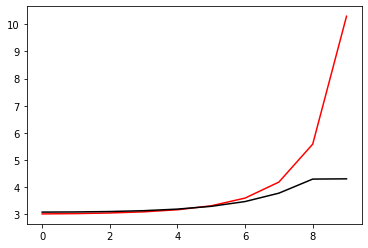

382800 0.011239385889545747
[3.05648586 3.06026412 3.07245912 3.10164858 3.16107135 3.27311964
 3.47880207 3.85177377 4.47501383 4.50656016]


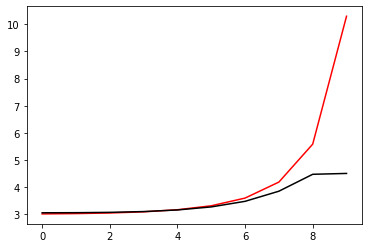

383900 0.041850706924297466
[3.01805633 3.02606574 3.04544887 3.0844953  3.15744287 3.28933854
 3.52593003 3.94873809 4.64434051 4.6526563 ]


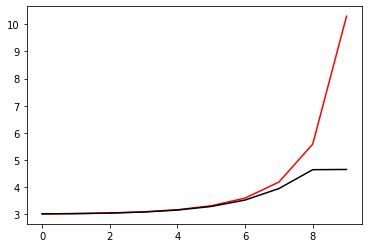

385000 0.024248915513132775
[2.97011695 2.97311059 2.99189076 3.03440161 3.1148116  3.25901391
 3.51558085 3.97019536 4.71573512 4.63950948]


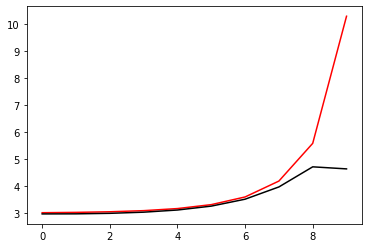

386100 0.03220869965757958
[2.94829057 2.97132908 3.018257   3.0890005  3.19364426 3.3510222
 3.59031118 3.96079439 4.52193047 4.49470426]


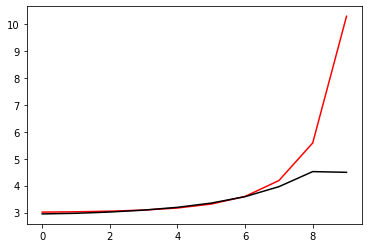

387200 0.020066733129045892
[2.94001924 2.94929512 2.97498169 3.02694607 3.11796503 3.26941276
 3.52255785 3.96062765 4.65012642 4.66806206]


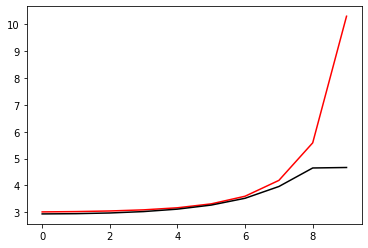

388300 0.021825264044622997
[2.92191417 2.93130207 2.9548255  3.00044537 3.08120713 3.22002948
 3.45900007 3.88641797 4.62992368 4.67984038]


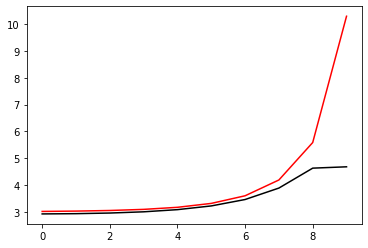

389400 0.032169502573126015
[3.05505525 3.07901928 3.12265575 3.18999783 3.29251737 3.4450599
 3.64781589 3.87277434 4.19125016 4.14795097]


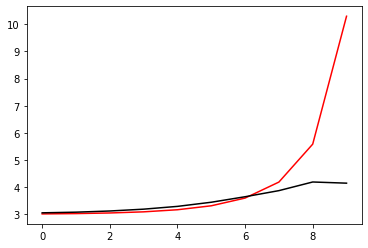

390500 0.059802310746533846
[3.04874983 3.06730428 3.10664975 3.17200176 3.27147758 3.41805072
 3.63693286 3.97185433 4.29632067 4.28821975]


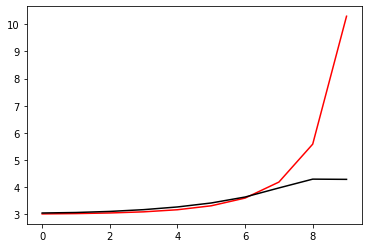

391600 0.01163722782240731
[3.02834012 3.03463257 3.05980292 3.11106679 3.19855475 3.34118443
 3.58624644 4.00525876 4.45900459 4.41654375]


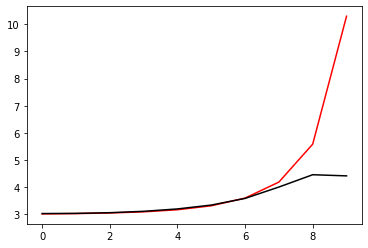

392700 0.02192935063313299
[3.03288579 3.04380577 3.06743316 3.11648304 3.20670879 3.36743614
 3.64294463 4.08973771 4.66591702 4.78802183]


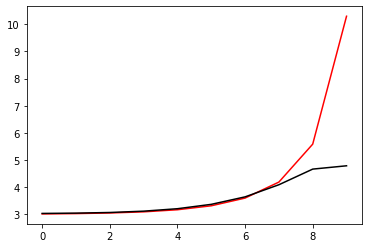

393800 0.011826760256449161
[3.01810055 3.02880953 3.05522802 3.10552276 3.19288017 3.33873471
 3.58209896 4.00227853 4.6882809  4.71774555]


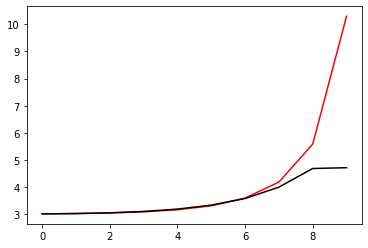

394900 0.039635073416392094
[3.17122887 3.15523218 3.13551054 3.1284624  3.14939269 3.21564869
 3.35030508 3.58639949 4.0982781  4.07701266]


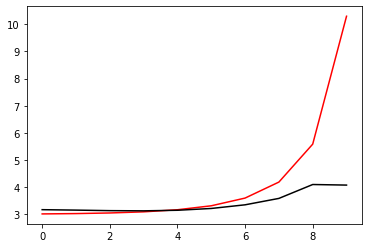

396000 0.031181076373087188
[2.96026125 2.9617981  2.96667966 2.98173793 3.01913147 3.0988258
 3.25474053 3.54863564 4.08282354 4.07815749]


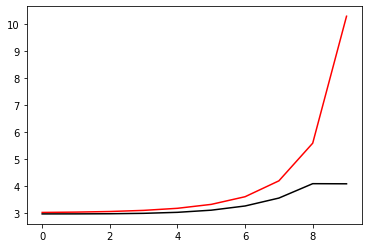

397100 0.03299753967892094
[3.01873612 3.02526271 3.04110119 3.06958415 3.1197116  3.20781378
 3.36437943 3.65021256 4.15809179 4.20864822]


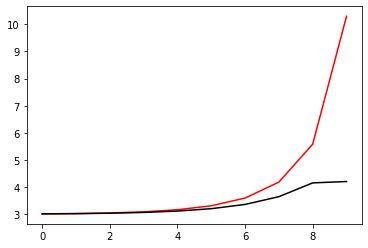

398200 0.018883678107224012
[2.94557417 2.94562921 2.95401526 2.98219619 3.04418638 3.16411219
 3.38745389 3.7962156  4.46331932 4.48028244]


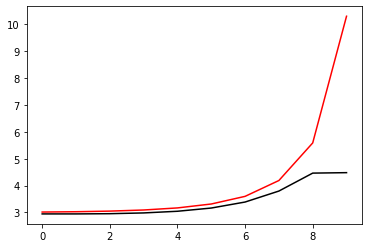

399300 0.021662203124938297
[2.94705194 2.95427009 2.97335689 3.01301293 3.08755423 3.22120749
 3.45835074 3.88075074 4.57872995 4.61802003]


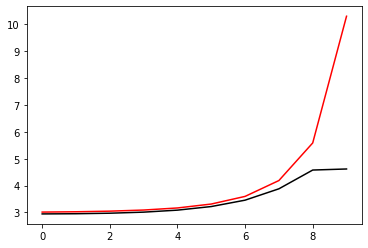

400400 0.08495315487981202
[2.84960228 2.83938988 2.84286229 2.86608172 2.92409402 3.03574134
 3.22013196 3.49105592 4.04573884 4.48283704]


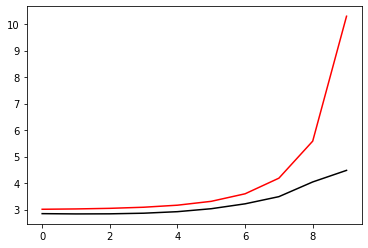

401500 0.051159769891262544
[2.94610504 2.94191205 2.94099012 2.95607879 3.002356   3.09862611
 3.26815926 3.54195959 4.0659651  4.06331134]


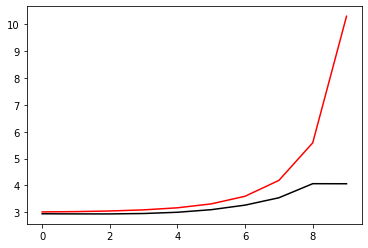

402600 0.030710388287780194
[2.95098387 2.95373714 2.96279691 2.98538892 3.03445446 3.13024412
 3.3033536  3.60306775 4.13212128 4.13194169]


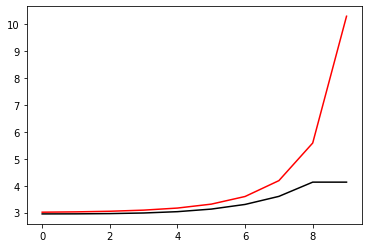

403700 0.020962414082124386
[3.03834452 3.04139034 3.05365597 3.08269871 3.13891462 3.24146167
 3.42496169 3.75090166 4.29991099 4.34791886]


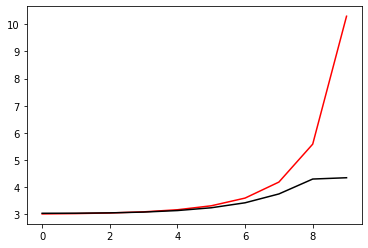

404800 0.011444636156911697
[2.9783122  2.98611898 3.00510126 3.04405428 3.11594215 3.24149688
 3.45919114 3.83755727 4.45313455 4.45395555]


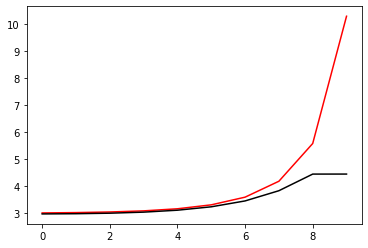

405900 0.04169725651870336
[3.03812983 3.04903161 3.07541054 3.12434838 3.20778516 3.34666175
 3.58079293 3.98312375 4.6343742  4.65601104]


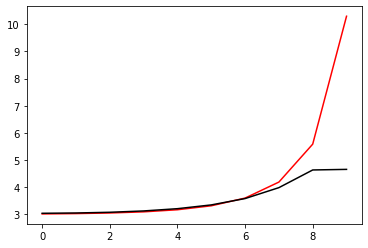

407000 0.32723811580730666
[3.18642658 3.21945099 3.27096316 3.34465569 3.4499579  3.59994902
 3.80755253 4.10611504 4.66265066 4.82275583]


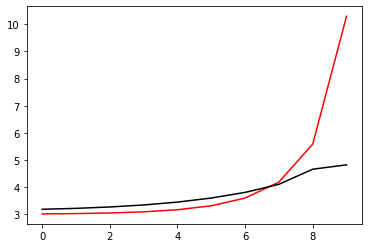

408100 0.03083210733914723
[2.9282437  2.93651518 2.96247907 3.01229985 3.09343383 3.21736864
 3.39889439 3.67265086 4.18745637 4.18713921]


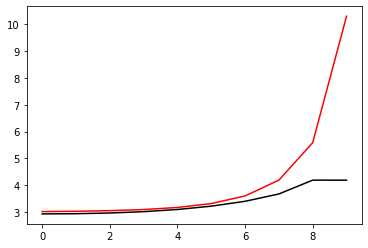

409200 0.02027136002928459
[2.94228191 2.95634247 2.98700336 3.04048753 3.12607432 3.25689926
 3.45282628 3.75382995 4.28190239 4.28323268]


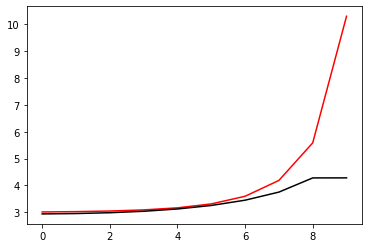

410300 0.021332148345309512
[2.98047847 2.99045155 3.01594603 3.06469462 3.14726326 3.27955539
 3.48748907 3.8182239  4.36448687 4.36802287]


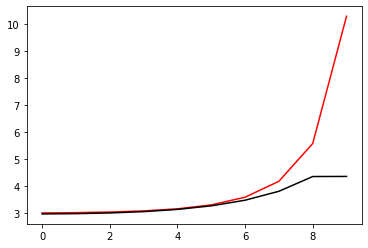

411400 0.037481467072550484
[2.96489498 2.97449912 2.998299   3.04489011 3.12776139 3.26806119
 3.50044313 3.88296014 4.48727501 4.40928844]


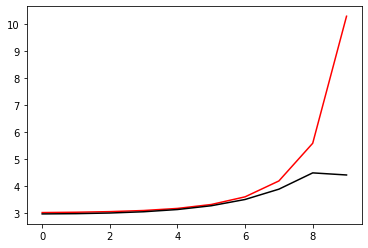

412500 0.04488195997518938
[2.97085507 2.97854974 3.00035176 3.04489826 3.12581241 3.26584778
 3.50423489 3.90541046 4.52939927 4.48695245]


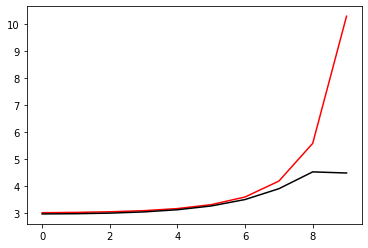

413600 0.012004224522119827
[3.01321126 3.0247757  3.05120773 3.10029418 3.18786752 3.34030037
 3.60236845 4.04830004 4.7444018  4.78437795]


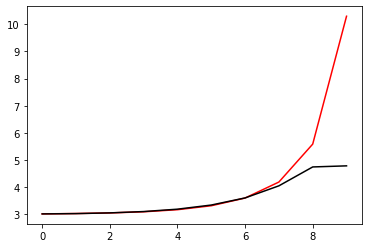

414700 0.021967111356810273
[3.01740083 3.02936624 3.05797091 3.11109358 3.20091494 3.3510253
 3.60561861 4.04538851 4.75783589 4.79409507]


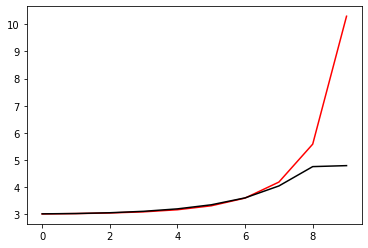

415800 0.02021533306074049
[2.95497962 2.94123404 2.93295763 2.94421458 2.98880387 3.0847369
 3.25041238 3.50069544 4.03699455 4.03340721]


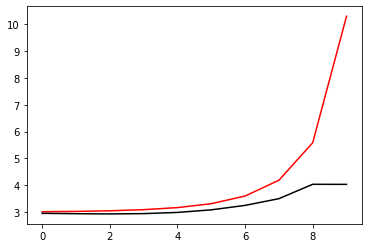

416900 0.05370859529285096
[2.96018252 2.9591976  2.96264896 2.98002578 3.02561148 3.11933539
 3.28840657 3.57517329 4.1096606  4.0892015 ]


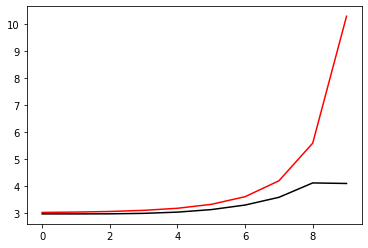

418000 0.025376445177831254
[3.01857511 3.02612876 3.04383786 3.07689058 3.13688662 3.24380742
 3.43224583 3.76231493 4.32198184 4.32692034]


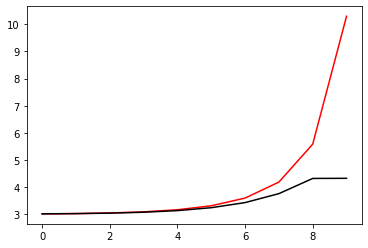

419100 0.03176711640444848
[2.96801707 2.97864371 3.00673484 3.05678622 3.13978176 3.27645374
 3.50437952 3.89035278 4.50968306 4.51717837]


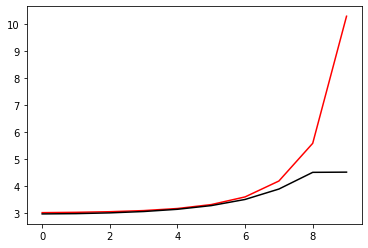

420200 0.01915162232091564
[2.91979371 2.93634398 2.96980185 3.02219854 3.1012047  3.22158683
 3.41037825 3.7188267  4.21899941 4.2134328 ]


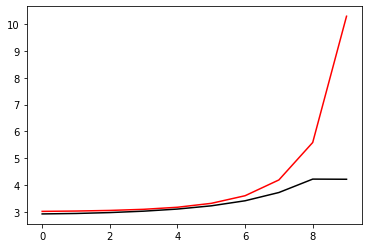

421300 0.021490176863922003
[2.97038769 2.97949431 3.00431111 3.05313702 3.1366336  3.27328628
 3.4973061  3.8689858  4.44332148 4.46497002]


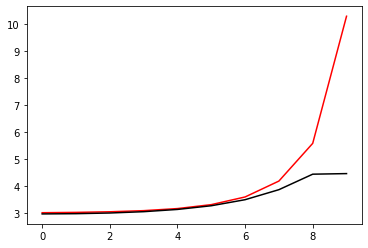

422400 0.03853111664570235
[2.96321205 2.97372481 2.99787594 3.0424427  3.11819325 3.24347655
 3.45049214 3.79447378 4.33224773 4.22125404]


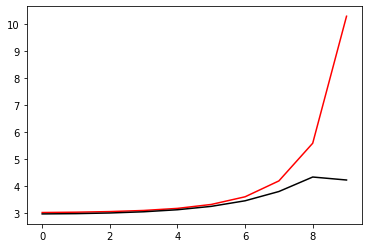

423500 0.04531663480606062
[2.97935279 2.98987411 3.01468618 3.06354972 3.15173103 3.30439327
 3.56543823 4.00636296 4.68072858 4.60955878]


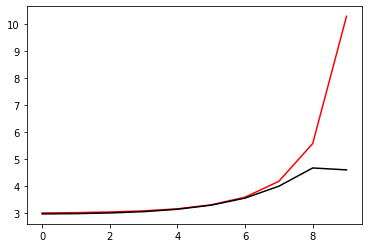

424600 0.012132036506289235
[3.0138734  3.02615833 3.05476308 3.10725125 3.19902201 3.35636768
 3.62491945 4.0821318  4.80217984 4.85203572]


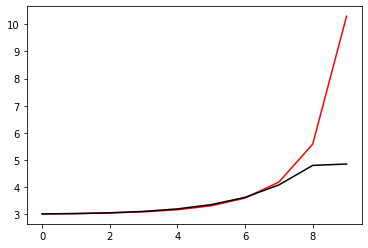

425700 0.22929237671300726
[2.67189045 2.68691181 2.71819668 2.77809265 2.88045447 3.05198954
 3.33925155 3.82340522 4.58995235 4.94768572]


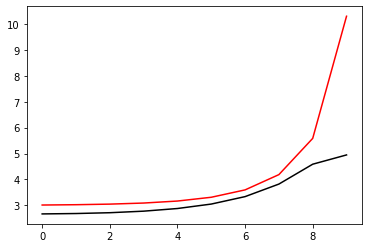

426800 0.011206538905384575
[3.01930786 3.03891797 3.0791022  3.14267031 3.23772488 3.37267416
 3.54091361 3.75231689 4.16490543 4.17274389]


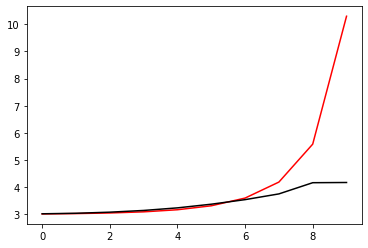

427900 0.04135297666298853
[3.03675427 3.04730215 3.0753137  3.1280467  3.21324683 3.34409862
 3.54731596 3.86027998 4.26893908 4.27348546]


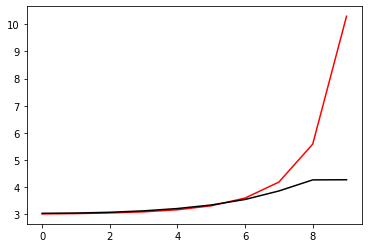

429000 0.024429950585617168
[3.00410493 3.01110936 3.03199441 3.07557507 3.15557355 3.29381947
 3.52571661 3.9277661  4.46903156 4.42272674]


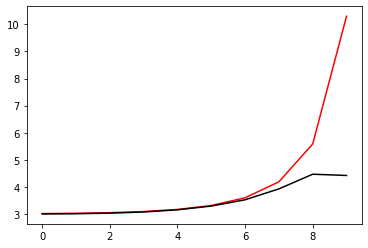

430100 0.03177164177171731
[2.96444738 2.97270663 2.99549045 3.04144378 3.12377674 3.26648454
 3.51263699 3.94329819 4.6025155  4.6445931 ]


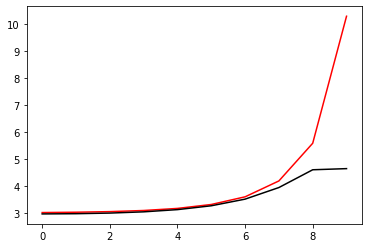

431200 0.016242273787404532
[2.90282092 2.91167274 2.93437228 2.97799067 3.05778476 3.19796603
 3.44784488 3.90539168 4.65683227 4.62900125]


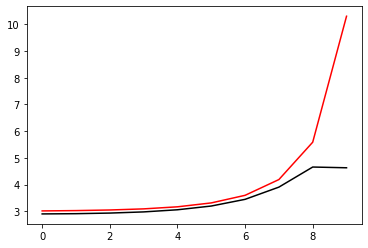

432300 0.1575627213703132
[3.23489212 3.23452383 3.24863967 3.28176632 3.35168404 3.47955473
 3.6877555  3.96221511 4.55117048 4.75393535]


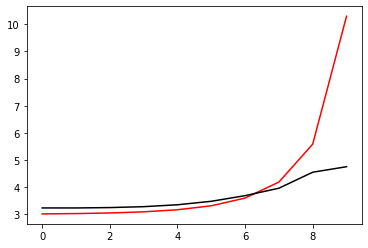

433400 0.04597869721786463
[2.94577376 2.94141065 2.94058428 2.95678293 3.00594122 3.10825814
 3.28741307 3.56190414 4.11543836 4.08967727]


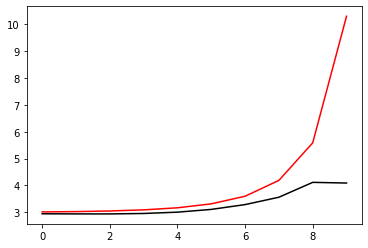

434500 0.05121591275192514
[2.94451338 2.94802345 2.95815733 2.98265622 3.03525912 3.13713804
 3.31922534 3.62869249 4.18473029 4.19952371]


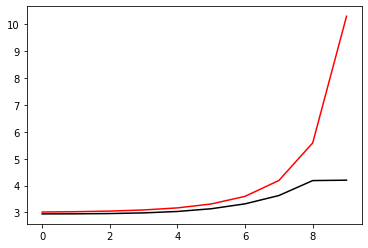

435600 0.011298961907528016
[3.06523518 3.06726687 3.08224388 3.11573369 3.17865753 3.29103296
 3.48859807 3.83443442 4.41483841 4.34460603]


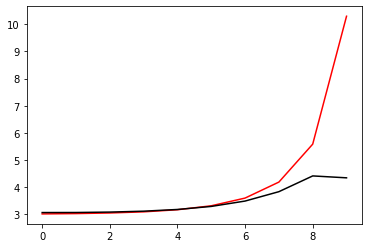

436700 0.02161789413329132
[3.03142006 3.04075916 3.06431522 3.11028896 3.19053641 3.32734072
 3.56136626 3.96385506 4.6125517  4.627987  ]


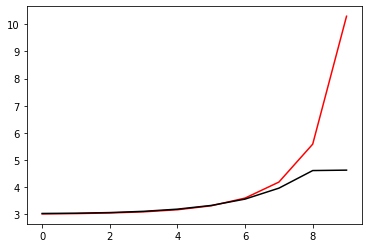

437800 0.011240288149431364
[3.03335674 3.05971759 3.0974506  3.15787283 3.25067728 3.39139385
 3.58736504 3.72067428 4.12879301 4.52706112]


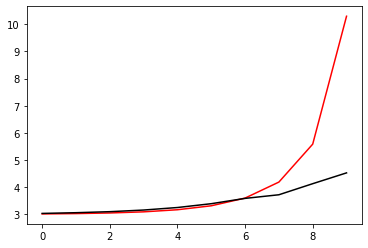

438900 0.039781034767913996
[3.06391743 3.0800653  3.11619928 3.17576629 3.26609988 3.39772479
 3.58056733 3.83072862 4.17390259 4.17174525]


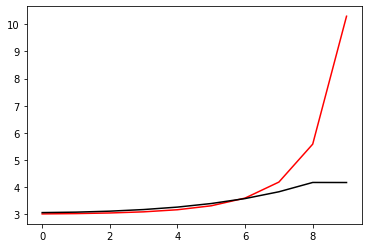

440000 0.02486650384949602
[2.99861907 3.00929472 3.03652686 3.08659471 3.16822484 3.29560597
 3.49700443 3.83994011 4.31434652 4.26845419]


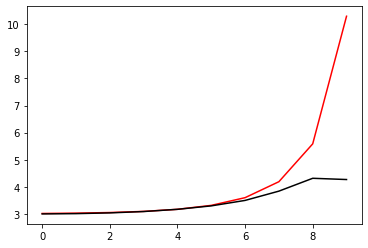

441100 0.030942325459823068
[2.9357483  2.94859798 2.97592684 3.02206618 3.09648644 3.21743184
 3.41732309 3.73757028 4.12977652 4.15013319]


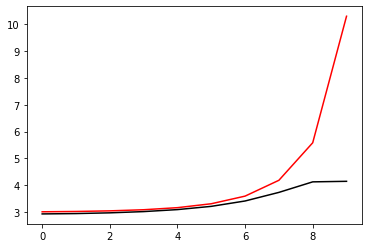

442200 0.02032973299514709
[2.95566722 2.96651433 2.99262578 3.0384881  3.11195221 3.22724608
 3.40883012 3.69477545 4.09656023 4.17093099]


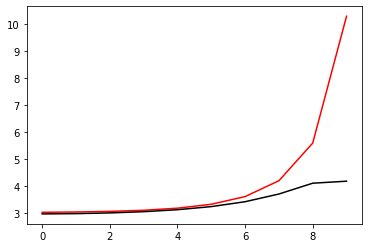

443300 0.021211029099822934
[3.00773109 3.01474458 3.03490631 3.07649682 3.15060347 3.27554488
 3.48321386 3.82526612 4.32973684 4.34813487]


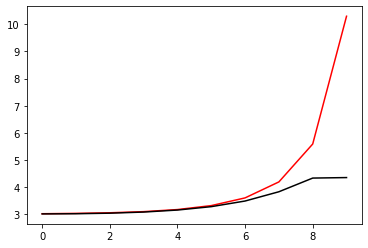

444400 0.03698477514603947
[2.96586633 2.97403916 2.99421482 3.03622896 3.11606613 3.25985217
 3.51216589 3.94257043 4.601903   4.44560485]


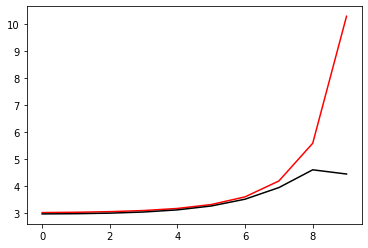

445500 0.04841151757046771
[2.98042458 3.00138819 3.04108076 3.10003059 3.18705383 3.31590083
 3.4955575  3.73753472 4.10271043 4.07407164]


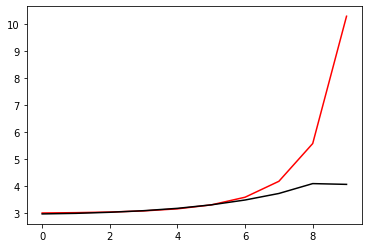

446600 0.011437180268325135
[3.01853199 3.02709494 3.0537835  3.10487507 3.18943588 3.324249
 3.54718734 3.91663722 4.29571751 4.2509971 ]


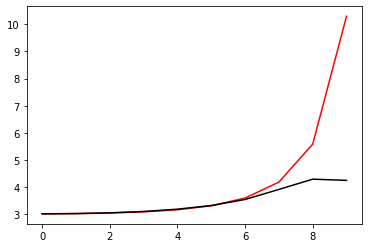

447700 0.021733243170977704
[3.0725538  3.07782058 3.09752888 3.1422256  3.2266352  3.37788734
 3.64411418 4.0679118  4.5364562  4.57829683]


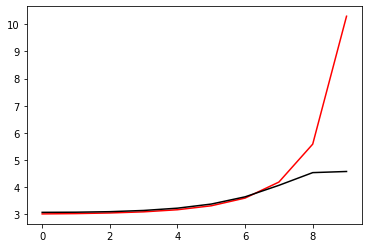

448800 0.011198385918683863
[3.09021029 3.09396727 3.10704415 3.13930043 3.20436482 3.32306636
 3.52985363 3.88046474 4.41840339 4.4472255 ]


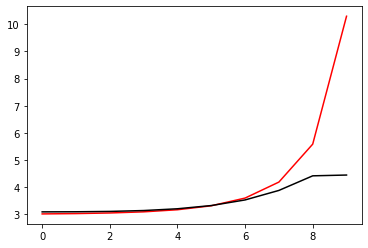

449900 0.1007149990186039
[2.7886249  2.80809346 2.84131673 2.89253257 2.97276384 3.10167956
 3.31349744 3.6652567  4.2124495  4.23855338]


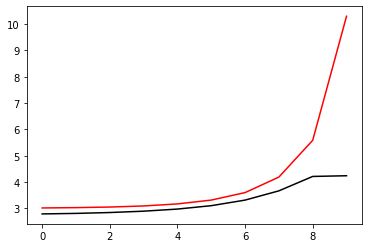

451000 0.024068495694138423
[2.97458988 2.99215511 3.02820179 3.0869622  3.17872511 3.32208194
 3.54945953 3.91078906 4.43649259 4.39411043]


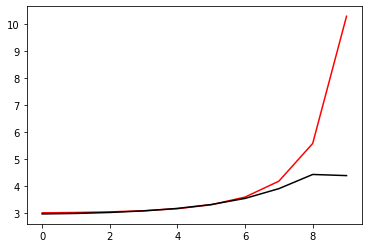

452100 0.03127502354220848
[2.94476767 2.95415712 2.97898657 3.02624511 3.10669865 3.23926617
 3.45842427 3.82577827 4.40282229 4.41553739]


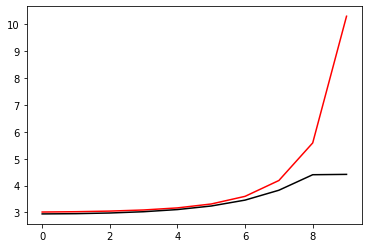

453200 0.020072717856677375
[2.94402674 2.95216156 2.97497613 3.02228369 3.10794824 3.2544164
 3.50205052 3.92034264 4.57324334 4.58823924]


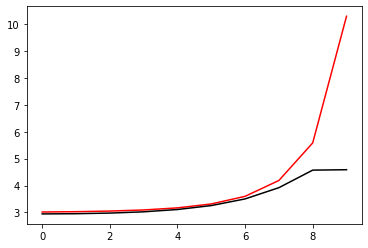

454300 0.06444875692811286
[3.18961266 3.18995627 3.20253916 3.23431966 3.2993318  3.41604187
 3.60985094 3.93723335 4.53253644 4.66099673]


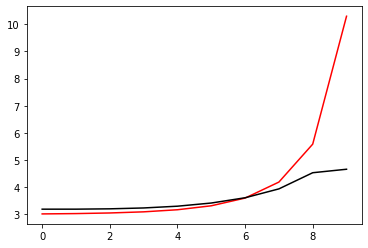

455400 0.03770766384909128
[2.980411   2.98937668 3.00734862 3.04358566 3.11339256 3.241476
 3.47084749 3.87194925 4.52005087 4.32911702]


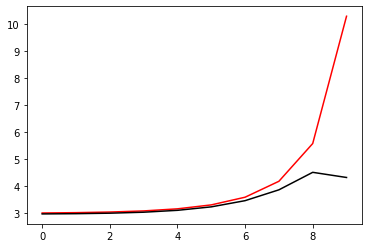

456500 0.04491882235789881
[2.98247786 2.98938365 3.00799638 3.04752805 3.1234086  3.26178973
 3.50865195 3.93678216 4.60294191 4.49953053]


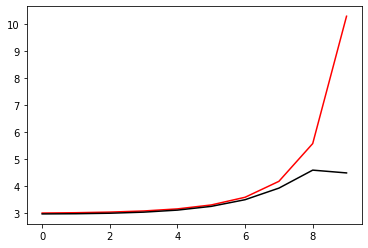

457600 0.011304803936041342
[3.05087421 3.05501753 3.06932661 3.10209547 3.16587494 3.28265498
 3.49192946 3.85884148 4.439443   4.36625955]


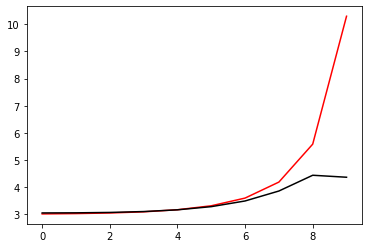

458700 0.02151179864477795
[2.99108438 3.00039869 3.02141518 3.06260855 3.13932733 3.27797873
 3.52386772 3.95090788 4.61646123 4.78044063]


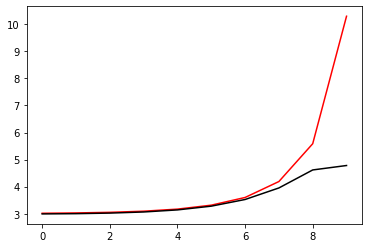

459800 0.011828160959715053
[3.04712826 3.05852842 3.0857278  3.13599671 3.22185622 3.36604904
 3.61052126 4.03240013 4.71899723 4.75136867]


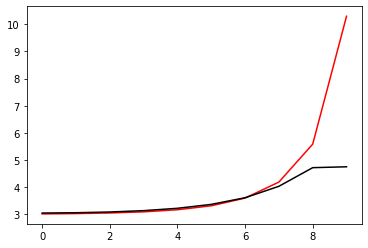

460900 0.045361645666248625
[2.97690567 2.97868672 2.99427367 3.03328072 3.10883051 3.24377705
 3.47930715 3.88872299 4.55866325 4.55968404]


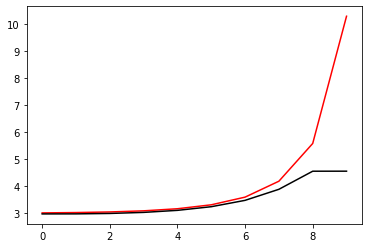

462000 0.024136037086594033
[3.00988126 3.01380994 3.03038238 3.06870584 3.1440999  3.28264196
 3.53049222 3.96835897 4.68433064 4.64171809]


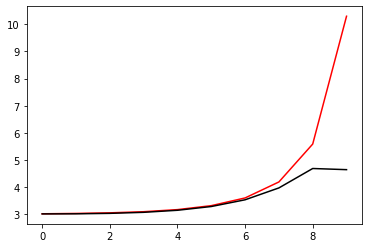

463100 0.031754477295114575
[2.95849067 2.96536183 2.98457729 3.0272762  3.10750814 3.25056551
 3.50352512 3.95242363 4.69510007 4.74534731]


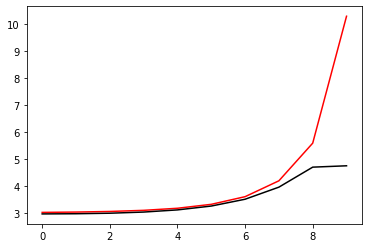

464200 0.02040257632046211
[2.9845245  2.97638335 2.97554575 2.99608038 3.05231938 3.16612116
 3.37725466 3.7593503  4.40338616 4.41722186]


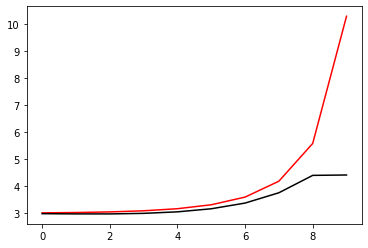

465300 0.021470576310205314
[2.97351341 2.97702871 2.98882445 3.01852369 3.08145644 3.20356242
 3.43048064 3.84188166 4.52729924 4.5526291 ]


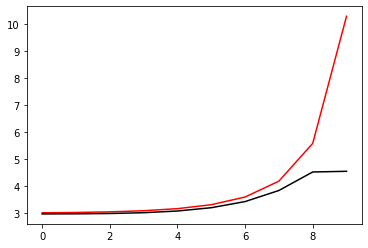

466400 0.03610725864268707
[2.94804619 2.96074823 2.98709122 3.03622929 3.1241694  3.27844345
 3.5474427  4.01492558 4.77049363 4.6039696 ]


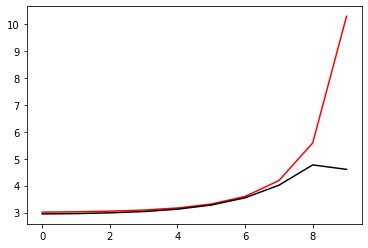

467500 0.05018848385798828
[2.96406976 2.96091023 2.96568471 2.98976276 3.04739702 3.16202224
 3.38007868 3.7937115  4.52904756 4.38915861]


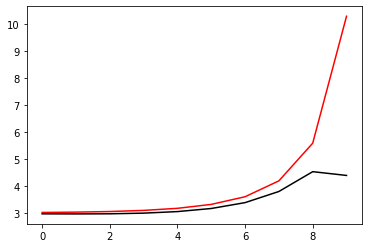

468600 0.012078782171772764
[3.03040911 3.03799356 3.05815727 3.10433354 3.19143899 3.3472232
 3.61863469 4.08099472 4.80988526 4.77695649]


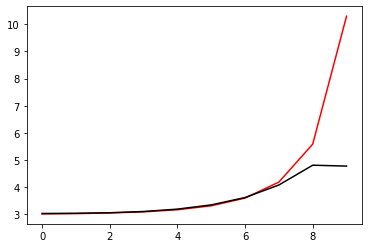

469700 0.021655362231419714
[2.97548914 2.98309117 3.00614048 3.05129126 3.13906077 3.29404334
 3.56499965 4.04184553 4.81278909 4.86520029]


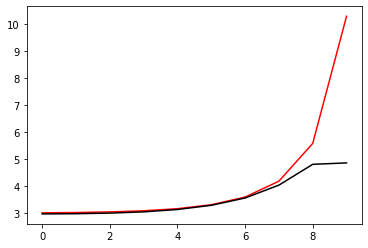

470800 0.047561035646051866
[2.84826962 2.85367936 2.87158853 2.91424547 2.99855217 3.15416657
 3.43154656 3.91291593 4.6874189  4.87991012]


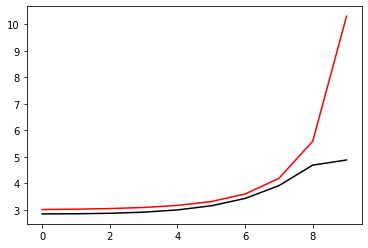

471900 0.10139070847213752
[2.80007702 2.815645   2.84361416 2.89094776 2.97172986 3.11046664
 3.35136571 3.77459757 4.47479903 4.54564358]


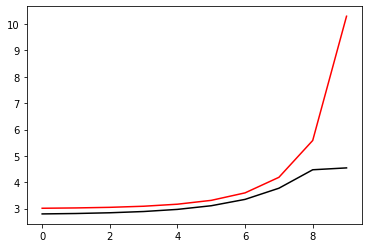

473000 0.026584386494694648
[3.02903111 3.03832011 3.0642029  3.1122825  3.19365078 3.32942821
 3.55879933 3.95130612 4.58306091 4.55008136]


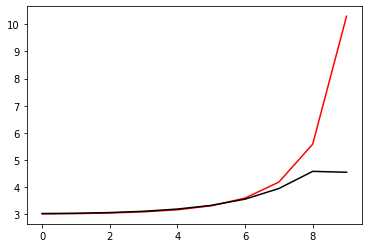

474100 0.031866134621158684
[2.97522047 2.97745886 2.99254914 3.03107971 3.1080237  3.2500001
 3.50553516 3.95982271 4.69637887 4.71617355]


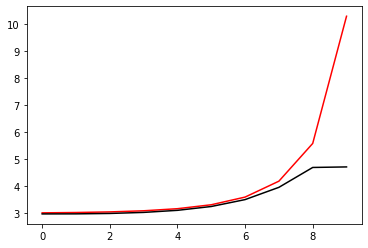

475200 0.01684033706838428
[2.91402441 2.91964446 2.93856694 2.97937153 3.05894234 3.20315463
 3.4612783  3.92396448 4.69051267 4.67888189]


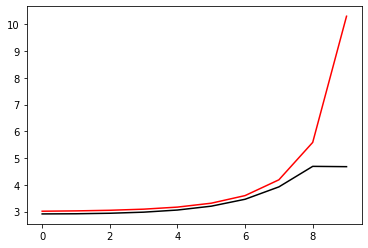

476300 0.022640021488026078
[2.90529746 2.92122618 2.95899911 3.02764605 3.1411837  3.32202612
 3.61264185 4.09324124 4.85278188 4.89773304]


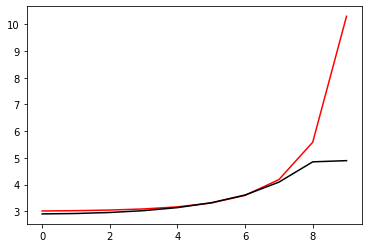

477400 0.03940816131596986
[2.97054992 2.98070257 3.00165815 3.04068579 3.10672137 3.21383047
 3.38975072 3.70645737 4.30411789 4.3867895 ]


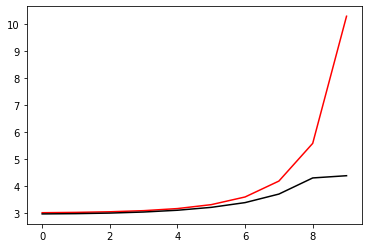

478500 0.04425016275389116
[2.95295796 2.96688361 3.00020626 3.06075198 3.16118314 3.32395389
 3.58911996 4.02180402 4.67677669 4.60372754]


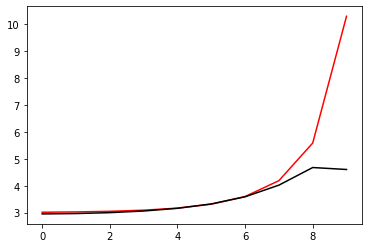

479600 0.012167476613223142
[3.05520873 3.07273342 3.10905055 3.17011013 3.26693377 3.41848933
 3.65709022 4.03385325 4.59308517 4.51417411]


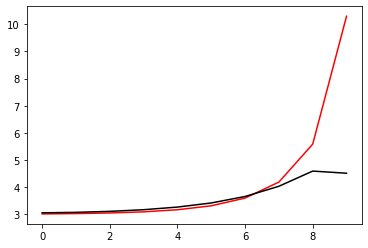

480700 0.02157412930722199
[3.04061138 3.05448583 3.08554848 3.13920663 3.22662475 3.36704463
 3.59373101 3.9639946  4.53437247 4.55774492]


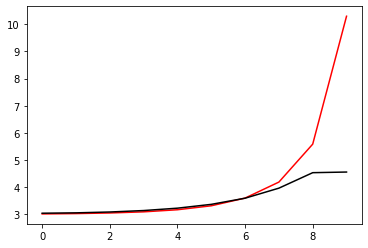

481800 0.011834766335075709
[3.01776047 3.03022868 3.05969243 3.11330881 3.20294128 3.35070656
 3.5971705  4.01257583 4.66388598 4.68725676]


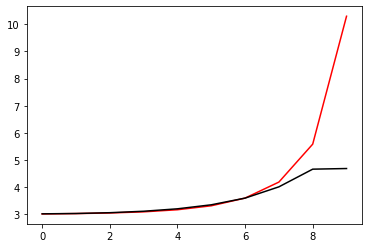

482900 0.28842918336107926
[3.22966755 3.23660597 3.25770102 3.30064904 3.37738309 3.50866017
 3.73280492 4.12590155 4.78259435 4.7227919 ]


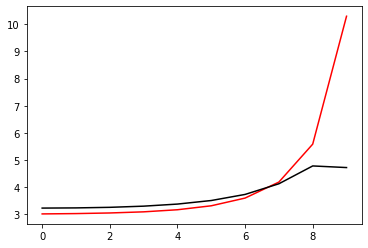

484000 0.031243602046353958
[2.94833266 2.94273565 2.94488208 2.96716155 3.02170743 3.12778638
 3.32149133 3.67414125 4.27714004 4.27558144]


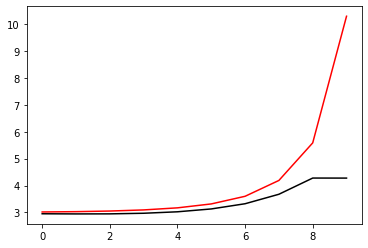

485100 0.03085378573965787
[2.94110351 2.9465838  2.95966963 2.98903291 3.04896183 3.16120304
 3.36360287 3.72709714 4.3418634  4.34739196]


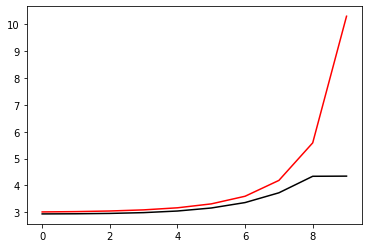

486200 0.020977022957725636
[2.98194615 2.99007977 3.00991877 3.04799635 3.11667364 3.23817378
 3.45260478 3.8322198  4.46488871 4.47802197]


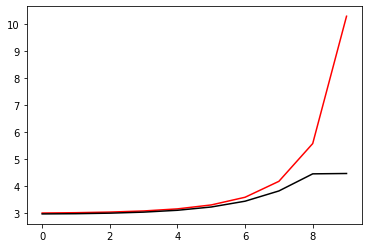

487300 0.02158838037296309
[2.95746137 2.96413259 2.98204637 3.0199767  3.09247064 3.22389051
 3.45747177 3.87044562 4.55189098 4.56863918]


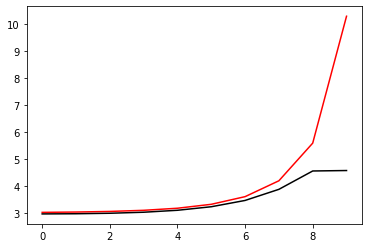

488400 0.0363596717881218
[2.94563871 2.95806728 2.98561343 3.03655753 3.12489154 3.275685
 3.53370314 3.97833065 4.69896595 4.52935263]


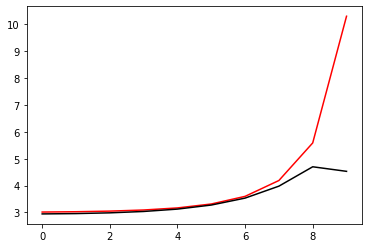

489500 0.05145816522982369
[2.93350626 2.93061479 2.93370473 2.95403798 3.00241058 3.0974083
 3.27623513 3.621746   4.27270131 4.25231514]


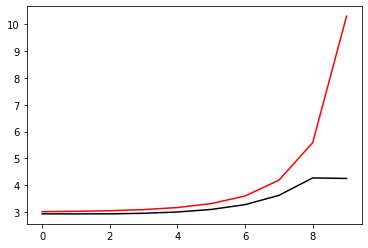

490600 0.012372785068100658
[3.08988547 3.09653587 3.11385193 3.14984669 3.2200806  3.35188344
 3.59012302 4.00336417 4.65205787 4.61937613]


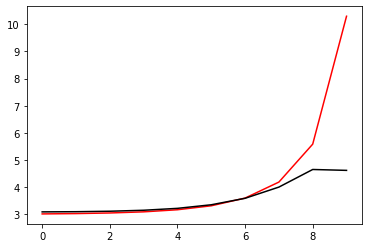

491700 0.07079365455773837
[2.78411577 2.80001552 2.83016208 2.88641025 2.98276914 3.14511907
 3.41890831 3.88097638 4.60562687 4.86227171]


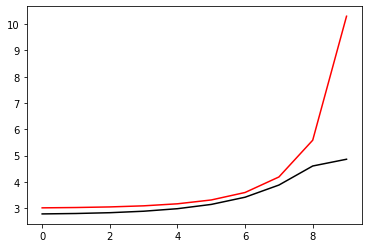

492800 0.01179963363225663
[3.01198029 3.02402733 3.05204633 3.1031294  3.18979956 3.33460513
 3.57819133 3.99338002 4.65742979 4.76004637]


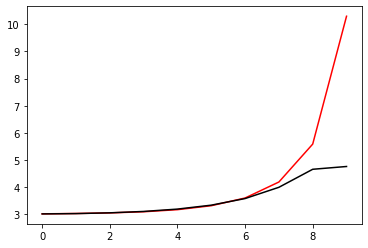

493900 0.04177662453639956
[3.02231778 3.03382517 3.06072413 3.10967841 3.19227372 3.32937751
 3.56147981 3.96681455 4.64116887 4.67285076]


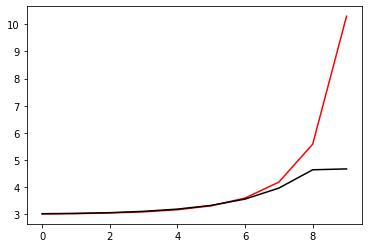

495000 0.02843205546716636
[3.01142731 3.03928511 3.08111967 3.14313417 3.23726149 3.37782434
 3.55682426 3.64650391 4.10156887 4.20730868]


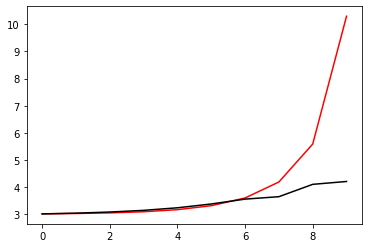

496100 0.03241166122738875
[2.98134259 2.9965095  3.03122663 3.08903321 3.1766565  3.30254892
 3.4757373  3.75649134 4.17202057 4.149712  ]


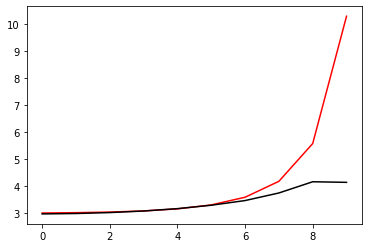

497200 0.020871878604512013
[2.97226612 2.98182085 3.00693609 3.05489452 3.13513553 3.2629596
 3.46769643 3.81950399 4.30350862 4.31642709]


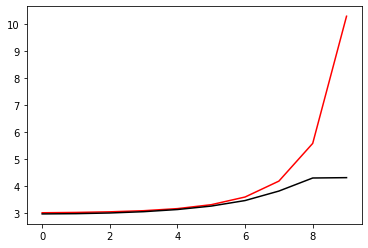

498300 0.02149182931387561
[2.95242404 2.95980242 2.97959609 3.02071084 3.09626631 3.22670175
 3.44890221 3.83976618 4.48178514 4.49420413]


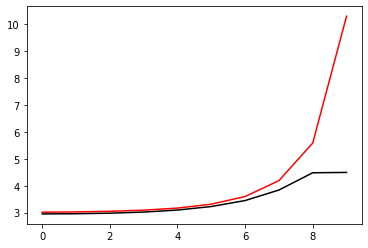

499400 0.03587408213545529
[2.9469937  2.96091659 2.99032394 3.0444882  3.13991563 3.30809447
 3.61235274 4.0870286  4.77846764 4.56317276]


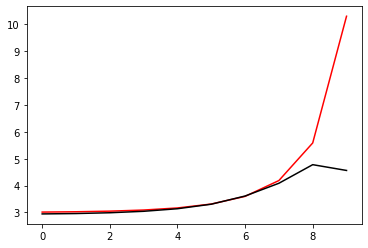

In [15]:
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h])
    for i in range (100):
        optimizer.apply_gradients(zip(gradients, [h]))
    if j%11==0: 
        print(j*100, Error_func(h, Positive[j%10], Negative[j%10]).numpy()), print(h.numpy())
        plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

0 0.03151547781436939
[2.97171207 2.96111866 2.96762751 3.00321803 3.08505398 3.24401151
 3.52386028 3.74026634 4.30018888 4.61321682]


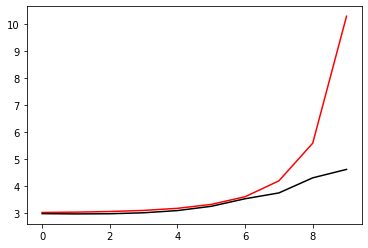

1100 0.033495246080884375
[2.94208316 2.94907461 2.96898718 3.01284822 3.09716717 3.24571199
 3.49295339 3.88316197 4.41544573 5.57356202]


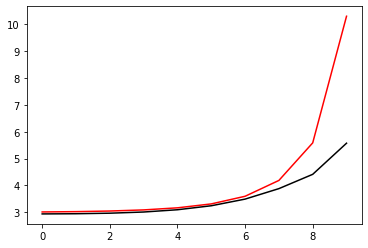

2200 0.02235369469562872
[2.95068154 2.95930229 2.98319526 3.03215946 3.12017078 3.27073818
 3.52645058 3.96290189 4.69703251 6.26353807]


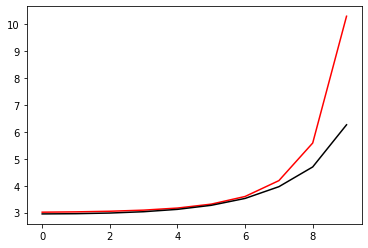

3300 0.023696990608709268
[2.94175665 2.94832926 2.96715479 3.00759968 3.0835047  3.22080756
 3.46735061 3.92672616 4.81694998 6.69981777]


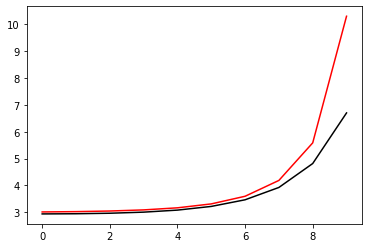

4400 0.0770956186822423
[2.87596747 2.86126459 2.8643028  2.88586785 2.94724782 3.07185604
 3.2823342  3.54183127 4.32384152 6.86524039]


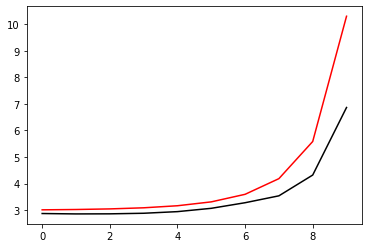

5500 0.04921610869107927
[3.02417312 3.01708599 3.01156613 3.02253831 3.0681316  3.17099991
 3.35601885 3.64352043 4.39641032 6.52120483]


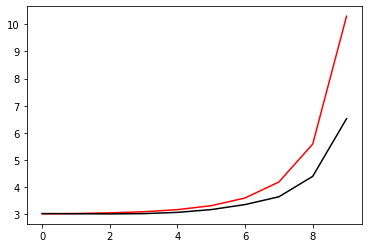

6600 0.013160145539235352
[3.07148961 3.06594105 3.06534123 3.07955716 3.1247465  3.22558419
 3.41908389 3.77311696 4.56965817 6.62111135]


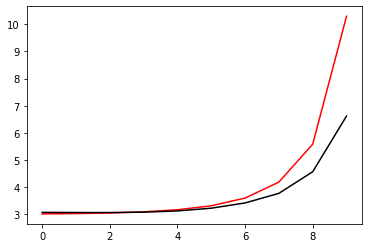

7700 0.0757750740557077
[2.79577271 2.80286133 2.81880023 2.85162848 2.91538236 3.03527106
 3.25836865 3.68183077 4.55853047 6.81163577]


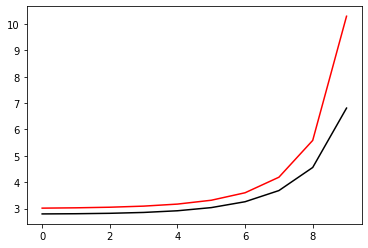

8800 0.013191292908938081
[3.07060655 3.08060266 3.10206323 3.13920442 3.20209875 3.31045215
 3.50377878 3.87069394 4.65351523 6.71278458]


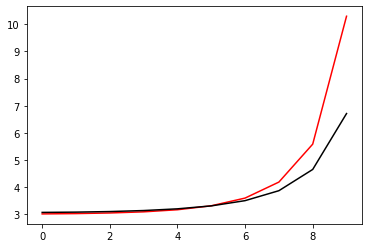

9900 0.04371515875507391
[3.01080071 3.02074918 3.04343939 3.08534339 3.15889895 3.28754934
 3.51746557 3.94928477 4.8287015  6.85410743]


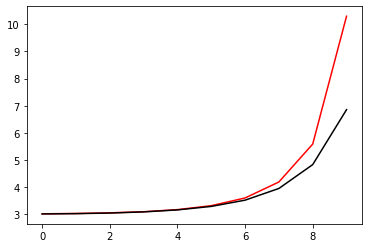

11000 0.0250160185106432
[2.98390605 2.98611936 3.00355651 3.04404485 3.12189381 3.26386737
 3.52307908 4.00938595 4.97035535 6.84197555]


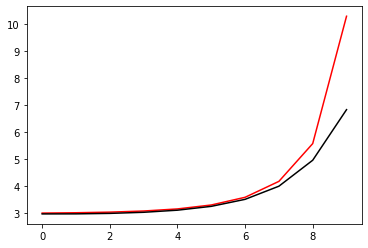

12100 0.03298328291177577
[2.92352216 2.93134703 2.94662723 2.9876559  3.06830689 3.21740706
 3.49024348 4.00512382 5.01252513 6.98650117]


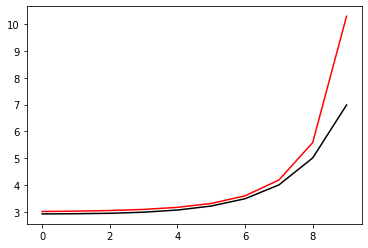

13200 0.02286534617477373
[2.96798979 2.97894308 3.0041101  3.04979293 3.13020649 3.2665472
 3.49712406 3.90016358 4.72274851 6.75658218]


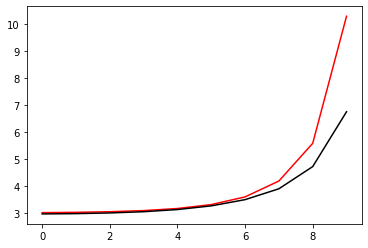

14300 0.023571884579877043
[2.98656434 2.99441481 3.0152758  3.05771983 3.13509058 3.27011778
 3.50589197 3.93550838 4.7928132  6.79933547]


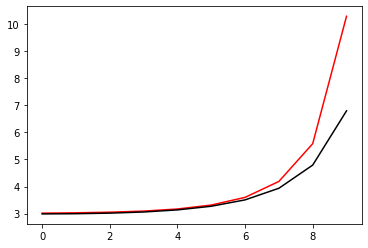

15400 0.03774369257633151
[2.96738535 2.97535968 2.995905   3.03766668 3.11573485 3.25697306
 3.51317501 3.99152448 4.92569962 6.78614039]


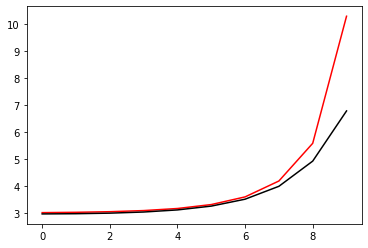

16500 0.04532663766316144
[2.94067874 2.95530474 2.99018549 3.05328352 3.15765714 3.32855811
 3.61775774 4.13402843 5.1135899  7.00666381]


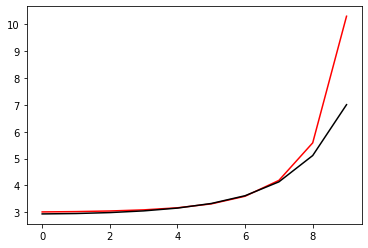

17600 0.01426371269330016
[3.00528398 3.02102647 3.05726011 3.11910527 3.22132854 3.38972306
 3.67389241 4.17912485 5.14890142 7.04157072]


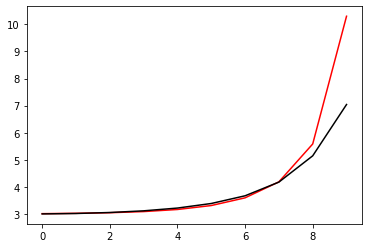

18700 0.0164645269200893
[2.96631334 2.94681677 2.93658152 2.94824679 2.99532884 3.09837517
 3.28936577 3.62707023 4.41396276 6.55915097]


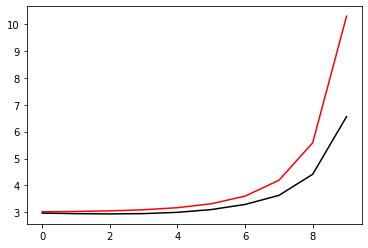

19800 0.013604319203488688
[2.9762013  2.97778731 2.98515415 3.00905248 3.06553752 3.17795207
 3.38420307 3.76164475 4.58449181 6.65015982]


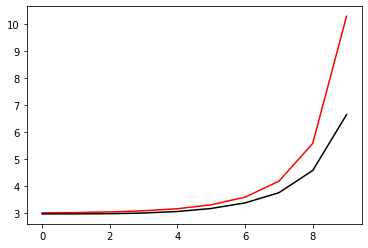

20900 0.043366649260879485
[3.05426935 3.05741032 3.06869038 3.09713502 3.15633225 3.26977245
 3.48133939 3.8837857  4.73283229 6.82317169]


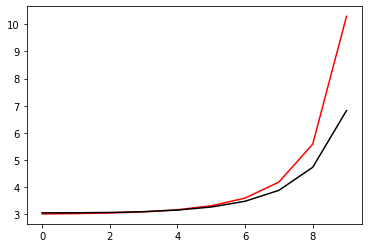

22000 0.0252159089662985
[2.97880125 2.99558814 3.0243706  3.07094452 3.14794069 3.27852764
 3.50817714 3.93561526 4.81028538 6.78763204]


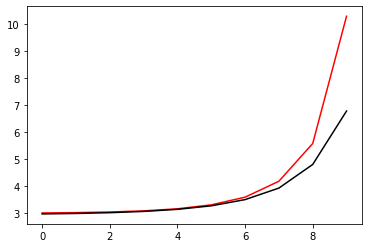

23100 0.033834684789664574
[2.98172647 2.98606223 3.00401339 3.04465527 3.12171988 3.26053849
 3.51109104 3.9801793  4.91810669 6.91472927]


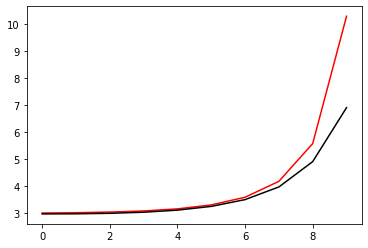

24200 0.023205828444792038
[2.98493601 3.00901578 3.04899817 3.10536194 3.18817321 3.31378388
 3.50003212 3.77368552 4.43365488 6.57794522]


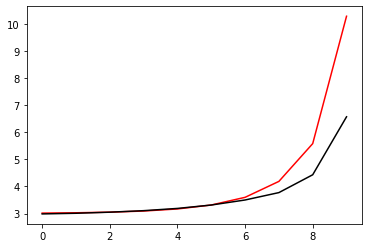

25300 0.02336952998471906
[2.98872635 2.99996997 3.02767128 3.0773065  3.15714882 3.2833696
 3.48983815 3.85987548 4.58382231 6.66702369]


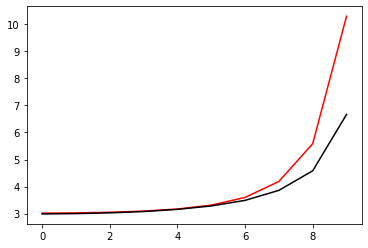

26400 0.03821507741225405
[2.97103927 2.97943083 3.00129015 3.04485234 3.12329292 3.26015818
 3.50504396 3.96411409 4.80101331 6.70519044]


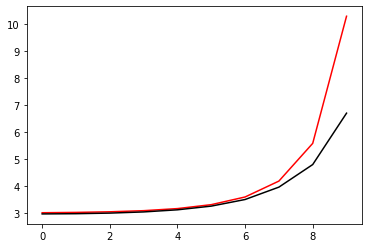

27500 0.0459582522276797
[2.96005602 2.97659019 3.00794591 3.06004188 3.14559787 3.28818841
 3.53265894 3.96846425 4.78465598 6.78997659]


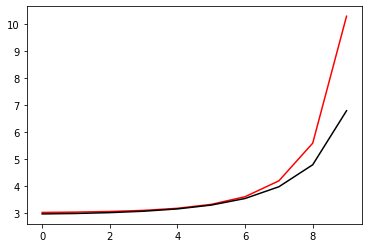

28600 0.013999392950889962
[3.02011499 3.03286439 3.06202068 3.11538979 3.20749808 3.36480339
 3.63854055 4.12954361 5.0400505  6.92543279]


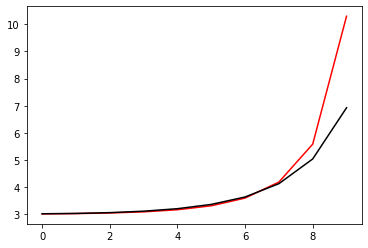

29700 0.024011481461434368
[3.05911345 3.06907174 3.0940354  3.14268731 3.23024568 3.38436908
 3.6564698  4.15255335 5.11733529 7.03405324]


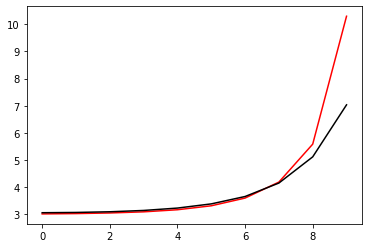

30800 0.014756174553733271
[2.96886864 2.95923665 2.95854723 2.98011063 3.03763137 3.15430662
 3.37447231 3.79009862 4.63637363 6.69108405]


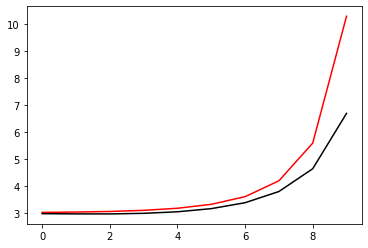

31900 0.04456148612655257
[3.00597692 3.00821537 3.01788315 3.04605335 3.10867249 3.23071052
 3.45788162 3.88554676 4.7515988  6.75616565]


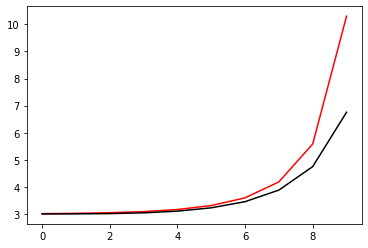

33000 0.02609101379641951
[3.02530442 3.02742626 3.03786417 3.06668016 3.12940247 3.25244848
 3.48488352 3.92813895 4.82610405 6.7204913 ]


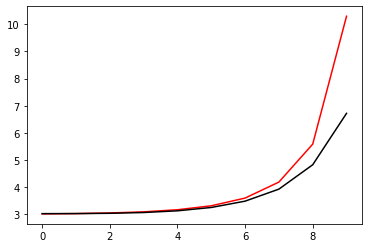

34100 0.03380130726292843
[2.98922397 2.99302322 3.00629158 3.03853284 3.10575263 3.23599059
 3.48250159 3.95594025 4.91000487 6.91858972]


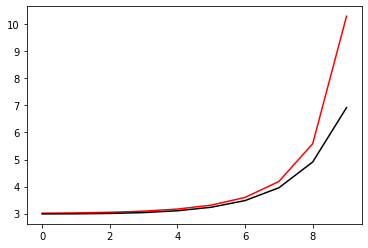

35200 0.02111222309190834
[2.94581151 2.95150572 2.9682361  3.00633202 3.08165038 3.22292208
 3.48670709 3.99162591 5.0018719  6.9190011 ]


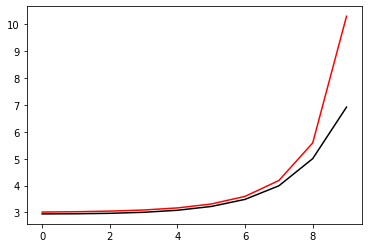

36300 0.04993677770939371
[2.86872901 2.86933524 2.88128447 2.91345756 2.97773567 3.09638684
 3.31532637 3.74541385 4.68494164 6.87305397]


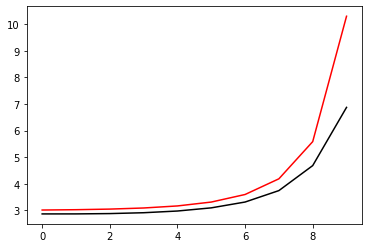

37400 0.039169525477269845
[2.99351275 2.99583459 3.00571699 3.03236925 3.08989657 3.20299024
 3.42054632 3.84989184 4.75675484 6.70918559]


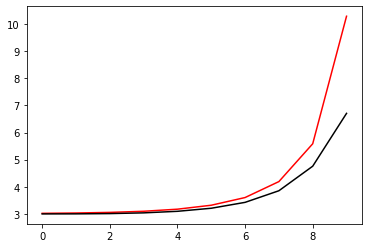

38500 0.04982082490440383
[3.00659988 3.01874853 3.04185245 3.08573661 3.167854   3.3188385
 3.59595096 4.1141709  5.12388096 7.01466862]


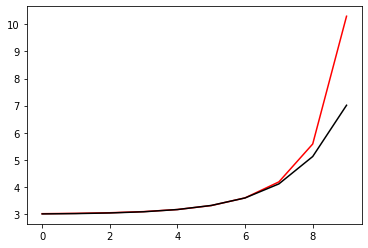

39600 0.014158201510800997
[3.02321124 3.03703947 3.07037583 3.12704283 3.22145361 3.38077679
 3.65753084 4.16311134 5.15375406 7.06128395]


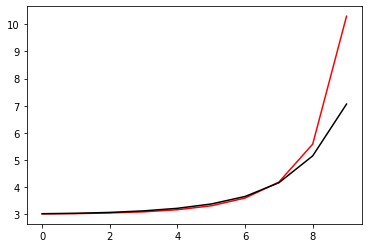

40700 0.01664663100004392
[2.96851378 2.94814525 2.93699678 2.94703798 2.99376934 3.09940907
 3.2897238  3.57414203 4.37662679 6.53469269]


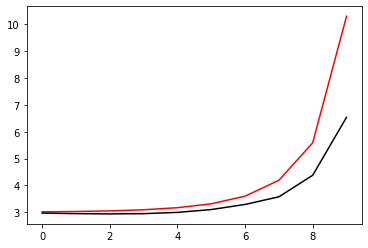

41800 0.013986709799965235
[2.96928457 2.97105615 2.97845965 3.00222255 3.05877221 3.17140663
 3.37275229 3.71940189 4.54500214 6.62579015]


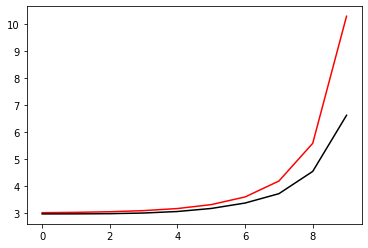

42900 0.043281501106010416
[3.06173236 3.06530481 3.07752119 3.10723195 3.16753374 3.28074586
 3.48772943 3.87517234 4.71820366 6.80530678]


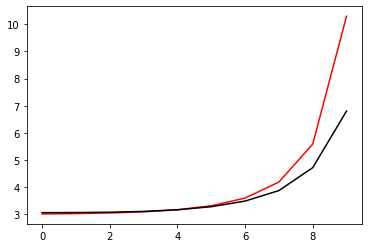

44000 0.14294605536639654
[3.17498385 3.1952512  3.22883236 3.27823843 3.35352088 3.4733838
 3.67184696 4.02972269 4.82096719 6.9231895 ]


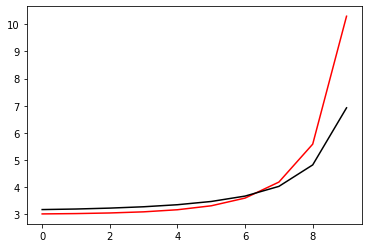

45100 0.0343844900809907
[3.02283371 3.02227593 3.02959509 3.05355624 3.10566545 3.2050787
 3.39018582 3.75219965 4.56577704 6.65267997]


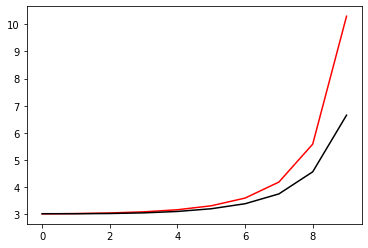

46200 0.022817418917559687
[2.99308707 2.99409965 3.00247973 3.02750451 3.08309873 3.19333991
 3.40453207 3.81815327 4.6971905  6.68950467]


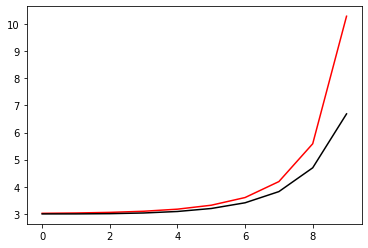

47300 0.023376071430488428
[2.92572454 2.93058943 2.94474932 2.97425671 3.03026189 3.134322
 3.33025132 3.71730955 4.55584134 6.66583876]


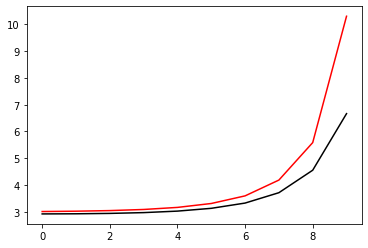

48400 0.03824558855907435
[2.97141827 2.97808764 2.99684766 3.03607608 3.10941742 3.24118789
 3.47942745 3.92758639 4.83675515 6.7533092 ]


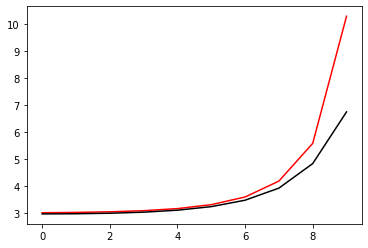

49500 0.048621272757392996
[2.99528554 3.00799971 3.03353219 3.08141866 3.16782126 3.32128014
 3.59513536 4.09862384 5.07946242 6.97462237]


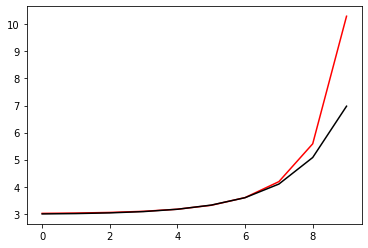

50600 0.07470584488210755
[3.15333365 3.16513842 3.1936195  3.24713097 3.33963472 3.49766043
 3.77092571 4.26564123 5.23544331 7.02383838]


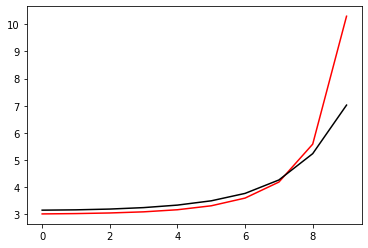

51700 0.023481303031459975
[3.04910084 3.05458945 3.07110123 3.10701303 3.17650397 3.30372305
 3.53475254 3.97020809 4.86128088 6.84934759]


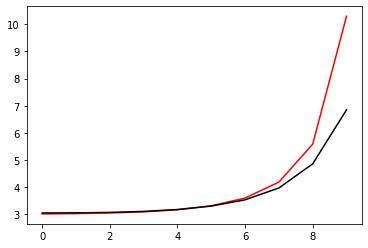

52800 0.013608460299888683
[3.07496001 3.08150957 3.09879192 3.13585961 3.20714065 3.33809204
 3.57878908 4.03697879 4.96757633 6.88964143]


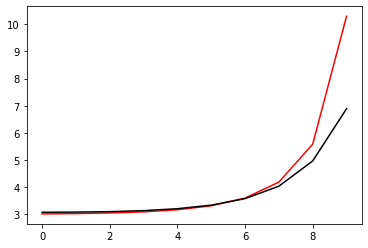

53900 0.04805976440349588
[3.01554392 3.00965402 3.00453918 3.01474118 3.05650713 3.15385088
 3.35281145 3.75479527 4.61296902 6.67007537]


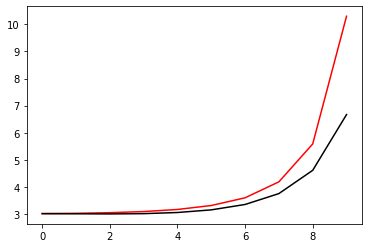

55000 0.02733570978573741
[3.05129658 3.04952681 3.05153861 3.06722114 3.11253549 3.21458337
 3.42388354 3.84696713 4.74273932 6.74017015]


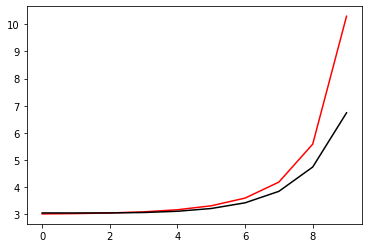

56100 0.03341966609121533
[2.98416206 2.98838165 2.99841862 3.02201557 3.07430358 3.18182983
 3.39692275 3.83268513 4.75776491 6.71655418]


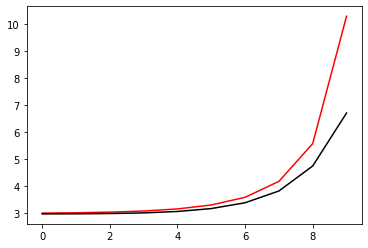

57200 0.02210888064275977
[2.96046532 2.96649928 2.98310194 3.01883623 3.08740566 3.21387596
 3.44975958 3.90911845 4.86376601 6.79631946]


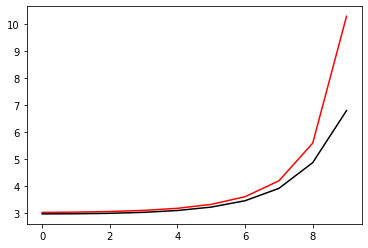

58300 0.023584342314521375
[3.02313427 3.02216201 3.03375306 3.06625583 3.13290494 3.2596686
 3.49598911 3.95450522 4.90672952 6.94276191]


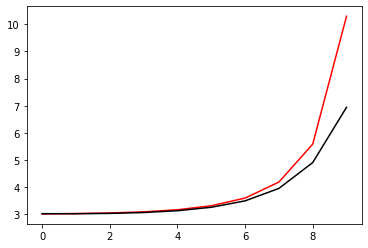

59400 0.04031047386036233
[3.10127265 3.11576619 3.13436892 3.16130214 3.20831728 3.29235673
 3.41911944 3.47898869 4.01774183 6.30158311]


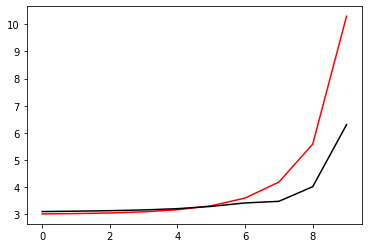

60500 0.059765217671069126
[3.07080045 3.07963442 3.09800665 3.12812897 3.17720058 3.25705403
 3.38536754 3.63455743 4.10988192 6.37916942]


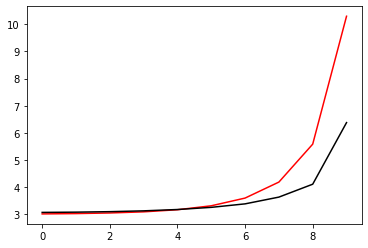

61600 0.013409943158121747
[3.0833257  3.08323811 3.09472463 3.12250785 3.17502147 3.27174198
 3.47283338 3.89643048 4.33935684 6.44506357]


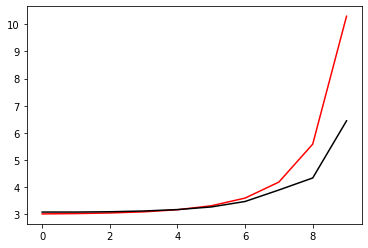

62700 0.023404906527706538
[3.06273389 3.06924587 3.08832726 3.12727817 3.19950059 3.33352394
 3.58282139 4.0137511  4.64603615 6.73509148]


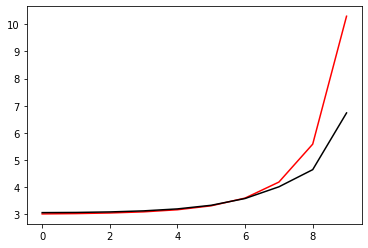

63800 0.013714473726610138
[3.01653109 3.02623706 3.0504225  3.09727753 3.18123123 3.3280303
 3.58235505 4.03591102 4.88637971 6.85557369]


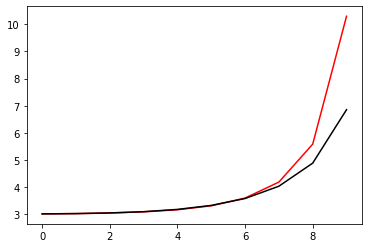

64900 0.043603029416642194
[3.04359442 3.05340657 3.07817769 3.12557092 3.20777682 3.34672075
 3.58622168 4.03288493 4.95423974 6.90479184]


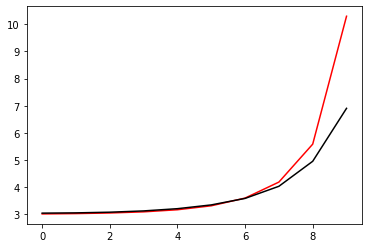

66000 0.0333427084246475
[2.95101418 2.94253343 2.93953143 2.95659762 3.0087321  3.11860563
 3.31592605 3.59582004 4.38285124 6.54465186]


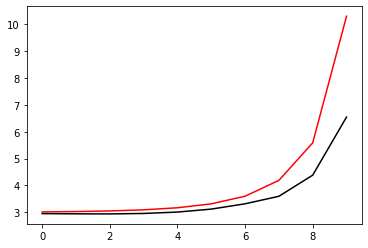

67100 0.03289146533568061
[2.9503073  2.95430125 2.96477052 2.99068135 3.04769642 3.15880544
 3.35648211 3.69145749 4.49122109 6.60563605]


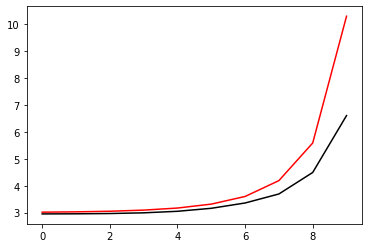

68200 0.022807502901643795
[2.98447402 2.98979182 3.00489766 3.03771397 3.10126417 3.21804609
 3.42884728 3.81875199 4.65734349 6.69566223]


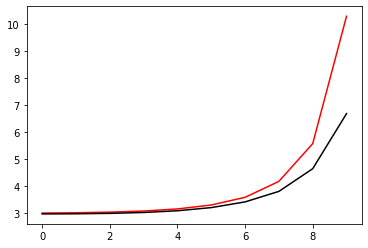

69300 0.0229750701445076
[3.02743961 3.03469672 3.05130937 3.08157486 3.13380083 3.22379704
 3.38395639 3.69442839 4.41001917 6.55426714]


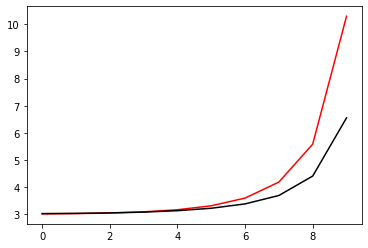

70400 0.03960851810839622
[3.01074874 3.01350232 3.02464609 3.05294301 3.11159291 3.22365775
 3.43479996 3.84335919 4.68856899 6.68977548]


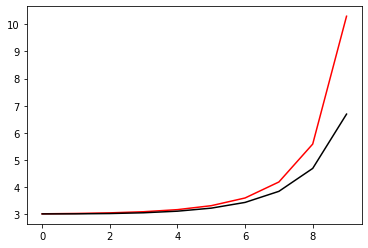

71500 0.047159071553027086
[2.99303262 3.0017082  3.02123197 3.06090738 3.13731663 3.28018688
 3.54489643 4.03929179 4.99787767 6.93533985]


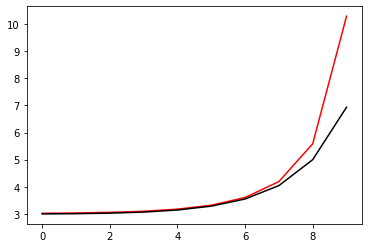

72600 0.01410017510480625
[3.01111612 3.02350754 3.0538201  3.10732862 3.1987288  3.35566349
 3.63089627 4.13553752 5.11986905 7.03219505]


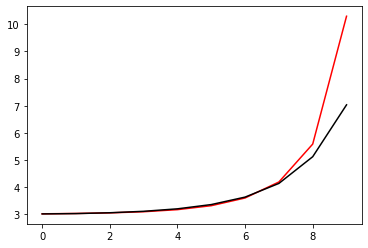

73700 0.09373771570929802
[2.75409433 2.75634541 2.77635651 2.81950562 2.90920985 3.07702343
 3.37565209 3.89192192 4.8647691  7.15774863]


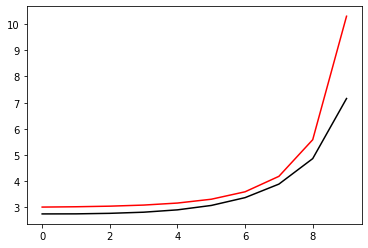

74800 0.014368674218993498
[2.9557836  2.95231763 2.95604683 2.98168859 3.04804529 3.1844354
 3.44042363 3.90611629 4.81416799 6.79778826]


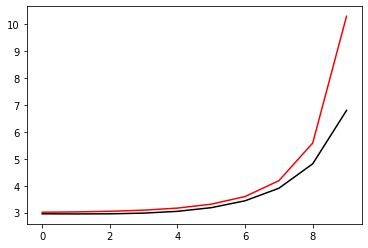

75900 0.04409665084450848
[3.000034   3.00508164 3.02041273 3.05594553 3.12855039 3.26756269
 3.52494378 4.00076305 4.92980438 6.88455449]


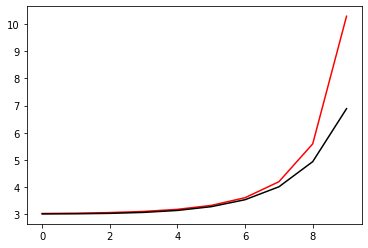

77000 0.025708242951137113
[3.01607155 3.02007743 3.03442406 3.06930165 3.14128196 3.2787961
 3.53573374 4.02186123 4.98292405 6.88608   ]


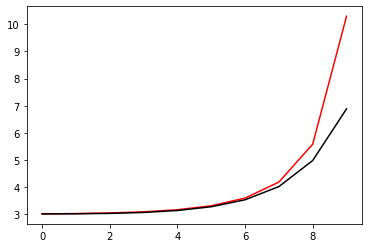

78100 0.03575028987493579
[3.11264352 3.12005831 3.13736126 3.17055556 3.23092415 3.33923451
 3.53686217 3.91803783 4.73804509 6.76793005]


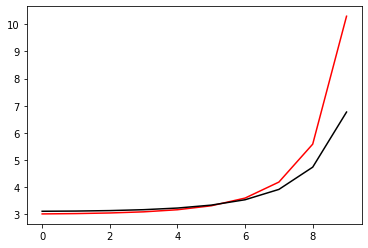

79200 0.02287822374927296
[2.9891549  2.99183527 3.00411874 3.03435491 3.09512933 3.20997359
 3.42716985 3.8551431  4.75744618 6.76257404]


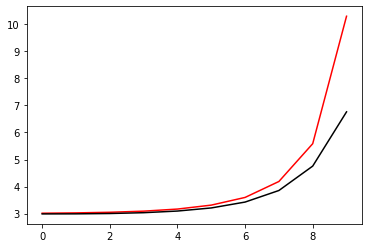

80300 0.023628508349217696
[2.96872619 2.97564435 2.99404005 3.03195745 3.10263086 3.23057743
 3.46556064 3.91823982 4.85621206 6.85421606]


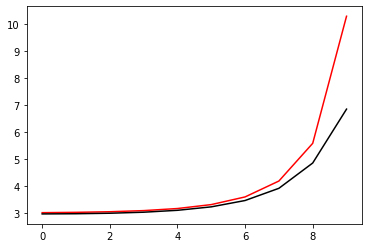

81400 0.05415682597257566
[2.90162771 2.89493281 2.90122887 2.92864288 2.98879631 3.10355844
 3.31688117 3.72588469 4.57975768 6.66651653]


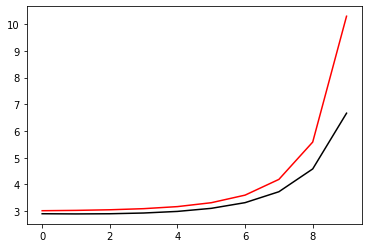

82500 0.04773352681156725
[3.02014457 3.01258972 3.00866945 3.0229021  3.07027737 3.17315372
 3.37505822 3.77255813 4.61479522 6.6811712 ]


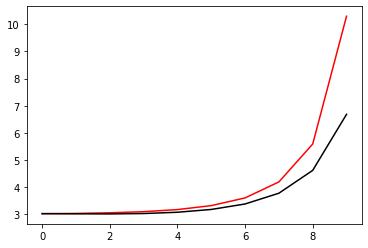

83600 0.01331798473239934
[3.06747228 3.06070953 3.05880577 3.07240742 3.11836159 3.22308337
 3.43416809 3.85260349 4.73084994 6.72010907]


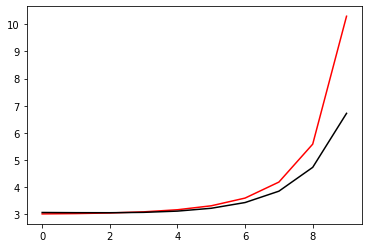

84700 0.023374559174100813
[3.06515983 3.06294452 3.06658345 3.08614129 3.13718592 3.24765363
 3.47012603 3.9137217  4.83635232 6.85612274]


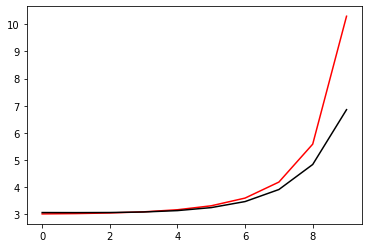

85800 0.013495580276846927
[3.08247331 3.0862711  3.09774439 3.1261001  3.1859325  3.30381238
 3.53309283 3.98870064 4.93762576 6.8718186 ]


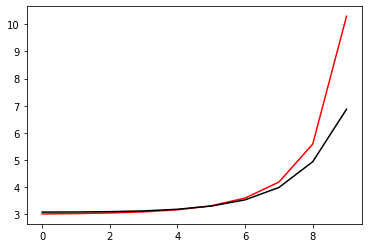

86900 0.04763265688307926
[2.93640895 2.94890542 2.9695231  3.00451439 3.06684514 3.18058086
 3.3939011  3.81457901 4.71251987 6.67139566]


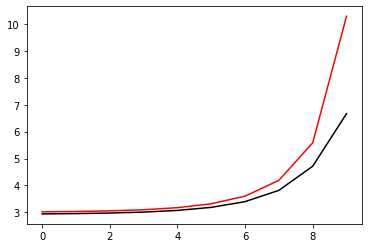

88000 0.025166877264724812
[2.99026898 2.9980813  3.02189145 3.06789632 3.14778598 3.2846686
 3.52612655 3.97702346 4.89477027 6.8286637 ]


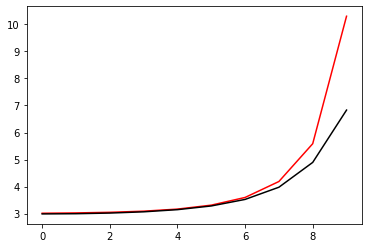

89100 0.036658306728813324
[2.8865697  2.8912603  2.90832292 2.94606342 3.01641894 3.14250643
 3.37225444 3.81396017 4.7340223  6.66417053]


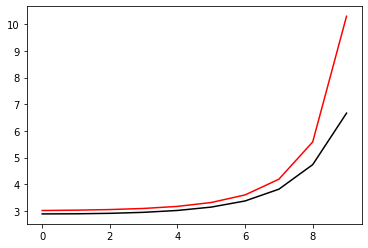

90200 0.020994682735184886
[2.95158014 2.95224262 2.96234822 2.99312328 3.05883923 3.18555871
 3.42603404 3.89348647 4.84373697 6.83120399]


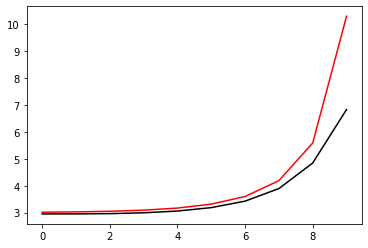

91300 0.023842702615342385
[2.92639589 2.93340784 2.95160508 2.99045678 3.06435261 3.20033121
 3.45100089 3.93389804 4.91868776 6.93727736]


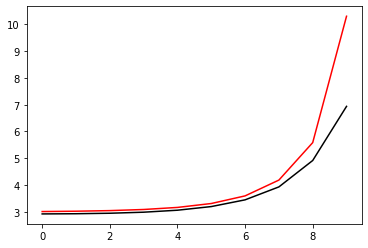

92400 0.04440389120648883
[2.95510744 2.95084587 2.9546965  2.97682359 3.02748452 3.12528049
 3.29178408 3.60409565 4.53121691 6.7797091 ]


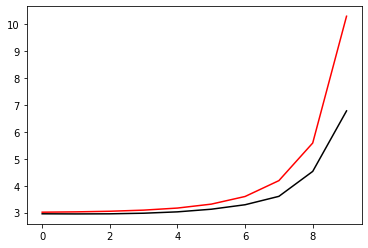

93500 0.0471512469925421
[2.99210833 3.00121849 3.02173396 3.06165414 3.13633857 3.27271769
 3.52165438 3.98787215 4.91753166 6.86193362]


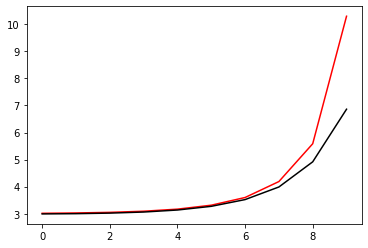

94600 0.013246310306302887
[3.07337057 3.06607533 3.06208786 3.07365831 3.11603972 3.21304952
 3.4106587  3.81054286 4.6720781  6.69398826]


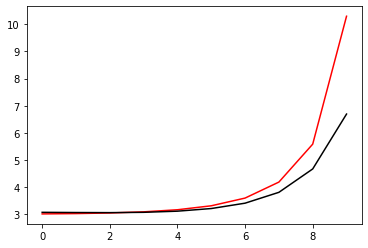

95700 0.023440547818507802
[3.06346462 3.06800686 3.08143582 3.11154455 3.17206653 3.28946496
 3.51544183 3.95967754 4.88048592 6.86328533]


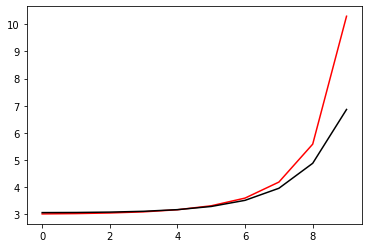

96800 0.013716652042034573
[3.02998367 3.03956745 3.06305107 3.10742467 3.18537712 3.32056985
 3.56358434 4.02768726 4.97948812 6.92671178]


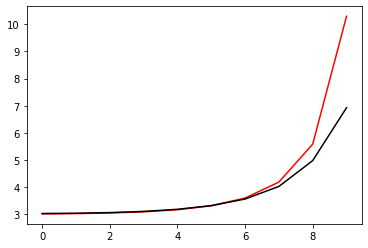

97900 0.05332909513073347
[2.94960332 2.9394856  2.9342264  2.94807767 2.99457919 3.09318641
 3.27240656 3.5913929  4.38933949 6.53164556]


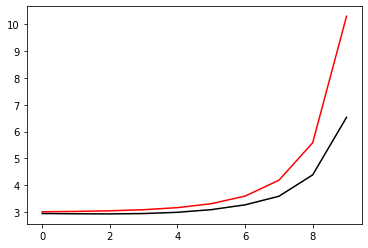

99000 0.03281494038476497
[2.95319582 2.95526272 2.96198209 2.98268855 3.03236392 3.13295425
 3.32013555 3.67136447 4.48465964 6.61682667]


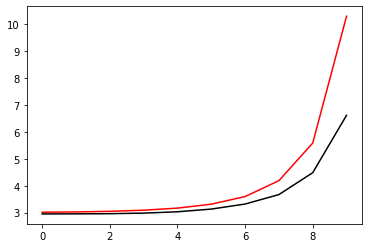

100100 0.033562343734925976
[2.99259089 2.99721024 3.01106185 3.04124131 3.10046677 3.21147495
 3.41741644 3.81204628 4.66482025 6.72818086]


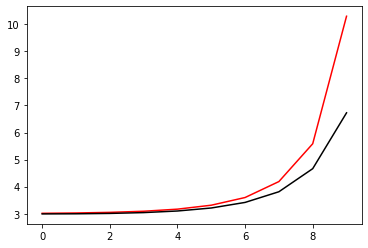

101200 0.022171187091798168
[2.96776821 2.97248748 2.98665165 3.01620187 3.07155576 3.1725871
 3.3603476  3.73003492 4.54057827 6.63462969]


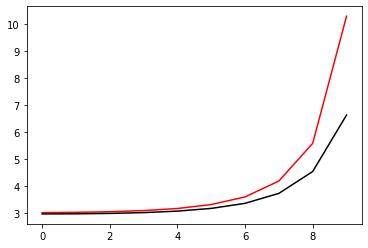

102300 0.02348732569340517
[2.96948579 2.97390496 2.98832083 3.02222226 3.08887184 3.211501
 3.43668213 3.86682345 4.75575844 6.78831158]


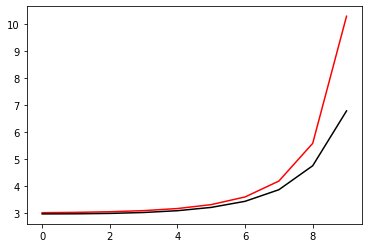

103400 0.037282708092920586
[2.94757823 2.95639568 2.97846381 3.02274366 3.10508322 3.25347554
 3.52023652 4.01308952 4.9827156  6.80596942]


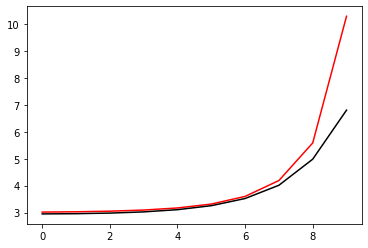

104500 0.050860096712541714
[3.06566038 3.03589227 3.01399485 3.01028921 3.03666125 3.11223009
 3.26679841 3.57535601 4.35647026 6.52051607]


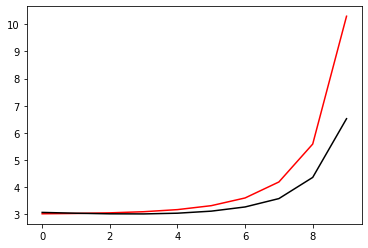

105600 0.013517063763982151
[3.11921571 3.10795211 3.09635894 3.09524441 3.1214285  3.19998419
 3.37413067 3.73816552 4.56718477 6.61802663]


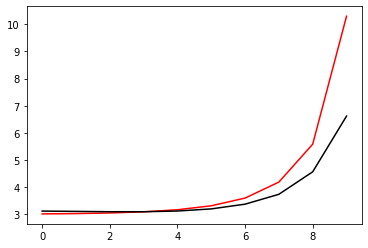

106700 0.018146214100562778
[2.92884762 2.9260869  2.92720829 2.93895974 2.97434313 3.05751159
 3.23582789 3.61337744 4.46293438 6.57547903]


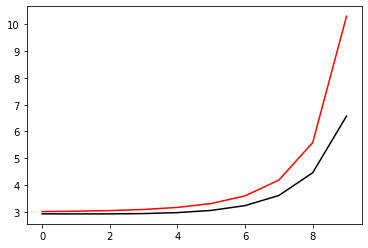

107800 0.013342047874049412
[3.0298045  3.03933849 3.06115992 3.09967313 3.16467849 3.27746008
 3.48281967 3.88260877 4.73822769 6.76676759]


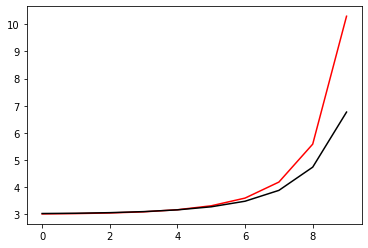

108900 0.04358027591084143
[3.02910013 3.03850582 3.06091144 3.10271932 3.17551411 3.3012488
 3.52592224 3.95434754 4.84669546 6.83367071]


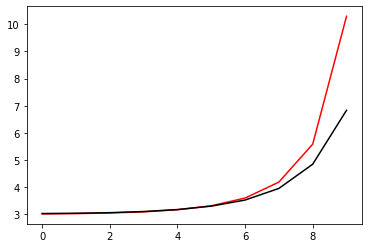

110000 0.35571432957594745
[2.68245331 2.69213243 2.71478431 2.75826044 2.83419226 2.96751534
 3.21123756 3.69014727 4.69947613 6.89274566]


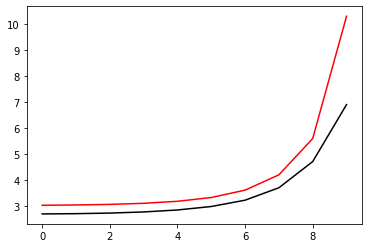

111100 0.04164048460897001
[3.06095291 3.07648769 3.10745205 3.15627527 3.23104189 3.34053162
 3.47406814 3.67886337 4.24666349 6.45746009]


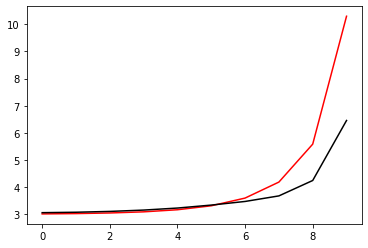

112200 0.023037106130938078
[3.03994228 3.05138873 3.07805074 3.12393786 3.19475079 3.30029868
 3.46554414 3.77345053 4.35066562 6.50787592]


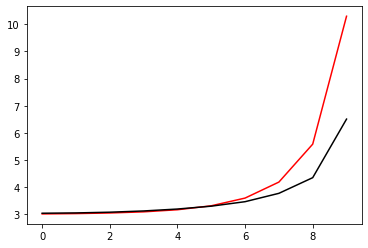

113300 0.023185098399873223
[2.97568322 2.98405223 3.00462885 3.04306899 3.10807044 3.21550793
 3.39999584 3.74403982 4.49740629 6.62591062]


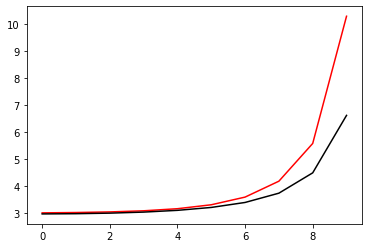

114400 0.03785406899890494
[2.95640315 2.96580353 2.98875761 3.03334997 3.1139435  3.25740344
 3.52263306 3.9983609  4.81191385 6.72875412]


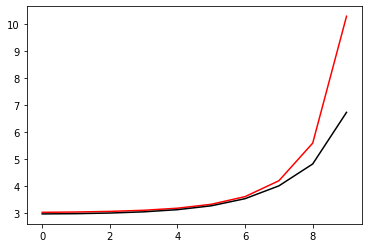

115500 0.048041090301407706
[2.98377079 2.99638235 3.0260651  3.08079411 3.17847275 3.35439452
 3.66481001 4.18055592 5.08169897 6.99820683]


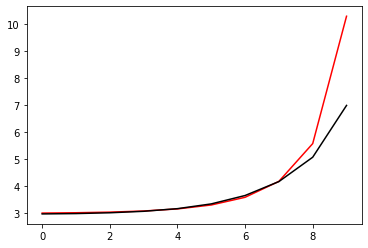

116600 0.014267546167884872
[3.01360283 3.02435185 3.04919387 3.10478459 3.20128901 3.37163207
 3.66362044 4.19357774 5.19057035 7.06150249]


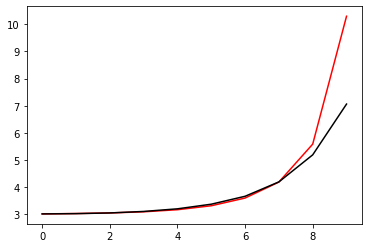

117700 0.02302751597338999
[3.07030472 3.04785357 3.02969449 3.02819289 3.06684719 3.16770439
 3.37490815 3.63586338 4.36776445 6.53590841]


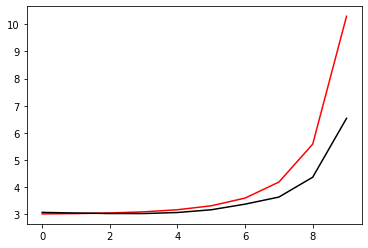

118800 0.013019017591054451
[3.09011208 3.08297692 3.0760055  3.08213025 3.12003108 3.21736119
 3.41062027 3.73600305 4.4921782  6.60028711]


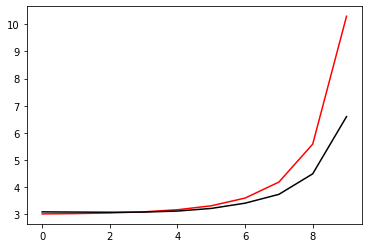

119900 0.04321465269412573
[3.07324447 3.07341965 3.07754201 3.09464996 3.13967705 3.23795398
 3.4337911  3.81190945 4.61955021 6.72358899]


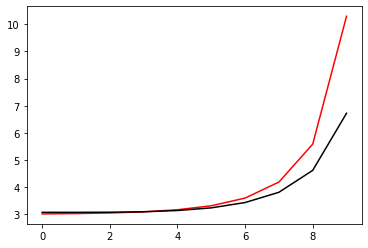

121000 0.02530919927565102
[2.99060211 2.9952008  3.01175675 3.04716624 3.11499054 3.23971972
 3.47071823 3.91158736 4.80892928 6.76251296]


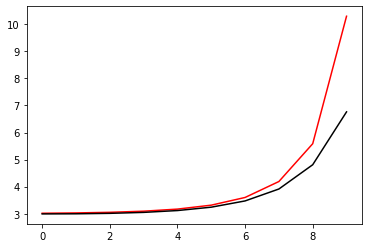

122100 0.033524575674134915
[2.94964785 2.95817846 2.97845121 3.02150581 3.10126152 3.24337033
 3.4979772  3.97223255 4.91729086 6.91675377]


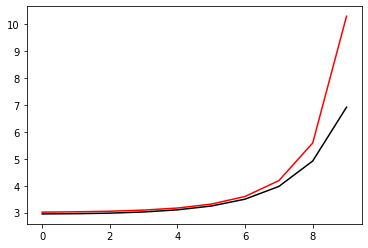

123200 0.022847116472272853
[3.04103405 3.03090638 3.01717885 3.01140627 3.02938792 3.09435531
 3.24916715 3.5944807  4.41522176 6.57560906]


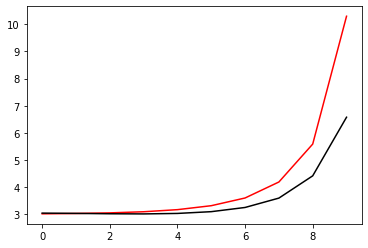

124300 0.023259735167725497
[2.98142129 2.98164681 2.98540502 3.00058891 3.04114692 3.13276365
 3.32722544 3.73895347 4.64566837 6.74549601]


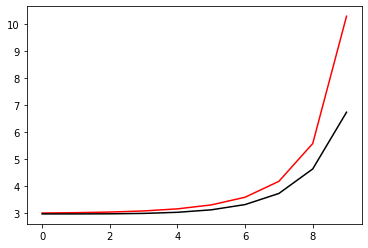

125400 0.03775465165685339
[2.96144417 2.96853494 2.98648039 3.02374034 3.09571986 3.23046269
 3.48206452 3.96393394 4.93914659 6.79962862]


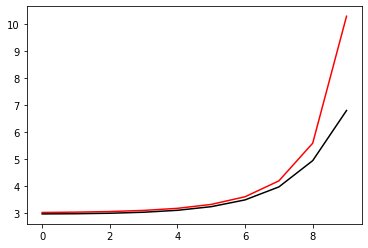

126500 0.06103003595914583
[3.10102068 3.10039624 3.10427644 3.1211331  3.15932343 3.23346151
 3.37031823 3.64361447 4.38008772 6.5809528 ]


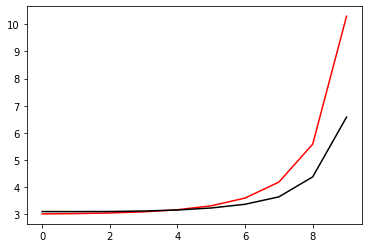

127600 0.013602732247369183
[3.08294632 3.08602696 3.09663666 3.12330878 3.18103591 3.29822108
 3.53033131 3.97786235 4.81698175 6.75183061]


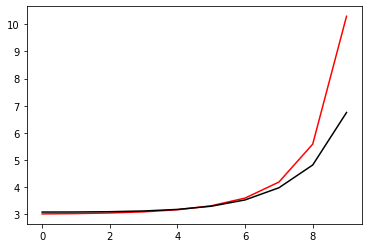

128700 0.023353430488538142
[3.06680016 3.07479109 3.09382549 3.12952021 3.19424511 3.31149742
 3.52709852 3.94014378 4.79361969 6.81083895]


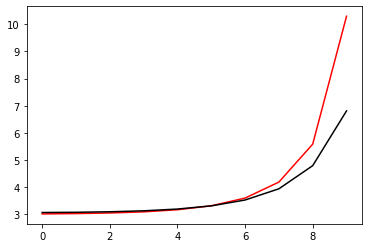

129800 0.01367528926685576
[3.02316677 3.03389198 3.05940498 3.10634638 3.18631819 3.32253345
 3.56265913 4.01160282 4.92164411 6.89023398]


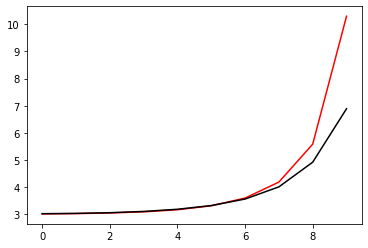

130900 0.043443438826376544
[3.04986051 3.06003523 3.08458371 3.1311439  3.21100568 3.34756617
 3.58747897 4.04014157 4.9695752  6.91464256]


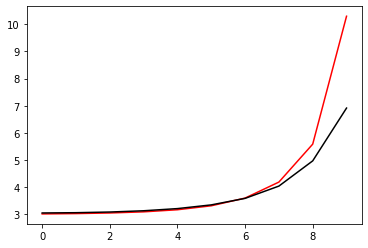

132000 0.02896856015962746
[3.05279326 3.05532558 3.06416517 3.08591762 3.12941192 3.20732336
 3.34642036 3.63423261 4.3790527  6.52369504]


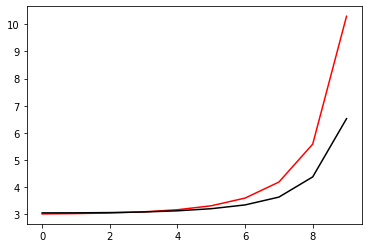

133100 0.03350789322880661
[2.99901696 2.99552796 2.99960278 3.0196607  3.06956289 3.17557827
 3.39266496 3.84267067 4.75177003 6.77739925]


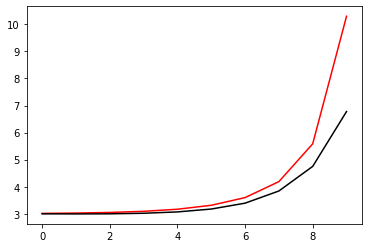

134200 0.019195801931993287
[2.91700087 2.92684234 2.94882912 2.98667725 3.05130539 3.16481225
 3.37053657 3.76117524 4.57236067 6.63596658]


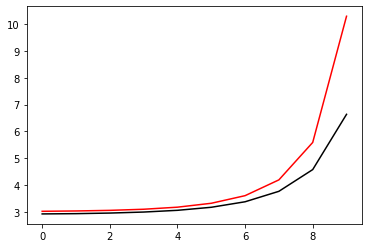

135300 0.023461399074063496
[2.93173003 2.93793551 2.95673958 2.99623092 3.06748654 3.19109985
 3.40925448 3.81497016 4.64220561 6.71852507]


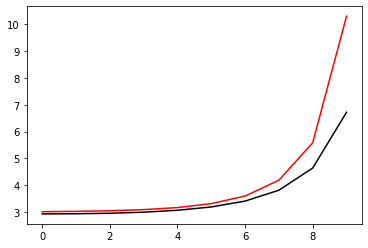

136400 0.03768331412175503
[2.95762699 2.96616658 2.98901108 3.03488701 3.11811408 3.26345686
 3.51836104 3.98254654 4.8929528  6.79846434]


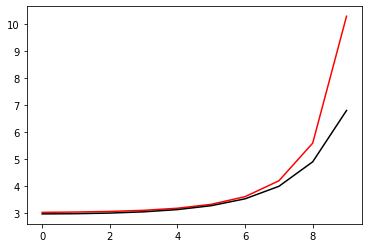

137500 0.04586413689359112
[2.95250525 2.9616729  2.98758788 3.03745914 3.12387738 3.27080856
 3.52576941 3.98974926 4.90365342 6.859973  ]


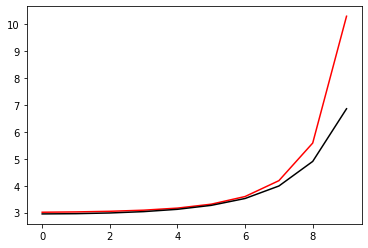

138600 0.014090329487614388
[3.06311109 3.07414968 3.09972568 3.14793773 3.23411365 3.38532989
 3.6528499  4.14318691 5.1018174  6.94352017]


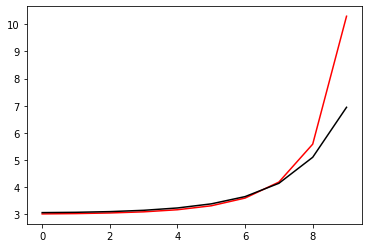

139700 0.023137073297997548
[3.08267959 3.07142652 3.06343228 3.07337718 3.11567662 3.21215027
 3.40595846 3.79416635 4.62682223 6.70092035]


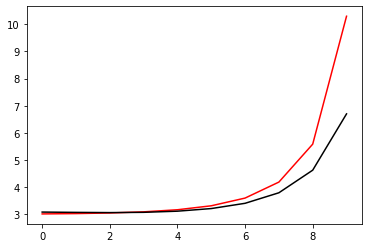

140800 0.013264909514789171
[3.06768846 3.06572149 3.06740307 3.08312385 3.12876282 3.23119423
 3.44013763 3.86045969 4.74815154 6.75956973]


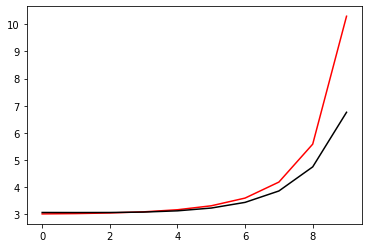

141900 0.048638857587607
[2.94803651 2.95844457 2.97821898 3.01322293 3.07653361 3.19331824
 3.4139379  3.84791062 4.7581945  6.73754453]


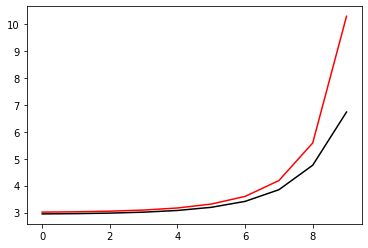

143000 0.025397715923864222
[3.00788733 3.01137594 3.0278502  3.06503276 3.13688509 3.26937281
 3.51446227 3.98488101 4.94442969 6.84414009]


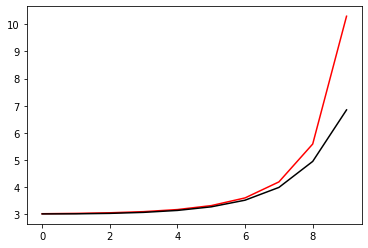

144100 0.03370956343619241
[2.96758282 2.97240827 2.98780763 3.02587765 3.10090698 3.24005989
 3.49788594 3.99231239 4.98909986 7.00083708]


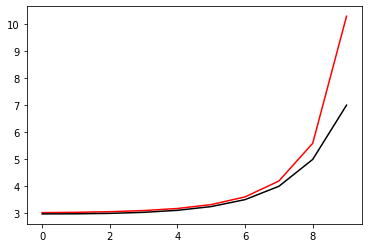

145200 0.07714022761871005
[2.80654949 2.81113133 2.8350883  2.88084684 2.9724631  3.14125606
 3.45137986 4.0253676  5.10413468 6.91105218]


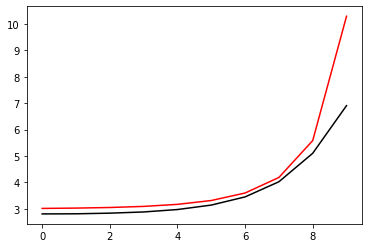

146300 0.023083008809768123
[3.06865799 3.08964147 3.11563427 3.16592056 3.23374474 3.3459331
 3.48790414 3.44575846 4.17247386 6.39790851]


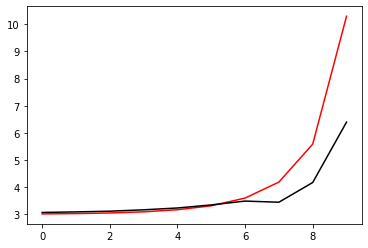

147400 0.037297591880925275
[3.07193987 3.08569453 3.11451299 3.16239414 3.23549543 3.34404819
 3.50300847 3.76682574 4.26809454 6.44931305]


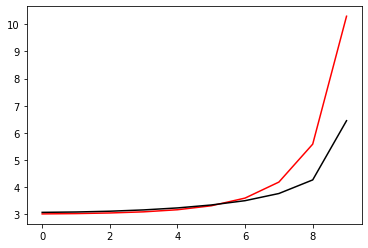

148500 0.048600994469188724
[2.99406672 3.00378942 3.02751167 3.06920485 3.13557648 3.2381287
 3.41135555 3.77751828 4.39115129 6.57043756]


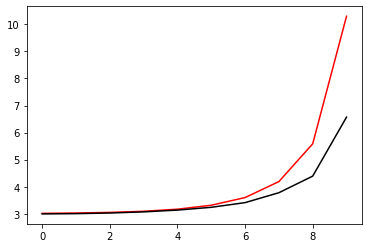

149600 0.013272101872928101
[3.02412995 3.03563283 3.05995482 3.10221705 3.17226966 3.28945122
 3.48987178 3.83744069 4.47860832 6.57993026]


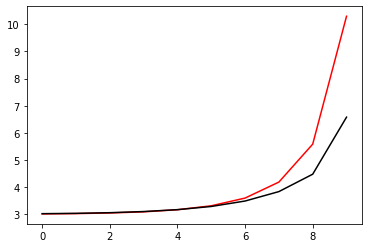

150700 0.023570778537717864
[3.07659271 3.08387118 3.10345113 3.14420677 3.22017915 3.35610341
 3.59597139 4.01758565 4.77542887 6.86930746]


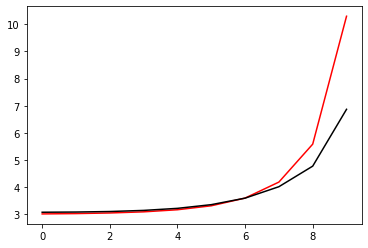

151800 0.013483947713388969
[3.02607633 3.0358015  3.05914078 3.10257169 3.1779607  3.30769486
 3.53514778 3.95263726 4.78329119 6.79752412]


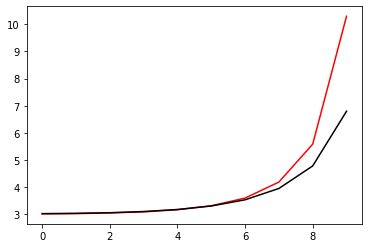

152900 0.0436285652998975
[3.02970481 3.03977267 3.06391296 3.10880366 3.18628293 3.31831217
 3.55052311 3.9868281  4.87934752 6.8528554 ]


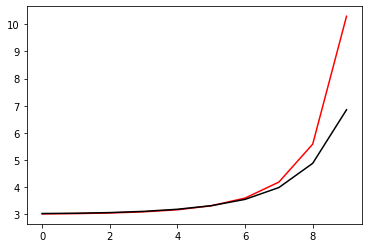

154000 0.02802107939330384
[2.983162   3.01612667 3.06122226 3.12127489 3.20785707 3.33492283
 3.49899553 3.64079415 4.26611191 6.50492951]


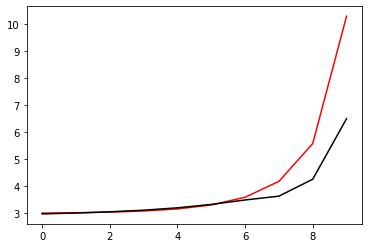

155100 0.034192194863695555
[2.97758912 2.99411273 3.03053715 3.08860483 3.17451564 3.30035472
 3.48733602 3.80839585 4.42514011 6.5637249 ]


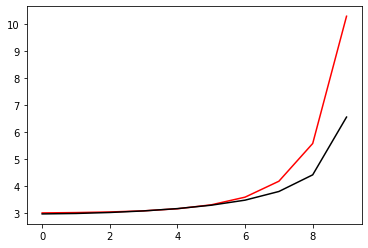

156200 0.02298463531238543
[2.97553994 2.98551132 3.01121523 3.05965834 3.14036574 3.27055004
 3.4875568  3.87833904 4.60870233 6.67025947]


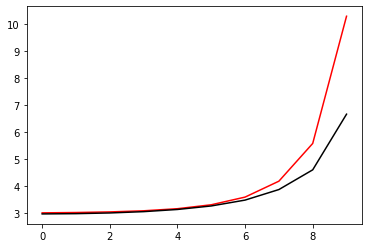

157300 0.023561883787824624
[2.96846712 2.97607583 2.99602428 3.03669066 3.11135036 3.24249057
 3.47288116 3.89788472 4.78533826 6.81538921]


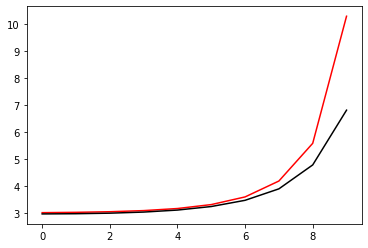

158400 0.03987286988185573
[2.97388261 2.98951094 3.01901928 3.06585956 3.14068958 3.2617801
 3.45918647 3.79429115 4.48189598 6.56830664]


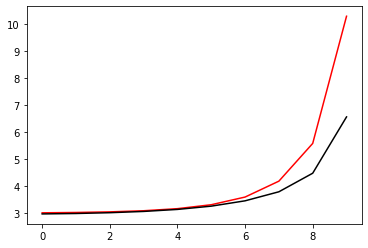

159500 0.04600497148068984
[2.9656636  2.97305885 2.99436439 3.03747233 3.11511043 3.25092174
 3.49444713 3.95255188 4.80158992 6.8120513 ]


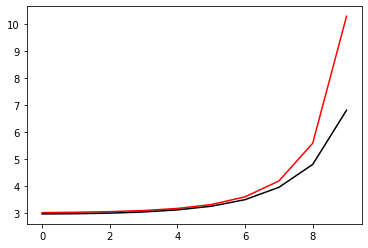

160600 0.030801880828898023
[3.11376049 3.11925849 3.13876834 3.18206328 3.26660517 3.42431074
 3.71523725 4.23851167 5.14817609 6.93375402]


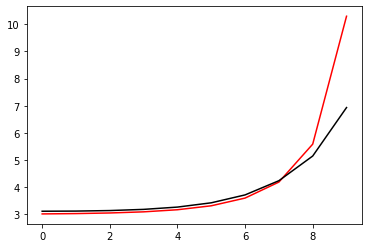

161700 0.023904508921194653
[3.01292591 3.02401211 3.05095897 3.10114869 3.18782638 3.33722891
 3.59993059 4.0858728  5.05066008 6.95752034]


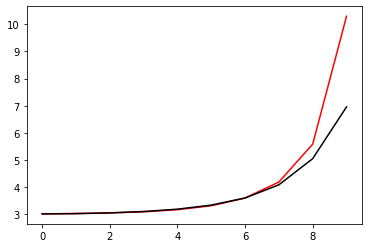

162800 0.01333787960631525
[3.10305644 3.10404589 3.1171893  3.14984516 3.21526725 3.33360244
 3.53601312 3.87687487 4.59436722 6.68046168]


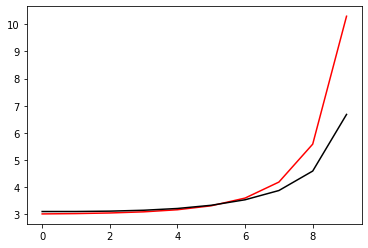

163900 0.04556052863574089
[2.92471705 2.94056452 2.97025487 3.0206018  3.10403242 3.24237995
 3.4754391  3.88579647 4.70292522 6.69719729]


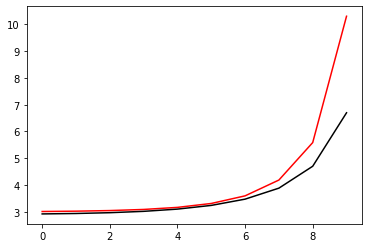

165000 0.028344600854136426
[2.9300758  2.94328917 2.97378818 3.02835572 3.11918195 3.26933827
 3.52465916 3.98366945 4.88085069 6.88353125]


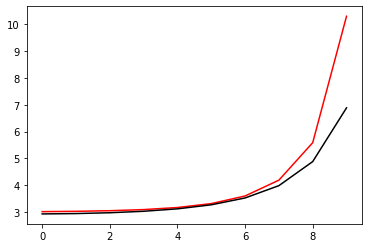

166100 0.038026621518807896
[2.87186813 2.88321723 2.90883718 2.955396   3.03441755 3.16671676
 3.39325527 3.80553206 4.64584106 6.68470157]


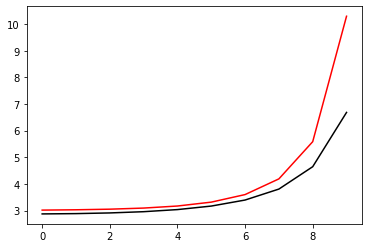

167200 0.02301034250801198
[2.99205176 2.99397724 3.00646367 3.03899271 3.10500835 3.22834997
 3.45634387 3.89320546 4.78627283 6.80023271]


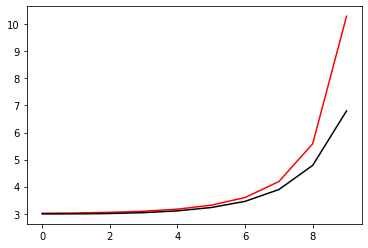

168300 0.023790633092971185
[2.96500703 2.96770166 2.97903232 3.0101096  3.07727402 3.20893626
 3.46121213 3.95504255 4.96542248 6.9245096 ]


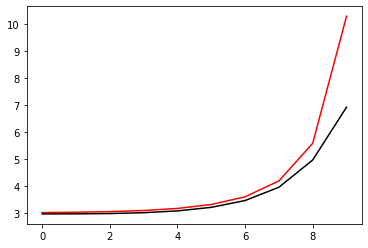

169400 0.03684145712652614
[2.94197692 2.95178134 2.97529439 3.02165628 3.10745388 3.26303204
 3.54695402 4.0738676  5.10038255 6.83018235]


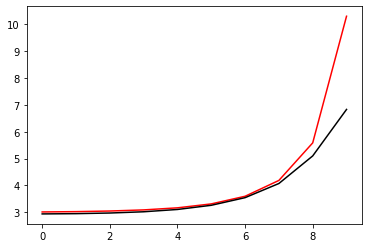

170500 0.09012600512363224
[2.90075702 2.88468179 2.88182628 2.89969751 2.95494978 3.07163288
 3.27958501 3.55891259 4.36935662 6.53877964]


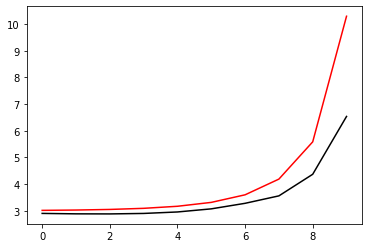

171600 0.03284560456322981
[2.95079445 2.94878673 2.9511348  2.97019179 3.0230438  3.1330067
 3.33042617 3.65102431 4.45324819 6.58691607]


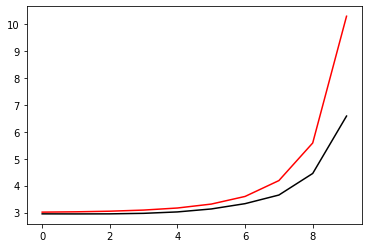

172700 0.023218785150974693
[3.03854481 3.04198627 3.05529644 3.08592139 3.14700971 3.26154164
 3.46782934 3.8417489  4.66886591 6.76990489]


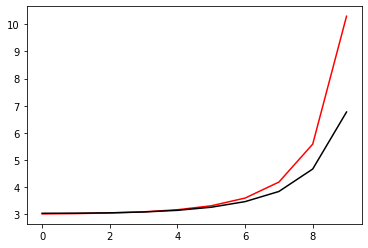

173800 0.05904488783725831
[2.79433614 2.80550147 2.82810232 2.8693757  2.94118172 3.06525779
 3.28442677 3.69320328 4.54936137 6.61502271]


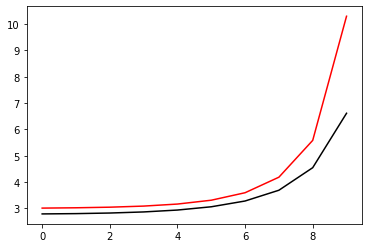

174900 0.04305777803721788
[3.06011997 3.07115558 3.09539374 3.13707354 3.20548188 3.3191413
 3.51599334 3.88329345 4.66382546 6.71805036]


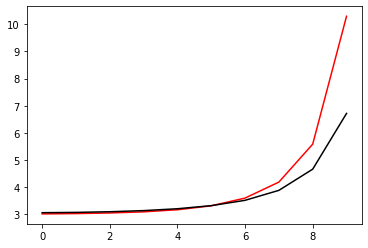

176000 0.059183527941098796
[2.90192007 2.89610432 2.90280845 2.92911114 2.98802347 3.10303591
 3.31981781 3.73779489 4.60341003 6.90906023]


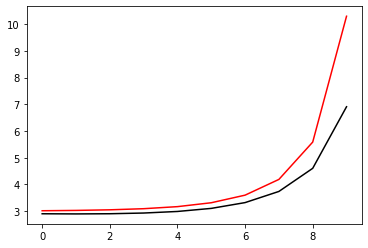

177100 0.03361655770264757
[2.99507189 2.99632361 3.00594007 3.03277793 3.09151483 3.20827224
 3.43248232 3.86853249 4.76963422 6.79078428]


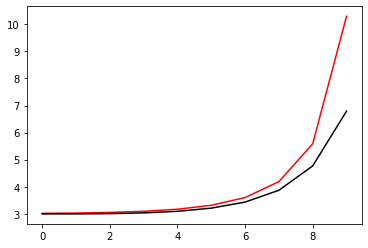

178200 0.02206457604272786
[2.95376674 2.96361863 2.98628564 3.02664134 3.09617453 3.21785543
 3.43852488 3.86224677 4.74710751 6.76400159]


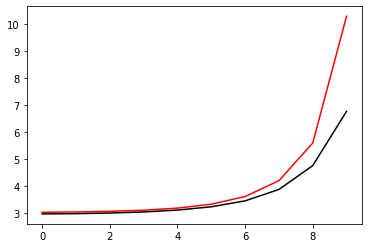

179300 0.02365554823751533
[2.96413334 2.97142355 2.99085737 3.03107385 3.10557164 3.23810675
 3.47658551 3.92755487 4.85042191 6.87671468]


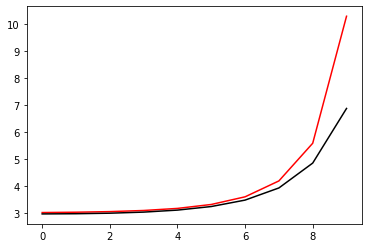

180400 0.03684500841605023
[2.94132911 2.95460588 2.98259411 3.03424241 3.12626966 3.28730144
 3.5706832  4.08441834 5.08167531 6.82694222]


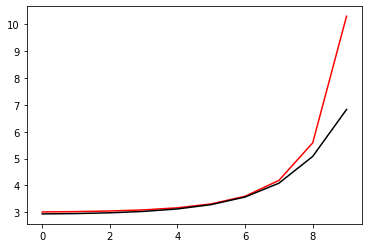

181500 0.04832882326007747
[2.98544873 3.00001726 3.02964954 3.08679481 3.18499007 3.36252235
 3.67225364 4.22750859 5.2687395  7.10254306]


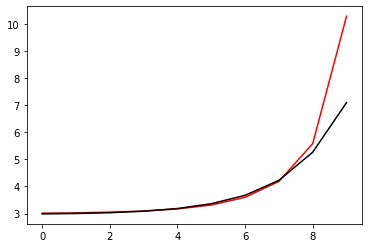

182600 0.033224076292909785
[2.95144739 2.94205063 2.93298933 2.95035179 2.99973553 3.11857867
 3.33134377 3.62422961 4.36275882 6.53994086]


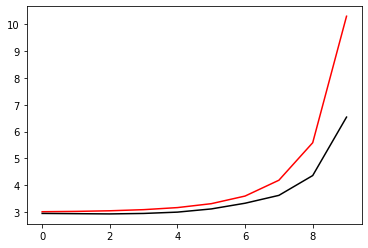

183700 0.018324275434220334
[2.9526197  2.954033   2.96228055 2.98670778 3.04348687 3.15841117
 3.36677098 3.71476666 4.4795503  6.60827882]


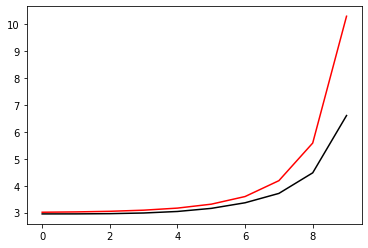

184800 0.013287999783587221
[3.04426281 3.05073619 3.06593874 3.09909101 3.16336931 3.28145498
 3.49466242 3.8854255  4.69160088 6.64307551]


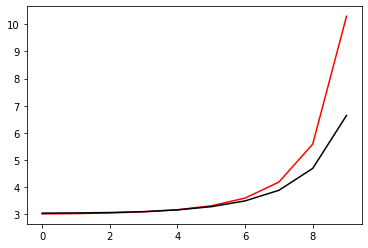

185900 0.0435067077472149
[3.03520029 3.04314631 3.06296265 3.10147896 3.17106351 3.29440107
 3.51682696 3.93624233 4.79326789 6.79070853]


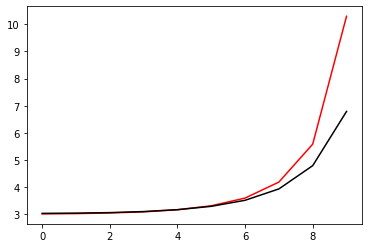

187000 0.30399244767830785
[2.69219925 2.70068009 2.72338244 2.76814727 2.84705495 2.98440395
 3.22855576 3.68921282 4.62748077 6.87924521]


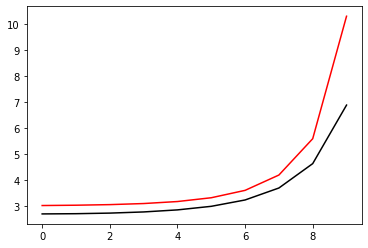

188100 0.041747012584763946
[3.05505444 3.07153898 3.10379916 3.15418823 3.23087577 3.34362472
 3.4853191  3.67621251 4.20094336 6.42948256]


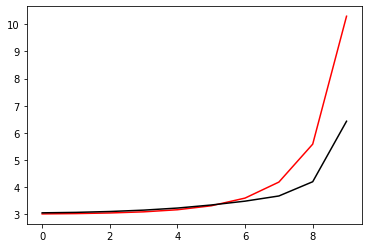

189200 0.023013256246087795
[3.0318899  3.04372778 3.07118646 3.11808841 3.1899021  3.29516564
 3.45338567 3.74107958 4.2979516  6.47908527]


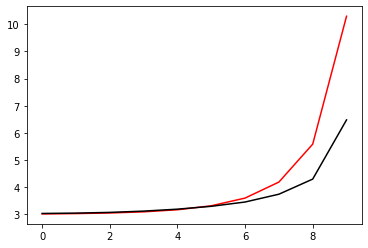

190300 0.02317100964884293
[2.9819575  2.98954026 3.00896462 3.04658526 3.11157521 3.21990662
 3.40647795 3.75448967 4.48013371 6.60244264]


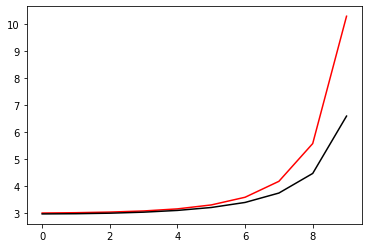

191400 0.04013055316283242
[2.97454211 2.98294228 3.00214592 3.0386395  3.10440027 3.21981929
 3.42030927 3.77811785 4.48784247 6.53771661]


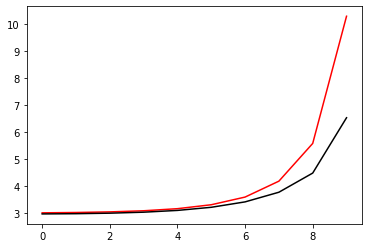

192500 0.0479141178563203
[2.98941261 2.9955398  3.01286323 3.04719749 3.10873657 3.2159873
 3.404497   3.75040057 4.45439859 6.56297015]


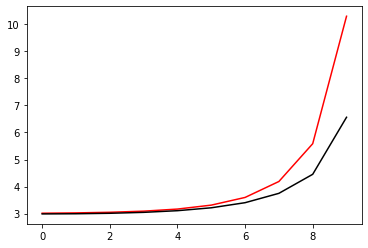

193600 0.01353630567987198
[3.04844797 3.05331173 3.06854216 3.10348093 3.1727005  3.30191031
 3.54044959 3.98657724 4.84406918 6.76689759]


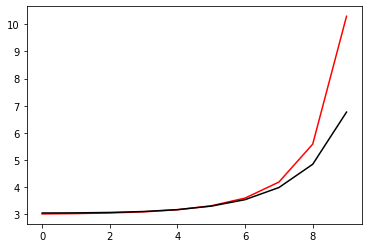

194700 0.023781308783025784
[3.02633073 3.03482754 3.05607058 3.09780357 3.17527982 3.31659835
 3.57466835 4.05903677 5.01598405 6.95461413]


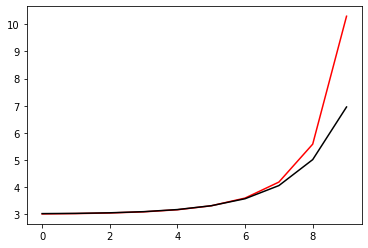

195800 0.013820344775968336
[3.02782589 3.03884558 3.06527199 3.11416907 3.19826402 3.34053961
 3.59042941 4.0608915  5.02209849 6.95732138]


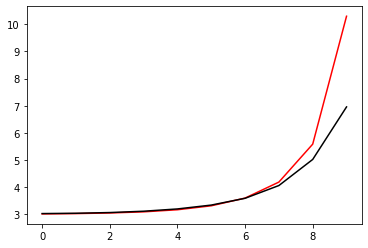

196900 0.05307892159330767
[2.95046099 2.94003604 2.93476577 2.94924048 2.99887292 3.10638741
 3.30168869 3.60324646 4.39029699 6.53248467]


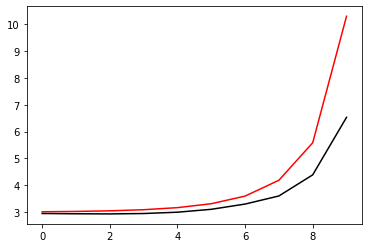

198000 0.032609748392116916
[2.95270523 2.95569611 2.9637099  2.98665862 3.04077226 3.14959937
 3.34750861 3.69336533 4.49717271 6.62288199]


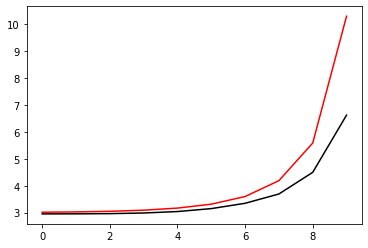

199100 0.03359451210502014
[2.99337884 2.99749525 3.01089545 3.04146925 3.1025593  3.21736093
 3.42800137 3.82169843 4.66505459 6.74059891]


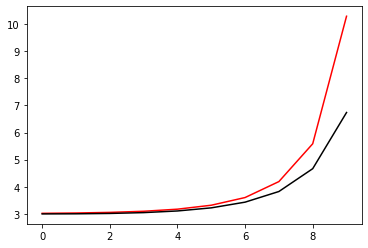

200200 0.022905344024519003
[3.01378932 3.0186472  3.03208589 3.05954331 3.11082422 3.2043337
 3.37764936 3.71910983 4.48285505 6.60711807]


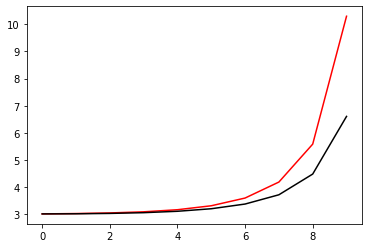

201300 0.02330340718402132
[2.9864631  2.98858863 2.99823014 3.02432964 3.07984127 3.18781098
 3.39433513 3.80132624 4.66167249 6.73138627]


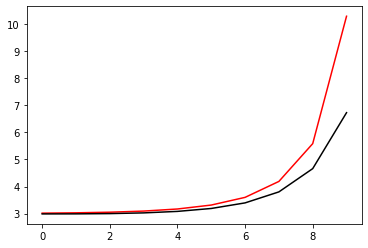

202400 0.03839675629143233
[2.97964594 2.98894249 3.01206358 3.05538649 3.13108722 3.26287235
 3.49793294 3.93752673 4.82739607 6.77429445]


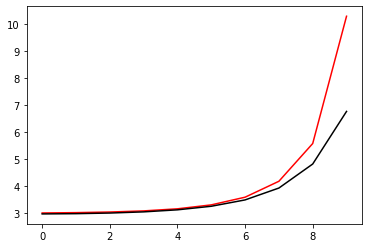

203500 0.04643038603289992
[2.98174643 2.99159193 3.01418908 3.05894214 3.14170964 3.29062414
 3.55900312 4.05670056 5.03214569 6.96930716]


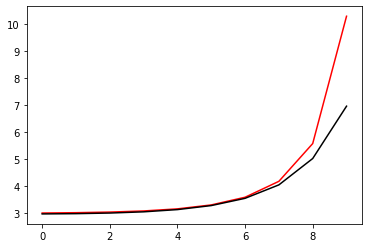

204600 0.014133505154907324
[3.02611033 3.04057799 3.07464538 3.13171836 3.226161   3.38471312
 3.65908982 4.15873325 5.13651437 7.04527017]


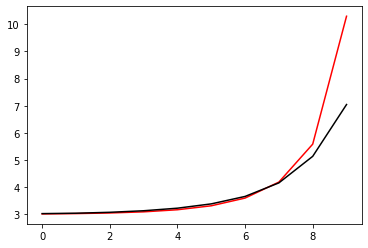

205700 0.016024393990825704
[2.96380414 2.94312492 2.93178996 2.94135526 2.98699743 3.09066747
 3.28091428 3.5857574  4.36432435 6.5292814 ]


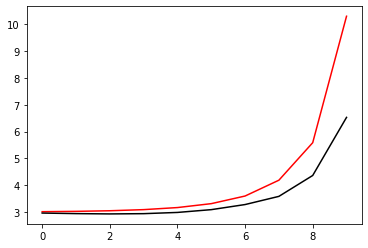

206800 0.02004442075163467
[2.94393669 2.94249385 2.94526439 2.96381562 3.01485427 3.1216841
 3.31820748 3.66411676 4.4642482  6.59178296]


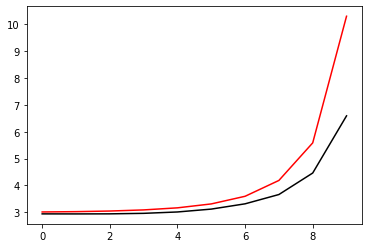

207900 0.043483811497439455
[3.03847841 3.04246192 3.05428303 3.08180394 3.1378495  3.24491984
 3.44334172 3.81660956 4.63018152 6.72429744]


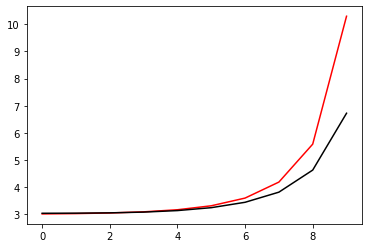

209000 0.053625634299570804
[2.88882804 2.90046369 2.92180971 2.95776597 3.01825224 3.12207339
 3.30772608 3.66466462 4.44521426 6.62893657]


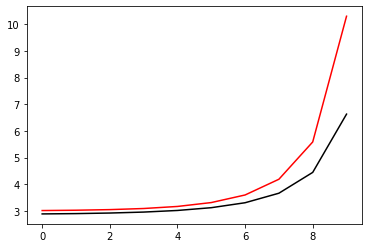

210100 0.03398292202524054
[2.9993805  3.00238946 3.01959645 3.05756254 3.12755659 3.25143295
 3.4729022  3.88624185 4.73083276 6.75515003]


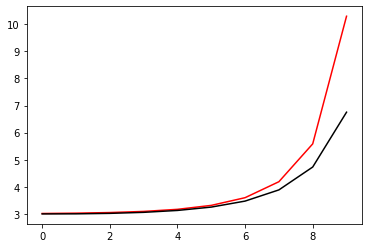

211200 0.02236422472984857
[2.96792944 2.97117737 2.98452619 3.01852672 3.08818653 3.21996736
 3.46565167 3.93430327 4.87378649 6.82354016]


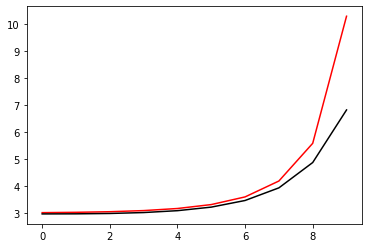

212300 0.023826779935165406
[2.92513952 2.93197229 2.94963047 2.98780301 3.06057243 3.19519422
 3.44408753 3.92426057 4.90412426 6.94629872]


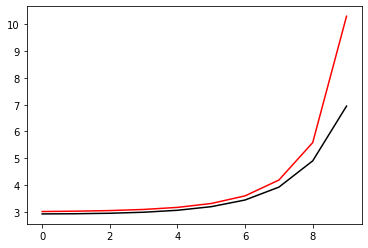

213400 0.039247534021337384
[2.99621649 2.98573613 2.98388725 3.00548669 3.06513924 3.18705614
 3.41761499 3.85628505 4.75032913 6.752877  ]


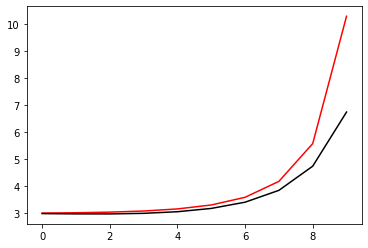

214500 0.04619671516835557
[2.98563307 2.98571824 2.99230073 3.01687895 3.07805237 3.20519432
 3.45014932 3.91863363 4.86013718 6.83768465]


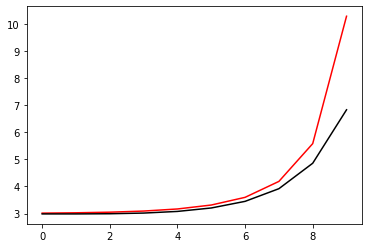

215600 0.015057135086176288
[3.11334954 3.10897253 3.11497905 3.14001353 3.20011859 3.32460424
 3.56908431 4.04740133 5.01598494 6.84752163]


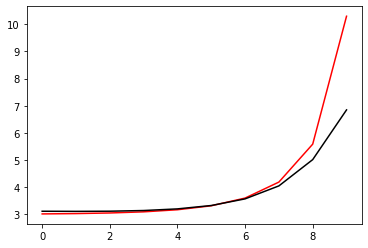

216700 0.023630046983081625
[3.04129525 3.0477836  3.06529219 3.10227816 3.17278927 3.30286614
 3.54471991 4.0111366  4.96498491 6.93486548]


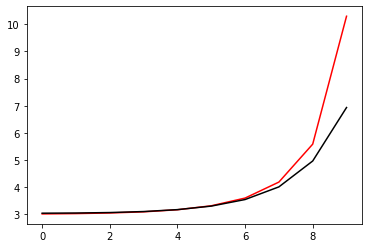

217800 0.013709371377865685
[3.06375026 3.07224735 3.0931944  3.13391982 3.20818556 3.34223925
 3.58848567 4.06119113 5.0284474  6.92542871]


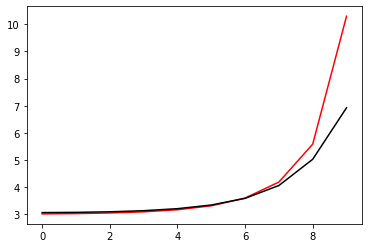

218900 0.042561815043807225
[3.07276597 3.0812681  3.10096025 3.13685227 3.19909064 3.30807503
 3.50617962 3.89167097 4.72762274 6.75710783]


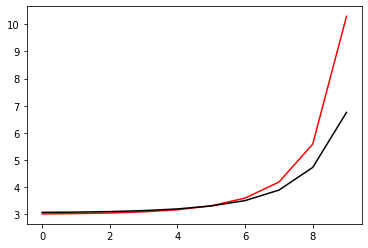

220000 0.02503587985274475
[2.97999352 2.98372671 3.00219332 3.04304718 3.12040117 3.26111547
 3.51954039 4.0110906  4.99490272 6.8721068 ]


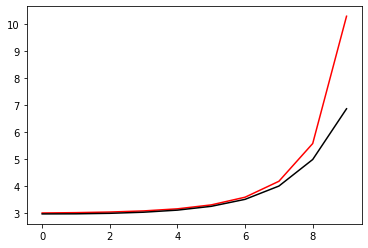

221100 0.033135444869455535
[2.92894957 2.93634655 2.95169612 2.99217339 3.07190029 3.21929758
 3.48982695 4.00376826 5.01608255 6.99234146]


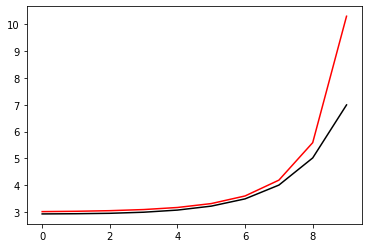

222200 0.023295508696531193
[2.99375018 3.02100491 3.0605701  3.1157605  3.20052456 3.33044129
 3.48718042 3.5240108  4.34377227 6.51844581]


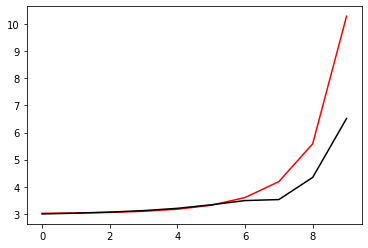

223300 0.023205996668910416
[2.98832489 3.00268562 3.03461673 3.08726596 3.16747655 3.28417844
 3.44704269 3.72720761 4.42650519 6.57132908]


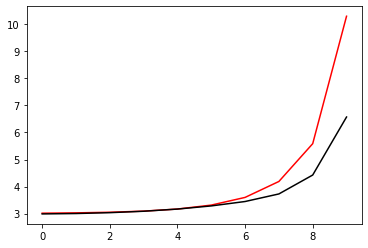

224400 0.039042375755848645
[2.97871333 2.98818781 3.0120931  3.057566   3.13473325 3.26205384
 3.48377987 3.90226517 4.63559275 6.64200256]


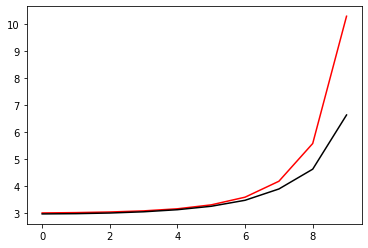

225500 0.04574605499475791
[2.97127524 2.97978409 3.00164951 3.04534117 3.12590199 3.27210055
 3.54632807 4.05685953 4.88974301 6.88104698]


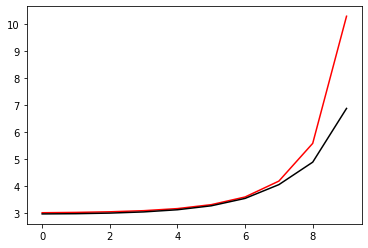

226600 0.013894246643289244
[3.06626682 3.07336726 3.09398065 3.1371542  3.21874262 3.36627595
 3.62933543 4.10037838 4.98433367 6.90016355]


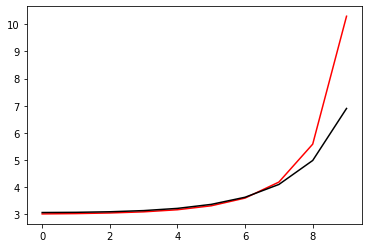

227700 0.015617666912657912
[2.94725106 2.93806217 2.93404254 2.94978751 3.00004661 3.10784148
 3.31557648 3.71021744 4.51431306 6.61878609]


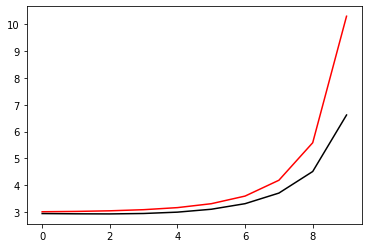

228800 0.013435706828859608
[2.98331025 2.9862016  2.99717628 3.02491925 3.08433453 3.20074631
 3.41971948 3.83443485 4.67534802 6.72101631]


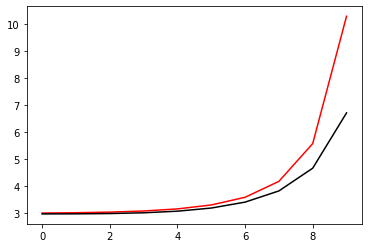

229900 0.04340285254950016
[3.05720494 3.06091785 3.07329698 3.10357867 3.16575248 3.28421538
 3.50647111 3.9329369  4.80480055 6.89149162]


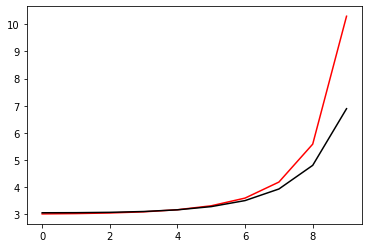

231000 0.028447087309062563
[2.95997807 2.96789694 2.98380757 3.01733512 3.08223879 3.20347759
 3.43060668 3.87203516 4.78547172 6.9236077 ]


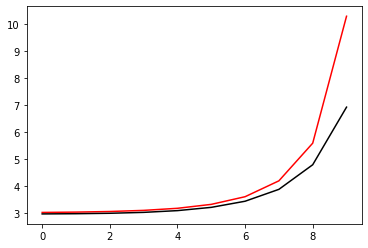

232100 0.03291670099573335
[2.94458433 2.95116741 2.96513447 2.99330103 3.04873031 3.15483593
 3.35605007 3.74930858 4.60724318 6.70749756]


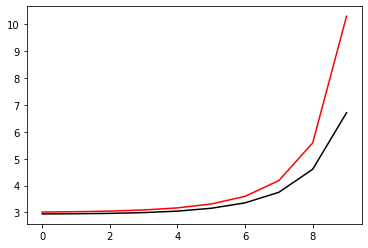

233200 0.022666471564211983
[2.96794876 2.97474761 2.99425802 3.03494328 3.10973393 3.24293524
 3.48415918 3.94179123 4.86575457 6.82603016]


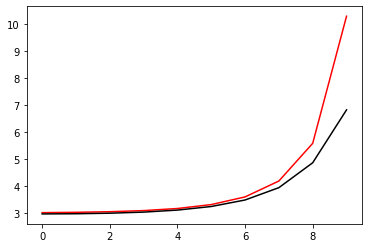

234300 0.023692635808642424
[2.96945456 2.98039186 3.00664321 3.0547692  3.13618304 3.2733309
 3.51203108 3.95368071 4.84945597 6.84498764]


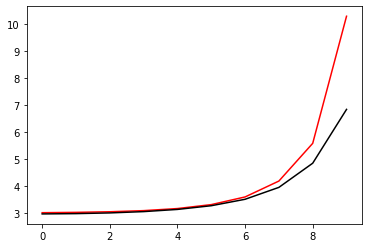

235400 0.070461779710393
[3.13927913 3.14980627 3.1716268  3.21408227 3.28987352 3.42087954
 3.64883574 4.06221409 4.89845862 6.73625945]


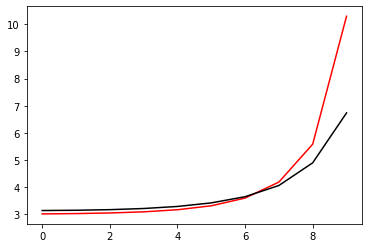

236500 0.046072116083969314
[2.96835783 2.97679953 2.99926548 3.04282573 3.11977291 3.2529983
 3.48727624 3.91712758 4.77574464 6.76338676]


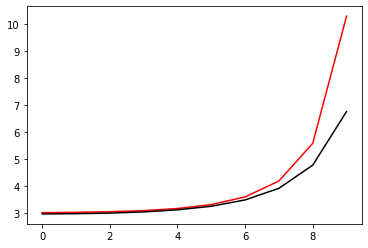

237600 0.013960631270957655
[3.01016701 3.02189648 3.04821867 3.09634058 3.18217292 3.33357275
 3.60229191 4.09390304 5.04474211 6.96589082]


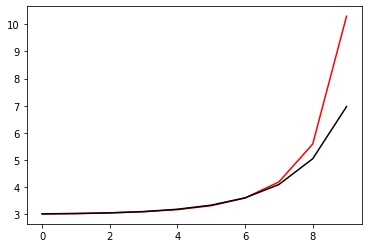

238700 0.0239658801984461
[3.03578376 3.04869306 3.07886828 3.13407311 3.22516292 3.3772975
 3.64074774 4.12506623 5.08448947 6.98690498]


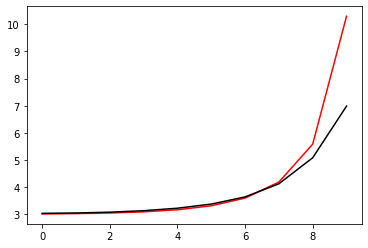

239800 0.021948729523305337
[2.95578127 2.94038931 2.9296729  2.939586   2.98538506 3.08857893
 3.27651102 3.57508232 4.37855543 6.53992763]


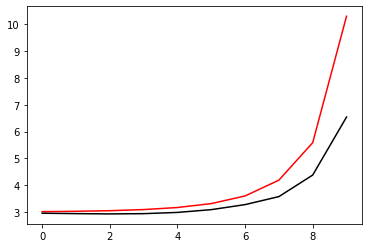

240900 0.051065265559564116
[2.94984917 2.9538284  2.9621848  2.98482218 3.03769986 3.1445332
 3.3414928  3.69986534 4.52579164 6.60653957]


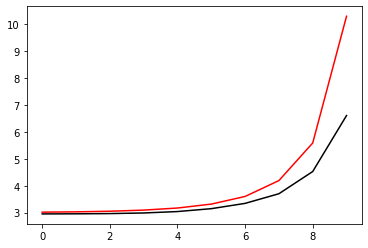

242000 0.02737837450518155
[3.03683582 3.04113335 3.05561806 3.08775638 3.15008849 3.26525038
 3.47717638 3.88083947 4.73954043 6.71382853]


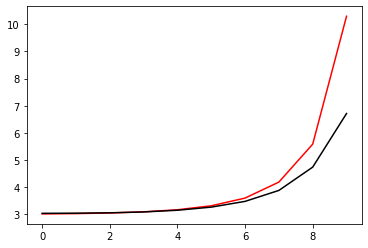

243100 0.0336426706777892
[2.96809616 2.97544608 2.99525981 3.03645426 3.11225576 3.24742259
 3.49143275 3.95121493 4.88253109 6.91491438]


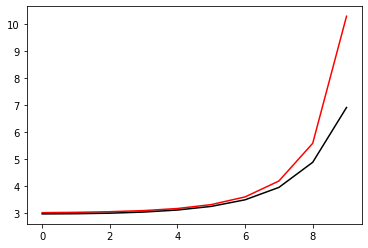

244200 0.02242929880323702
[2.97034127 2.9771495  2.99458267 3.02850843 3.08929636 3.19598218
 3.38916445 3.767235   4.59817737 6.66229113]


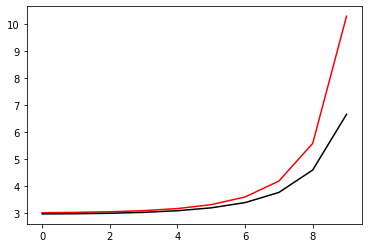

245300 0.02358761229134468
[2.9591325  2.96500012 2.98136169 3.01715869 3.08653855 3.2137885
 3.44737056 3.89447349 4.80896958 6.8307005 ]


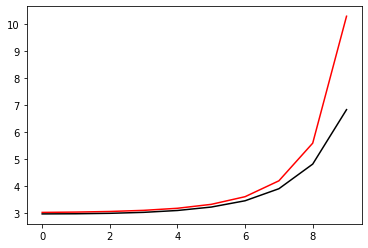

246400 0.03763451755950562
[2.98130915 2.98642939 3.00355942 3.04266906 3.12113925 3.26757602
 3.53727253 4.0357366  5.01410001 6.81013377]


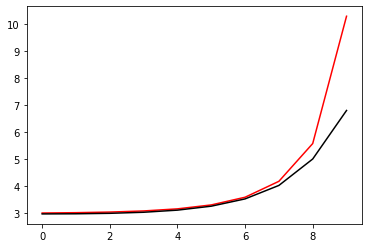

247500 0.04556781654159614
[2.96235066 2.97211101 2.99712387 3.04529325 3.13002107 3.27649975
 3.53498282 4.01009841 4.93793064 6.86558155]


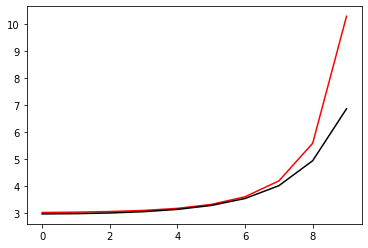

248600 0.01433286746852816
[3.03677295 3.05993494 3.10644167 3.18004119 3.29033781 3.45783325
 3.72408644 4.17845445 5.04599172 6.91078378]


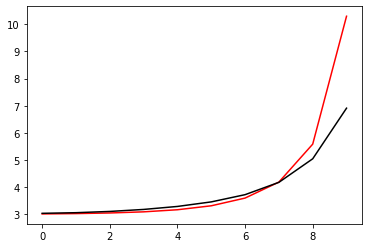

249700 0.02341176897086236
[3.06210044 3.06432435 3.0789362  3.11742689 3.19260951 3.32428172
 3.55150771 3.96191202 4.78467898 6.80116311]


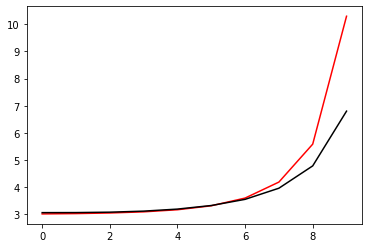

250800 0.013581908499217631
[3.03892873 3.04275196 3.05665399 3.09140067 3.16269218 3.29648823
 3.54064546 3.99457563 4.89570255 6.84739851]


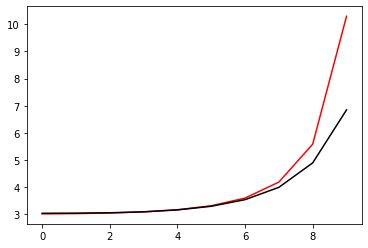

251900 0.0687550577667725
[3.13675943 3.1457143  3.16432534 3.19989606 3.26584499 3.38533567
 3.60302405 4.01455715 4.86139627 6.79770804]


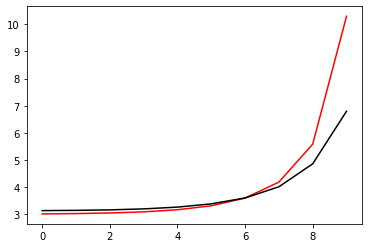

253000 0.02850708493700477
[3.04370794 3.05034651 3.0706135  3.11052753 3.18199647 3.30797402
 3.53438452 3.96153313 4.8389851  6.80370002]


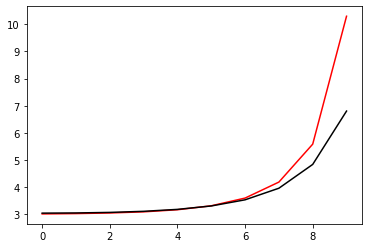

254100 0.03386125179780135
[2.9865405  2.9895523  3.00348555 3.03822475 3.10921135 3.24448539
 3.49868291 3.98786558 4.97384801 6.973599  ]


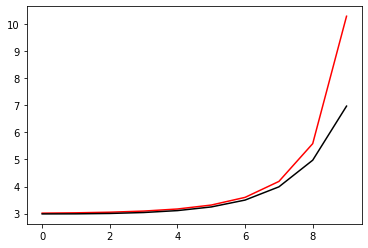

255200 0.02304154139975229
[2.94518012 2.97079066 3.01668708 3.08121777 3.17379744 3.31493659
 3.54050188 3.91949531 4.66703759 6.72246671]


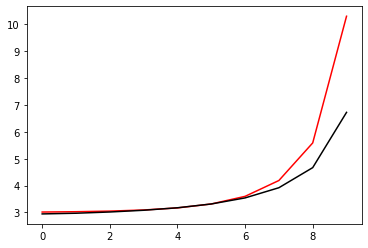

256300 0.02367191844115818
[2.96603975 2.97744719 3.00561247 3.05789163 3.14493688 3.28611137
 3.521591   3.94514191 4.79073365 6.80547541]


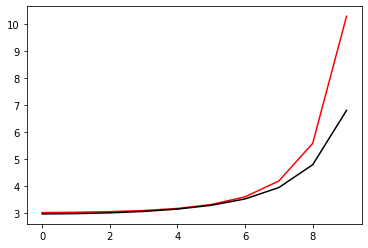

257400 0.036813707926797494
[2.93716213 2.94603285 2.96873856 3.01505676 3.10185531 3.25911509
 3.54704289 4.08256554 5.08087649 6.86956237]


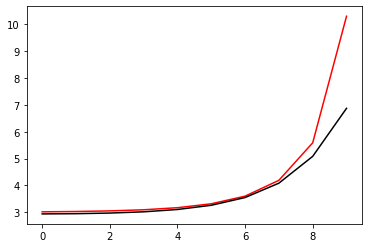

258500 0.05238036463258788
[3.00528713 3.02206633 3.05610278 3.11590793 3.21926842 3.39857395
 3.71115044 4.25347748 5.24975916 7.07736131]


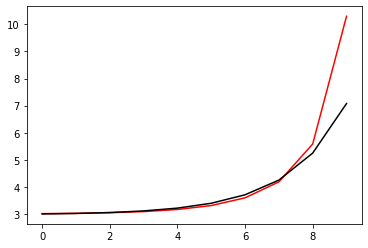

259600 0.05128954590029422
[3.12422221 3.12788774 3.14971411 3.19952264 3.29792109 3.480609
 3.80620049 4.37478129 5.41015953 7.10075133]


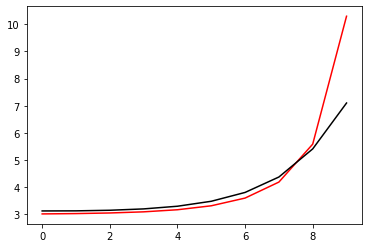

260700 0.023916060364902778
[2.95406039 2.9749943  3.01416441 3.08033844 3.18366605 3.35129202
 3.63687636 4.1556001  5.16879445 7.07456696]


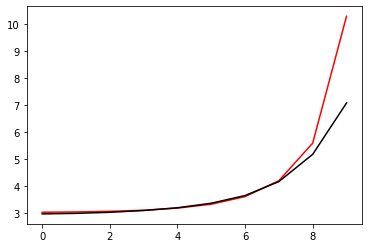

261800 0.047260286726109116
[2.85396662 2.86061774 2.87900031 2.91919851 2.99582741 3.13696166
 3.3955412  3.88434458 4.86136936 6.86645516]


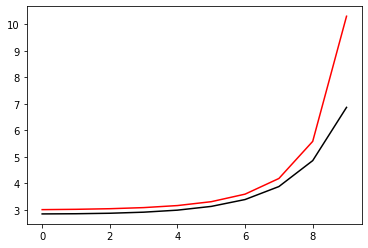

262900 0.043785338702241126
[3.03022156 3.03959103 3.06238142 3.10584672 3.18317329 3.31976594
 3.56786346 4.04231805 5.01302464 6.94771175]


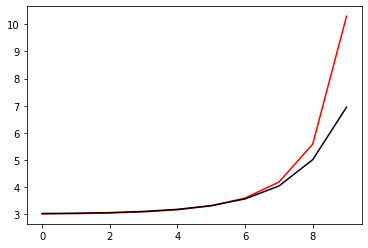

264000 0.12375783596148007
[2.78647042 2.78895136 2.80615197 2.84632816 2.9211125  3.05464563
 3.29436076 3.75190092 4.70205094 7.00856146]


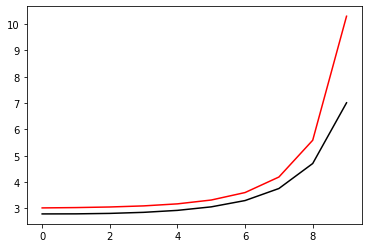

265100 0.03364800402120664
[2.98554861 2.98915089 3.00416766 3.03893672 3.10683512 3.23237814
 3.46359774 3.9039523  4.80570997 6.80407741]


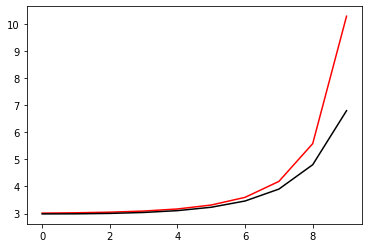

266200 0.0206088998181692
[2.91111496 2.90167594 2.90004461 2.91738331 2.96687426 3.07186781
 3.27878941 3.69050418 4.56427842 6.64911222]


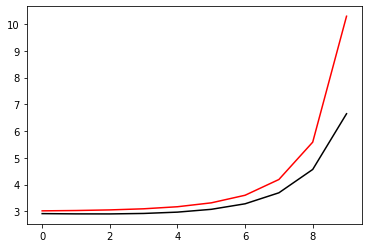

267300 0.02298943368547813
[2.98010596 2.977477   2.9745461  2.97927174 3.00591344 3.07710002
 3.23469312 3.57304968 4.35060997 6.52320233]


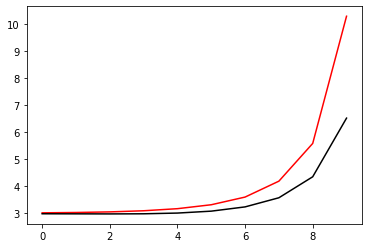

268400 0.03978291264861841
[3.00104999 3.00325289 3.01173331 3.0344261  3.08467238 3.18720131
 3.39101471 3.80099787 4.67197704 6.66839451]


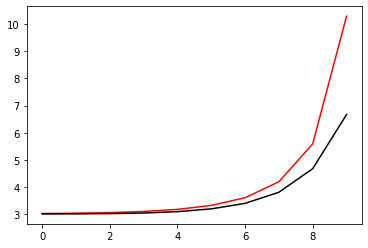

269500 0.04801582726036625
[3.00131737 3.01045174 3.02942935 3.06640597 3.1361078  3.26487531
 3.50379382 3.96068364 4.8908552  6.84462229]


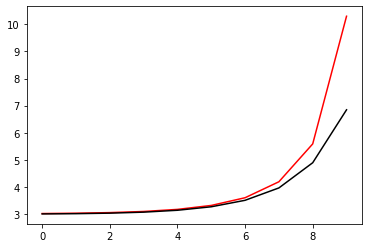

270600 0.013871361115406317
[3.01591662 3.02729904 3.05386587 3.10117633 3.18373876 3.32806927
 3.58555092 4.06513243 5.0217406  6.95265322]


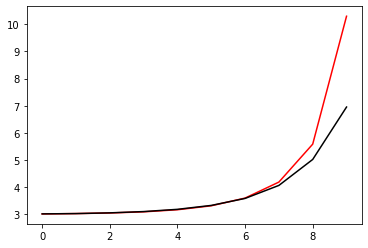

271700 0.023691785944323578
[3.03942808 3.04073768 3.04797093 3.07575345 3.1423905  3.27561804
 3.52734273 4.01399332 5.01437252 6.94311878]


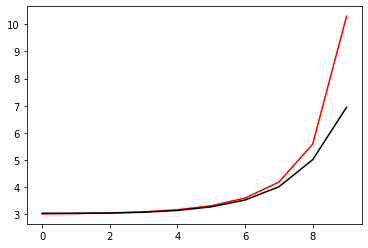

272800 0.022364775914199404
[2.95934263 2.94362623 2.9304649  2.93379826 2.96813207 3.05681804
 3.23538384 3.54326835 4.34385122 6.52030052]


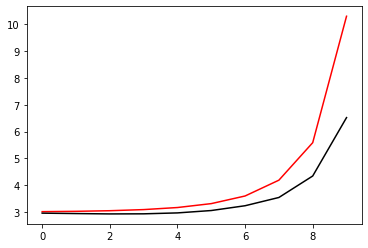

273900 0.05300347550608633
[2.95592357 2.95526817 2.95709936 2.97052534 3.01076588 3.10188465
 3.28331597 3.63257665 4.449803   6.56772648]


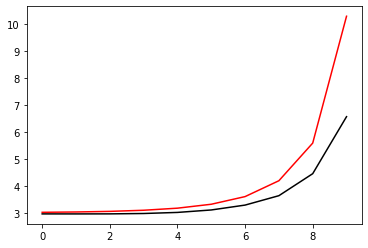

275000 0.02615693426782454
[3.02066923 3.02312519 3.03282773 3.05674764 3.10756678 3.20817414
 3.40343092 3.7914181  4.64219342 6.67676131]


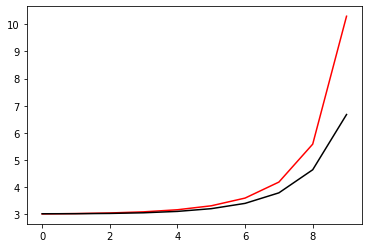

276100 0.0328963566673668
[2.97178429 2.96031836 2.9547802  2.96521628 3.00389176 3.09311576
 3.27822372 3.66252041 4.51157874 6.52950006]


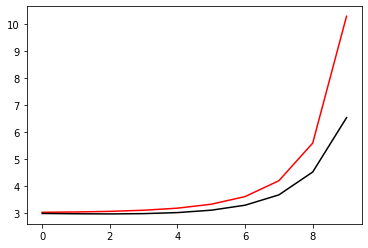

277200 0.021861583536640715
[2.96871568 2.96972258 2.97694473 2.99778378 3.04510664 3.14303072
 3.3395475  3.74064537 4.61410721 6.69773989]


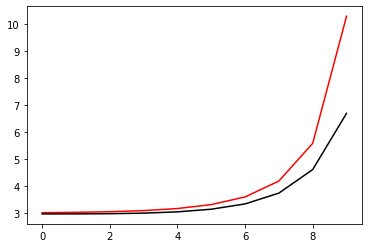

278300 0.023510341935626313
[2.95934191 2.96535084 2.98132479 3.01496577 3.07981109 3.19985947
 3.4234934  3.85895929 4.77215671 6.81936891]


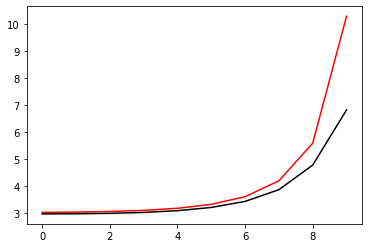

279400 0.08480183260678645
[2.86742228 2.85136741 2.84732302 2.86200413 2.90787964 3.00419909
 3.18407177 3.53564551 4.36770957 6.73847684]


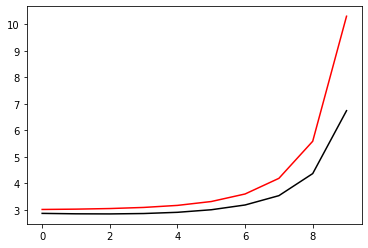

280500 0.053185891326578576
[2.95368083 2.9537849  2.95726457 2.97324716 3.01644775 3.10900953
 3.29039543 3.65240539 4.47819999 6.6212513 ]


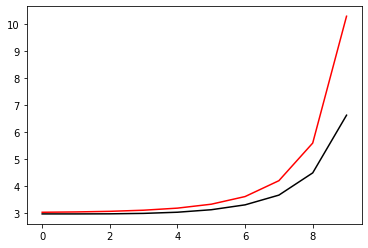

281600 0.013447415281603528
[3.0380064  3.04664936 3.06840623 3.10773449 3.17574453 3.29492542
 3.51086533 3.92407849 4.7998887  6.76035374]


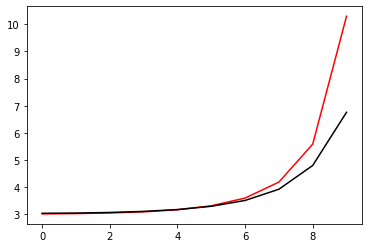

282700 0.023607773047431863
[3.02322157 3.03243351 3.05535088 3.09885088 3.1752903  3.30859963
 3.54638774 3.99327108 4.90707413 6.86993038]


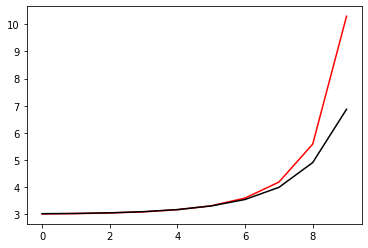

283800 0.013731061279030562
[3.03474455 3.04451623 3.06889776 3.115084   3.1962217  3.33563521
 3.58175878 4.04299192 4.97715881 6.92517924]


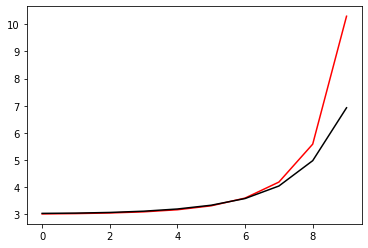

284900 0.08272165649039145
[2.87864834 2.87205098 2.87970901 2.91369696 2.98985705 3.13844052
 3.4102584  3.90865083 4.87644679 6.82166183]


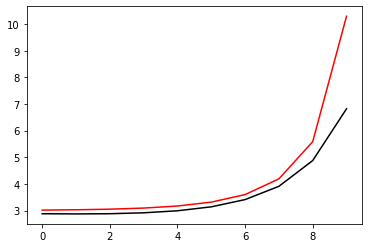

286000 0.026276065244124437
[3.04413276 3.03827551 3.03494667 3.04882217 3.10045554 3.22022017
 3.46123008 3.93040253 4.87436398 6.8345034 ]


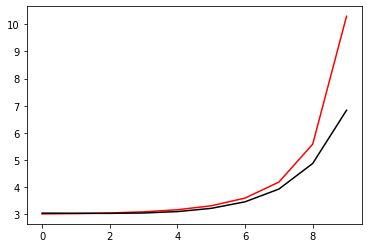

287100 0.03385404961812667
[3.00067571 3.00014559 3.00621013 3.02924689 3.0872419  3.21191586
 3.46215774 3.95556722 4.94826793 6.92271304]


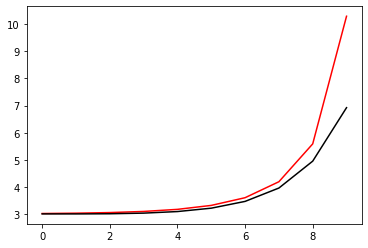

288200 0.02258163744941951
[2.97188735 2.97603561 2.98965855 3.02249794 3.09010175 3.22142516
 3.47432723 3.97144176 4.98454957 6.91311598]


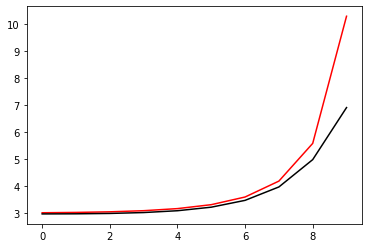

289300 0.02390552006019718
[2.92514727 2.93260066 2.95188084 2.99149041 3.06591853 3.20303382
 3.45742602 3.94992022 4.95862636 6.98721391]


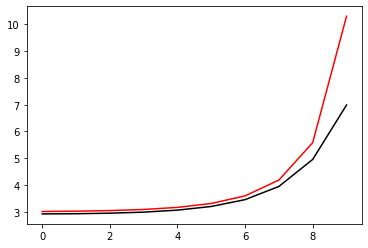

290400 0.03650448272505463
[2.94190444 2.95213516 2.97490469 3.02244085 3.11940345 3.29259631
 3.60290501 4.16185986 5.21733798 6.98089217]


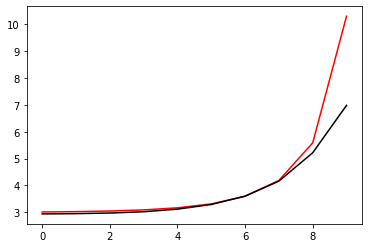

291500 0.05323611015377782
[2.98914975 2.96883757 2.95704557 2.96506684 3.01383905 3.12495047
 3.32735848 3.58360848 4.34358903 6.50762473]


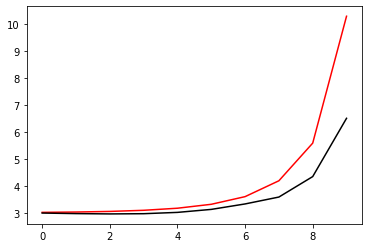

292600 0.013139865884639196
[3.07696093 3.06872034 3.06439846 3.07589959 3.12174671 3.22716652
 3.42249042 3.73736577 4.50956113 6.60840115]


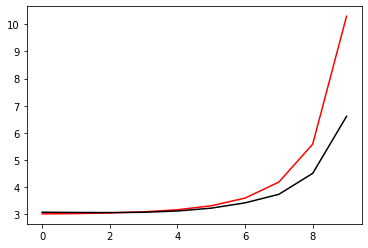

293700 0.02314133059342793
[3.0672688  3.06498775 3.06843403 3.08765674 3.13751187 3.24309355
 3.44538189 3.82049933 4.63518508 6.79302   ]


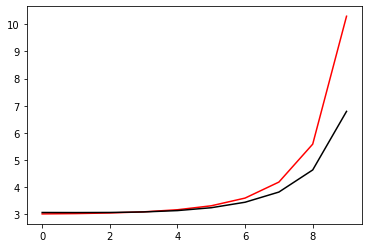

294800 0.013349345565577243
[3.04531372 3.05103928 3.06623759 3.09835811 3.16016044 3.27541534
 3.49094504 3.90612831 4.77028888 6.77563535]


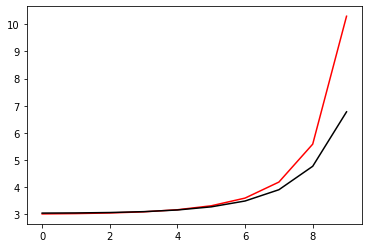

295900 0.042733535014004086
[3.06768161 3.07462546 3.09403794 3.13274664 3.20266774 3.32630389
 3.55006672 3.97893733 4.86964594 6.84686619]


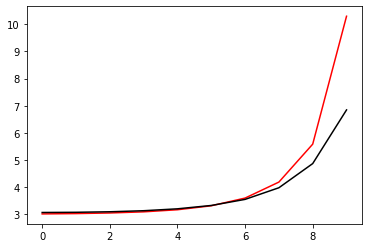

297000 0.027365314332158355
[3.06336145 3.04472476 3.0236506  3.01921176 3.04783643 3.1328088
 3.31353827 3.68248744 4.53429577 6.61710863]


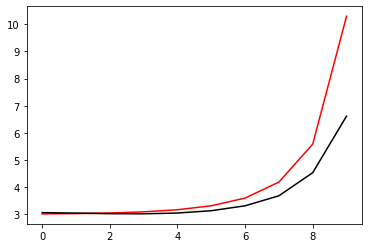

298100 0.03981596340475632
[2.84623458 2.847892   2.85143758 2.86525943 2.90538823 2.99892528
 3.1960247  3.6037186  4.5001789  6.5318373 ]


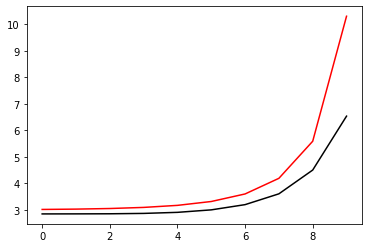

299200 0.023059204606004708
[3.0231212  3.02160129 3.02569208 3.04389718 3.08931882 3.18689724
 3.38652253 3.79562588 4.67489709 6.7344774 ]


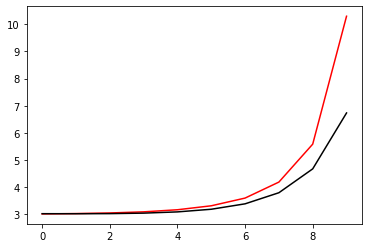

300300 0.02347649360468067
[2.97977801 2.98196568 2.9906834  3.01503771 3.06990994 3.18180732
 3.40374586 3.85184321 4.7976424  6.82921104]


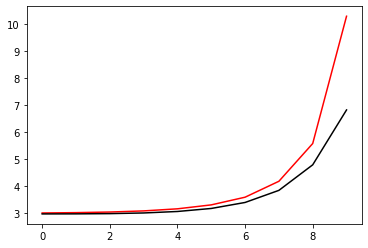

301400 0.037059593993802174
[2.94803222 2.95877955 2.9825965  3.0284183  3.11271211 3.26515652
 3.54091988 4.04897803 5.04806507 6.80938936]


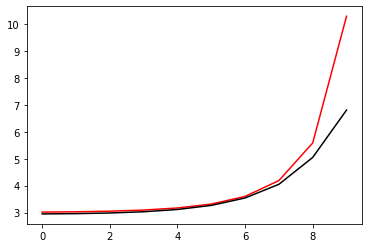

302500 0.04685236372468794
[2.97557281 2.98810478 3.01701664 3.07192014 3.169244   3.34495792
 3.65212525 4.20110061 5.22958974 7.08906533]


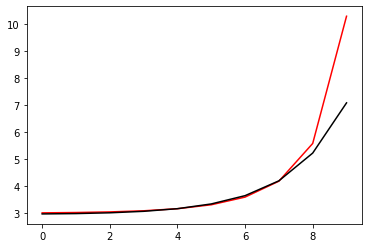

303600 0.013204701569336395
[3.03892471 3.04119193 3.05212475 3.07900355 3.13175378 3.22783946
 3.40253906 3.74355798 4.51858808 6.62372891]


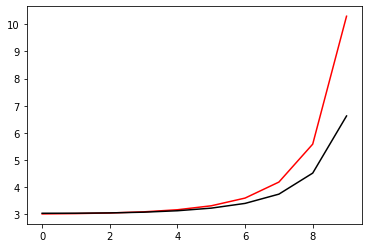

304700 0.02343292674471234
[3.0851737  3.08782433 3.09970127 3.1303126  3.19309287 3.31351456
 3.54099381 3.97214128 4.80567455 6.85203056]


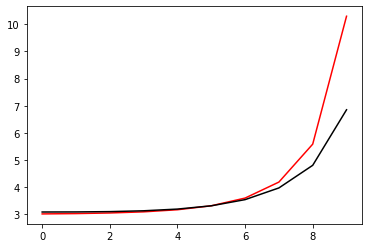

305800 0.013310964635229341
[3.07766033 3.0871547  3.10871835 3.14760529 3.2149333  3.33196295
 3.54027468 3.93004267 4.73564271 6.76604134]


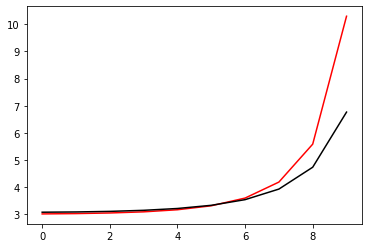

306900 0.04349407239735305
[3.03036703 3.04089319 3.06526302 3.1090627  3.18269238 3.30654794
 3.52241564 3.92458307 4.75695511 6.77771259]


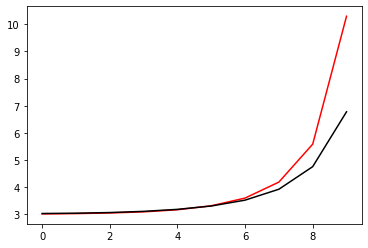

308000 0.02502714839942214
[2.98500334 2.98769342 3.0054595  3.04613929 3.1239032  3.2650428
 3.52138615 3.99972648 4.94274276 6.82301642]


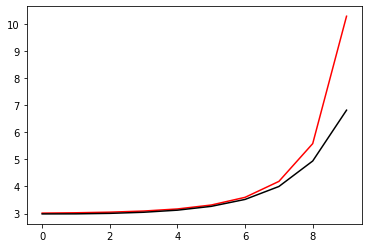

309100 0.03307727292890336
[2.92584672 2.93376685 2.94961979 2.99111404 3.072402   3.22203726
 3.49511015 4.00849792 5.00945224 6.98747223]


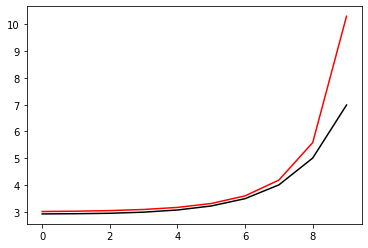

310200 0.21081893404967322
[3.23456666 3.23247775 3.23902348 3.26273879 3.32699455 3.45654549
 3.68939639 4.07734424 4.96714443 6.93198235]


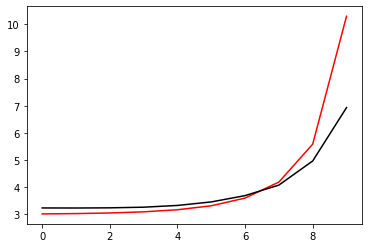

311300 0.023289376340046988
[2.94994426 2.9405065  2.93171163 2.93837137 2.979208   3.07921695
 3.27556556 3.63244686 4.46425487 6.59725704]


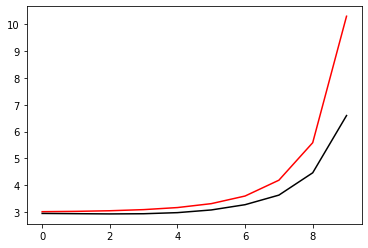

312400 0.04234803776743988
[2.94771095 2.95075549 2.95852878 2.97959834 3.03051138 3.13793841
 3.34516992 3.73644987 4.59592784 6.64190317]


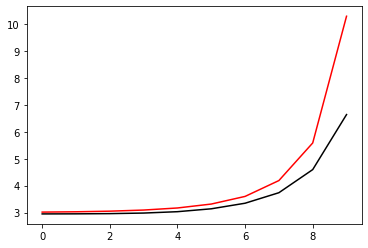

313500 0.04632952363720658
[2.97881425 2.98536922 3.00243798 3.03675232 3.10145563 3.22168612
 3.44569209 3.87415335 4.7729764  6.80228962]


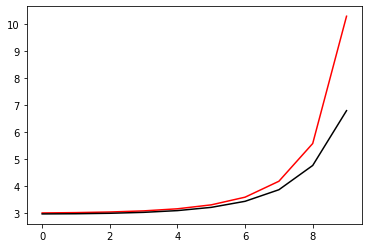

314600 0.013461058543604543
[3.03757924 3.03791913 3.04584851 3.07176385 3.12988871 3.24504149
 3.46643643 3.90104447 4.81041402 6.7876628 ]


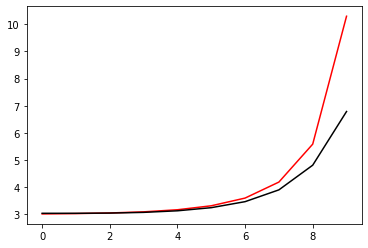

315700 0.02358090181964019
[3.06581664 3.07243169 3.09004882 3.12652346 3.1955797  3.32333634
 3.5609649  4.01829115 4.95491353 6.93394498]


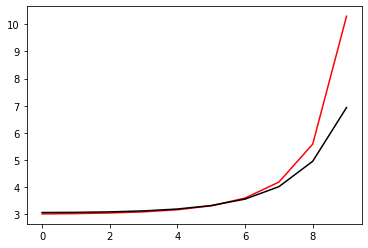

316800 0.013012341892487189
[3.06800923 3.08390618 3.11384466 3.15883204 3.22682903 3.33221636
 3.49193354 3.73456666 4.26989749 6.47491482]


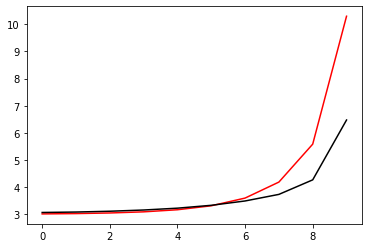

317900 0.04322869773343031
[3.04518371 3.05547929 3.07945197 3.12148381 3.18882312 3.29555911
 3.47066715 3.77823174 4.4154426  6.58283614]


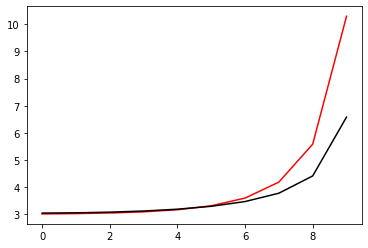

319000 0.11276198461338781
[2.80361781 2.8158234  2.83808984 2.87822789 2.94847385 3.07105408
 3.28863663 3.69154193 4.50444053 6.80376148]


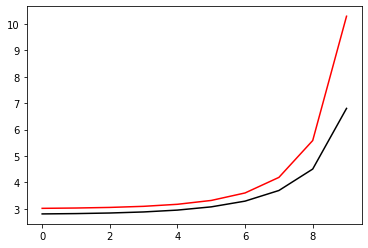

320100 0.0388121839699833
[2.84722135 2.85535169 2.87422087 2.90967694 2.97256541 3.08261999
 3.2784637  3.64519376 4.41135609 6.51515855]


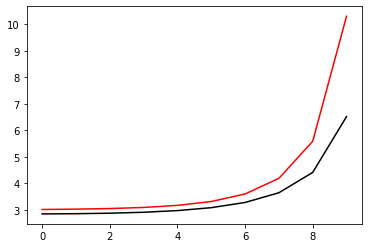

321200 0.023040697791862665
[3.00762451 3.00982948 3.02206745 3.05226667 3.11224811 3.22380458
 3.43028396 3.82569616 4.63516223 6.71343902]


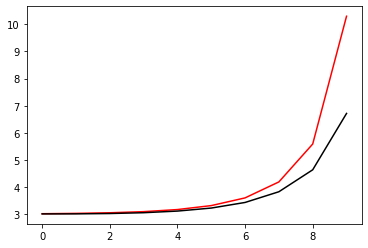

322300 0.02348390859728816
[2.98226638 2.98567829 2.99744963 3.02672451 3.0877735  3.20580368
 3.43061061 3.87131851 4.79141516 6.83038121]


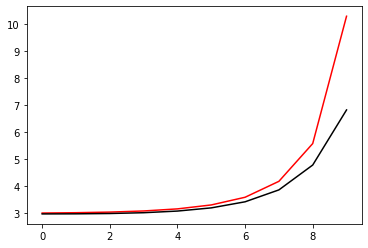

323400 0.03706011575424225
[2.9504141  2.95723547 2.97603137 3.01645461 3.09563768 3.24419889
 3.52105924 4.04543063 5.07277052 6.86723152]


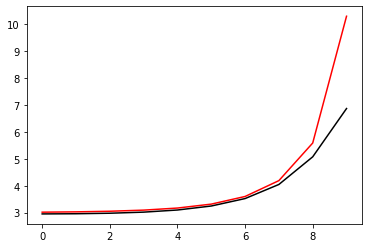

324500 0.05146610870881284
[2.92817216 2.92906061 2.94269117 2.98015114 3.05978203 3.21545713
 3.51176625 4.0753041  5.13750108 7.02020712]


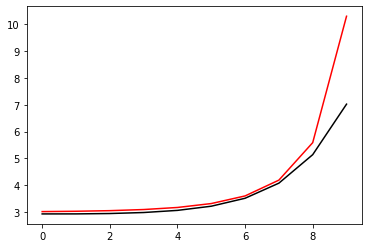

325600 0.03315833023498543
[2.97115961 2.94868443 2.93685848 2.94490347 2.98877762 3.09406007
 3.29515484 3.5678928  4.37594571 6.52738943]


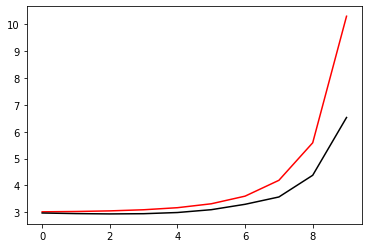

326700 0.015780141162063728
[2.9335115  2.9303674  2.93092426 2.9475294  2.99784715 3.10702122
 3.30912626 3.6410192  4.46722611 6.58798654]


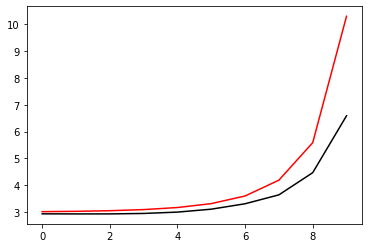

327800 0.013210197693041171
[3.02914134 3.03186867 3.04244283 3.06896406 3.12487736 3.23363777
 3.43485875 3.80625295 4.63844247 6.65998118]


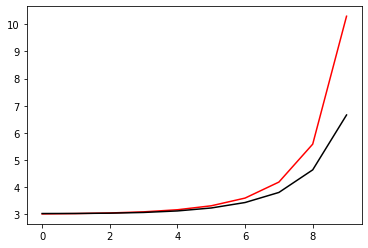

328900 0.0654620793428237
[2.86317307 2.88969325 2.93042959 2.9897815  3.08086432 3.22775364
 3.47707331 3.92845642 4.84315347 6.78553592]


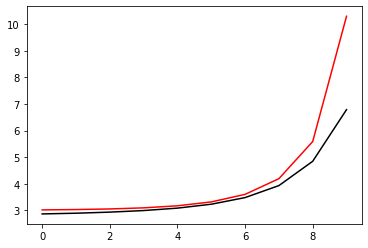

330000 0.029344139167817536
[3.05725232 3.06116108 3.07532041 3.10590888 3.1633999  3.26721139
 3.45747342 3.82856741 4.64839296 6.68946434]


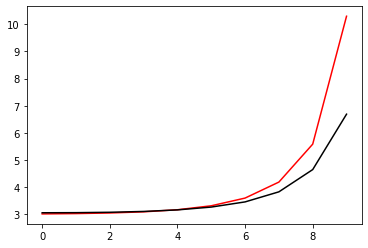

331100 0.033614881105389745
[2.99206967 2.99157891 3.00034437 3.02776864 3.08857618 3.20917156
 3.44095957 3.89350663 4.82375511 6.86884492]


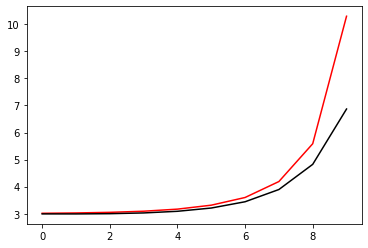

332200 0.020962921085322953
[2.94763438 2.95130514 2.964868   2.99923356 3.07048559 3.20671303
 3.46421957 3.96272362 4.96404885 6.85170547]


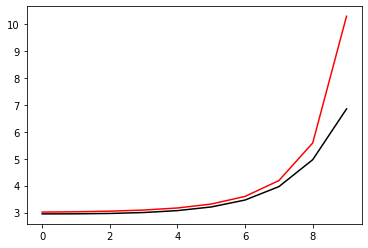

333300 0.06733397132691628
[3.18661648 3.18426119 3.19410773 3.22338434 3.28765857 3.41042953
 3.62943436 4.03069229 4.9323219  6.98889855]


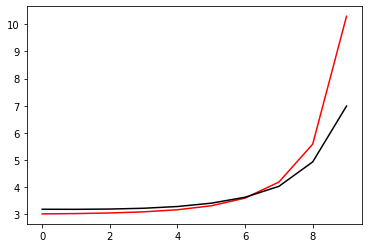

334400 0.038173297809375964
[2.97002065 2.97689918 2.99226476 3.02533418 3.09199388 3.2197324
 3.46155061 3.92797828 4.88095365 6.73909815]


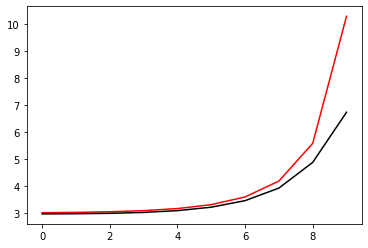

335500 0.05063517460301595
[3.00149025 3.01680847 3.04769053 3.10152749 3.19402675 3.35321228
 3.63141503 4.13480552 5.11306943 7.01883787]


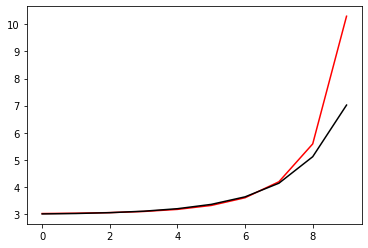

336600 0.04206732752772969
[3.12337259 3.12834589 3.14863279 3.19177476 3.27839879 3.43950559
 3.72724801 4.24174548 5.23204978 7.02366482]


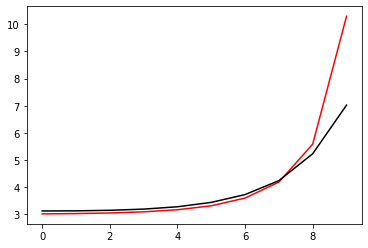

337700 0.10614725868473354
[2.76222013 2.75846495 2.76275844 2.78624311 2.85008091 2.98293854
 3.23786681 3.72465085 4.79375788 6.99159847]


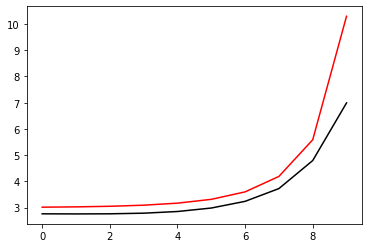

338800 0.013360328945033358
[3.02898714 3.03579124 3.05475005 3.09330001 3.16342904 3.28793776
 3.51096961 3.91730813 4.68136591 6.73275403]


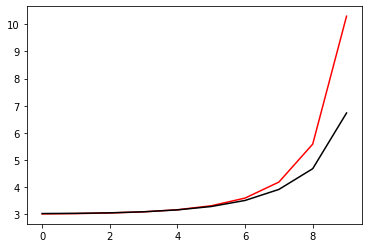

339900 0.04967100137299865
[3.11110309 3.11517364 3.13077526 3.16732948 3.2408829  3.3791432
 3.63110278 4.08098084 4.9126048  6.87496859]


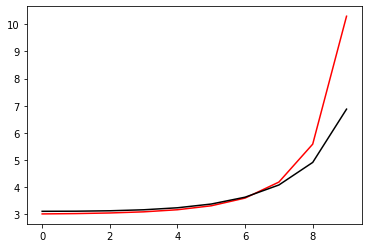

341000 0.02789332863674815
[3.01945819 3.03132447 3.05826418 3.10348824 3.17564343 3.29139288
 3.47972484 3.80682411 4.42140556 6.54465731]


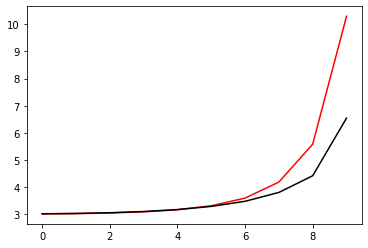

342100 0.03373057265376285
[2.98847861 2.99388782 3.01199282 3.05052845 3.12135385 3.24622792
 3.47025083 3.89577079 4.69155953 6.79102479]


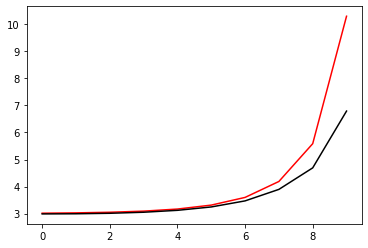

343200 0.022755705317183614
[2.98928608 2.99492669 3.0102451  3.04157197 3.10048305 3.20651091
 3.39417328 3.73594962 4.47206403 6.59479903]


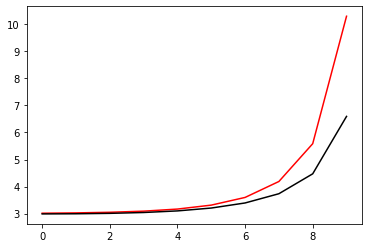

344300 0.023381319794147693
[2.98804891 2.99107964 3.00295578 3.03272027 3.09355556 3.20886084
 3.42500954 3.84379831 4.7139589  6.75593393]


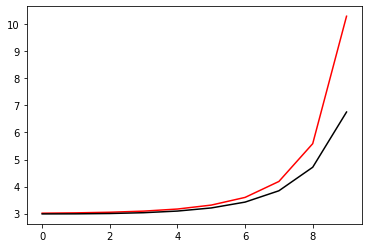

345400 0.03641305758205736
[2.99748537 3.01093661 3.04203041 3.09873659 3.1952153  3.35867618
 3.64256723 4.15441197 5.12276121 6.93240716]


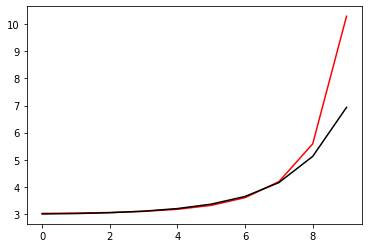

346500 0.04670005221305262
[2.97783181 2.99019111 3.01680334 3.06780317 3.16032967 3.32542545
 3.62163102 4.16563588 5.20926925 7.08405135]


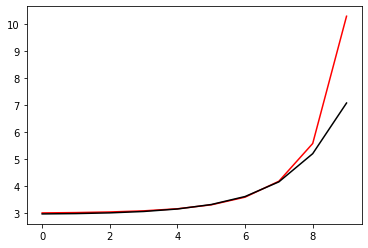

347600 0.014258049643462263
[3.00289655 3.01522301 3.04624396 3.10212818 3.19797819 3.36108549
 3.64552943 4.16859208 5.18915995 7.08365585]


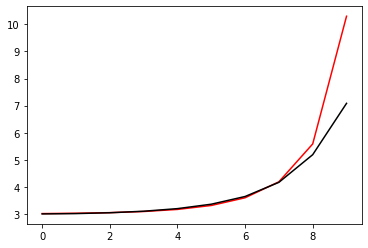

348700 0.022527243236554473
[2.97573938 2.98550197 3.00556777 3.0418706  3.1051374  3.21637094
 3.41603582 3.81056521 4.73589424 6.89597596]


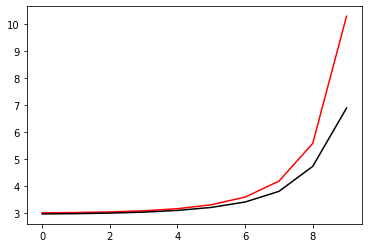

349800 0.013752894313160853
[3.0172593  3.0292563  3.05740236 3.10842038 3.19359697 3.33489962
 3.57867725 4.02945812 4.94693947 6.9037999 ]


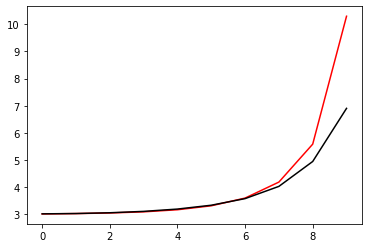

350900 0.043912426117470225
[3.03304943 3.04327791 3.07162303 3.11860026 3.20142097 3.34849952
 3.61382156 4.10957046 5.09848253 7.05551617]


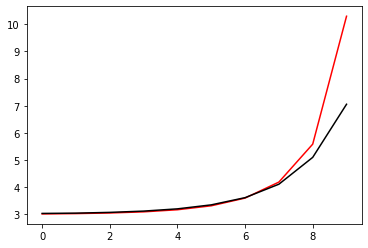

352000 0.02913006735665568
[3.06058413 3.06074845 3.06799918 3.08881134 3.13284119 3.21542931
 3.36913048 3.68980667 4.48684089 6.57168118]


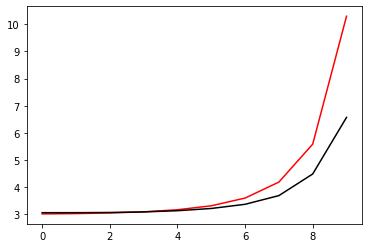

353100 0.0335415713480185
[2.99011236 2.9875021  2.99257679 3.01488311 3.06921175 3.18383439
 3.41674474 3.89300077 4.8477848  6.85169944]


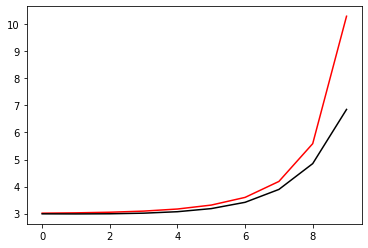

354200 0.019963871969560475
[2.93766076 2.94163439 2.95591975 2.98992309 3.06039922 3.19540917
 3.45337555 3.9630486  4.9972801  6.87888711]


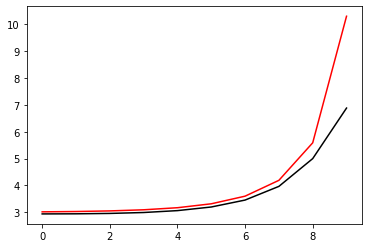

355300 0.04707262346355991
[2.87427284 2.87106427 2.88151503 2.91432475 2.98187379 3.10633854
 3.32939982 3.74432841 4.62705411 6.68876558]


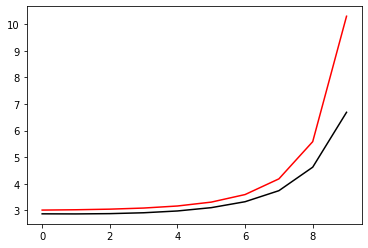

356400 0.0398249050175273
[2.93681765 2.94245169 2.95737442 2.99166592 3.06018038 3.18619955
 3.41313349 3.83688622 4.72554919 6.72988747]


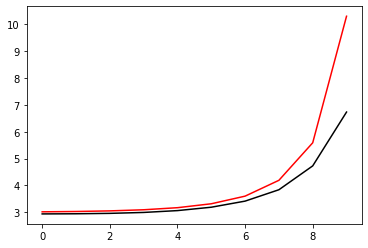

357500 0.046044369961597935
[2.97185069 2.97862022 2.99715021 3.03541267 3.10748976 3.23828988
 3.47474519 3.91748518 4.82725    6.82437583]


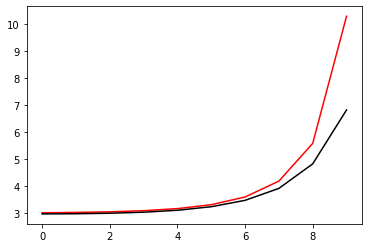

358600 0.013784574961253925
[3.08461303 3.08279858 3.09369893 3.12565399 3.19333198 3.32306289
 3.56527358 4.02685521 4.96525172 6.8707458 ]


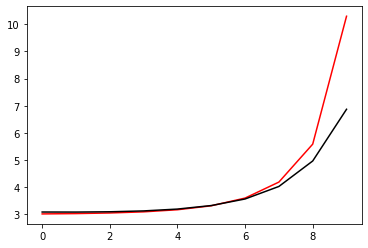

359700 0.023200646404149188
[3.11623291 3.10230406 3.08589594 3.08276916 3.11115786 3.19757966
 3.39127565 3.79865588 4.68051568 6.74208094]


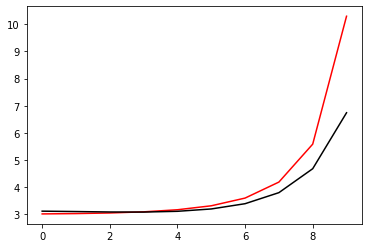

360800 0.013316975210881776
[3.0852665  3.08331869 3.08365493 3.09603517 3.13664924 3.2345859
 3.44555484 3.88593317 4.82548133 6.78371576]


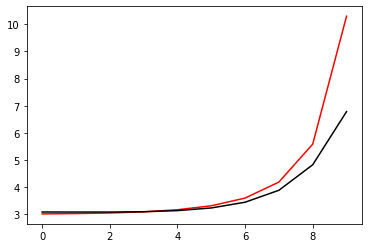

361900 0.043622937924428624
[3.03672063 3.04368859 3.06109877 3.09565827 3.16015338 3.28008005
 3.50908183 3.96667364 4.93342829 6.8872163 ]


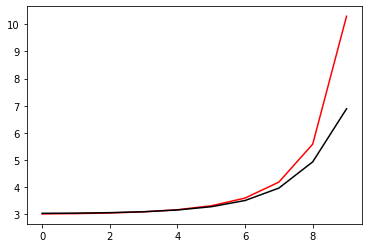

363000 0.3884167771937975
[2.67372606 2.68338959 2.70693016 2.75187175 2.83032926 2.96667836
 3.21162579 3.68520839 4.67992588 6.92460936]


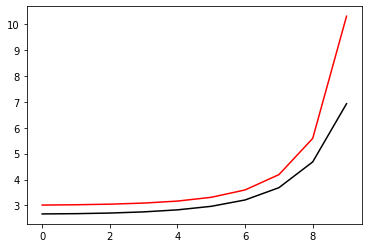

364100 0.037201565461575284
[3.01479163 3.02970871 3.06041777 3.10891516 3.18200559 3.28699103
 3.41749484 3.63059171 4.25013265 6.45798193]


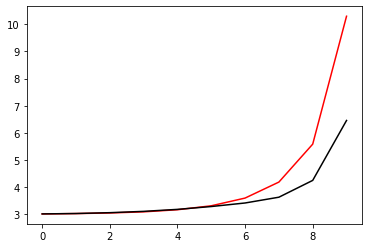

365200 0.022951896257534292
[3.00136582 3.00971109 3.03162182 3.07274272 3.13994158 3.24544333
 3.41990445 3.76212466 4.38823767 6.52757355]


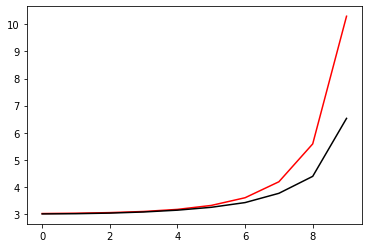

366300 0.023268997933076498
[2.97854561 2.98488411 3.0018485  3.03689415 3.10180755 3.2166547
 3.41978291 3.80053884 4.5711821  6.66862454]


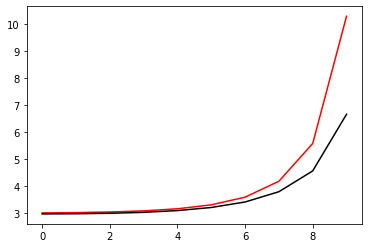

367400 0.039454551409003794
[2.93978319 2.95248207 2.97940774 3.02611271 3.1046772  3.23944831
 3.47337081 3.86812962 4.51720603 6.55919809]


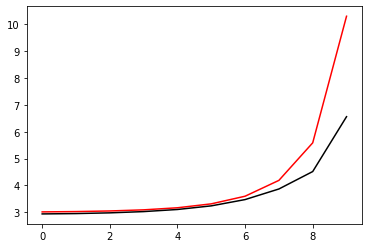

368500 0.046543524251159304
[2.95873933 2.9746226  3.0062185  3.05934527 3.14470274 3.28205114
 3.50750433 3.88852258 4.58123408 6.64948314]


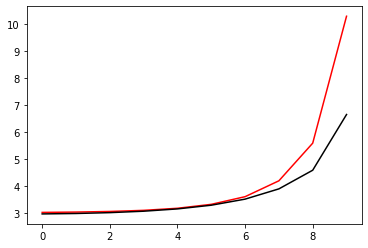

369600 0.013697111470687369
[3.02100644 3.03005367 3.05378635 3.10120999 3.18597819 3.3319021
 3.58344692 4.02836177 4.85957604 6.78329637]


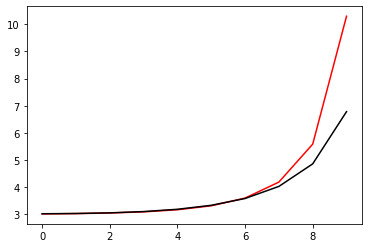

370700 0.023826492930643303
[3.02146268 3.03228134 3.05712587 3.10397322 3.18782749 3.33535435
 3.59676978 4.07525428 5.00113725 7.04763235]


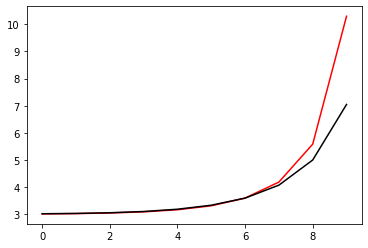

371800 0.013808187980591205
[3.0218003  3.03302405 3.05967788 3.10889799 3.1929412  3.3352771
 3.58517757 4.0527622  5.00024939 6.94568545]


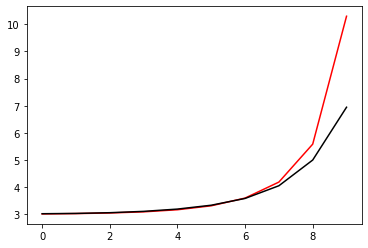

372900 0.04229301256643724
[3.08981298 3.0948361  3.10769788 3.13384722 3.18276243 3.2709019
 3.43107691 3.74613913 4.48807388 6.60115916]


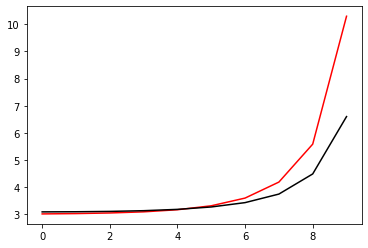

374000 0.031802712499773234
[2.95192579 2.95631929 2.9692418  2.99748815 3.053719   3.16137194
 3.36768443 3.77896143 4.66387095 6.90115486]


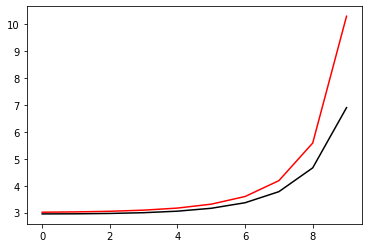

375100 0.03358750641003013
[2.99400671 3.00044363 3.01723087 3.04932028 3.10720563 3.21072758
 3.39951519 3.76198973 4.53980469 6.64025656]


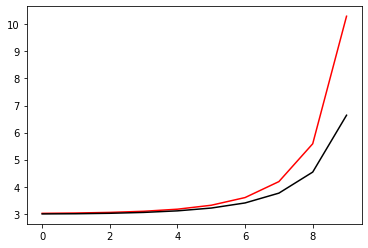

376200 0.02246634787696799
[2.97261459 2.97567828 2.98869521 3.02105099 3.08616475 3.20835247
 3.43613551 3.87424852 4.76808034 6.77991893]


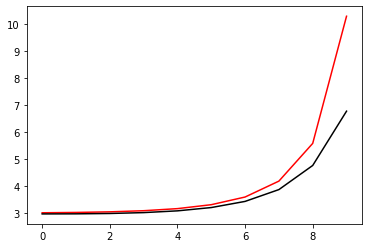

377300 0.023731223825658475
[2.95155452 2.95688712 2.97222125 3.00697291 3.07672669 3.20816366
 3.45389527 3.92978922 4.90102205 6.92578942]


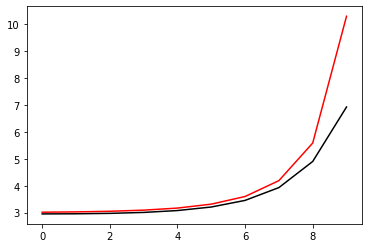

378400 0.08956948921262209
[2.83410585 2.8240853  2.82731865 2.85080029 2.91036969 3.02898452
 3.23886229 3.58304137 4.41046187 6.78546681]


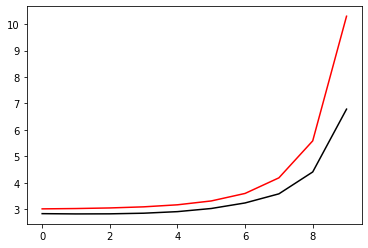

379500 0.05327710058362316
[2.94803343 2.94454636 2.94454251 2.96098001 3.01018507 3.11463443
 3.30846528 3.65446313 4.45772936 6.5990101 ]


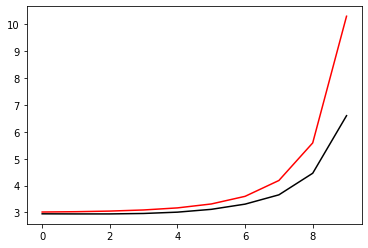

380600 0.013705161974968311
[3.0229684  3.02478278 3.03577478 3.06273115 3.11947876 3.22983106
 3.43470443 3.81776547 4.65108429 6.62884296]


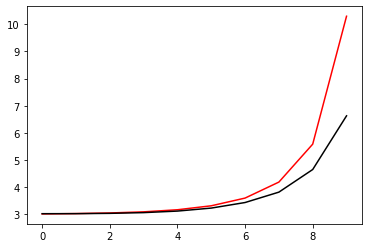

381700 0.023358179514976832
[3.01730604 3.02506154 3.04077737 3.07458456 3.13948331 3.25932969
 3.48025266 3.9011984  4.7791537  6.88270692]


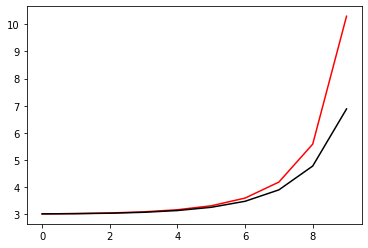

382800 0.013494162130668348
[3.05544061 3.06270046 3.08125758 3.11884701 3.18840631 3.31351759
 3.54173377 3.97797493 4.87960379 6.83657242]


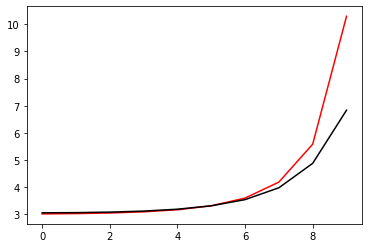

383900 0.07490630064099296
[3.14677025 3.1499156  3.16661732 3.20474305 3.27645312 3.40498683
 3.63752281 4.0821375  5.0008618  6.9100973 ]


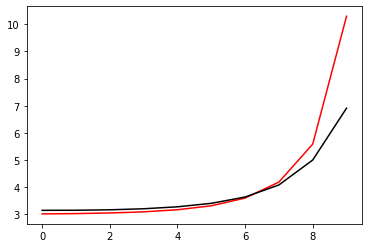

385000 0.026090311735030753
[3.00632928 3.01383639 3.03455522 3.07385464 3.14101942 3.25392599
 3.45155937 3.82789025 4.59546463 6.64011718]


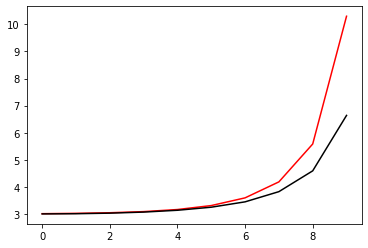

386100 0.03869175299006901
[2.86692315 2.88206281 2.91143923 2.95804358 3.03186429 3.15296739
 3.36155393 3.73902436 4.47052676 6.58926861]


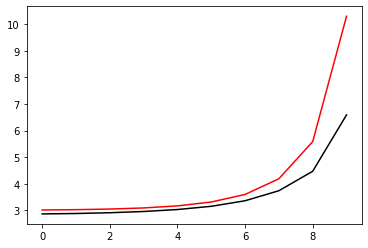

387200 0.023197158887957703
[3.02032422 3.02368566 3.03813401 3.07193602 3.13693783 3.25482763
 3.46880528 3.87108974 4.67347119 6.73900397]


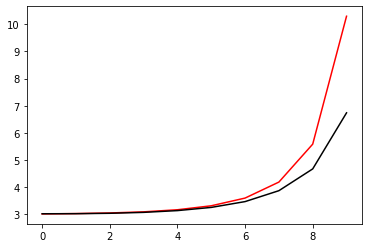

388300 0.023527212455934574
[2.97910666 2.98253003 2.99441434 3.02424419 3.08672192 3.20747841
 3.43687136 3.88504686 4.81415573 6.85044007]


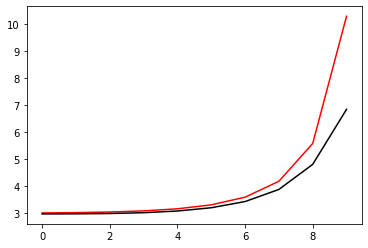

389400 0.03845830381186029
[2.96798415 2.98258112 3.01464092 3.06775076 3.15171872 3.28789259
 3.51890253 3.93417651 4.75400019 6.72855858]


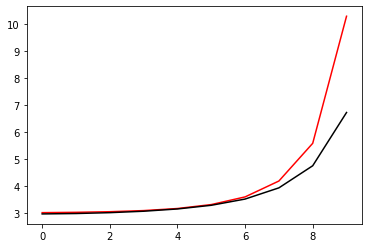

390500 0.04567805810411322
[2.96890453 2.97841864 3.00219275 3.04925959 3.13454361 3.28487609
 3.55249892 4.04286858 4.97827776 6.93766921]


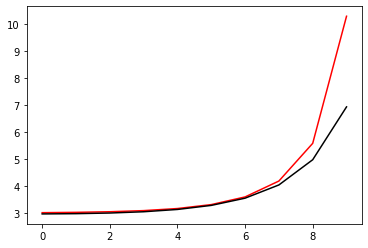

391600 0.014095642738847619
[3.00910472 3.02123751 3.04937098 3.09992813 3.18899253 3.34531322
 3.62298982 4.1329496  5.12119479 7.03180287]


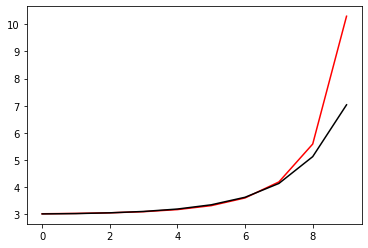

392700 0.023943908233751934
[3.02056495 3.03229527 3.05910926 3.11113905 3.19908666 3.34812125
 3.60958461 4.09946046 5.08174047 6.99001449]


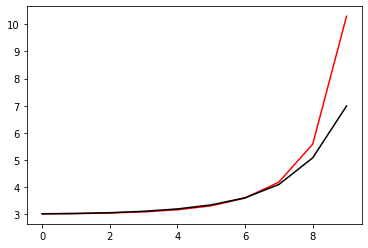

393800 0.013080825123599347
[3.06099712 3.03661583 3.01806958 3.01812572 3.05448602 3.14945348
 3.32906223 3.56662112 4.31310196 6.50413086]


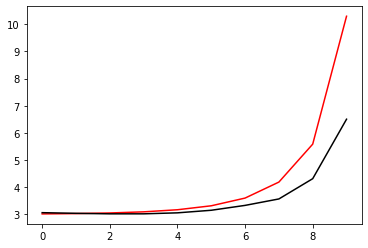

394900 0.043245263738071714
[3.0889547  3.0814586  3.07369299 3.07923241 3.11618329 3.20837078
 3.38577891 3.68791136 4.45026625 6.58317423]


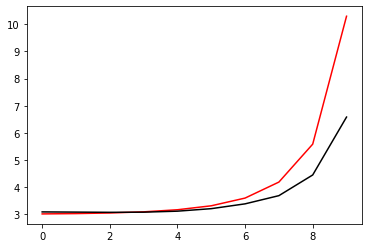

396000 0.027919657515799126
[3.05530121 3.05311727 3.05454588 3.06902949 3.1121807  3.20922447
 3.40285635 3.77713451 4.60177773 6.59904694]


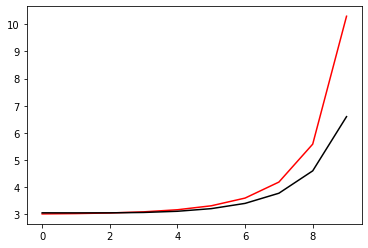

397100 0.032955214709458794
[2.96706317 2.97142496 2.98225805 3.0048058  3.04980996 3.13767948
 3.30920474 3.65733954 4.44003862 6.57574654]


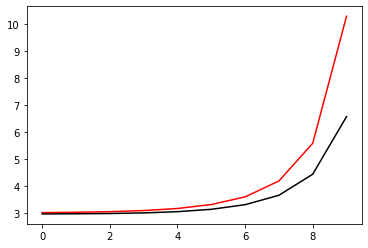

398200 0.022661908650688206
[2.98054398 2.98258952 2.9950963  3.0267582  3.08977942 3.20736938
 3.42618897 3.8467862  4.71612786 6.75204834]


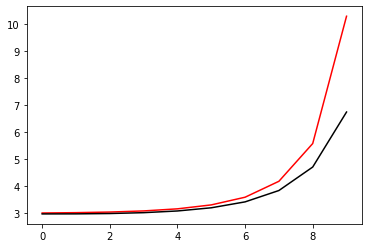

399300 0.02297770862341398
[3.019628   3.02909088 3.04877232 3.08173404 3.13548702 3.22461667
 3.37940949 3.67956502 4.39291143 6.54617136]


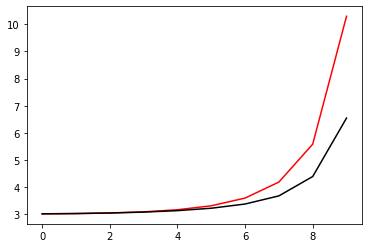

400400 0.03939471105928167
[3.00268046 3.00586558 3.01791186 3.04736753 3.10711747 3.22042856
 3.43470287 3.85222228 4.71024788 6.69306621]


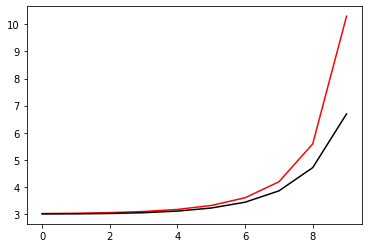

401500 0.046565312821163614
[2.98822833 2.99620477 3.01510916 3.05451955 3.13140193 3.27639909
 3.54697536 4.05258204 5.02144364 6.95450692]


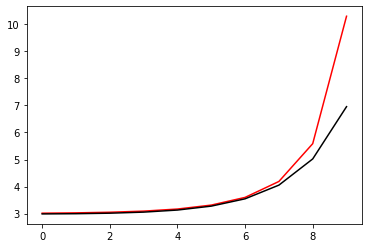

402600 0.013233169382069239
[3.06999531 3.0576888  3.05124225 3.0641708  3.10984491 3.21016376
 3.40786898 3.79551704 4.61775155 6.66838205]


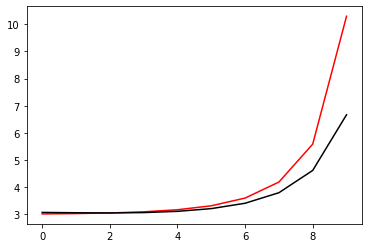

403700 0.023243300792766645
[3.06901674 3.06440343 3.06420406 3.07934374 3.1260875  3.23077838
 3.44114073 3.85744733 4.72875725 6.77489924]


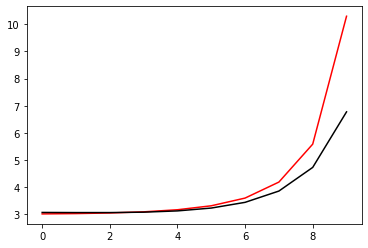

404800 0.013397335732888135
[3.07055562 3.07298377 3.08133463 3.10525328 3.15996788 3.2725644
 3.4953604  3.93821441 4.85881567 6.77551129]


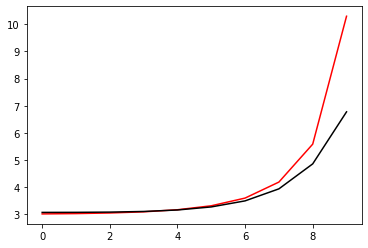

405900 0.043659576170546735
[3.03398367 3.04172655 3.06108262 3.0990567  3.16859446 3.2949887
 3.5304458  3.98991628 4.94361064 6.88296267]


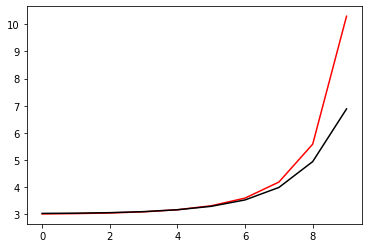

407000 0.12275587337182566
[2.79569458 2.79371083 2.80589152 2.84022508 2.90894657 3.03564637
 3.26870404 3.71957433 4.66064052 6.97672707]


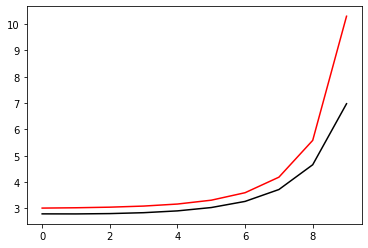

408100 0.033614837988663035
[2.99527831 2.99767453 3.00836122 3.03571841 3.09399992 3.20822758
 3.42643276 3.8534057  4.75073089 6.77757018]


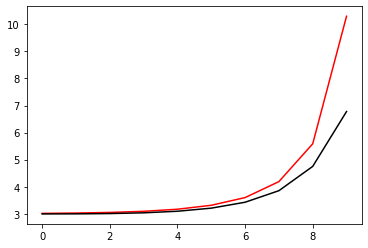

409200 0.022519067030293893
[2.97039077 2.97538537 2.99054856 3.02480663 3.09212061 3.21831607
 3.45507678 3.91385414 4.85692678 6.82490599]


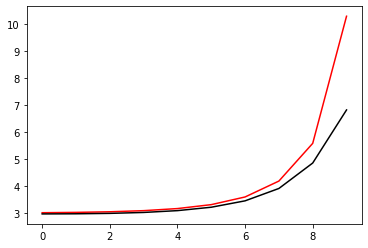

410300 0.02380272813754715
[2.92627727 2.93371352 2.95287647 2.99208114 3.06538698 3.19945686
 3.4463315  3.92139044 4.89353347 6.94348901]


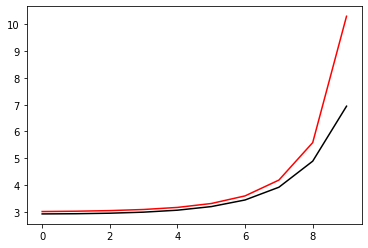

411400 0.036601764021746516
[2.94611853 2.95623526 2.97785052 3.02479048 3.11930167 3.28986898
 3.59663147 4.14697126 5.18800514 6.94479915]


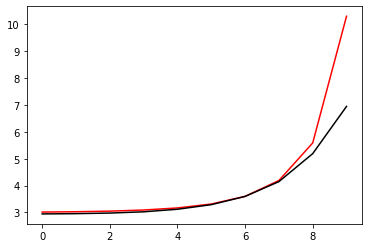

412500 0.052817809915788196
[2.96768265 2.95721222 2.95514508 2.97255407 3.02313894 3.12834355
 3.3311023  3.73178697 4.6205099  6.68566782]


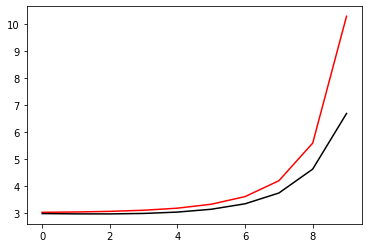

413600 0.013347885375557443
[3.06066812 3.05791876 3.06264934 3.08398901 3.13697419 3.24613163
 3.45717308 3.8726559  4.77248816 6.77059288]


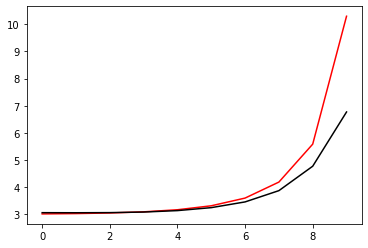

414700 0.02341385350165387
[3.05194864 3.05154335 3.05867646 3.0832272  3.13998768 3.2554077
 3.4799627  3.92191763 4.85210831 6.9142476 ]


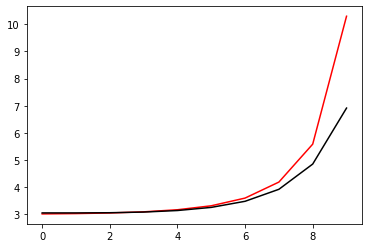

415800 0.013922079993523361
[2.93892451 2.95512944 2.98180665 3.02589706 3.1013823  3.23411716
 3.47611273 3.94030969 4.89538506 6.7487308 ]


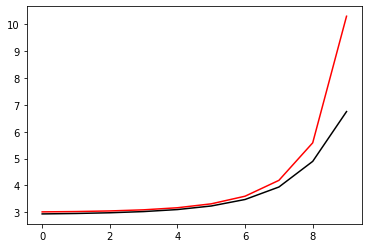

416900 0.22552147859976737
[3.20142714 3.20890144 3.23078193 3.27642792 3.36094589 3.51017599
 3.77430582 4.26258952 5.2319559  7.02535147]


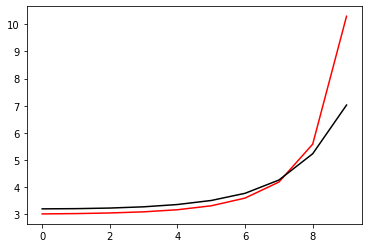

418000 0.03202381832945377
[2.95323132 2.94974943 2.95377402 2.9795044  3.04188289 3.16499736
 3.39603549 3.83957329 4.75018958 6.77017779]


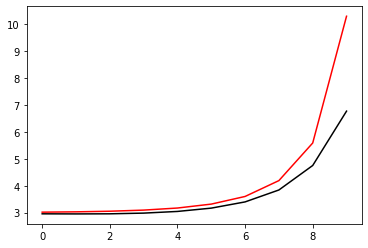

419100 0.03377747413343761
[2.99400794 2.99767241 3.00939592 3.03956471 3.10464383 3.23096784
 3.46750855 3.91990137 4.84420646 6.82157475]


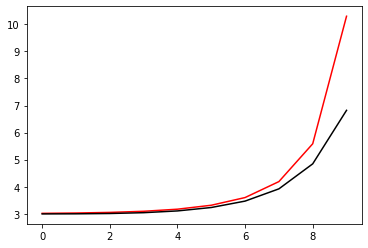

420200 0.023197382841964615
[2.99551733 2.99937685 3.01210877 3.04344229 3.10929832 3.23724472
 3.47952891 3.94609294 4.89634291 6.84379275]


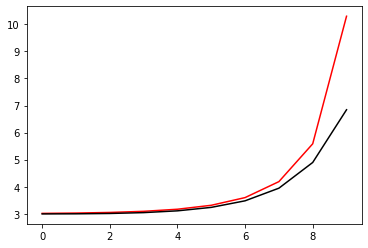

421300 0.02370933439754931
[2.97757327 2.98321881 2.99864199 3.03237564 3.0999463  3.2294627
 3.47541828 3.95338046 4.92898825 6.93285314]


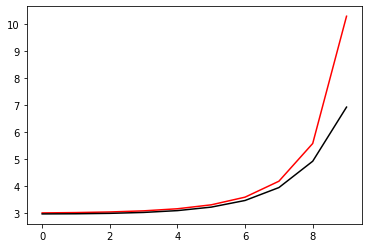

422400 0.045089268526760894
[2.9454824  2.94151435 2.94864687 2.97171697 3.02049426 3.11424206
 3.29095303 3.64378492 4.46861458 6.57598002]


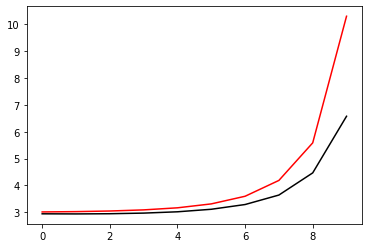

423500 0.05135860289268677
[2.95197795 2.95982246 2.97731547 3.01089041 3.07209558 3.18155978
 3.38062117 3.76634556 4.62044477 6.70528049]


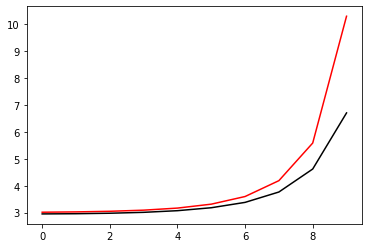

424600 0.013450335621884116
[3.04603698 3.0487444  3.0637573  3.09830732 3.16466102 3.2854655
 3.50598914 3.92782954 4.81903638 6.7751538 ]


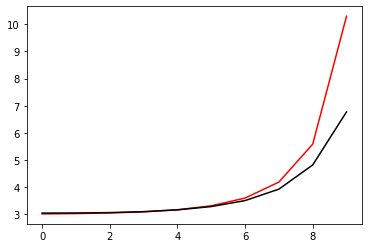

425700 0.023590969131011486
[3.04589206 3.05239985 3.07053545 3.108544   3.17999562 3.31032779
 3.54929882 4.00453026 4.93662569 6.8946489 ]


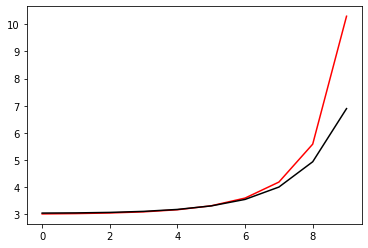

426800 0.013708160788519101
[3.0506019  3.06020848 3.08385033 3.12871788 3.20744165 3.34382368
 3.58804393 4.05108177 4.9959873  6.93722669]


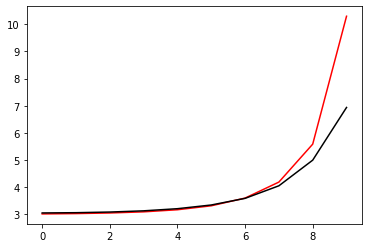

427900 0.04337563144233246
[3.02622704 3.05434982 3.0943142  3.14828757 3.22823884 3.35056239
 3.52036952 3.67824955 4.29639198 6.48830449]


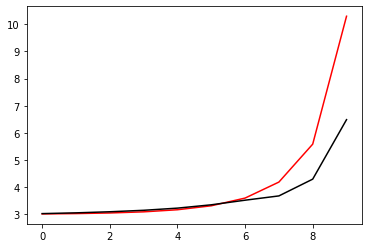

429000 0.027249699070939118
[3.00061791 3.01677709 3.05079989 3.1039799  3.18290586 3.29989933
 3.47391748 3.77213527 4.38620788 6.53026542]


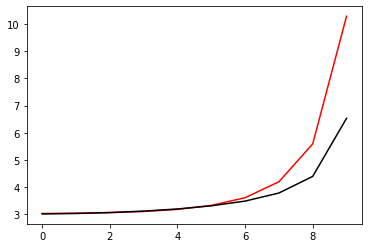

430100 0.03383057386192882
[2.98518795 2.99395726 3.01782436 3.06339989 3.13979316 3.26463302
 3.47797753 3.87861054 4.57251345 6.66868053]


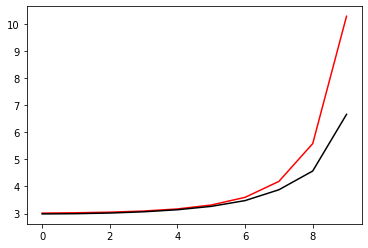

431200 0.022740045588332584
[2.97159195 2.97846924 2.99733238 3.03690739 3.1106999  3.2418773
 3.47525523 3.91394516 4.76161134 6.75663011]


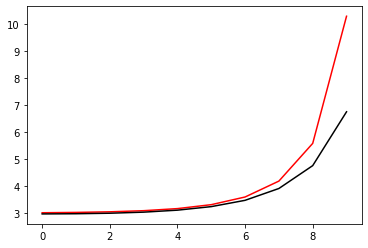

432300 0.024123901983083194
[2.95701613 2.9721683  3.0072458  3.06898563 3.16929521 3.33294793
 3.60847269 4.09442981 4.9931158  6.93343494]


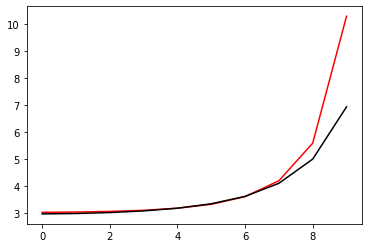

433400 0.03661171614042034
[2.93000434 2.94060925 2.96654535 3.01708257 3.10881876 3.27253604
 3.56789299 4.10735109 5.13082799 6.90251036]


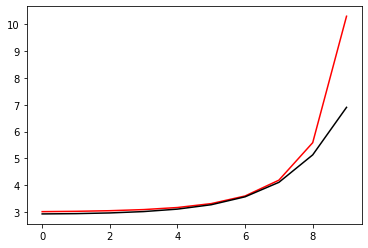

434500 0.04657307825678862
[2.98974571 2.99594014 3.01252571 3.04822211 3.11697784 3.24230261
 3.4699115  3.89969653 4.79058282 6.752318  ]


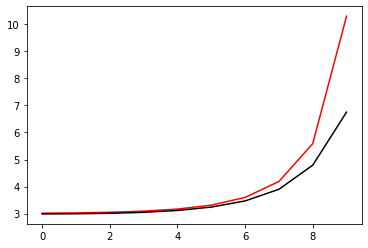

435600 0.013483424389837535
[3.03298894 3.04735768 3.0750834  3.12126566 3.19711823 3.32332938
 3.54065992 3.93931774 4.76211274 6.77691894]


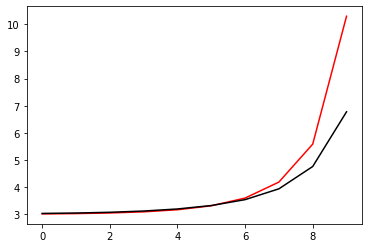

436700 0.023729951232157105
[3.06586    3.07608147 3.10010532 3.14517753 3.22519025 3.36485141
 3.61124397 4.0643331  4.96345209 6.95542007]


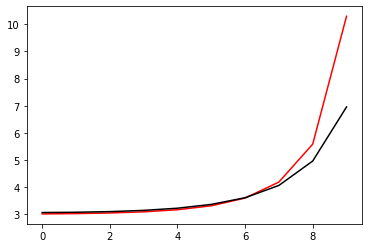

437800 0.013494596820582315
[3.02514817 3.03369706 3.05444757 3.09376051 3.16395907 3.28870962
 3.51461427 3.94398623 4.83060182 6.82478712]


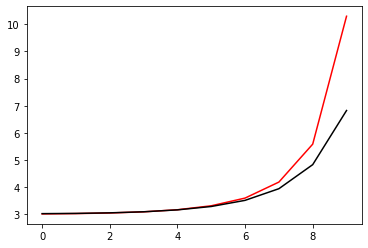

438900 0.043633161347030686
[3.02789111 3.03732421 3.05998393 3.10248858 3.17681189 3.30568046
 3.53665014 3.97687788 4.88693183 6.85212646]


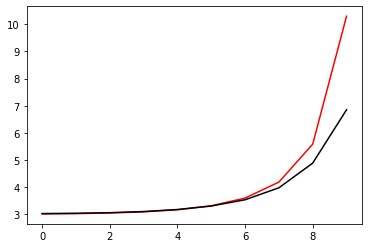

440000 0.4101112215289261
[2.67019785 2.67889886 2.70064286 2.74310323 2.81808521 2.94990834
 3.18925789 3.65334709 4.62378212 6.91116107]


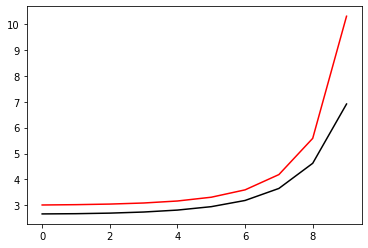

441100 0.03498812089785409
[2.99965419 3.01353838 3.04280579 3.08945526 3.16010831 3.2634831
 3.40326687 3.63855021 4.23414821 6.44590993]


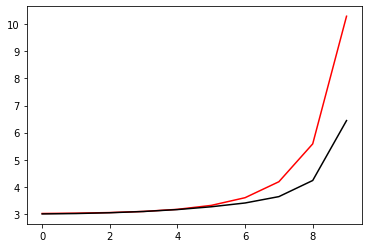

442200 0.02293754650237467
[2.99610846 3.00364394 3.02425658 3.0642346  3.13179883 3.2418592
 3.42750399 3.78377149 4.39853113 6.55142913]


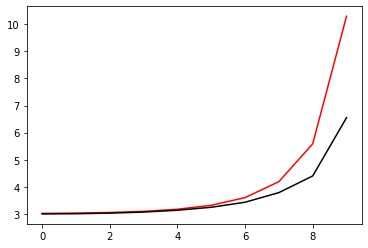

443300 0.023298889220127236
[2.9771751  2.98343892 3.00035565 3.03572198 3.10188316 3.21947118
 3.42709704 3.81663191 4.58529848 6.67898337]


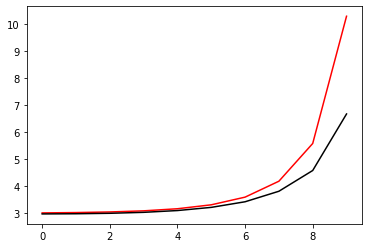

444400 0.04358443980334057
[2.96375424 2.9548279  2.95845508 2.98367054 3.0442372  3.16520274
 3.38039905 3.70831619 4.29755617 6.47056215]


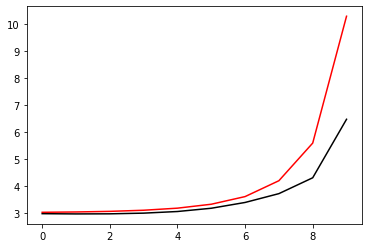

445500 0.04741337529164415
[2.98923242 2.99238559 3.00448937 3.03600253 3.10281358 3.22905838
 3.45083297 3.81717889 4.48220731 6.5966193 ]


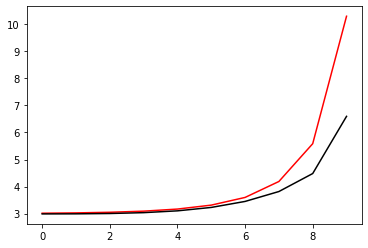

446600 0.013383832042284006
[3.04176878 3.042388   3.0535857  3.08475521 3.15133068 3.27860364
 3.50910385 3.91862071 4.68587504 6.64260547]


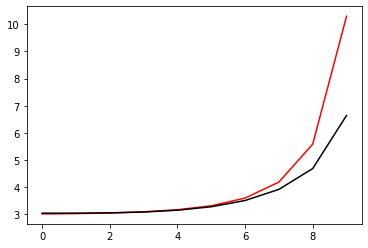

447700 0.09764677828004478
[2.74475095 2.754262   2.77629705 2.81913945 2.89731773 3.03685696
 3.28626171 3.74239102 4.62320886 6.92586818]


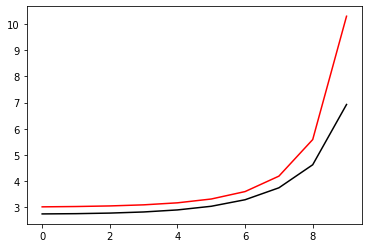

448800 0.013394606924418217
[3.01593014 3.02778802 3.05508084 3.1029314  3.18096672 3.30845679
 3.52337855 3.90520506 4.65651452 6.71018064]


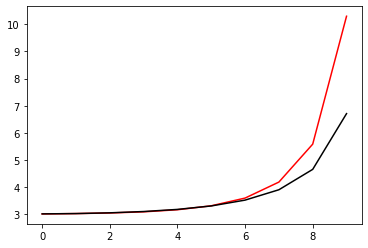

449900 0.04129557855583012
[3.07214918 3.08027589 3.10115704 3.14267751 3.21799728 3.3500139
 3.58196542 4.0054011  4.84428779 6.85759944]


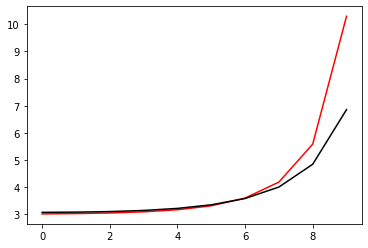

451000 0.02493294053643482
[2.97969271 2.98460377 3.00558919 3.05054305 3.13384415 3.28256613
 3.55184218 4.05800024 5.04599987 6.90643438]


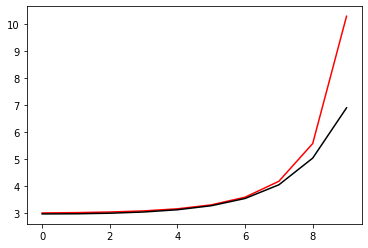

452100 0.03520670992493966
[3.00403755 3.01943756 3.04657264 3.09119769 3.16167526 3.27289948
 3.45133197 3.75970794 4.50732341 6.70188602]


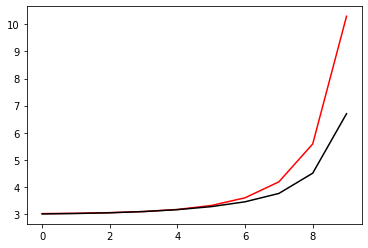

453200 0.022469477418916382
[2.97497776 2.97844715 2.99240027 3.02461236 3.08591583 3.19582019
 3.39530806 3.78094327 4.59333586 6.67131589]


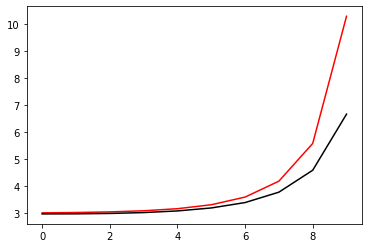

454300 0.023348583815323568
[2.95545638 2.96111865 2.97677708 3.00975686 3.07189609 3.18474526
 3.39196693 3.79223167 4.63668614 6.71942144]


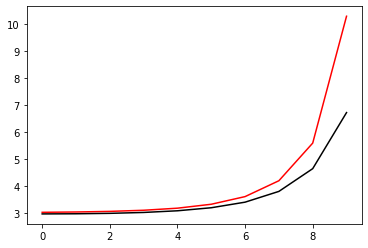

455400 0.03744684742735628
[2.94832347 2.95777937 2.98089555 3.02631757 3.10916092 3.2562544
 3.51786996 3.99664543 4.9333326  6.7817619 ]


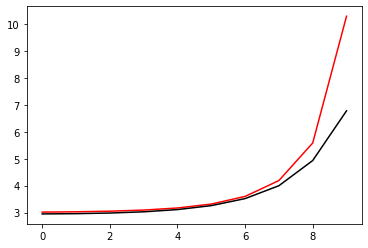

456500 0.06417323415713319
[3.17161394 3.13856614 3.11305603 3.10434878 3.12285908 3.18476862
 3.31394797 3.57367046 4.28341233 6.51237554]


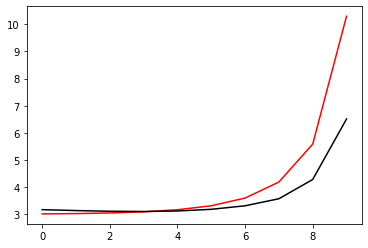

457600 0.0132567314141899
[3.1052314  3.09639606 3.08686818 3.08829874 3.11670298 3.19522645
 3.36459948 3.71386734 4.49942947 6.57815099]


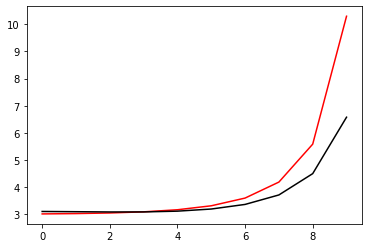

458700 0.023204045917104163
[3.07558288 3.07289292 3.07278253 3.08500613 3.12513075 3.22058297
 3.42336886 3.84063875 4.71859728 6.8366362 ]


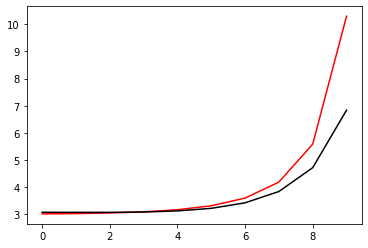

459800 0.013511630566158313
[3.079002   3.08470019 3.09977531 3.13193969 3.19529897 3.3163527
 3.54725957 3.99968938 4.93315352 6.87618872]


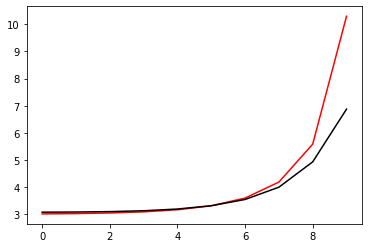

460900 0.043182414539899135
[3.10287339 3.09238446 3.07974083 3.07914397 3.10721785 3.18831253
 3.36870612 3.74995355 4.5890885  6.66942089]


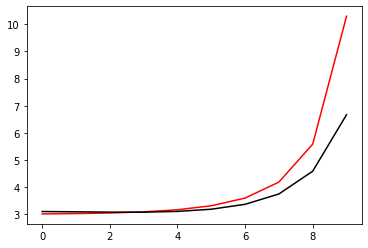

462000 0.026985916704240817
[3.04995248 3.04705975 3.04666838 3.05793278 3.09693386 3.19188167
 3.39620791 3.8217744  4.73425778 6.73091764]


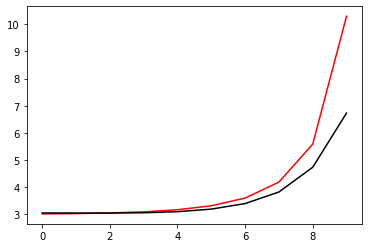

463100 0.033033067674381175
[2.95529547 2.95924848 2.96930798 2.99256078 3.04228642 3.1433372
 3.34719476 3.76947111 4.68920032 6.65500078]


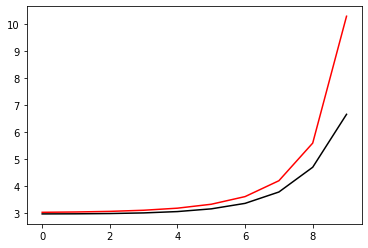

464200 0.0217395348248148
[2.95118638 2.95811507 2.97704599 3.01700733 3.09201202 3.22648049
 3.47043507 3.93530293 4.89024289 6.83406991]


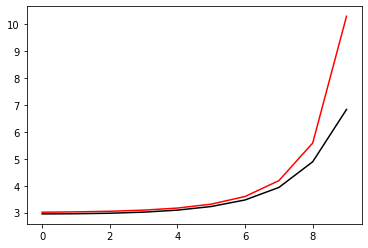

465300 0.11476141666140462
[3.2168009  3.21671888 3.23024613 3.26395297 3.33216593 3.45497659
 3.66141255 4.01376187 4.84427975 7.01601048]


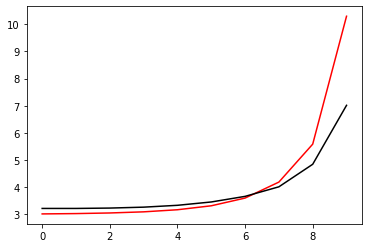

466400 0.04112740932428416
[3.00827201 3.00650857 3.00739722 3.02243998 3.06728574 3.16301335
 3.34419882 3.68947813 4.49750026 6.58411032]


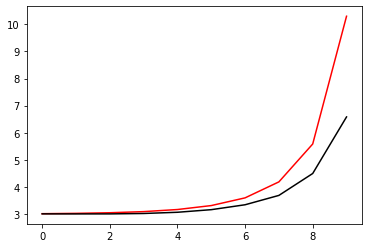

467500 0.047474796400005834
[2.98768302 2.98807266 2.99524441 3.01788345 3.07114773 3.18084602
 3.39406033 3.81008611 4.69916556 6.74774849]


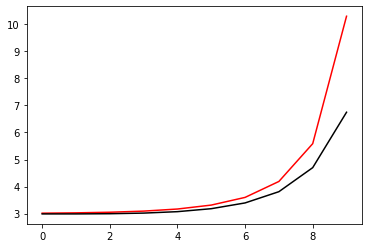

468600 0.013570756237627157
[3.04404534 3.04862255 3.06405005 3.09728493 3.16255408 3.28654673
 3.52114136 3.97620589 4.91302793 6.87221799]


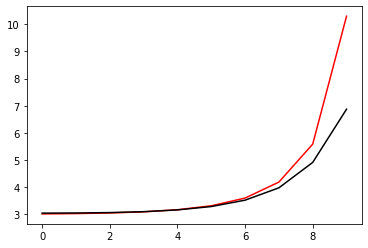

469700 0.02373489604605001
[3.04379898 3.0536597  3.07770084 3.12355204 3.20301756 3.34094388
 3.58793773 4.05491782 5.00435171 6.93030235]


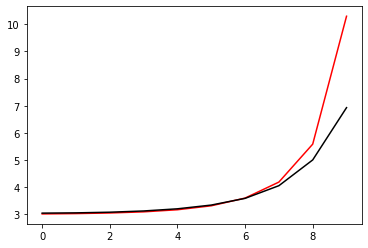

470800 0.021064428219283997
[2.96940173 2.95138608 2.94030815 2.94909027 2.98994004 3.08184528
 3.25412676 3.56696781 4.34310386 6.51603045]


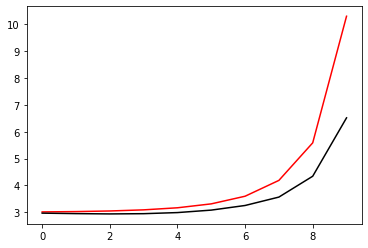

471900 0.052483334141131203
[2.94836982 2.94835559 2.95154004 2.96861445 3.01482261 3.11170483
 3.29443001 3.63893069 4.43679543 6.56408392]


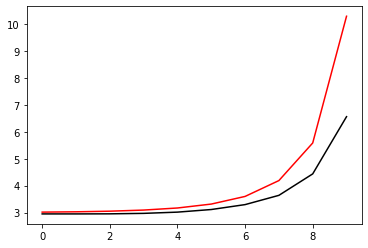

473000 0.02600499404499744
[3.01124909 3.01889994 3.03595056 3.06821882 3.12837902 3.23912603
 3.44260288 3.82936774 4.66634215 6.69670719]


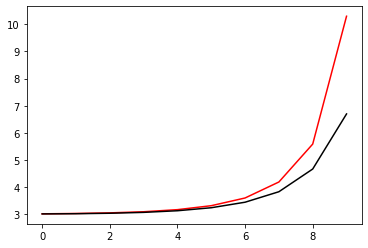

474100 0.03349311858585171
[2.99899091 3.0012998  3.01671358 3.0458212  3.09664572 3.18566809
 3.34781049 3.67462802 4.45316928 6.7285999 ]


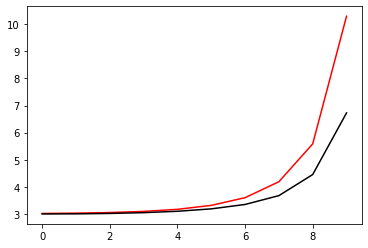

475200 0.02311856903376041
[3.02437138 3.02755381 3.04068969 3.07115072 3.12980717 3.23672371
 3.43320564 3.81551604 4.649155   6.71671703]


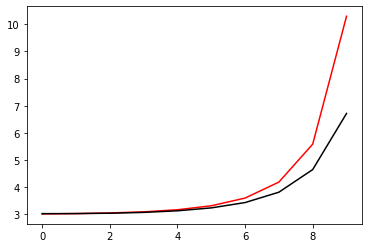

476300 0.023459217357058797
[2.97940377 2.98236779 2.99325671 3.02148188 3.08138997 3.19804078
 3.42075008 3.85728111 4.76927809 6.80997543]


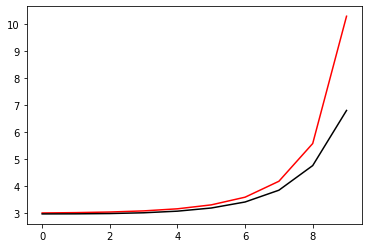

477400 0.03780196053996237
[2.95151511 2.96255755 2.98524014 3.0284295  3.10604871 3.24301064
 3.48856344 3.949572   4.88805686 6.73841222]


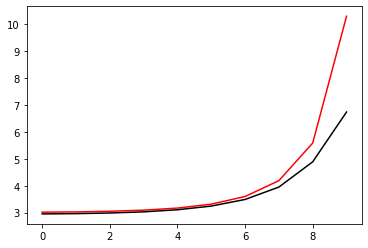

478500 0.05518020306667515
[3.02181685 3.04083834 3.07496629 3.13228243 3.22768657 3.38758182
 3.6615021  4.15358969 5.11412575 6.99756814]


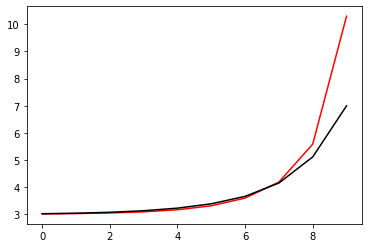

479600 0.014041858468934802
[3.06506812 3.08537042 3.12057632 3.17388297 3.25497205 3.37808299
 3.53756843 3.64268195 4.21180908 6.43642064]


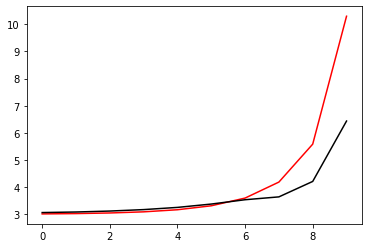

480700 0.023142634709161468
[3.05316362 3.07021009 3.10462242 3.15912384 3.24044818 3.35868048
 3.52787999 3.79973835 4.29873237 6.50502789]


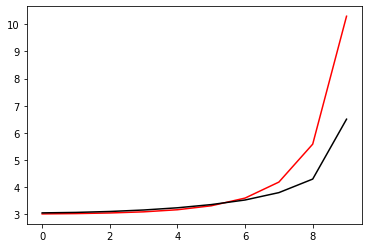

481800 0.013183689007605132
[3.01995231 3.03037113 3.05624179 3.10289218 3.17732209 3.29326395
 3.48255369 3.81338973 4.43283713 6.50691492]


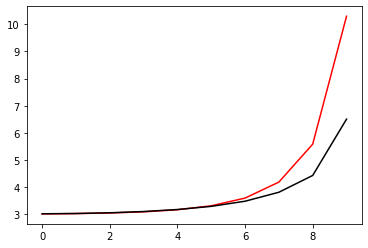

482900 0.09479025607629729
[3.18346913 3.18164249 3.1940405  3.2315303  3.31135297 3.46436202
 3.74455689 4.17987356 4.7781395  6.7776362 ]


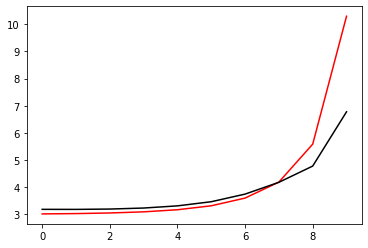

484000 0.025894383881236823
[3.01661857 3.01892794 3.03071748 3.06043996 3.12373371 3.24708324
 3.47721651 3.90033612 4.68843187 6.70406375]


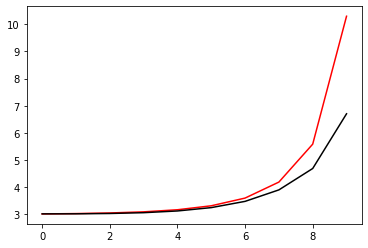

485100 0.03372438009335361
[2.97202005 2.98547065 3.01311231 3.05948079 3.13649286 3.2670661
 3.49552258 3.91468999 4.74587724 6.78099437]


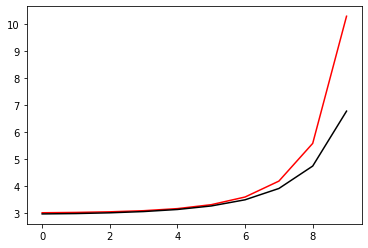

486200 0.02263522938352077
[2.95736816 2.96759859 2.9938857  3.0436226  3.12896212 3.27322914
 3.523235   3.98018288 4.88578238 6.85093306]


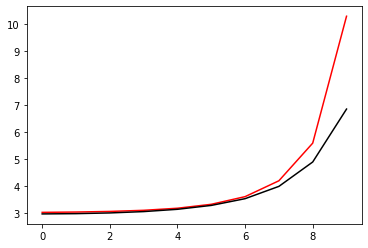

487300 0.023313816374891463
[3.01642259 3.04127087 3.08443288 3.14623052 3.23565493 3.36633319
 3.54487948 3.76826262 4.3665847  6.53579842]


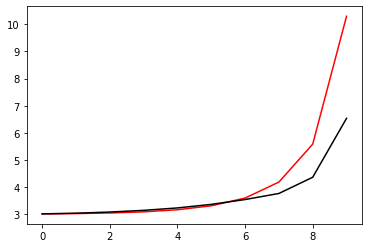

488400 0.03953622197610429
[2.97423666 2.98920766 3.02335182 3.08055661 3.16706867 3.29534481
 3.49569656 3.85881737 4.5133543  6.59518325]


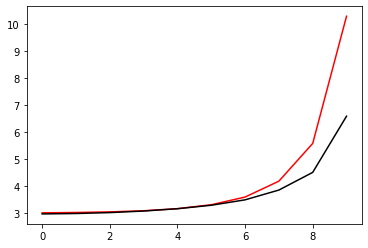

489500 0.04590316851793764
[2.95997427 2.96976799 2.99505762 3.0434581  3.12711561 3.26884064
 3.52127658 3.99822714 4.76398749 6.8276544 ]


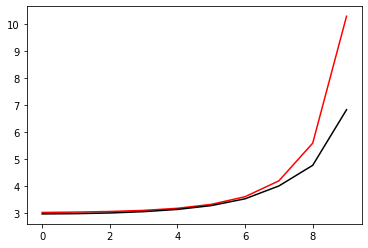

490600 0.014032576228730987
[3.01021487 3.01951536 3.04396366 3.09196979 3.1802024  3.34074905
 3.63204587 4.14451336 5.02183639 6.92712547]


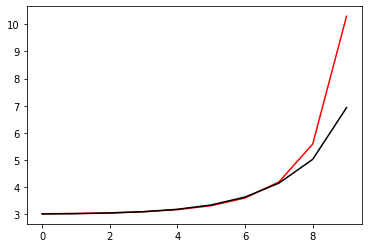

491700 0.023967532281378878
[3.01029285 3.02126065 3.0483919  3.10085383 3.19289371 3.34923856
 3.61661502 4.10696553 5.06148487 6.97189256]


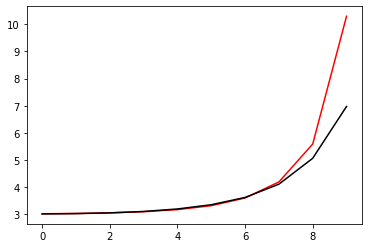

492800 0.013538055195943144
[2.97317731 2.98754856 3.0178499  3.06702948 3.14772297 3.28243265
 3.508072   3.89483459 4.70139855 6.75096442]


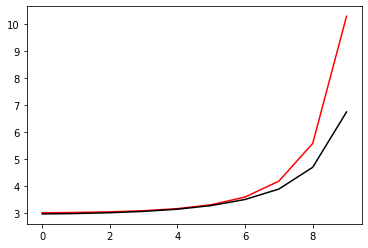

493900 0.04417287050149718
[2.97308472 2.98960066 3.02212673 3.07729667 3.16751364 3.3152066
 3.56461916 4.01039778 4.88360182 6.80228481]


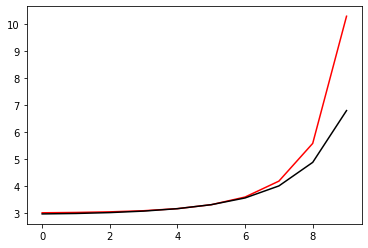

495000 0.025142614878083905
[2.97015938 2.97467878 2.995703   3.04143657 3.12573862 3.27473861
 3.54013635 4.02832243 4.98084542 6.86017724]


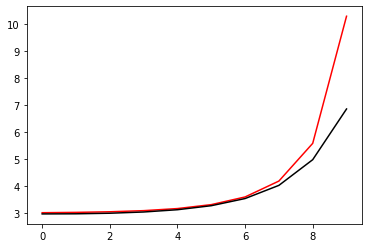

496100 0.03629069570134135
[2.9771956  3.00996027 3.05880257 3.125833   3.22067471 3.35643619
 3.51746963 3.53373503 4.33914386 6.50166119]


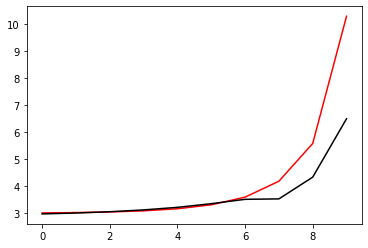

497200 0.023168915439659113
[2.98330387 2.9990424  3.03529649 3.09530783 3.18416373 3.30971743
 3.48722555 3.79980694 4.46974552 6.60425696]


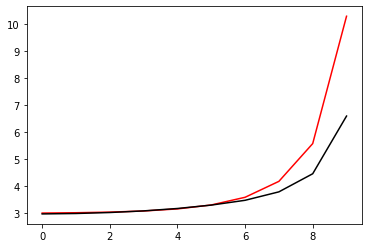

498300 0.023414865297401454
[2.97547173 2.98525056 3.01005385 3.05707283 3.13596369 3.26336923
 3.47531605 3.85620949 4.63435998 6.74085277]


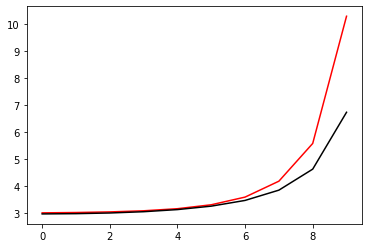

499400 0.03752301084652623
[2.95625284 2.96486525 2.98669191 3.03033023 3.11061015 3.25452282
 3.5198793  4.02472541 4.91597805 6.78670239]


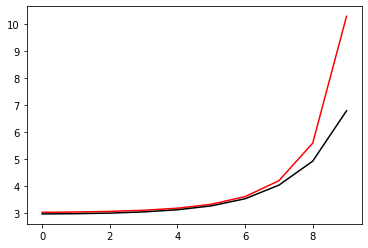

In [16]:
c_reg2=0.0001
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h])
    for i in range (100):
        optimizer.apply_gradients(zip(gradients, [h]))
    if j%11==0: 
        print(j*100, Error_func(h, Positive[j%10], Negative[j%10]).numpy()), print(h.numpy())
        plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

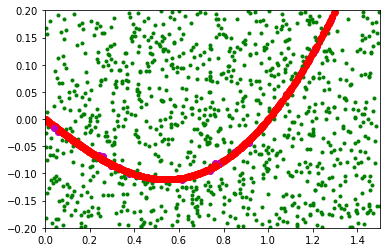

In [16]:
for i in range (set):
    [Positive0[i], Positive1[i]]=NN_func_01(h, Positive[i])
    [Negative0[i], Negative1[i]]=NN_func_01(h, Negative[i])
for i in range (set):
    x_data1[i]=[v[0] for v in Positive0[i]]
    y_data1[i]=[v[1] for v in Positive0[i]]
    x_data2[i]=[v[0] for v in Positive1[i]]
    y_data2[i]=[v[1] for v in Positive1[i]]
    x_data3[i]=[v[0] for v in Negative0[i]]
    y_data3[i]=[v[1] for v in Negative0[i]]
    x_data4[i]=[v[0] for v in Negative1[i]]
    y_data4[i]=[v[1] for v in Negative1[i]]
    plt.plot(x_data4[i], y_data4[i], 'g.')
    plt.plot(x_data2[i], y_data2[i], 'co')
    plt.plot(x_data1[i], y_data1[i], 'ro')
    plt.plot(x_data3[i], y_data3[i], 'mo')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.show()